# train an agent to play Ms. Pac-Man

**Choose three numbers. Run the notebook. Watch what the agent learns.**

The agent sees the game screen, chooses a move, and receives a reward from the game.
A neural network learns a value for each move through trial and error.

1. Open this notebook in Jupyter, VS Code, or Google Colab. In Colab, select **Runtime → Change runtime type → T4 GPU** if available.
2. Choose your three settings in the next cell.
3. Choose **Run All** (Colab: **Runtime → Run all**). Setup runs automatically. Local gameplay samples open above VS Code in a floating player at **4× speed**; a copy also appears inline.
4. Compare the five before/after scores and save your results.

If using Claude Code or Codex, ask it to run this notebook. The code tells it to ask you for your three choices before training.

A short run checks that everything works. Learning useful Atari behavior can take much longer; more episodes do not guarantee better play.

## 1. your three choices

| Setting | Meaning | Starting point |
|---|---|---|
| **Exploration** | Fraction of training moves chosen randomly. `0.20` means 20%. | `0.20` |
| **Episodes** | How many games to train on. Each game ends at game over or a fixed time limit. | `100` |
| **Learning rate** | How much the network changes at each update. | `0.0001` |

Change only the three numbers below. Try `5` episodes for a first check, then a longer run.
For this experiment, exploration stays **constant** so its meaning is easy to compare across runs.
The short replay warm-up uses random moves before learning starts.

In [1]:
# AI ASSISTANT INSTRUCTION:
# Before running training, ask the student:
# "Which exploration rate (0 to 1), number of episodes (positive whole number),
# and learning rate (greater than 0 and at most 1) do you want to use?"
# Explain the three choices briefly. Wait for their answer, then edit ONLY
# these three values. If they already chose values in this conversation,
# use those choices without asking again. Do not silently choose for them.
# The remaining cells are ready to run without student edits.

EXPLORATION = 0.15
EPISODES = 20000
LEARNING_RATE = 0.0001

### check the choices

These checks catch typos before a long experiment starts. They do not change your settings.

In [2]:
import math
assert (
    isinstance(EXPLORATION, (int, float))
    and not isinstance(EXPLORATION, bool)
    and math.isfinite(EXPLORATION) and 0 <= EXPLORATION <= 1
), "Exploration must be between 0 and 1."
assert (
    isinstance(EPISODES, int) and not isinstance(EPISODES, bool) and EPISODES > 0
), "Episodes must be a positive whole number."
assert (
    isinstance(LEARNING_RATE, (int, float))
    and not isinstance(LEARNING_RATE, bool)
    and math.isfinite(LEARNING_RATE) and 0 < LEARNING_RATE <= 1
), "Learning rate must be greater than 0 and at most 1."
print(f"Your experiment: {EXPLORATION:.0%} exploration, {EPISODES} episodes, learning rate {LEARNING_RATE:g}.")

Your experiment: 15% exploration, 20000 episodes, learning rate 0.0001.


## 2. automatic setup

Run this once per fresh session. It installs missing packages into the notebook's Python environment.
Python 3.11–3.13 is recommended. No separate game download is needed. For local popup playback, keep `pacman_player.py` next to this notebook and use a Python kernel with Tk (the local `py313` kernel supports it). Colab and machines without a desktop keep the fast inline preview.
If a package was already imported before an upgrade, restart the kernel and choose Run All again.

In [3]:
%pip -q install "torch>=2.6,<3" "gymnasium==1.3.0" "ale-py==0.11.2" "opencv-python-headless==4.14.0.94" "numpy>=2,<3" "matplotlib>=3.9,<4" "Pillow>=10,<13"

/Users/haniframadhan/Fundamentals of Agentic AI/pacman-dqn/.venv/bin/python3: No module named pip
Note: you may need to restart the kernel to use updated packages.


### load the tools

Gymnasium runs the game, PyTorch learns from its screens, and Pillow saves gameplay. This cell also prints the actual Python and package versions, so runs can be compared.

In [4]:
import csv
import json
import platform
import random
import shutil
import time
from collections import deque
from datetime import datetime
from pathlib import Path
from importlib.metadata import version

import ale_py
import gymnasium as gym
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn
from PIL import Image as PILImage
from IPython.display import Image, FileLink, display

gym.register_envs(ale_py)
# Keep CPU thread overhead manageable on laptops.
torch.set_num_threads(min(4, torch.get_num_threads()))


VERSIONS = {p: version(p) for p in ['torch', 'gymnasium', 'ale-py', 'opencv-python-headless', 'numpy', 'matplotlib', 'Pillow']}
print(f"Python {platform.python_version()} | {platform.platform()}")
print(VERSIONS)

Python 3.13.15 | macOS-26.4.1-arm64-arm-64bit-Mach-O
{'torch': '2.14.0', 'gymnasium': '1.3.0', 'ale-py': '0.11.2', 'opencv-python-headless': '4.14.0.94', 'numpy': '2.5.3', 'matplotlib': '3.11.1', 'Pillow': '12.3.0'}


### fixed experiment settings

These values keep experiments comparable. One **decision** advances four game frames. The agent remembers 5,000 past decisions and learns from 32 at a time. The first 1,000 decisions collect experience; after that, learning happens every four decisions. You only need to edit the three choices in section 1.

In [5]:
# Fixed classroom settings. Students only need the three choices above.
SEED = 42
MAX_STEPS = 3000          # Agent decisions per game, about 200 seconds of game time.
FRAME_SKIP = 4           # Four emulator frames per agent decision, applied once.
REPLAY_CAPACITY = 50000  # About 1.7 GB of pixel data, allocated gradually.
BATCH_SIZE = 32
WARMUP_STEPS = 1000      # Random-action collection before any weight updates.
TRAIN_EVERY = 4          # One update every four training decisions.
TARGET_EVERY = 1000      # Copy learned weights to target every 1,000 decisions.
GAMMA = 0.99             # How much future rewards count.
DEMO_EVERY = 25          # Episodes between gameplay demonstrations.
EVAL_SEEDS = [101, 202, 303, 404, 505]
EVAL_EXPLORATION = 0.05  # Identical before/after; independent of training choice.


### faster sample playback

Samples play **4× faster**: 20 seconds of game time takes about five seconds to watch. We save every fourth preview frame and keep a normal display interval, avoiding tiny GIF delays that viewers often clamp. This only changes the recording and playback; every game decision still runs normally.

Local samples open automatically in an **always-on-top popup** with Pause, Replay, and a pin toggle. Each sample plays exactly twice and stops on its final frame. Replay starts two more plays. Closing the popup leaves training running. Set `SHOW_POPUPS = False` for inline playback only.

In [6]:
PREVIEW_SPEED = 4
PREVIEW_PLAYS = 2
SHOW_POPUPS = False
PREVIEW_SECONDS = 20
PREVIEW_STRIDE = PREVIEW_SPEED
PREVIEW_DECISIONS = round(PREVIEW_SECONDS * 60 / FRAME_SKIP)
PREVIEW_FRAME_MS = round(1000 * FRAME_SKIP / 60)

## 3. the game and the learning rule

The network sees **four grayscale 84 × 84 screens** so it can infer movement.
Its outputs are estimated future rewards for the available moves, not probabilities.

The agent keeps past experiences in a small replay memory. It samples them to update the network.
A second, slower-changing network supplies the learning target:

**target = reward + discounted value of the next screen**

At game over, there is no future reward. At a time limit, the game could have continued, so we keep the future-value term.
Learning uses rewards clipped to −1 through +1; every score you see is the **original game score**.
The implementation below is ready to use. You do not need to edit it.

### 3a. turn game screens into observations

Start Ms. Pac-Man, reduce each screen to 84 × 84 grayscale pixels, and stack four screens. A single image shows position; a short sequence also reveals movement. Reset starts with four copies of the new game screen.

In [7]:
def make_env():
    env = gym.make("ALE/MsPacman-v5", frameskip=1,
                   repeat_action_probability=0.25, render_mode="rgb_array")
    env = gym.wrappers.AtariPreprocessing(
        env, noop_max=30, frame_skip=FRAME_SKIP, screen_size=84,
        terminal_on_life_loss=False, grayscale_obs=True, scale_obs=False)
    env = gym.wrappers.FrameStackObservation(env, stack_size=4, padding_type="reset")
    return gym.wrappers.TimeLimit(env, max_episode_steps=MAX_STEPS)

### 3b. estimate the value of each move

The convolution layers look for patterns in the screens. The final layer produces one number per move: its estimated future reward. `forward` scales pixel values from 0–255 to 0–1 before using them.

In [8]:
class DQN(nn.Module):
    def __init__(self, n_actions):
        super().__init__()
        # Read visual patterns, then produce one value per available move.
        self.layers = nn.Sequential(
            nn.Conv2d(4, 32, 8, stride=4), nn.ReLU(),
            nn.Conv2d(32, 64, 4, stride=2), nn.ReLU(),
            nn.Conv2d(64, 64, 3, stride=1), nn.ReLU(),
            nn.Flatten(), nn.Linear(3136, 512), nn.ReLU(),
            nn.Linear(512, n_actions))

    def forward(self, screens):
        return self.layers(screens.float() / 255.0)

### 3c. remember past experience

Each memory stores the screen stack, move, reward, next screen, and whether the game ended. Random batches mix experiences from different moments. Consecutive stacks share three frames, so we only store the one new frame to save memory.

In [9]:
class ReplayMemory:
    def __init__(self, capacity):
        self.items = deque(maxlen=capacity)

    def add(self, obs, action, reward, next_obs, terminated, truncated):
        # The next stack is [obs[1], obs[2], obs[3], new_frame].
        # Store five frames instead of two overlapping four-frame stacks.
        self.items.append((np.array(obs, dtype=np.uint8, copy=True), action,
                           float(np.clip(reward, -1, 1)),
                           np.array(next_obs[-1], dtype=np.uint8, copy=True),
                           bool(terminated), bool(truncated)))

    def sample(self, size, rng):
        batch = rng.sample(list(self.items), size)
        obs, actions, rewards, last_frames, ended, truncated = zip(*batch)
        obs = np.stack(obs)
        next_obs = np.concatenate([obs[:, 1:], np.stack(last_frames)[:, None]], axis=1)
        return obs, np.array(actions), np.array(rewards, dtype=np.float32), next_obs, np.array(ended), np.array(truncated)

    def __len__(self):
        return len(self.items)

### 3d. choose a move

With probability `epsilon`, try a random move (**explore**). Otherwise choose the move with the highest predicted value (**exploit**). Choosing a move does not update the network.

In [10]:
@torch.no_grad()
def choose_action(model, obs, epsilon, rng, n_actions):
    if rng.random() < epsilon:
        return rng.randrange(n_actions)
    device = next(model.parameters()).device
    screens = torch.as_tensor(np.asarray(obs), device=device).unsqueeze(0)
    return int(model(screens).argmax(dim=1).item())

### 3e. learn from a batch

1. Predict the value of each remembered move.
2. Build a target from its reward plus the next screen’s estimated value.
3. Measure the prediction error and adjust the network.

The target network changes less often to give learning a steadier reference. True game over removes future reward; reaching the time limit does not.

In [11]:
def learn(model, target, optimizer, batch):
    device = next(model.parameters()).device
    obs, actions, rewards, next_obs, ended, truncated = [torch.as_tensor(x, device=device) for x in batch]
    # 1. What value did the network predict for the move we took?
    values = model(obs).gather(1, actions.long().unsqueeze(1)).squeeze(1)
    # 2. What target does the observed reward suggest?
    with torch.no_grad():
        # Mask true termination only. A time limit still allows bootstrapping.
        targets = rewards + GAMMA * (~ended).float() * target(next_obs).max(dim=1).values
    # 3. Reduce the gap between prediction and target.
    loss = nn.functional.smooth_l1_loss(values, targets)
    if not torch.isfinite(loss):
        raise RuntimeError("Loss became non-finite. Start a new run with a smaller learning rate.")
    optimizer.zero_grad(set_to_none=True)
    loss.backward()
    nn.utils.clip_grad_norm_(model.parameters(), 10.0, error_if_nonfinite=True)
    optimizer.step()
    return float(loss.item())

### 3f. select working hardware

Try CUDA, Apple MPS, then CPU. A real batch tests prediction, backward pass, and a weight update before we commit to that device.

In [12]:
def select_device(n_actions):
    candidates = []
    if torch.cuda.is_available():
        candidates.append("cuda")
    if torch.backends.mps.is_available():
        candidates.append("mps")
    candidates.append("cpu")
    for candidate in candidates:
        try:
            # Test the actual network, minibatch, backward pass, and optimizer.
            probe = DQN(n_actions).to(candidate)
            optimizer = torch.optim.Adam(probe.parameters(), lr=LEARNING_RATE)
            screens = np.zeros((BATCH_SIZE, 4, 84, 84), dtype=np.uint8)
            batch = (screens, np.zeros(BATCH_SIZE, dtype=np.int64),
                     np.ones(BATCH_SIZE, dtype=np.float32), screens,
                     np.zeros(BATCH_SIZE, dtype=bool), np.zeros(BATCH_SIZE, dtype=bool))
            learn(probe, probe, optimizer, batch)
            print(f"Using {candidate.upper()}; training-batch check passed.")
            return torch.device(candidate)
        except RuntimeError as error:
            if candidate == "cpu":
                raise
            print(f"{candidate.upper()} check failed ({error}). Trying the next device.")

### check the first screen

Create the game, check the four-screen stack, and show the available joystick moves. If this cell succeeds, the game and learning hardware are ready.

A.L.E: Arcade Learning Environment (version 0.11.2+ecc1138)
[Powered by Stella]


Using MPS; training-batch check passed.
Available moves: ['NOOP', 'UP', 'RIGHT', 'LEFT', 'DOWN', 'UPRIGHT', 'UPLEFT', 'DOWNRIGHT', 'DOWNLEFT']


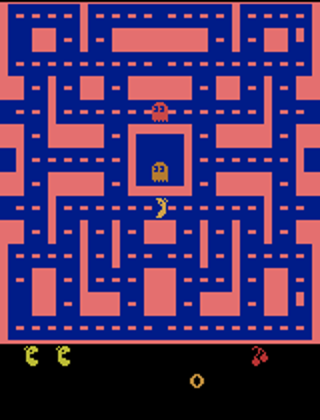

Replay pixel budget: 1682 MiB, plus model and batch memory.


In [13]:
probe_env = make_env()
try:
    probe_obs, _ = probe_env.reset(seed=SEED)
    assert probe_obs.shape == (4, 84, 84) and probe_obs.dtype == np.uint8
    assert all(np.array_equal(probe_obs[0], frame) for frame in probe_obs)
    N_ACTIONS = int(probe_env.action_space.n)
    DEVICE = select_device(N_ACTIONS)
    print("Available moves:", probe_env.unwrapped.get_action_meanings())
    display(PILImage.fromarray(probe_env.render()).resize((320, 420)))
finally:
    probe_env.close()
print(f"Replay pixel budget: {REPLAY_CAPACITY * 5 * 84 * 84 / 2**20:.0f} MiB, plus model and batch memory.")

## 4. gameplay, scores, and saved results

Evaluation uses a separate game environment and the same five seeds before and after training.
It uses 5% random moves in both cases. Evaluation never changes the network or training memory.
The baseline is an **untrained network**, not a random-action agent.

GIFs show the first 20 seconds at most, compressed to about five seconds at 4× speed; the reported score covers the entire evaluated game, up to the fixed time limit.

### 4a. score complete games and record a short sample

All evaluation games run at full computing speed, with no waiting for playback. We record a short excerpt, but add rewards for the **entire game**. For the final preview we keep the excerpt from the game with the highest full-game score.

In [14]:
def evaluate(model, seeds, gif_path=None, record_best=False):
    env = make_env()
    scores, lengths, capped = [], [], []
    best_score, chosen_frames = -float("inf"), []
    was_training = model.training
    model.eval()
    try:
        for index, seed in enumerate(seeds):
            rng = random.Random(seed + 10000)
            obs, _ = env.reset(seed=seed)
            total, frames = 0.0, []
            capture = gif_path is not None and (record_best or index == 0)
            for step in range(MAX_STEPS):
                if capture and step < PREVIEW_DECISIONS and step % PREVIEW_STRIDE == 0:
                    frames.append(PILImage.fromarray(env.render()).copy())
                action = choose_action(model, obs, EVAL_EXPLORATION, rng, N_ACTIONS)
                obs, reward, ended, truncated, _ = env.step(action)
                total += reward
                if ended or truncated:
                    break
            scores.append(float(total))
            lengths.append(step + 1)
            capped.append(bool(truncated))
            if capture and (not record_best or total > best_score):
                chosen_frames, best_score = frames, total
    finally:
        env.close()
        model.train(was_training)
    if gif_path is not None and chosen_frames:
        chosen_frames[0].save(gif_path, save_all=True, append_images=chosen_frames[1:],
                              duration=PREVIEW_FRAME_MS, loop=PREVIEW_PLAYS - 1)
    return {"seeds": list(seeds), "scores": scores, "mean": float(np.mean(scores)),
            "steps": lengths, "time_limited": capped}

### 4b. show the sample

Always keep a playable GIF in the notebook. Both the inline GIF and the popup play exactly twice. When a local desktop and Tk are available, the separate floating player does not block the next learning update.

In [15]:
def show_sample(gif_path, label):
    """Display a recorded excerpt inline and, locally, above the notebook."""
    print(f"{label} | {PREVIEW_SPEED}× playback | {PREVIEW_PLAYS} plays | first {PREVIEW_SECONDS}s of game time")
    display(Image(filename=str(gif_path)))
    if not SHOW_POPUPS:
        return
    try:
        from pacman_player import show_popup
        opened = show_popup(gif_path, f"{label} · {PREVIEW_SPEED}× speed")
        if not opened:
            print("Popup unavailable in this kernel; use the fast inline preview.")
    except (ImportError, OSError) as error:
        print(f"Using the inline preview. Local popup helper unavailable: {error}")

### 4c. save a model for playback

A checkpoint stores the learned weights and action count. Reloading it lets us check the saved agent. It does not contain everything needed to resume the exact training session.

In [16]:
def save_checkpoint(model, path, episode, steps):
    # Portable playback checkpoint. This is not an exact training-resume snapshot:
    # replay, optimizer, and emulator state are intentionally not persisted.
    payload = {"model": {k: v.detach().cpu().clone() for k, v in model.state_dict().items()},
               "n_actions": N_ACTIONS, "episode": episode, "steps": steps,
               "exploration": EXPLORATION, "learning_rate": LEARNING_RATE}
    temporary = path.with_suffix(".tmp")
    torch.save(payload, temporary)
    temporary.replace(path)

### 4d. save one row per game

The CSV keeps each completed game’s raw score, decisions, exploration, loss, and elapsed time. A game with no learning updates has no meaningful loss yet.

In [17]:
def save_metrics(rows, path):
    fields = ["episode", "score", "steps", "total_steps", "exploration", "mean_loss", "elapsed_seconds", "terminated", "truncated"]
    with path.open("w", newline="") as handle:
        writer = csv.DictWriter(handle, fieldnames=fields)
        writer.writeheader()
        writer.writerows(rows)

### 4e. draw the learning dashboard

The three panels show scores, prediction error, and exploration. Look at game scores as well as loss: reducing prediction error does not guarantee better play.

In [18]:
def plot_training(rows, path):
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    if rows:
        episodes = [r["episode"] for r in rows]
        scores = [r["score"] for r in rows]
        smooth = [np.mean(scores[max(0, i - 24):i + 1]) for i in range(len(scores))]
        axes[0].plot(episodes, scores, alpha=0.35, label="Each training game")
        axes[0].plot(episodes, smooth, label="Up to 25-game average")
        axes[0].legend(fontsize=8)
        axes[1].plot(episodes, [r["mean_loss"] for r in rows])
        axes[2].plot(episodes, [r["exploration"] for r in rows])
    for ax, title in zip(axes, ["Raw training score", "Mean update loss", "Training exploration"]):
        ax.set(title=title, xlabel="Completed episode")
        ax.grid(alpha=0.2)
    axes[2].set_ylim(0, 1.05)
    fig.tight_layout()
    fig.savefig(path, dpi=150)
    plt.close(fig)

## 5. train your agent

The setup cell below starts a **fresh experiment** each time, using your three choices.
It saves the untrained baseline, trains, and prints a line after each episode plus a progress update every 500 decisions.
Every 25 episodes it opens a fast gameplay sample and saves a checkpoint and plot.

To stop early, use the notebook's **Interrupt / Stop** button once. The current model and completed-episode results are saved.
Then run the remaining cells to evaluate and download them. A run ending before warm-up finishes has no learning updates yet.
Each run has its own folder so earlier experiments stay available.

### 5a. start a fresh experiment

Create the two networks, empty replay memory, random seeds, and a unique results folder. This cell resets training. To try again, rerun from here or choose Run All.

In [19]:
# Each execution starts fresh, including network weights and replay memory.
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
train_rng = random.Random(SEED)
replay_rng = random.Random(SEED + 1)
RUN_DIR = Path("pacman_runs") / datetime.now().strftime("%Y%m%d_%H%M%S_%f")
RUN_DIR.mkdir(parents=True, exist_ok=False)
(RUN_DIR / "demos").mkdir()
model = DQN(N_ACTIONS).to(DEVICE)
target = DQN(N_ACTIONS).to(DEVICE)
target.load_state_dict(model.state_dict())
target.eval()
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
replay = ReplayMemory(REPLAY_CAPACITY)
history, demo_history = [], []
total_steps, completed_episodes, updates = 0, 0, 0

_training_started = False

### 5b. record the settings and test saving

Save the hardware and settings alongside the initial weights. Reload those weights immediately to catch any checkpoint problem before training.

In [20]:
config = {"exploration": EXPLORATION, "episodes_requested": EPISODES, "learning_rate": LEARNING_RATE,
          "seed": SEED, "device": str(DEVICE), "python": platform.python_version(),
          "platform": platform.platform(), "packages": VERSIONS,
          "environment": "ALE/MsPacman-v5", "frame_skip": FRAME_SKIP,
          "sticky_action_probability": 0.25, "noop_max": 30, "grayscale_size": 84,
          "stack_size": 4, "terminal_on_life_loss": False, "max_decisions_per_game": MAX_STEPS,
          "replay_capacity": REPLAY_CAPACITY, "warmup_decisions": WARMUP_STEPS,
          "batch_size": BATCH_SIZE, "train_every_decisions": TRAIN_EVERY,
          "target_sync_decisions": TARGET_EVERY, "gamma": GAMMA,
          "training_reward_clipping": [-1, 1], "eval_exploration": EVAL_EXPLORATION,
          "eval_seeds": EVAL_SEEDS, "preview_seconds": PREVIEW_SECONDS,
          "preview_speed": PREVIEW_SPEED, "preview_plays": PREVIEW_PLAYS,
          "preview_stride": PREVIEW_STRIDE,
          "preview_frame_ms": PREVIEW_FRAME_MS}
(RUN_DIR / "config.json").write_text(json.dumps(config, indent=2))
save_checkpoint(model, RUN_DIR / "untrained.pt", 0, 0)
# Check saving and loading before starting the long run.
roundtrip = torch.load(RUN_DIR / "untrained.pt", map_location="cpu", weights_only=True)
assert all(torch.equal(v.cpu(), roundtrip["model"][k]) for k, v in model.state_dict().items())
del roundtrip

### 5c. measure the starting point

Play five games before learning. This gives a baseline for the final comparison. The popup shows a short, accelerated excerpt from the first game.

Evaluating the untrained network on five games. This can take a few minutes.
Before training: [350.0, 500.0, 320.0, 800.0, 490.0] | mean: 492.0
Before training | 4× playback | 2 plays | first 20s of game time


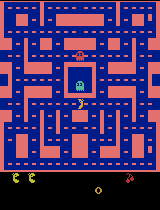

In [21]:
print("Evaluating the untrained network on five games. This can take a few minutes.", flush=True)
baseline = evaluate(model, EVAL_SEEDS, RUN_DIR / "demos" / "episode_0000.gif")
(RUN_DIR / "baseline.json").write_text(json.dumps(baseline, indent=2))
print("Before training:", baseline["scores"], "| mean:", baseline["mean"])
show_sample(RUN_DIR / "demos" / "episode_0000.gif", "Before training")

### 5d. learn during one game

Repeat **choose → play → remember → learn** until game over or the time limit. The counters span all games, so warm-up happens once. Every 1,000 decisions, copy the learning network into the target network.

In [22]:
def train_one_episode(train_env, episode):
    """Collect experience and update the agent during one complete game."""
    global total_steps, updates
    obs, _ = train_env.reset(seed=SEED + episode)
    score, losses = 0.0, []
    for step in range(MAX_STEPS):
        epsilon = 1.0 if total_steps < WARMUP_STEPS else EXPLORATION
        action = choose_action(model, obs, epsilon, train_rng, N_ACTIONS)
        next_obs, reward, ended, truncated, _ = train_env.step(action)
        replay.add(obs, action, reward, next_obs, ended, truncated)
        obs = next_obs
        score += reward
        total_steps += 1
        if total_steps >= WARMUP_STEPS and len(replay) >= BATCH_SIZE and total_steps % TRAIN_EVERY == 0:
            losses.append(learn(model, target, optimizer, replay.sample(BATCH_SIZE, replay_rng)))
            updates += 1
        if total_steps % TARGET_EVERY == 0:
            target.load_state_dict(model.state_dict())
        if total_steps % 500 == 0:
            elapsed = time.monotonic() - started
            print(f"  Episode {episode}/{EPISODES} | {total_steps:,} decisions | {updates:,} updates | {elapsed / 60:.1f} min", flush=True)
        if ended or truncated:
            break
    return {"episode": episode, "score": float(score), "steps": step + 1,
            "total_steps": total_steps, "exploration": epsilon,
            "mean_loss": float(np.mean(losses)) if losses else float("nan"),
            "elapsed_seconds": time.monotonic() - started,
            "terminated": bool(ended), "truncated": bool(truncated)}

### 5e. save a progress sample

Every 25 completed games, evaluate on a separate game, show the fast popup, and save a checkpoint. Evaluation does not add experiences to replay or change weights.

In [23]:
def save_progress_sample(episode):
    gif_path = RUN_DIR / "demos" / f"episode_{episode:04d}.gif"
    demo = evaluate(model, EVAL_SEEDS[:1], gif_path)
    demo_history.append({"episode": episode, **demo})
    (RUN_DIR / "demo_scores.json").write_text(json.dumps(demo_history, indent=2))
    print("Separate demonstration score:", demo["scores"][0])
    save_checkpoint(model, RUN_DIR / f"episode_{episode:04d}.pt", episode, total_steps)
    plot_training(history, RUN_DIR / "training_dashboard.png")
    show_sample(gif_path, f"After {episode} training games")

### 5f. save the current result

Run this helper on completion, interruption, or failure. Checkpoints include all weight updates so far; the CSV contains completed games only.

In [24]:
def save_training_result(status):
    save_checkpoint(model, RUN_DIR / "trained.pt", completed_episodes, total_steps)
    save_metrics(history, RUN_DIR / "training.csv")
    plot_training(history, RUN_DIR / "training_dashboard.png")
    summary = {"status": status, "completed_episodes": completed_episodes,
               "total_decisions": total_steps, "learning_updates": updates,
               "elapsed_seconds_including_periodic_demos": time.monotonic() - started}
    (RUN_DIR / "training_summary.json").write_text(json.dumps(summary, indent=2))

### 5g. run the training games

This is the experiment loop. Each call plays one game and prints its score. **Interrupt / Stop** saves the current model; then continue to section 6. To start another experiment, rerun from 5a so the model, baseline, and results folder all reset together.

Episode 1/20000 | score 130 | recent mean 130.0 | exploration 100%
  Episode 2/20000 | 500 decisions | 0 updates | 0.0 min
  Episode 2/20000 | 1,000 decisions | 1 updates | 0.0 min
Episode 2/20000 | score 500 | recent mean 315.0 | exploration 15%
  Episode 3/20000 | 1,500 decisions | 126 updates | 0.0 min
Episode 3/20000 | score 860 | recent mean 496.7 | exploration 15%
  Episode 4/20000 | 2,000 decisions | 251 updates | 0.1 min
Episode 4/20000 | score 350 | recent mean 460.0 | exploration 15%
  Episode 5/20000 | 2,500 decisions | 376 updates | 0.1 min
  Episode 5/20000 | 3,000 decisions | 501 updates | 0.1 min
Episode 5/20000 | score 840 | recent mean 536.0 | exploration 15%
  Episode 6/20000 | 3,500 decisions | 626 updates | 0.1 min
Episode 6/20000 | score 1060 | recent mean 623.3 | exploration 15%
  Episode 7/20000 | 4,000 decisions | 751 updates | 0.2 min
Episode 7/20000 | score 550 | recent mean 612.9 | exploration 15%
  Episode 8/20000 | 4,500 decisions | 876 updates | 0.2 min
Ep

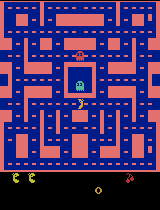

  Episode 26/20000 | 15,500 decisions | 3,626 updates | 0.8 min
  Episode 26/20000 | 16,000 decisions | 3,751 updates | 0.8 min
Episode 26/20000 | score 2080 | recent mean 736.8 | exploration 15%
  Episode 27/20000 | 16,500 decisions | 3,876 updates | 0.9 min
Episode 27/20000 | score 700 | recent mean 744.8 | exploration 15%
  Episode 28/20000 | 17,000 decisions | 4,001 updates | 0.9 min
  Episode 28/20000 | 17,500 decisions | 4,126 updates | 0.9 min
Episode 28/20000 | score 960 | recent mean 748.8 | exploration 15%
  Episode 29/20000 | 18,000 decisions | 4,251 updates | 0.9 min
Episode 29/20000 | score 290 | recent mean 746.4 | exploration 15%
  Episode 30/20000 | 18,500 decisions | 4,376 updates | 1.0 min
Episode 30/20000 | score 900 | recent mean 748.8 | exploration 15%
  Episode 31/20000 | 19,000 decisions | 4,501 updates | 1.0 min
Episode 31/20000 | score 440 | recent mean 724.0 | exploration 15%
  Episode 32/20000 | 19,500 decisions | 4,626 updates | 1.0 min
Episode 32/20000 | sc

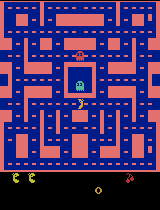

  Episode 51/20000 | 31,000 decisions | 7,501 updates | 1.7 min
Episode 51/20000 | score 730 | recent mean 740.8 | exploration 15%
  Episode 52/20000 | 31,500 decisions | 7,626 updates | 1.8 min
Episode 52/20000 | score 430 | recent mean 730.0 | exploration 15%
Episode 53/20000 | score 480 | recent mean 710.8 | exploration 15%
  Episode 54/20000 | 32,000 decisions | 7,751 updates | 1.8 min
  Episode 54/20000 | 32,500 decisions | 7,876 updates | 1.8 min
Episode 54/20000 | score 750 | recent mean 729.2 | exploration 15%
  Episode 55/20000 | 33,000 decisions | 8,001 updates | 1.9 min
Episode 55/20000 | score 880 | recent mean 728.4 | exploration 15%
  Episode 56/20000 | 33,500 decisions | 8,126 updates | 1.9 min
Episode 56/20000 | score 410 | recent mean 727.2 | exploration 15%
  Episode 57/20000 | 34,000 decisions | 8,251 updates | 1.9 min
Episode 57/20000 | score 620 | recent mean 738.0 | exploration 15%
  Episode 58/20000 | 34,500 decisions | 8,376 updates | 1.9 min
  Episode 58/20000 

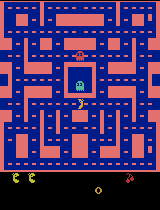

Episode 76/20000 | score 320 | recent mean 679.6 | exploration 15%
  Episode 77/20000 | 45,000 decisions | 11,001 updates | 2.7 min
  Episode 77/20000 | 45,500 decisions | 11,126 updates | 2.8 min
Episode 77/20000 | score 580 | recent mean 685.6 | exploration 15%
  Episode 78/20000 | 46,000 decisions | 11,251 updates | 2.8 min
Episode 78/20000 | score 840 | recent mean 700.0 | exploration 15%
  Episode 79/20000 | 46,500 decisions | 11,376 updates | 2.9 min
  Episode 79/20000 | 47,000 decisions | 11,501 updates | 2.9 min
Episode 79/20000 | score 1060 | recent mean 712.4 | exploration 15%
Episode 80/20000 | score 510 | recent mean 697.6 | exploration 15%
  Episode 81/20000 | 47,500 decisions | 11,626 updates | 2.9 min
  Episode 81/20000 | 48,000 decisions | 11,751 updates | 2.9 min
Episode 81/20000 | score 400 | recent mean 697.2 | exploration 15%
Episode 82/20000 | score 350 | recent mean 686.4 | exploration 15%
  Episode 83/20000 | 48,500 decisions | 11,876 updates | 3.0 min
Episode 83

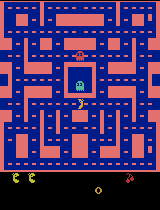

  Episode 101/20000 | 59,500 decisions | 14,626 updates | 3.6 min
  Episode 101/20000 | 60,000 decisions | 14,751 updates | 3.6 min
Episode 101/20000 | score 1270 | recent mean 711.6 | exploration 15%
  Episode 102/20000 | 60,500 decisions | 14,876 updates | 3.7 min
Episode 102/20000 | score 890 | recent mean 724.0 | exploration 15%
  Episode 103/20000 | 61,000 decisions | 15,001 updates | 3.7 min
Episode 103/20000 | score 1550 | recent mean 752.4 | exploration 15%
  Episode 104/20000 | 61,500 decisions | 15,126 updates | 3.7 min
  Episode 104/20000 | 62,000 decisions | 15,251 updates | 3.7 min
Episode 104/20000 | score 760 | recent mean 740.4 | exploration 15%
  Episode 105/20000 | 62,500 decisions | 15,376 updates | 3.8 min
Episode 105/20000 | score 1440 | recent mean 777.6 | exploration 15%
  Episode 106/20000 | 63,000 decisions | 15,501 updates | 3.8 min
  Episode 106/20000 | 63,500 decisions | 15,626 updates | 3.8 min
Episode 106/20000 | score 870 | recent mean 796.4 | exploration

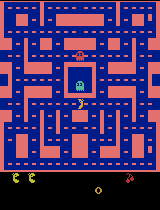

  Episode 126/20000 | 75,000 decisions | 18,501 updates | 4.5 min
  Episode 126/20000 | 75,500 decisions | 18,626 updates | 4.5 min
Episode 126/20000 | score 690 | recent mean 768.0 | exploration 15%
  Episode 127/20000 | 76,000 decisions | 18,751 updates | 4.6 min
Episode 127/20000 | score 620 | recent mean 757.2 | exploration 15%
Episode 128/20000 | score 470 | recent mean 714.0 | exploration 15%
  Episode 129/20000 | 76,500 decisions | 18,876 updates | 4.6 min
Episode 129/20000 | score 390 | recent mean 699.2 | exploration 15%
  Episode 130/20000 | 77,000 decisions | 19,001 updates | 4.6 min
Episode 130/20000 | score 310 | recent mean 654.0 | exploration 15%
  Episode 131/20000 | 77,500 decisions | 19,126 updates | 4.6 min
Episode 131/20000 | score 550 | recent mean 641.2 | exploration 15%
  Episode 132/20000 | 78,000 decisions | 19,251 updates | 4.7 min
  Episode 132/20000 | 78,500 decisions | 19,376 updates | 4.7 min
Episode 132/20000 | score 760 | recent mean 626.4 | exploration 

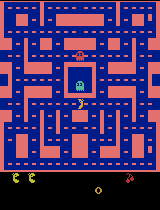

  Episode 151/20000 | 89,000 decisions | 22,001 updates | 5.3 min
Episode 151/20000 | score 1150 | recent mean 702.8 | exploration 15%
  Episode 152/20000 | 89,500 decisions | 22,126 updates | 5.3 min
Episode 152/20000 | score 330 | recent mean 691.2 | exploration 15%
  Episode 153/20000 | 90,000 decisions | 22,251 updates | 5.4 min
  Episode 153/20000 | 90,500 decisions | 22,376 updates | 5.4 min
Episode 153/20000 | score 1760 | recent mean 742.8 | exploration 15%
  Episode 154/20000 | 91,000 decisions | 22,501 updates | 5.4 min
Episode 154/20000 | score 650 | recent mean 753.2 | exploration 15%
  Episode 155/20000 | 91,500 decisions | 22,626 updates | 5.4 min
  Episode 155/20000 | 92,000 decisions | 22,751 updates | 5.5 min
Episode 155/20000 | score 740 | recent mean 770.4 | exploration 15%
  Episode 156/20000 | 92,500 decisions | 22,876 updates | 5.5 min
  Episode 156/20000 | 93,000 decisions | 23,001 updates | 5.5 min
Episode 156/20000 | score 1420 | recent mean 805.2 | exploration

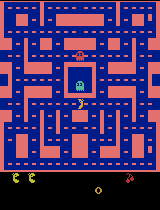

  Episode 176/20000 | 104,500 decisions | 25,876 updates | 6.2 min
  Episode 176/20000 | 105,000 decisions | 26,001 updates | 6.2 min
Episode 176/20000 | score 890 | recent mean 832.8 | exploration 15%
  Episode 177/20000 | 105,500 decisions | 26,126 updates | 6.2 min
Episode 177/20000 | score 720 | recent mean 848.4 | exploration 15%
  Episode 178/20000 | 106,000 decisions | 26,251 updates | 6.3 min
  Episode 178/20000 | 106,500 decisions | 26,376 updates | 6.3 min
Episode 178/20000 | score 910 | recent mean 814.4 | exploration 15%
  Episode 179/20000 | 107,000 decisions | 26,501 updates | 6.3 min
Episode 179/20000 | score 530 | recent mean 809.6 | exploration 15%
  Episode 180/20000 | 107,500 decisions | 26,626 updates | 6.3 min
Episode 180/20000 | score 470 | recent mean 798.8 | exploration 15%
Episode 181/20000 | score 350 | recent mean 756.0 | exploration 15%
  Episode 182/20000 | 108,000 decisions | 26,751 updates | 6.4 min
  Episode 182/20000 | 108,500 decisions | 26,876 updates

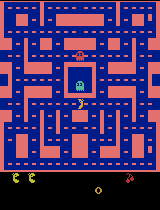

  Episode 201/20000 | 118,500 decisions | 29,376 updates | 7.0 min
  Episode 201/20000 | 119,000 decisions | 29,501 updates | 7.0 min
Episode 201/20000 | score 1070 | recent mean 669.2 | exploration 15%
  Episode 202/20000 | 119,500 decisions | 29,626 updates | 7.0 min
  Episode 202/20000 | 120,000 decisions | 29,751 updates | 7.1 min
Episode 202/20000 | score 2200 | recent mean 728.4 | exploration 15%
  Episode 203/20000 | 120,500 decisions | 29,876 updates | 7.1 min
Episode 203/20000 | score 400 | recent mean 708.0 | exploration 15%
  Episode 204/20000 | 121,000 decisions | 30,001 updates | 7.1 min
Episode 204/20000 | score 790 | recent mean 718.4 | exploration 15%
  Episode 205/20000 | 121,500 decisions | 30,126 updates | 7.2 min
Episode 205/20000 | score 600 | recent mean 723.6 | exploration 15%
  Episode 206/20000 | 122,000 decisions | 30,251 updates | 7.2 min
  Episode 206/20000 | 122,500 decisions | 30,376 updates | 7.2 min
Episode 206/20000 | score 820 | recent mean 742.4 | exp

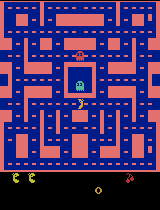

  Episode 226/20000 | 134,000 decisions | 33,251 updates | 7.9 min
Episode 226/20000 | score 430 | recent mean 722.4 | exploration 15%
  Episode 227/20000 | 134,500 decisions | 33,376 updates | 7.9 min
Episode 227/20000 | score 400 | recent mean 650.4 | exploration 15%
  Episode 228/20000 | 135,000 decisions | 33,501 updates | 7.9 min
Episode 228/20000 | score 630 | recent mean 659.6 | exploration 15%
  Episode 229/20000 | 135,500 decisions | 33,626 updates | 7.9 min
Episode 229/20000 | score 310 | recent mean 640.4 | exploration 15%
  Episode 230/20000 | 136,000 decisions | 33,751 updates | 8.0 min
Episode 230/20000 | score 1050 | recent mean 658.4 | exploration 15%
  Episode 231/20000 | 136,500 decisions | 33,876 updates | 8.0 min
  Episode 231/20000 | 137,000 decisions | 34,001 updates | 8.0 min
Episode 231/20000 | score 1740 | recent mean 695.2 | exploration 15%
  Episode 232/20000 | 137,500 decisions | 34,126 updates | 8.1 min
Episode 232/20000 | score 1100 | recent mean 718.8 | e

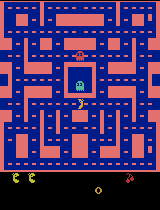

  Episode 251/20000 | 149,000 decisions | 37,001 updates | 8.7 min
Episode 251/20000 | score 1010 | recent mean 734.8 | exploration 15%
  Episode 252/20000 | 149,500 decisions | 37,126 updates | 8.7 min
  Episode 252/20000 | 150,000 decisions | 37,251 updates | 8.8 min
Episode 252/20000 | score 1010 | recent mean 759.2 | exploration 15%
Episode 253/20000 | score 340 | recent mean 747.6 | exploration 15%
  Episode 254/20000 | 150,500 decisions | 37,376 updates | 8.8 min
Episode 254/20000 | score 520 | recent mean 756.0 | exploration 15%
  Episode 255/20000 | 151,000 decisions | 37,501 updates | 8.8 min
  Episode 255/20000 | 151,500 decisions | 37,626 updates | 8.8 min
Episode 255/20000 | score 710 | recent mean 742.4 | exploration 15%
  Episode 256/20000 | 152,000 decisions | 37,751 updates | 8.9 min
Episode 256/20000 | score 1830 | recent mean 746.0 | exploration 15%
  Episode 257/20000 | 152,500 decisions | 37,876 updates | 8.9 min
Episode 257/20000 | score 560 | recent mean 724.4 | e

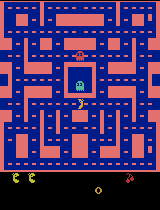

  Episode 276/20000 | 163,000 decisions | 40,501 updates | 9.5 min
Episode 276/20000 | score 290 | recent mean 669.6 | exploration 15%
  Episode 277/20000 | 163,500 decisions | 40,626 updates | 9.5 min
Episode 277/20000 | score 580 | recent mean 652.4 | exploration 15%
  Episode 278/20000 | 164,000 decisions | 40,751 updates | 9.5 min
Episode 278/20000 | score 940 | recent mean 676.4 | exploration 15%
  Episode 279/20000 | 164,500 decisions | 40,876 updates | 9.6 min
  Episode 279/20000 | 165,000 decisions | 41,001 updates | 9.6 min
Episode 279/20000 | score 960 | recent mean 694.0 | exploration 15%
  Episode 280/20000 | 165,500 decisions | 41,126 updates | 9.6 min
Episode 280/20000 | score 360 | recent mean 680.0 | exploration 15%
  Episode 281/20000 | 166,000 decisions | 41,251 updates | 9.7 min
Episode 281/20000 | score 580 | recent mean 630.0 | exploration 15%
Episode 282/20000 | score 310 | recent mean 620.0 | exploration 15%
  Episode 283/20000 | 166,500 decisions | 41,376 update

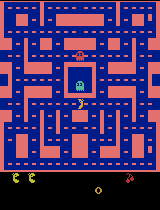

Episode 301/20000 | score 290 | recent mean 696.4 | exploration 15%
  Episode 302/20000 | 178,000 decisions | 44,251 updates | 10.3 min
  Episode 302/20000 | 178,500 decisions | 44,376 updates | 10.4 min
Episode 302/20000 | score 1190 | recent mean 720.8 | exploration 15%
  Episode 303/20000 | 179,000 decisions | 44,501 updates | 10.4 min
Episode 303/20000 | score 370 | recent mean 698.0 | exploration 15%
  Episode 304/20000 | 179,500 decisions | 44,626 updates | 10.4 min
Episode 304/20000 | score 1110 | recent mean 704.0 | exploration 15%
  Episode 305/20000 | 180,000 decisions | 44,751 updates | 10.4 min
Episode 305/20000 | score 1290 | recent mean 741.2 | exploration 15%
  Episode 306/20000 | 180,500 decisions | 44,876 updates | 10.5 min
Episode 306/20000 | score 380 | recent mean 733.2 | exploration 15%
  Episode 307/20000 | 181,000 decisions | 45,001 updates | 10.5 min
Episode 307/20000 | score 440 | recent mean 738.4 | exploration 15%
  Episode 308/20000 | 181,500 decisions | 45,

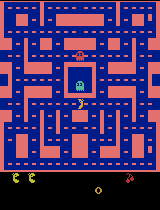

  Episode 326/20000 | 193,500 decisions | 48,126 updates | 11.2 min
  Episode 326/20000 | 194,000 decisions | 48,251 updates | 11.2 min
Episode 326/20000 | score 880 | recent mean 884.8 | exploration 15%
  Episode 327/20000 | 194,500 decisions | 48,376 updates | 11.3 min
  Episode 327/20000 | 195,000 decisions | 48,501 updates | 11.3 min
Episode 327/20000 | score 1600 | recent mean 901.2 | exploration 15%
  Episode 328/20000 | 195,500 decisions | 48,626 updates | 11.3 min
Episode 328/20000 | score 630 | recent mean 911.6 | exploration 15%
  Episode 329/20000 | 196,000 decisions | 48,751 updates | 11.3 min
Episode 329/20000 | score 460 | recent mean 885.6 | exploration 15%
  Episode 330/20000 | 196,500 decisions | 48,876 updates | 11.4 min
  Episode 330/20000 | 197,000 decisions | 49,001 updates | 11.4 min
Episode 330/20000 | score 1350 | recent mean 888.0 | exploration 15%
  Episode 331/20000 | 197,500 decisions | 49,126 updates | 11.4 min
Episode 331/20000 | score 390 | recent mean 88

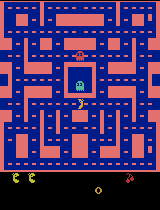

  Episode 351/20000 | 210,500 decisions | 52,376 updates | 12.2 min
  Episode 351/20000 | 211,000 decisions | 52,501 updates | 12.2 min
Episode 351/20000 | score 1030 | recent mean 796.8 | exploration 15%
  Episode 352/20000 | 211,500 decisions | 52,626 updates | 12.2 min
Episode 352/20000 | score 1290 | recent mean 784.4 | exploration 15%
  Episode 353/20000 | 212,000 decisions | 52,751 updates | 12.3 min
Episode 353/20000 | score 560 | recent mean 781.6 | exploration 15%
  Episode 354/20000 | 212,500 decisions | 52,876 updates | 12.3 min
Episode 354/20000 | score 770 | recent mean 794.0 | exploration 15%
  Episode 355/20000 | 213,000 decisions | 53,001 updates | 12.3 min
Episode 355/20000 | score 480 | recent mean 759.2 | exploration 15%
  Episode 356/20000 | 213,500 decisions | 53,126 updates | 12.3 min
  Episode 356/20000 | 214,000 decisions | 53,251 updates | 12.4 min
Episode 356/20000 | score 1730 | recent mean 812.8 | exploration 15%
  Episode 357/20000 | 214,500 decisions | 53,

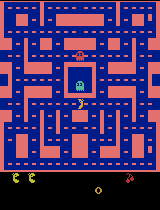

  Episode 376/20000 | 227,500 decisions | 56,626 updates | 13.1 min
Episode 376/20000 | score 460 | recent mean 854.0 | exploration 15%
  Episode 377/20000 | 228,000 decisions | 56,751 updates | 13.2 min
  Episode 377/20000 | 228,500 decisions | 56,876 updates | 13.2 min
Episode 377/20000 | score 540 | recent mean 824.0 | exploration 15%
  Episode 378/20000 | 229,000 decisions | 57,001 updates | 13.2 min
Episode 378/20000 | score 1010 | recent mean 842.0 | exploration 15%
  Episode 379/20000 | 229,500 decisions | 57,126 updates | 13.2 min
Episode 379/20000 | score 620 | recent mean 836.0 | exploration 15%
  Episode 380/20000 | 230,000 decisions | 57,251 updates | 13.3 min
Episode 380/20000 | score 430 | recent mean 834.0 | exploration 15%
  Episode 381/20000 | 230,500 decisions | 57,376 updates | 13.3 min
  Episode 381/20000 | 231,000 decisions | 57,501 updates | 13.3 min
Episode 381/20000 | score 1440 | recent mean 822.4 | exploration 15%
  Episode 382/20000 | 231,500 decisions | 57,6

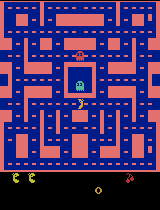

  Episode 401/20000 | 243,000 decisions | 60,501 updates | 14.0 min
Episode 401/20000 | score 570 | recent mean 765.2 | exploration 15%
  Episode 402/20000 | 243,500 decisions | 60,626 updates | 14.1 min
Episode 402/20000 | score 1200 | recent mean 791.6 | exploration 15%
  Episode 403/20000 | 244,000 decisions | 60,751 updates | 14.1 min
Episode 403/20000 | score 480 | recent mean 770.4 | exploration 15%
  Episode 404/20000 | 244,500 decisions | 60,876 updates | 14.1 min
Episode 404/20000 | score 430 | recent mean 762.8 | exploration 15%
  Episode 405/20000 | 245,000 decisions | 61,001 updates | 14.2 min
Episode 405/20000 | score 620 | recent mean 770.4 | exploration 15%
  Episode 406/20000 | 245,500 decisions | 61,126 updates | 14.2 min
  Episode 406/20000 | 246,000 decisions | 61,251 updates | 14.2 min
Episode 406/20000 | score 1440 | recent mean 770.4 | exploration 15%
  Episode 407/20000 | 246,500 decisions | 61,376 updates | 14.2 min
Episode 407/20000 | score 1070 | recent mean 7

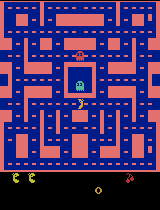

  Episode 426/20000 | 258,000 decisions | 64,251 updates | 14.9 min
  Episode 426/20000 | 258,500 decisions | 64,376 updates | 14.9 min
Episode 426/20000 | score 1470 | recent mean 751.2 | exploration 15%
  Episode 427/20000 | 259,000 decisions | 64,501 updates | 15.0 min
Episode 427/20000 | score 620 | recent mean 728.0 | exploration 15%
  Episode 428/20000 | 259,500 decisions | 64,626 updates | 15.0 min
Episode 428/20000 | score 1020 | recent mean 749.6 | exploration 15%
  Episode 429/20000 | 260,000 decisions | 64,751 updates | 15.0 min
  Episode 429/20000 | 260,500 decisions | 64,876 updates | 15.0 min
Episode 429/20000 | score 650 | recent mean 758.4 | exploration 15%
  Episode 430/20000 | 261,000 decisions | 65,001 updates | 15.1 min
Episode 430/20000 | score 890 | recent mean 769.2 | exploration 15%
  Episode 431/20000 | 261,500 decisions | 65,126 updates | 15.1 min
Episode 431/20000 | score 1350 | recent mean 765.6 | exploration 15%
  Episode 432/20000 | 262,000 decisions | 65,

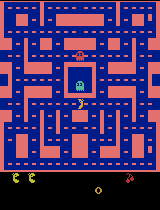

  Episode 451/20000 | 273,500 decisions | 68,126 updates | 15.8 min
Episode 451/20000 | score 610 | recent mean 795.2 | exploration 15%
  Episode 452/20000 | 274,000 decisions | 68,251 updates | 15.8 min
Episode 452/20000 | score 400 | recent mean 786.4 | exploration 15%
  Episode 453/20000 | 274,500 decisions | 68,376 updates | 15.9 min
Episode 453/20000 | score 470 | recent mean 764.4 | exploration 15%
  Episode 454/20000 | 275,000 decisions | 68,501 updates | 15.9 min
  Episode 454/20000 | 275,500 decisions | 68,626 updates | 15.9 min
Episode 454/20000 | score 2060 | recent mean 820.8 | exploration 15%
  Episode 455/20000 | 276,000 decisions | 68,751 updates | 16.0 min
Episode 455/20000 | score 540 | recent mean 806.8 | exploration 15%
  Episode 456/20000 | 276,500 decisions | 68,876 updates | 16.0 min
  Episode 456/20000 | 277,000 decisions | 69,001 updates | 16.0 min
Episode 456/20000 | score 700 | recent mean 780.8 | exploration 15%
  Episode 457/20000 | 277,500 decisions | 69,12

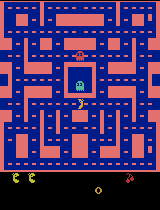

  Episode 476/20000 | 290,000 decisions | 72,251 updates | 16.8 min
  Episode 476/20000 | 290,500 decisions | 72,376 updates | 16.8 min
Episode 476/20000 | score 920 | recent mean 805.2 | exploration 15%
Episode 477/20000 | score 360 | recent mean 803.6 | exploration 15%
  Episode 478/20000 | 291,000 decisions | 72,501 updates | 16.8 min
Episode 478/20000 | score 470 | recent mean 803.6 | exploration 15%
  Episode 479/20000 | 291,500 decisions | 72,626 updates | 16.9 min
  Episode 479/20000 | 292,000 decisions | 72,751 updates | 16.9 min
Episode 479/20000 | score 500 | recent mean 741.2 | exploration 15%
  Episode 480/20000 | 292,500 decisions | 72,876 updates | 16.9 min
Episode 480/20000 | score 730 | recent mean 748.8 | exploration 15%
  Episode 481/20000 | 293,000 decisions | 73,001 updates | 16.9 min
Episode 481/20000 | score 530 | recent mean 742.0 | exploration 15%
  Episode 482/20000 | 293,500 decisions | 73,126 updates | 17.0 min
  Episode 482/20000 | 294,000 decisions | 73,251

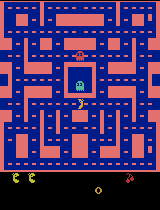

  Episode 501/20000 | 306,500 decisions | 76,376 updates | 17.7 min
Episode 501/20000 | score 530 | recent mean 892.4 | exploration 15%
  Episode 502/20000 | 307,000 decisions | 76,501 updates | 17.7 min
  Episode 502/20000 | 307,500 decisions | 76,626 updates | 17.8 min
Episode 502/20000 | score 2650 | recent mean 984.0 | exploration 15%
  Episode 503/20000 | 308,000 decisions | 76,751 updates | 17.8 min
  Episode 503/20000 | 308,500 decisions | 76,876 updates | 17.8 min
Episode 503/20000 | score 1460 | recent mean 1023.6 | exploration 15%
  Episode 504/20000 | 309,000 decisions | 77,001 updates | 17.8 min
Episode 504/20000 | score 560 | recent mean 1026.0 | exploration 15%
  Episode 505/20000 | 309,500 decisions | 77,126 updates | 17.9 min
Episode 505/20000 | score 2200 | recent mean 1084.8 | exploration 15%
  Episode 506/20000 | 310,000 decisions | 77,251 updates | 17.9 min
  Episode 506/20000 | 310,500 decisions | 77,376 updates | 17.9 min
Episode 506/20000 | score 750 | recent mea

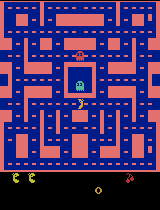

  Episode 526/20000 | 322,000 decisions | 80,251 updates | 18.6 min
  Episode 526/20000 | 322,500 decisions | 80,376 updates | 18.6 min
Episode 526/20000 | score 810 | recent mean 917.6 | exploration 15%
  Episode 527/20000 | 323,000 decisions | 80,501 updates | 18.6 min
Episode 527/20000 | score 760 | recent mean 842.0 | exploration 15%
  Episode 528/20000 | 323,500 decisions | 80,626 updates | 18.7 min
  Episode 528/20000 | 324,000 decisions | 80,751 updates | 18.7 min
Episode 528/20000 | score 1550 | recent mean 845.6 | exploration 15%
  Episode 529/20000 | 324,500 decisions | 80,876 updates | 18.7 min
  Episode 529/20000 | 325,000 decisions | 81,001 updates | 18.8 min
Episode 529/20000 | score 930 | recent mean 860.4 | exploration 15%
  Episode 530/20000 | 325,500 decisions | 81,126 updates | 18.8 min
Episode 530/20000 | score 490 | recent mean 792.0 | exploration 15%
  Episode 531/20000 | 326,000 decisions | 81,251 updates | 18.8 min
  Episode 531/20000 | 326,500 decisions | 81,37

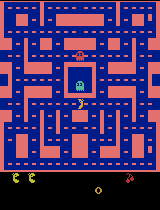

  Episode 551/20000 | 337,500 decisions | 84,126 updates | 19.5 min
Episode 551/20000 | score 900 | recent mean 773.6 | exploration 15%
  Episode 552/20000 | 338,000 decisions | 84,251 updates | 19.5 min
  Episode 552/20000 | 338,500 decisions | 84,376 updates | 19.5 min
Episode 552/20000 | score 1710 | recent mean 811.6 | exploration 15%
  Episode 553/20000 | 339,000 decisions | 84,501 updates | 19.5 min
Episode 553/20000 | score 1070 | recent mean 792.4 | exploration 15%
  Episode 554/20000 | 339,500 decisions | 84,626 updates | 19.6 min
  Episode 554/20000 | 340,000 decisions | 84,751 updates | 19.6 min
Episode 554/20000 | score 2020 | recent mean 836.0 | exploration 15%
  Episode 555/20000 | 340,500 decisions | 84,876 updates | 19.6 min
  Episode 555/20000 | 341,000 decisions | 85,001 updates | 19.7 min
Episode 555/20000 | score 450 | recent mean 834.4 | exploration 15%
  Episode 556/20000 | 341,500 decisions | 85,126 updates | 19.7 min
Episode 556/20000 | score 1190 | recent mean 

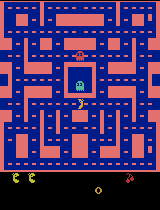

  Episode 576/20000 | 355,500 decisions | 88,626 updates | 20.5 min
  Episode 576/20000 | 356,000 decisions | 88,751 updates | 20.6 min
Episode 576/20000 | score 950 | recent mean 1061.6 | exploration 15%
  Episode 577/20000 | 356,500 decisions | 88,876 updates | 20.6 min
Episode 577/20000 | score 510 | recent mean 1013.6 | exploration 15%
  Episode 578/20000 | 357,000 decisions | 89,001 updates | 20.6 min
Episode 578/20000 | score 1450 | recent mean 1028.8 | exploration 15%
  Episode 579/20000 | 357,500 decisions | 89,126 updates | 20.6 min
Episode 579/20000 | score 430 | recent mean 965.2 | exploration 15%
  Episode 580/20000 | 358,000 decisions | 89,251 updates | 20.7 min
Episode 580/20000 | score 310 | recent mean 959.6 | exploration 15%
  Episode 581/20000 | 358,500 decisions | 89,376 updates | 20.7 min
Episode 581/20000 | score 1000 | recent mean 952.0 | exploration 15%
  Episode 582/20000 | 359,000 decisions | 89,501 updates | 20.7 min
  Episode 582/20000 | 359,500 decisions | 8

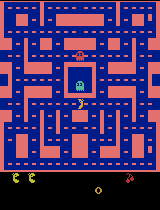

  Episode 601/20000 | 372,000 decisions | 92,751 updates | 21.5 min
Episode 601/20000 | score 620 | recent mean 808.8 | exploration 15%
  Episode 602/20000 | 372,500 decisions | 92,876 updates | 21.6 min
Episode 602/20000 | score 900 | recent mean 824.4 | exploration 15%
  Episode 603/20000 | 373,000 decisions | 93,001 updates | 21.6 min
  Episode 603/20000 | 373,500 decisions | 93,126 updates | 21.6 min
Episode 603/20000 | score 740 | recent mean 796.0 | exploration 15%
  Episode 604/20000 | 374,000 decisions | 93,251 updates | 21.6 min
Episode 604/20000 | score 480 | recent mean 798.0 | exploration 15%
  Episode 605/20000 | 374,500 decisions | 93,376 updates | 21.7 min
Episode 605/20000 | score 830 | recent mean 818.8 | exploration 15%
  Episode 606/20000 | 375,000 decisions | 93,501 updates | 21.7 min
Episode 606/20000 | score 770 | recent mean 809.6 | exploration 15%
  Episode 607/20000 | 375,500 decisions | 93,626 updates | 21.7 min
Episode 607/20000 | score 530 | recent mean 789.

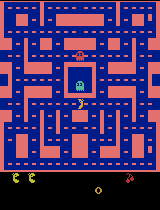

  Episode 626/20000 | 388,500 decisions | 96,876 updates | 22.5 min
Episode 626/20000 | score 890 | recent mean 852.4 | exploration 15%
  Episode 627/20000 | 389,000 decisions | 97,001 updates | 22.5 min
  Episode 627/20000 | 389,500 decisions | 97,126 updates | 22.5 min
  Episode 627/20000 | 390,000 decisions | 97,251 updates | 22.6 min
Episode 627/20000 | score 1590 | recent mean 880.0 | exploration 15%
  Episode 628/20000 | 390,500 decisions | 97,376 updates | 22.6 min
Episode 628/20000 | score 700 | recent mean 878.4 | exploration 15%
  Episode 629/20000 | 391,000 decisions | 97,501 updates | 22.6 min
  Episode 629/20000 | 391,500 decisions | 97,626 updates | 22.6 min
Episode 629/20000 | score 1900 | recent mean 935.2 | exploration 15%
  Episode 630/20000 | 392,000 decisions | 97,751 updates | 22.7 min
  Episode 630/20000 | 392,500 decisions | 97,876 updates | 22.7 min
Episode 630/20000 | score 1400 | recent mean 958.0 | exploration 15%
  Episode 631/20000 | 393,000 decisions | 98,

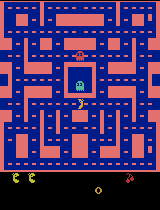

  Episode 651/20000 | 405,500 decisions | 101,126 updates | 23.5 min
Episode 651/20000 | score 830 | recent mean 897.6 | exploration 15%
  Episode 652/20000 | 406,000 decisions | 101,251 updates | 23.5 min
Episode 652/20000 | score 610 | recent mean 858.4 | exploration 15%
  Episode 653/20000 | 406,500 decisions | 101,376 updates | 23.5 min
  Episode 653/20000 | 407,000 decisions | 101,501 updates | 23.5 min
  Episode 653/20000 | 407,500 decisions | 101,626 updates | 23.6 min
Episode 653/20000 | score 1600 | recent mean 894.4 | exploration 15%
  Episode 654/20000 | 408,000 decisions | 101,751 updates | 23.6 min
Episode 654/20000 | score 1360 | recent mean 872.8 | exploration 15%
  Episode 655/20000 | 408,500 decisions | 101,876 updates | 23.6 min
  Episode 655/20000 | 409,000 decisions | 102,001 updates | 23.6 min
Episode 655/20000 | score 3140 | recent mean 942.4 | exploration 15%
  Episode 656/20000 | 409,500 decisions | 102,126 updates | 23.7 min
  Episode 656/20000 | 410,000 decisi

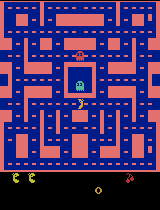

  Episode 676/20000 | 423,000 decisions | 105,501 updates | 24.4 min
Episode 676/20000 | score 470 | recent mean 990.4 | exploration 15%
  Episode 677/20000 | 423,500 decisions | 105,626 updates | 24.5 min
  Episode 677/20000 | 424,000 decisions | 105,751 updates | 24.5 min
Episode 677/20000 | score 1100 | recent mean 1010.0 | exploration 15%
  Episode 678/20000 | 424,500 decisions | 105,876 updates | 24.5 min
Episode 678/20000 | score 1590 | recent mean 1009.6 | exploration 15%
  Episode 679/20000 | 425,000 decisions | 106,001 updates | 24.5 min
Episode 679/20000 | score 430 | recent mean 972.4 | exploration 15%
  Episode 680/20000 | 425,500 decisions | 106,126 updates | 24.6 min
Episode 680/20000 | score 410 | recent mean 863.2 | exploration 15%
  Episode 681/20000 | 426,000 decisions | 106,251 updates | 24.6 min
  Episode 681/20000 | 426,500 decisions | 106,376 updates | 24.6 min
Episode 681/20000 | score 1200 | recent mean 878.8 | exploration 15%
  Episode 682/20000 | 427,000 decis

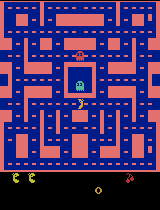

  Episode 701/20000 | 441,000 decisions | 110,001 updates | 25.4 min
Episode 701/20000 | score 530 | recent mean 911.2 | exploration 15%
  Episode 702/20000 | 441,500 decisions | 110,126 updates | 25.5 min
Episode 702/20000 | score 560 | recent mean 889.6 | exploration 15%
  Episode 703/20000 | 442,000 decisions | 110,251 updates | 25.5 min
  Episode 703/20000 | 442,500 decisions | 110,376 updates | 25.5 min
Episode 703/20000 | score 770 | recent mean 856.8 | exploration 15%
  Episode 704/20000 | 443,000 decisions | 110,501 updates | 25.5 min
Episode 704/20000 | score 330 | recent mean 852.8 | exploration 15%
  Episode 705/20000 | 443,500 decisions | 110,626 updates | 25.6 min
Episode 705/20000 | score 440 | recent mean 854.0 | exploration 15%
Episode 706/20000 | score 560 | recent mean 828.4 | exploration 15%
  Episode 707/20000 | 444,000 decisions | 110,751 updates | 25.6 min
  Episode 707/20000 | 444,500 decisions | 110,876 updates | 25.6 min
Episode 707/20000 | score 1050 | recent 

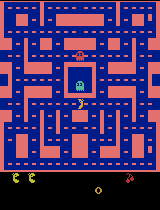

  Episode 726/20000 | 458,000 decisions | 114,251 updates | 26.4 min
Episode 726/20000 | score 1060 | recent mean 968.4 | exploration 15%
  Episode 727/20000 | 458,500 decisions | 114,376 updates | 26.4 min
  Episode 727/20000 | 459,000 decisions | 114,501 updates | 26.4 min
Episode 727/20000 | score 2060 | recent mean 1028.4 | exploration 15%
  Episode 728/20000 | 459,500 decisions | 114,626 updates | 26.5 min
Episode 728/20000 | score 2340 | recent mean 1091.2 | exploration 15%
  Episode 729/20000 | 460,000 decisions | 114,751 updates | 26.5 min
Episode 729/20000 | score 470 | recent mean 1096.8 | exploration 15%
  Episode 730/20000 | 460,500 decisions | 114,876 updates | 26.5 min
  Episode 730/20000 | 461,000 decisions | 115,001 updates | 26.5 min
Episode 730/20000 | score 710 | recent mean 1107.6 | exploration 15%
  Episode 731/20000 | 461,500 decisions | 115,126 updates | 26.6 min
Episode 731/20000 | score 700 | recent mean 1113.2 | exploration 15%
  Episode 732/20000 | 462,000 de

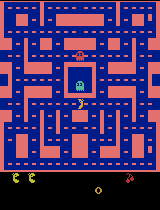

  Episode 751/20000 | 473,000 decisions | 118,001 updates | 27.2 min
Episode 751/20000 | score 660 | recent mean 931.2 | exploration 15%
  Episode 752/20000 | 473,500 decisions | 118,126 updates | 27.2 min
Episode 752/20000 | score 550 | recent mean 870.8 | exploration 15%
  Episode 753/20000 | 474,000 decisions | 118,251 updates | 27.3 min
Episode 753/20000 | score 560 | recent mean 799.6 | exploration 15%
  Episode 754/20000 | 474,500 decisions | 118,376 updates | 27.3 min
  Episode 754/20000 | 475,000 decisions | 118,501 updates | 27.3 min
Episode 754/20000 | score 1570 | recent mean 843.6 | exploration 15%
  Episode 755/20000 | 475,500 decisions | 118,626 updates | 27.3 min
Episode 755/20000 | score 370 | recent mean 830.0 | exploration 15%
  Episode 756/20000 | 476,000 decisions | 118,751 updates | 27.4 min
Episode 756/20000 | score 410 | recent mean 818.4 | exploration 15%
  Episode 757/20000 | 476,500 decisions | 118,876 updates | 27.4 min
  Episode 757/20000 | 477,000 decisions

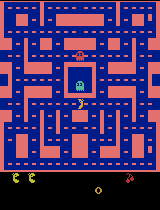

  Episode 776/20000 | 489,500 decisions | 122,126 updates | 28.1 min
Episode 776/20000 | score 560 | recent mean 936.4 | exploration 15%
  Episode 777/20000 | 490,000 decisions | 122,251 updates | 28.2 min
Episode 777/20000 | score 710 | recent mean 942.8 | exploration 15%
  Episode 778/20000 | 490,500 decisions | 122,376 updates | 28.2 min
  Episode 778/20000 | 491,000 decisions | 122,501 updates | 28.2 min
Episode 778/20000 | score 1060 | recent mean 962.8 | exploration 15%
  Episode 779/20000 | 491,500 decisions | 122,626 updates | 28.3 min
Episode 779/20000 | score 570 | recent mean 922.8 | exploration 15%
  Episode 780/20000 | 492,000 decisions | 122,751 updates | 28.3 min
Episode 780/20000 | score 1040 | recent mean 949.6 | exploration 15%
  Episode 781/20000 | 492,500 decisions | 122,876 updates | 28.3 min
Episode 781/20000 | score 610 | recent mean 957.6 | exploration 15%
  Episode 782/20000 | 493,000 decisions | 123,001 updates | 28.4 min
  Episode 782/20000 | 493,500 decision

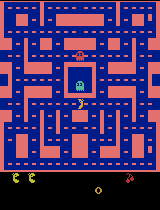

  Episode 801/20000 | 505,000 decisions | 126,001 updates | 29.0 min
  Episode 801/20000 | 505,500 decisions | 126,126 updates | 29.1 min
Episode 801/20000 | score 950 | recent mean 841.6 | exploration 15%
  Episode 802/20000 | 506,000 decisions | 126,251 updates | 29.1 min
Episode 802/20000 | score 590 | recent mean 836.8 | exploration 15%
  Episode 803/20000 | 506,500 decisions | 126,376 updates | 29.1 min
Episode 803/20000 | score 1240 | recent mean 844.0 | exploration 15%
  Episode 804/20000 | 507,000 decisions | 126,501 updates | 29.1 min
Episode 804/20000 | score 740 | recent mean 850.8 | exploration 15%
  Episode 805/20000 | 507,500 decisions | 126,626 updates | 29.2 min
  Episode 805/20000 | 508,000 decisions | 126,751 updates | 29.2 min
Episode 805/20000 | score 540 | recent mean 830.8 | exploration 15%
  Episode 806/20000 | 508,500 decisions | 126,876 updates | 29.2 min
Episode 806/20000 | score 750 | recent mean 836.4 | exploration 15%
  Episode 807/20000 | 509,000 decisions

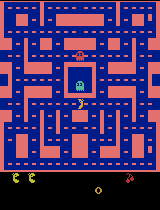

  Episode 826/20000 | 523,000 decisions | 130,501 updates | 30.1 min
Episode 826/20000 | score 1350 | recent mean 1191.6 | exploration 15%
  Episode 827/20000 | 523,500 decisions | 130,626 updates | 30.1 min
  Episode 827/20000 | 524,000 decisions | 130,751 updates | 30.1 min
Episode 827/20000 | score 1000 | recent mean 1208.0 | exploration 15%
  Episode 828/20000 | 524,500 decisions | 130,876 updates | 30.1 min
Episode 828/20000 | score 770 | recent mean 1189.2 | exploration 15%
  Episode 829/20000 | 525,000 decisions | 131,001 updates | 30.2 min
  Episode 829/20000 | 525,500 decisions | 131,126 updates | 30.2 min
Episode 829/20000 | score 1040 | recent mean 1201.2 | exploration 15%
  Episode 830/20000 | 526,000 decisions | 131,251 updates | 30.2 min
Episode 830/20000 | score 880 | recent mean 1214.8 | exploration 15%
  Episode 831/20000 | 526,500 decisions | 131,376 updates | 30.3 min
  Episode 831/20000 | 527,000 decisions | 131,501 updates | 30.3 min
Episode 831/20000 | score 1350 

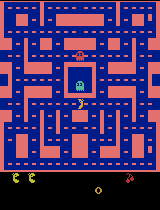

  Episode 851/20000 | 539,500 decisions | 134,626 updates | 31.0 min
Episode 851/20000 | score 460 | recent mean 962.0 | exploration 15%
  Episode 852/20000 | 540,000 decisions | 134,751 updates | 31.0 min
  Episode 852/20000 | 540,500 decisions | 134,876 updates | 31.0 min
Episode 852/20000 | score 890 | recent mean 957.6 | exploration 15%
  Episode 853/20000 | 541,000 decisions | 135,001 updates | 31.1 min
Episode 853/20000 | score 1090 | recent mean 970.4 | exploration 15%
  Episode 854/20000 | 541,500 decisions | 135,126 updates | 31.1 min
Episode 854/20000 | score 890 | recent mean 964.4 | exploration 15%
  Episode 855/20000 | 542,000 decisions | 135,251 updates | 31.1 min
  Episode 855/20000 | 542,500 decisions | 135,376 updates | 31.2 min
Episode 855/20000 | score 760 | recent mean 959.6 | exploration 15%
Episode 856/20000 | score 420 | recent mean 922.4 | exploration 15%
  Episode 857/20000 | 543,000 decisions | 135,501 updates | 31.2 min
  Episode 857/20000 | 543,500 decisions

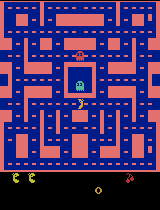

  Episode 876/20000 | 556,000 decisions | 138,751 updates | 31.9 min
Episode 876/20000 | score 850 | recent mean 916.8 | exploration 15%
  Episode 877/20000 | 556,500 decisions | 138,876 updates | 32.0 min
Episode 877/20000 | score 530 | recent mean 902.4 | exploration 15%
  Episode 878/20000 | 557,000 decisions | 139,001 updates | 32.0 min
  Episode 878/20000 | 557,500 decisions | 139,126 updates | 32.0 min
Episode 878/20000 | score 1320 | recent mean 911.6 | exploration 15%
  Episode 879/20000 | 558,000 decisions | 139,251 updates | 32.0 min
Episode 879/20000 | score 440 | recent mean 893.6 | exploration 15%
  Episode 880/20000 | 558,500 decisions | 139,376 updates | 32.1 min
Episode 880/20000 | score 1140 | recent mean 908.8 | exploration 15%
  Episode 881/20000 | 559,000 decisions | 139,501 updates | 32.1 min
Episode 881/20000 | score 700 | recent mean 920.0 | exploration 15%
  Episode 882/20000 | 559,500 decisions | 139,626 updates | 32.1 min
  Episode 882/20000 | 560,000 decision

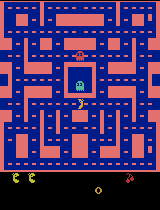

  Episode 901/20000 | 573,000 decisions | 143,001 updates | 32.9 min
Episode 901/20000 | score 560 | recent mean 985.2 | exploration 15%
  Episode 902/20000 | 573,500 decisions | 143,126 updates | 32.9 min
Episode 902/20000 | score 540 | recent mean 985.6 | exploration 15%
  Episode 903/20000 | 574,000 decisions | 143,251 updates | 33.0 min
  Episode 903/20000 | 574,500 decisions | 143,376 updates | 33.0 min
Episode 903/20000 | score 1570 | recent mean 995.6 | exploration 15%
  Episode 904/20000 | 575,000 decisions | 143,501 updates | 33.0 min
  Episode 904/20000 | 575,500 decisions | 143,626 updates | 33.0 min
Episode 904/20000 | score 1440 | recent mean 1035.6 | exploration 15%
  Episode 905/20000 | 576,000 decisions | 143,751 updates | 33.1 min
Episode 905/20000 | score 970 | recent mean 1028.8 | exploration 15%
  Episode 906/20000 | 576,500 decisions | 143,876 updates | 33.1 min
Episode 906/20000 | score 590 | recent mean 1024.4 | exploration 15%
  Episode 907/20000 | 577,000 decis

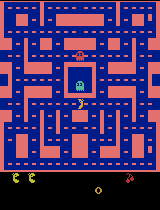

  Episode 926/20000 | 592,000 decisions | 147,751 updates | 33.9 min
  Episode 926/20000 | 592,500 decisions | 147,876 updates | 34.0 min
Episode 926/20000 | score 1150 | recent mean 1138.0 | exploration 15%
  Episode 927/20000 | 593,000 decisions | 148,001 updates | 34.0 min
Episode 927/20000 | score 710 | recent mean 1144.8 | exploration 15%
  Episode 928/20000 | 593,500 decisions | 148,126 updates | 34.0 min
  Episode 928/20000 | 594,000 decisions | 148,251 updates | 34.1 min
Episode 928/20000 | score 1090 | recent mean 1125.6 | exploration 15%
  Episode 929/20000 | 594,500 decisions | 148,376 updates | 34.1 min
Episode 929/20000 | score 1360 | recent mean 1122.4 | exploration 15%
  Episode 930/20000 | 595,000 decisions | 148,501 updates | 34.1 min
  Episode 930/20000 | 595,500 decisions | 148,626 updates | 34.1 min
Episode 930/20000 | score 2480 | recent mean 1182.8 | exploration 15%
  Episode 931/20000 | 596,000 decisions | 148,751 updates | 34.2 min
  Episode 931/20000 | 596,500 

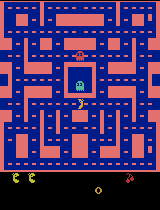

  Episode 951/20000 | 607,500 decisions | 151,626 updates | 34.8 min
  Episode 951/20000 | 608,000 decisions | 151,751 updates | 34.8 min
Episode 951/20000 | score 1560 | recent mean 891.2 | exploration 15%
  Episode 952/20000 | 608,500 decisions | 151,876 updates | 34.9 min
Episode 952/20000 | score 480 | recent mean 882.0 | exploration 15%
  Episode 953/20000 | 609,000 decisions | 152,001 updates | 34.9 min
Episode 953/20000 | score 760 | recent mean 868.8 | exploration 15%
  Episode 954/20000 | 609,500 decisions | 152,126 updates | 34.9 min
Episode 954/20000 | score 930 | recent mean 851.6 | exploration 15%
  Episode 955/20000 | 610,000 decisions | 152,251 updates | 34.9 min
Episode 955/20000 | score 490 | recent mean 772.0 | exploration 15%
  Episode 956/20000 | 610,500 decisions | 152,376 updates | 35.0 min
  Episode 956/20000 | 611,000 decisions | 152,501 updates | 35.0 min
Episode 956/20000 | score 980 | recent mean 751.2 | exploration 15%
  Episode 957/20000 | 611,500 decisions

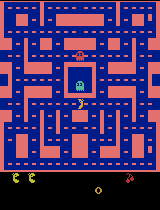

  Episode 976/20000 | 624,000 decisions | 155,751 updates | 35.7 min
Episode 976/20000 | score 410 | recent mean 864.4 | exploration 15%
  Episode 977/20000 | 624,500 decisions | 155,876 updates | 35.8 min
  Episode 977/20000 | 625,000 decisions | 156,001 updates | 35.8 min
Episode 977/20000 | score 1970 | recent mean 924.0 | exploration 15%
  Episode 978/20000 | 625,500 decisions | 156,126 updates | 35.8 min
  Episode 978/20000 | 626,000 decisions | 156,251 updates | 35.8 min
Episode 978/20000 | score 850 | recent mean 927.6 | exploration 15%
  Episode 979/20000 | 626,500 decisions | 156,376 updates | 35.9 min
Episode 979/20000 | score 1260 | recent mean 940.8 | exploration 15%
  Episode 980/20000 | 627,000 decisions | 156,501 updates | 35.9 min
  Episode 980/20000 | 627,500 decisions | 156,626 updates | 35.9 min
Episode 980/20000 | score 930 | recent mean 958.4 | exploration 15%
  Episode 981/20000 | 628,000 decisions | 156,751 updates | 35.9 min
Episode 981/20000 | score 780 | recen

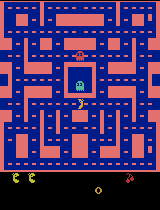

  Episode 1001/20000 | 641,500 decisions | 160,126 updates | 36.7 min
  Episode 1001/20000 | 642,000 decisions | 160,251 updates | 36.7 min
Episode 1001/20000 | score 790 | recent mean 1055.2 | exploration 15%
  Episode 1002/20000 | 642,500 decisions | 160,376 updates | 36.8 min
Episode 1002/20000 | score 2530 | recent mean 1077.6 | exploration 15%
  Episode 1003/20000 | 643,000 decisions | 160,501 updates | 36.8 min
Episode 1003/20000 | score 1470 | recent mean 1102.4 | exploration 15%
  Episode 1004/20000 | 643,500 decisions | 160,626 updates | 36.8 min
  Episode 1004/20000 | 644,000 decisions | 160,751 updates | 36.8 min
Episode 1004/20000 | score 1510 | recent mean 1112.4 | exploration 15%
  Episode 1005/20000 | 644,500 decisions | 160,876 updates | 36.9 min
  Episode 1005/20000 | 645,000 decisions | 161,001 updates | 36.9 min
Episode 1005/20000 | score 1380 | recent mean 1130.4 | exploration 15%
  Episode 1006/20000 | 645,500 decisions | 161,126 updates | 36.9 min
Episode 1006/200

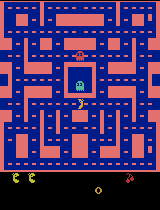

  Episode 1026/20000 | 658,500 decisions | 164,376 updates | 37.6 min
Episode 1026/20000 | score 500 | recent mean 1043.6 | exploration 15%
  Episode 1027/20000 | 659,000 decisions | 164,501 updates | 37.7 min
  Episode 1027/20000 | 659,500 decisions | 164,626 updates | 37.7 min
Episode 1027/20000 | score 760 | recent mean 972.8 | exploration 15%
  Episode 1028/20000 | 660,000 decisions | 164,751 updates | 37.7 min
Episode 1028/20000 | score 820 | recent mean 946.8 | exploration 15%
  Episode 1029/20000 | 660,500 decisions | 164,876 updates | 37.7 min
Episode 1029/20000 | score 1080 | recent mean 929.6 | exploration 15%
  Episode 1030/20000 | 661,000 decisions | 165,001 updates | 37.8 min
Episode 1030/20000 | score 500 | recent mean 894.4 | exploration 15%
  Episode 1031/20000 | 661,500 decisions | 165,126 updates | 37.8 min
  Episode 1031/20000 | 662,000 decisions | 165,251 updates | 37.8 min
Episode 1031/20000 | score 1400 | recent mean 906.8 | exploration 15%
  Episode 1032/20000 | 

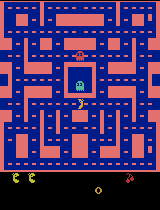

  Episode 1051/20000 | 675,000 decisions | 168,501 updates | 38.6 min
Episode 1051/20000 | score 550 | recent mean 910.8 | exploration 15%
  Episode 1052/20000 | 675,500 decisions | 168,626 updates | 38.6 min
  Episode 1052/20000 | 676,000 decisions | 168,751 updates | 38.6 min
Episode 1052/20000 | score 1310 | recent mean 932.8 | exploration 15%
  Episode 1053/20000 | 676,500 decisions | 168,876 updates | 38.6 min
Episode 1053/20000 | score 1040 | recent mean 941.6 | exploration 15%
  Episode 1054/20000 | 677,000 decisions | 169,001 updates | 38.7 min
Episode 1054/20000 | score 380 | recent mean 913.6 | exploration 15%
  Episode 1055/20000 | 677,500 decisions | 169,126 updates | 38.7 min
Episode 1055/20000 | score 670 | recent mean 920.4 | exploration 15%
  Episode 1056/20000 | 678,000 decisions | 169,251 updates | 38.7 min
Episode 1056/20000 | score 760 | recent mean 894.8 | exploration 15%
  Episode 1057/20000 | 678,500 decisions | 169,376 updates | 38.7 min
  Episode 1057/20000 | 6

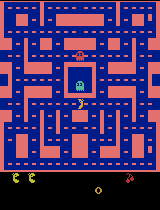

  Episode 1076/20000 | 691,000 decisions | 172,501 updates | 39.4 min
Episode 1076/20000 | score 470 | recent mean 886.8 | exploration 15%
  Episode 1077/20000 | 691,500 decisions | 172,626 updates | 39.5 min
Episode 1077/20000 | score 450 | recent mean 852.4 | exploration 15%
  Episode 1078/20000 | 692,000 decisions | 172,751 updates | 39.5 min
  Episode 1078/20000 | 692,500 decisions | 172,876 updates | 39.5 min
Episode 1078/20000 | score 980 | recent mean 850.0 | exploration 15%
  Episode 1079/20000 | 693,000 decisions | 173,001 updates | 39.6 min
  Episode 1079/20000 | 693,500 decisions | 173,126 updates | 39.6 min
Episode 1079/20000 | score 1240 | recent mean 884.4 | exploration 15%
  Episode 1080/20000 | 694,000 decisions | 173,251 updates | 39.6 min
Episode 1080/20000 | score 1240 | recent mean 907.2 | exploration 15%
  Episode 1081/20000 | 694,500 decisions | 173,376 updates | 39.6 min
Episode 1081/20000 | score 510 | recent mean 897.2 | exploration 15%
  Episode 1082/20000 | 6

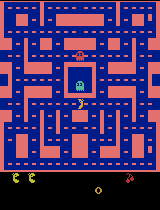

  Episode 1101/20000 | 708,500 decisions | 176,876 updates | 40.4 min
  Episode 1101/20000 | 709,000 decisions | 177,001 updates | 40.4 min
Episode 1101/20000 | score 820 | recent mean 1020.8 | exploration 15%
  Episode 1102/20000 | 709,500 decisions | 177,126 updates | 40.5 min
Episode 1102/20000 | score 410 | recent mean 1019.2 | exploration 15%
  Episode 1103/20000 | 710,000 decisions | 177,251 updates | 40.5 min
Episode 1103/20000 | score 560 | recent mean 1002.4 | exploration 15%
  Episode 1104/20000 | 710,500 decisions | 177,376 updates | 40.5 min
  Episode 1104/20000 | 711,000 decisions | 177,501 updates | 40.6 min
Episode 1104/20000 | score 1370 | recent mean 1007.6 | exploration 15%
  Episode 1105/20000 | 711,500 decisions | 177,626 updates | 40.6 min
Episode 1105/20000 | score 1100 | recent mean 1002.0 | exploration 15%
  Episode 1106/20000 | 712,000 decisions | 177,751 updates | 40.6 min
Episode 1106/20000 | score 1400 | recent mean 1037.6 | exploration 15%
  Episode 1107/20

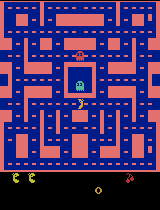

  Episode 1126/20000 | 724,000 decisions | 180,751 updates | 41.3 min
  Episode 1126/20000 | 724,500 decisions | 180,876 updates | 41.3 min
Episode 1126/20000 | score 1070 | recent mean 852.4 | exploration 15%
Episode 1127/20000 | score 520 | recent mean 856.8 | exploration 15%
  Episode 1128/20000 | 725,000 decisions | 181,001 updates | 41.4 min
  Episode 1128/20000 | 725,500 decisions | 181,126 updates | 41.4 min
Episode 1128/20000 | score 950 | recent mean 872.4 | exploration 15%
  Episode 1129/20000 | 726,000 decisions | 181,251 updates | 41.4 min
Episode 1129/20000 | score 410 | recent mean 834.0 | exploration 15%
  Episode 1130/20000 | 726,500 decisions | 181,376 updates | 41.4 min
Episode 1130/20000 | score 1690 | recent mean 857.6 | exploration 15%
  Episode 1131/20000 | 727,000 decisions | 181,501 updates | 41.5 min
Episode 1131/20000 | score 1320 | recent mean 854.4 | exploration 15%
  Episode 1132/20000 | 727,500 decisions | 181,626 updates | 41.5 min
  Episode 1132/20000 | 

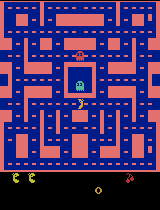

  Episode 1151/20000 | 740,500 decisions | 184,876 updates | 42.2 min
  Episode 1151/20000 | 741,000 decisions | 185,001 updates | 42.3 min
Episode 1151/20000 | score 1140 | recent mean 1026.8 | exploration 15%
  Episode 1152/20000 | 741,500 decisions | 185,126 updates | 42.3 min
Episode 1152/20000 | score 880 | recent mean 1041.2 | exploration 15%
  Episode 1153/20000 | 742,000 decisions | 185,251 updates | 42.3 min
Episode 1153/20000 | score 870 | recent mean 1038.0 | exploration 15%
  Episode 1154/20000 | 742,500 decisions | 185,376 updates | 42.3 min
  Episode 1154/20000 | 743,000 decisions | 185,501 updates | 42.4 min
Episode 1154/20000 | score 770 | recent mean 1052.4 | exploration 15%
  Episode 1155/20000 | 743,500 decisions | 185,626 updates | 42.4 min
Episode 1155/20000 | score 450 | recent mean 1002.8 | exploration 15%
  Episode 1156/20000 | 744,000 decisions | 185,751 updates | 42.4 min
Episode 1156/20000 | score 960 | recent mean 988.4 | exploration 15%
  Episode 1157/20000

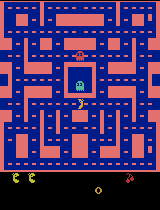

  Episode 1176/20000 | 757,500 decisions | 189,126 updates | 43.2 min
Episode 1176/20000 | score 860 | recent mean 1039.2 | exploration 15%
  Episode 1177/20000 | 758,000 decisions | 189,251 updates | 43.2 min
Episode 1177/20000 | score 600 | recent mean 1028.0 | exploration 15%
  Episode 1178/20000 | 758,500 decisions | 189,376 updates | 43.2 min
  Episode 1178/20000 | 759,000 decisions | 189,501 updates | 43.3 min
Episode 1178/20000 | score 960 | recent mean 1031.6 | exploration 15%
  Episode 1179/20000 | 759,500 decisions | 189,626 updates | 43.3 min
Episode 1179/20000 | score 1180 | recent mean 1048.0 | exploration 15%
  Episode 1180/20000 | 760,000 decisions | 189,751 updates | 43.3 min
  Episode 1180/20000 | 760,500 decisions | 189,876 updates | 43.4 min
Episode 1180/20000 | score 1000 | recent mean 1070.0 | exploration 15%
  Episode 1181/20000 | 761,000 decisions | 190,001 updates | 43.4 min
Episode 1181/20000 | score 1360 | recent mean 1086.0 | exploration 15%
  Episode 1182/20

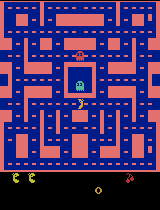

  Episode 1201/20000 | 775,000 decisions | 193,501 updates | 44.2 min
Episode 1201/20000 | score 2320 | recent mean 1069.2 | exploration 15%
  Episode 1202/20000 | 775,500 decisions | 193,626 updates | 44.2 min
Episode 1202/20000 | score 740 | recent mean 1074.8 | exploration 15%
  Episode 1203/20000 | 776,000 decisions | 193,751 updates | 44.2 min
Episode 1203/20000 | score 1040 | recent mean 1078.0 | exploration 15%
  Episode 1204/20000 | 776,500 decisions | 193,876 updates | 44.2 min
  Episode 1204/20000 | 777,000 decisions | 194,001 updates | 44.3 min
Episode 1204/20000 | score 1120 | recent mean 1075.6 | exploration 15%
  Episode 1205/20000 | 777,500 decisions | 194,126 updates | 44.3 min
  Episode 1205/20000 | 778,000 decisions | 194,251 updates | 44.3 min
Episode 1205/20000 | score 1350 | recent mean 1089.6 | exploration 15%
  Episode 1206/20000 | 778,500 decisions | 194,376 updates | 44.4 min
Episode 1206/20000 | score 1030 | recent mean 1076.4 | exploration 15%
  Episode 1207/

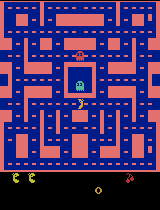

  Episode 1226/20000 | 793,500 decisions | 198,126 updates | 45.2 min
Episode 1226/20000 | score 1060 | recent mean 1108.4 | exploration 15%
  Episode 1227/20000 | 794,000 decisions | 198,251 updates | 45.2 min
  Episode 1227/20000 | 794,500 decisions | 198,376 updates | 45.2 min
Episode 1227/20000 | score 1270 | recent mean 1129.6 | exploration 15%
  Episode 1228/20000 | 795,000 decisions | 198,501 updates | 45.3 min
Episode 1228/20000 | score 920 | recent mean 1124.8 | exploration 15%
  Episode 1229/20000 | 795,500 decisions | 198,626 updates | 45.3 min
  Episode 1229/20000 | 796,000 decisions | 198,751 updates | 45.3 min
Episode 1229/20000 | score 1510 | recent mean 1140.4 | exploration 15%
  Episode 1230/20000 | 796,500 decisions | 198,876 updates | 45.3 min
Episode 1230/20000 | score 880 | recent mean 1121.6 | exploration 15%
  Episode 1231/20000 | 797,000 decisions | 199,001 updates | 45.4 min
  Episode 1231/20000 | 797,500 decisions | 199,126 updates | 45.4 min
Episode 1231/2000

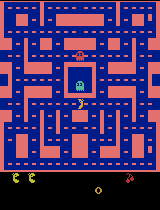

  Episode 1251/20000 | 811,000 decisions | 202,501 updates | 46.1 min
Episode 1251/20000 | score 1210 | recent mean 1051.2 | exploration 15%
  Episode 1252/20000 | 811,500 decisions | 202,626 updates | 46.2 min
Episode 1252/20000 | score 770 | recent mean 1031.2 | exploration 15%
  Episode 1253/20000 | 812,000 decisions | 202,751 updates | 46.2 min
Episode 1253/20000 | score 370 | recent mean 1009.2 | exploration 15%
  Episode 1254/20000 | 812,500 decisions | 202,876 updates | 46.2 min
Episode 1254/20000 | score 750 | recent mean 978.8 | exploration 15%
  Episode 1255/20000 | 813,000 decisions | 203,001 updates | 46.3 min
  Episode 1255/20000 | 813,500 decisions | 203,126 updates | 46.3 min
Episode 1255/20000 | score 1490 | recent mean 1003.2 | exploration 15%
  Episode 1256/20000 | 814,000 decisions | 203,251 updates | 46.3 min
  Episode 1256/20000 | 814,500 decisions | 203,376 updates | 46.3 min
Episode 1256/20000 | score 1250 | recent mean 1003.2 | exploration 15%
  Episode 1257/200

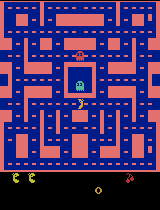

  Episode 1276/20000 | 828,500 decisions | 206,876 updates | 47.1 min
  Episode 1276/20000 | 829,000 decisions | 207,001 updates | 47.1 min
Episode 1276/20000 | score 800 | recent mean 1051.6 | exploration 15%
  Episode 1277/20000 | 829,500 decisions | 207,126 updates | 47.2 min
Episode 1277/20000 | score 540 | recent mean 1042.4 | exploration 15%
  Episode 1278/20000 | 830,000 decisions | 207,251 updates | 47.2 min
Episode 1278/20000 | score 370 | recent mean 1042.4 | exploration 15%
  Episode 1279/20000 | 830,500 decisions | 207,376 updates | 47.2 min
  Episode 1279/20000 | 831,000 decisions | 207,501 updates | 47.2 min
Episode 1279/20000 | score 930 | recent mean 1049.6 | exploration 15%
  Episode 1280/20000 | 831,500 decisions | 207,626 updates | 47.3 min
Episode 1280/20000 | score 890 | recent mean 1025.6 | exploration 15%
  Episode 1281/20000 | 832,000 decisions | 207,751 updates | 47.3 min
Episode 1281/20000 | score 1480 | recent mean 1034.8 | exploration 15%
  Episode 1282/2000

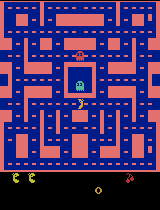

  Episode 1301/20000 | 846,500 decisions | 211,376 updates | 48.1 min
Episode 1301/20000 | score 850 | recent mean 1023.2 | exploration 15%
  Episode 1302/20000 | 847,000 decisions | 211,501 updates | 48.1 min
Episode 1302/20000 | score 370 | recent mean 1016.4 | exploration 15%
  Episode 1303/20000 | 847,500 decisions | 211,626 updates | 48.2 min
Episode 1303/20000 | score 940 | recent mean 1039.2 | exploration 15%
  Episode 1304/20000 | 848,000 decisions | 211,751 updates | 48.2 min
  Episode 1304/20000 | 848,500 decisions | 211,876 updates | 48.2 min
Episode 1304/20000 | score 830 | recent mean 1035.2 | exploration 15%
  Episode 1305/20000 | 849,000 decisions | 212,001 updates | 48.2 min
Episode 1305/20000 | score 900 | recent mean 1035.6 | exploration 15%
  Episode 1306/20000 | 849,500 decisions | 212,126 updates | 48.3 min
Episode 1306/20000 | score 1040 | recent mean 1018.0 | exploration 15%
  Episode 1307/20000 | 850,000 decisions | 212,251 updates | 48.3 min
Episode 1307/20000 

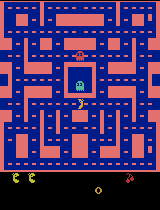

  Episode 1326/20000 | 864,000 decisions | 215,751 updates | 49.1 min
  Episode 1326/20000 | 864,500 decisions | 215,876 updates | 49.1 min
Episode 1326/20000 | score 1180 | recent mean 1213.2 | exploration 15%
  Episode 1327/20000 | 865,000 decisions | 216,001 updates | 49.1 min
Episode 1327/20000 | score 1300 | recent mean 1250.4 | exploration 15%
  Episode 1328/20000 | 865,500 decisions | 216,126 updates | 49.2 min
  Episode 1328/20000 | 866,000 decisions | 216,251 updates | 49.2 min
Episode 1328/20000 | score 1320 | recent mean 1265.6 | exploration 15%
  Episode 1329/20000 | 866,500 decisions | 216,376 updates | 49.2 min
Episode 1329/20000 | score 850 | recent mean 1266.4 | exploration 15%
  Episode 1330/20000 | 867,000 decisions | 216,501 updates | 49.2 min
Episode 1330/20000 | score 520 | recent mean 1251.2 | exploration 15%
  Episode 1331/20000 | 867,500 decisions | 216,626 updates | 49.3 min
Episode 1331/20000 | score 810 | recent mean 1242.0 | exploration 15%
  Episode 1332/20

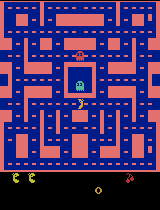

  Episode 1351/20000 | 882,500 decisions | 220,376 updates | 50.1 min
Episode 1351/20000 | score 1010 | recent mean 1080.0 | exploration 15%
  Episode 1352/20000 | 883,000 decisions | 220,501 updates | 50.2 min
  Episode 1352/20000 | 883,500 decisions | 220,626 updates | 50.2 min
Episode 1352/20000 | score 1270 | recent mean 1078.8 | exploration 15%
  Episode 1353/20000 | 884,000 decisions | 220,751 updates | 50.2 min
  Episode 1353/20000 | 884,500 decisions | 220,876 updates | 50.2 min
Episode 1353/20000 | score 1730 | recent mean 1095.2 | exploration 15%
  Episode 1354/20000 | 885,000 decisions | 221,001 updates | 50.3 min
Episode 1354/20000 | score 930 | recent mean 1098.4 | exploration 15%
  Episode 1355/20000 | 885,500 decisions | 221,126 updates | 50.3 min
  Episode 1355/20000 | 886,000 decisions | 221,251 updates | 50.3 min
Episode 1355/20000 | score 1590 | recent mean 1141.2 | exploration 15%
  Episode 1356/20000 | 886,500 decisions | 221,376 updates | 50.4 min
Episode 1356/200

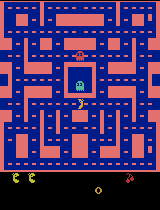

  Episode 1376/20000 | 902,500 decisions | 225,376 updates | 51.3 min
  Episode 1376/20000 | 903,000 decisions | 225,501 updates | 51.3 min
Episode 1376/20000 | score 1210 | recent mean 1312.8 | exploration 15%
  Episode 1377/20000 | 903,500 decisions | 225,626 updates | 51.3 min
Episode 1377/20000 | score 960 | recent mean 1300.4 | exploration 15%
  Episode 1378/20000 | 904,000 decisions | 225,751 updates | 51.4 min
Episode 1378/20000 | score 950 | recent mean 1269.2 | exploration 15%
  Episode 1379/20000 | 904,500 decisions | 225,876 updates | 51.4 min
  Episode 1379/20000 | 905,000 decisions | 226,001 updates | 51.4 min
Episode 1379/20000 | score 940 | recent mean 1269.6 | exploration 15%
  Episode 1380/20000 | 905,500 decisions | 226,126 updates | 51.4 min
Episode 1380/20000 | score 1000 | recent mean 1246.0 | exploration 15%
  Episode 1381/20000 | 906,000 decisions | 226,251 updates | 51.5 min
  Episode 1381/20000 | 906,500 decisions | 226,376 updates | 51.5 min
Episode 1381/20000

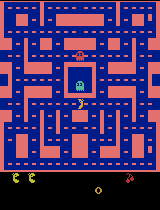

  Episode 1401/20000 | 920,000 decisions | 229,751 updates | 52.3 min
Episode 1401/20000 | score 1210 | recent mean 1028.8 | exploration 15%
  Episode 1402/20000 | 920,500 decisions | 229,876 updates | 52.3 min
Episode 1402/20000 | score 660 | recent mean 1016.8 | exploration 15%
  Episode 1403/20000 | 921,000 decisions | 230,001 updates | 52.3 min
Episode 1403/20000 | score 510 | recent mean 999.2 | exploration 15%
  Episode 1404/20000 | 921,500 decisions | 230,126 updates | 52.4 min
  Episode 1404/20000 | 922,000 decisions | 230,251 updates | 52.4 min
Episode 1404/20000 | score 1240 | recent mean 1011.2 | exploration 15%
  Episode 1405/20000 | 922,500 decisions | 230,376 updates | 52.4 min
Episode 1405/20000 | score 680 | recent mean 998.4 | exploration 15%
  Episode 1406/20000 | 923,000 decisions | 230,501 updates | 52.5 min
Episode 1406/20000 | score 710 | recent mean 984.0 | exploration 15%
  Episode 1407/20000 | 923,500 decisions | 230,626 updates | 52.5 min
  Episode 1407/20000 

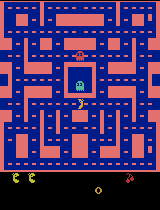

  Episode 1426/20000 | 937,500 decisions | 234,126 updates | 53.3 min
Episode 1426/20000 | score 750 | recent mean 1024.4 | exploration 15%
  Episode 1427/20000 | 938,000 decisions | 234,251 updates | 53.3 min
Episode 1427/20000 | score 1310 | recent mean 1050.4 | exploration 15%
  Episode 1428/20000 | 938,500 decisions | 234,376 updates | 53.3 min
  Episode 1428/20000 | 939,000 decisions | 234,501 updates | 53.4 min
Episode 1428/20000 | score 850 | recent mean 1064.0 | exploration 15%
  Episode 1429/20000 | 939,500 decisions | 234,626 updates | 53.4 min
Episode 1429/20000 | score 880 | recent mean 1049.6 | exploration 15%
  Episode 1430/20000 | 940,000 decisions | 234,751 updates | 53.4 min
Episode 1430/20000 | score 540 | recent mean 1044.0 | exploration 15%
  Episode 1431/20000 | 940,500 decisions | 234,876 updates | 53.4 min
Episode 1431/20000 | score 510 | recent mean 1036.0 | exploration 15%
  Episode 1432/20000 | 941,000 decisions | 235,001 updates | 53.5 min
  Episode 1432/2000

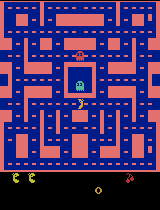

  Episode 1451/20000 | 955,000 decisions | 238,501 updates | 54.3 min
Episode 1451/20000 | score 1120 | recent mean 1051.2 | exploration 15%
  Episode 1452/20000 | 955,500 decisions | 238,626 updates | 54.3 min
  Episode 1452/20000 | 956,000 decisions | 238,751 updates | 54.3 min
Episode 1452/20000 | score 1190 | recent mean 1046.4 | exploration 15%
  Episode 1453/20000 | 956,500 decisions | 238,876 updates | 54.3 min
Episode 1453/20000 | score 980 | recent mean 1051.6 | exploration 15%
  Episode 1454/20000 | 957,000 decisions | 239,001 updates | 54.4 min
  Episode 1454/20000 | 957,500 decisions | 239,126 updates | 54.4 min
Episode 1454/20000 | score 1280 | recent mean 1067.6 | exploration 15%
  Episode 1455/20000 | 958,000 decisions | 239,251 updates | 54.4 min
Episode 1455/20000 | score 1510 | recent mean 1106.4 | exploration 15%
  Episode 1456/20000 | 958,500 decisions | 239,376 updates | 54.5 min
  Episode 1456/20000 | 959,000 decisions | 239,501 updates | 54.5 min
Episode 1456/200

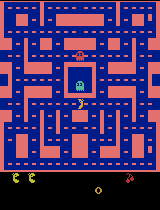

  Episode 1476/20000 | 973,000 decisions | 243,001 updates | 55.3 min
Episode 1476/20000 | score 780 | recent mean 1052.8 | exploration 15%
  Episode 1477/20000 | 973,500 decisions | 243,126 updates | 55.4 min
  Episode 1477/20000 | 974,000 decisions | 243,251 updates | 55.4 min
Episode 1477/20000 | score 1190 | recent mean 1052.8 | exploration 15%
  Episode 1478/20000 | 974,500 decisions | 243,376 updates | 55.4 min
Episode 1478/20000 | score 790 | recent mean 1045.2 | exploration 15%
  Episode 1479/20000 | 975,000 decisions | 243,501 updates | 55.4 min
  Episode 1479/20000 | 975,500 decisions | 243,626 updates | 55.5 min
Episode 1479/20000 | score 1160 | recent mean 1040.4 | exploration 15%
  Episode 1480/20000 | 976,000 decisions | 243,751 updates | 55.5 min
Episode 1480/20000 | score 460 | recent mean 998.4 | exploration 15%
  Episode 1481/20000 | 976,500 decisions | 243,876 updates | 55.5 min
Episode 1481/20000 | score 630 | recent mean 985.6 | exploration 15%
  Episode 1482/20000

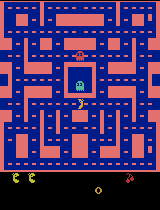

  Episode 1501/20000 | 992,000 decisions | 247,751 updates | 56.5 min
  Episode 1501/20000 | 992,500 decisions | 247,876 updates | 56.5 min
Episode 1501/20000 | score 1280 | recent mean 1344.8 | exploration 15%
  Episode 1502/20000 | 993,000 decisions | 248,001 updates | 56.6 min
Episode 1502/20000 | score 1660 | recent mean 1363.6 | exploration 15%
  Episode 1503/20000 | 993,500 decisions | 248,126 updates | 56.6 min
Episode 1503/20000 | score 620 | recent mean 1356.8 | exploration 15%
  Episode 1504/20000 | 994,000 decisions | 248,251 updates | 56.6 min
Episode 1504/20000 | score 1110 | recent mean 1354.8 | exploration 15%
  Episode 1505/20000 | 994,500 decisions | 248,376 updates | 56.6 min
  Episode 1505/20000 | 995,000 decisions | 248,501 updates | 56.7 min
Episode 1505/20000 | score 900 | recent mean 1372.4 | exploration 15%
  Episode 1506/20000 | 995,500 decisions | 248,626 updates | 56.7 min
  Episode 1506/20000 | 996,000 decisions | 248,751 updates | 56.7 min
Episode 1506/2000

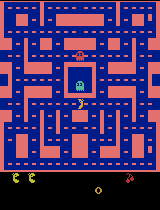

  Episode 1526/20000 | 1,009,500 decisions | 252,126 updates | 57.6 min
Episode 1526/20000 | score 770 | recent mean 1000.8 | exploration 15%
  Episode 1527/20000 | 1,010,000 decisions | 252,251 updates | 57.6 min
  Episode 1527/20000 | 1,010,500 decisions | 252,376 updates | 57.6 min
Episode 1527/20000 | score 940 | recent mean 972.0 | exploration 15%
  Episode 1528/20000 | 1,011,000 decisions | 252,501 updates | 57.7 min
Episode 1528/20000 | score 660 | recent mean 973.6 | exploration 15%
  Episode 1529/20000 | 1,011,500 decisions | 252,626 updates | 57.7 min
Episode 1529/20000 | score 1160 | recent mean 975.6 | exploration 15%
  Episode 1530/20000 | 1,012,000 decisions | 252,751 updates | 57.7 min
Episode 1530/20000 | score 1130 | recent mean 984.8 | exploration 15%
  Episode 1531/20000 | 1,012,500 decisions | 252,876 updates | 57.8 min
Episode 1531/20000 | score 460 | recent mean 969.6 | exploration 15%
  Episode 1532/20000 | 1,013,000 decisions | 253,001 updates | 57.8 min
  Episo

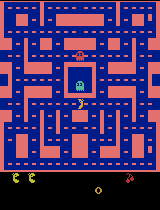

  Episode 1551/20000 | 1,025,500 decisions | 256,126 updates | 58.6 min
  Episode 1551/20000 | 1,026,000 decisions | 256,251 updates | 58.6 min
Episode 1551/20000 | score 1090 | recent mean 979.6 | exploration 15%
  Episode 1552/20000 | 1,026,500 decisions | 256,376 updates | 58.6 min
Episode 1552/20000 | score 2600 | recent mean 1046.0 | exploration 15%
  Episode 1553/20000 | 1,027,000 decisions | 256,501 updates | 58.6 min
  Episode 1553/20000 | 1,027,500 decisions | 256,626 updates | 58.7 min
Episode 1553/20000 | score 1000 | recent mean 1059.6 | exploration 15%
  Episode 1554/20000 | 1,028,000 decisions | 256,751 updates | 58.7 min
Episode 1554/20000 | score 2360 | recent mean 1107.6 | exploration 15%
  Episode 1555/20000 | 1,028,500 decisions | 256,876 updates | 58.7 min
  Episode 1555/20000 | 1,029,000 decisions | 257,001 updates | 58.8 min
Episode 1555/20000 | score 1000 | recent mean 1102.4 | exploration 15%
  Episode 1556/20000 | 1,029,500 decisions | 257,126 updates | 58.8 mi

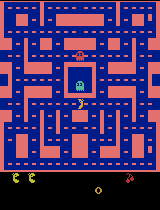

  Episode 1576/20000 | 1,043,500 decisions | 260,626 updates | 59.6 min
  Episode 1576/20000 | 1,044,000 decisions | 260,751 updates | 59.7 min
Episode 1576/20000 | score 1010 | recent mean 1248.4 | exploration 15%
  Episode 1577/20000 | 1,044,500 decisions | 260,876 updates | 59.7 min
Episode 1577/20000 | score 810 | recent mean 1176.8 | exploration 15%
  Episode 1578/20000 | 1,045,000 decisions | 261,001 updates | 59.7 min
Episode 1578/20000 | score 730 | recent mean 1166.0 | exploration 15%
  Episode 1579/20000 | 1,045,500 decisions | 261,126 updates | 59.8 min
  Episode 1579/20000 | 1,046,000 decisions | 261,251 updates | 59.8 min
Episode 1579/20000 | score 2010 | recent mean 1152.0 | exploration 15%
  Episode 1580/20000 | 1,046,500 decisions | 261,376 updates | 59.8 min
  Episode 1580/20000 | 1,047,000 decisions | 261,501 updates | 59.9 min
Episode 1580/20000 | score 970 | recent mean 1150.8 | exploration 15%
  Episode 1581/20000 | 1,047,500 decisions | 261,626 updates | 59.9 min


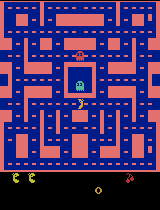

  Episode 1601/20000 | 1,062,000 decisions | 265,251 updates | 60.8 min
  Episode 1601/20000 | 1,062,500 decisions | 265,376 updates | 60.8 min
Episode 1601/20000 | score 1750 | recent mean 1342.8 | exploration 15%
  Episode 1602/20000 | 1,063,000 decisions | 265,501 updates | 60.8 min
Episode 1602/20000 | score 3980 | recent mean 1469.6 | exploration 15%
  Episode 1603/20000 | 1,063,500 decisions | 265,626 updates | 60.9 min
  Episode 1603/20000 | 1,064,000 decisions | 265,751 updates | 60.9 min
Episode 1603/20000 | score 1230 | recent mean 1489.6 | exploration 15%
  Episode 1604/20000 | 1,064,500 decisions | 265,876 updates | 60.9 min
Episode 1604/20000 | score 880 | recent mean 1444.4 | exploration 15%
  Episode 1605/20000 | 1,065,000 decisions | 266,001 updates | 61.0 min
  Episode 1605/20000 | 1,065,500 decisions | 266,126 updates | 61.0 min
Episode 1605/20000 | score 1460 | recent mean 1464.0 | exploration 15%
  Episode 1606/20000 | 1,066,000 decisions | 266,251 updates | 61.0 mi

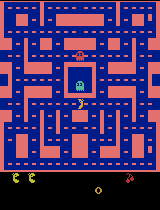

  Episode 1626/20000 | 1,080,000 decisions | 269,751 updates | 61.9 min
Episode 1626/20000 | score 390 | recent mean 1205.6 | exploration 15%
  Episode 1627/20000 | 1,080,500 decisions | 269,876 updates | 61.9 min
Episode 1627/20000 | score 1050 | recent mean 1088.4 | exploration 15%
  Episode 1628/20000 | 1,081,000 decisions | 270,001 updates | 61.9 min
Episode 1628/20000 | score 910 | recent mean 1075.6 | exploration 15%
  Episode 1629/20000 | 1,081,500 decisions | 270,126 updates | 61.9 min
Episode 1629/20000 | score 1300 | recent mean 1092.4 | exploration 15%
  Episode 1630/20000 | 1,082,000 decisions | 270,251 updates | 62.0 min
  Episode 1630/20000 | 1,082,500 decisions | 270,376 updates | 62.0 min
Episode 1630/20000 | score 700 | recent mean 1062.0 | exploration 15%
  Episode 1631/20000 | 1,083,000 decisions | 270,501 updates | 62.0 min
  Episode 1631/20000 | 1,083,500 decisions | 270,626 updates | 62.1 min
Episode 1631/20000 | score 1510 | recent mean 1086.8 | exploration 15%
 

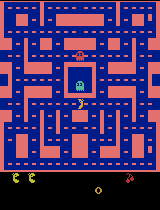

  Episode 1651/20000 | 1,096,500 decisions | 273,876 updates | 62.9 min
  Episode 1651/20000 | 1,097,000 decisions | 274,001 updates | 62.9 min
Episode 1651/20000 | score 1850 | recent mean 1040.0 | exploration 15%
  Episode 1652/20000 | 1,097,500 decisions | 274,126 updates | 62.9 min
  Episode 1652/20000 | 1,098,000 decisions | 274,251 updates | 63.0 min
Episode 1652/20000 | score 1330 | recent mean 1051.2 | exploration 15%
  Episode 1653/20000 | 1,098,500 decisions | 274,376 updates | 63.0 min
  Episode 1653/20000 | 1,099,000 decisions | 274,501 updates | 63.0 min
Episode 1653/20000 | score 1170 | recent mean 1061.6 | exploration 15%
  Episode 1654/20000 | 1,099,500 decisions | 274,626 updates | 63.0 min
Episode 1654/20000 | score 500 | recent mean 1029.6 | exploration 15%
  Episode 1655/20000 | 1,100,000 decisions | 274,751 updates | 63.1 min
Episode 1655/20000 | score 1790 | recent mean 1073.2 | exploration 15%
  Episode 1656/20000 | 1,100,500 decisions | 274,876 updates | 63.1 mi

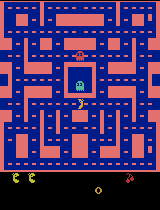

  Episode 1676/20000 | 1,115,500 decisions | 278,626 updates | 64.0 min
  Episode 1676/20000 | 1,116,000 decisions | 278,751 updates | 64.0 min
Episode 1676/20000 | score 1250 | recent mean 1151.6 | exploration 15%
  Episode 1677/20000 | 1,116,500 decisions | 278,876 updates | 64.1 min
Episode 1677/20000 | score 710 | recent mean 1126.8 | exploration 15%
  Episode 1678/20000 | 1,117,000 decisions | 279,001 updates | 64.1 min
Episode 1678/20000 | score 470 | recent mean 1098.8 | exploration 15%
  Episode 1679/20000 | 1,117,500 decisions | 279,126 updates | 64.1 min
Episode 1679/20000 | score 610 | recent mean 1103.2 | exploration 15%
  Episode 1680/20000 | 1,118,000 decisions | 279,251 updates | 64.1 min
  Episode 1680/20000 | 1,118,500 decisions | 279,376 updates | 64.2 min
Episode 1680/20000 | score 1120 | recent mean 1076.4 | exploration 15%
Episode 1681/20000 | score 500 | recent mean 1054.8 | exploration 15%
  Episode 1682/20000 | 1,119,000 decisions | 279,501 updates | 64.2 min
  

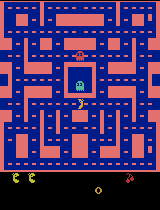

  Episode 1701/20000 | 1,133,500 decisions | 283,126 updates | 65.1 min
Episode 1701/20000 | score 1510 | recent mean 1136.4 | exploration 15%
  Episode 1702/20000 | 1,134,000 decisions | 283,251 updates | 65.1 min
  Episode 1702/20000 | 1,134,500 decisions | 283,376 updates | 65.1 min
Episode 1702/20000 | score 1320 | recent mean 1160.8 | exploration 15%
  Episode 1703/20000 | 1,135,000 decisions | 283,501 updates | 65.2 min
Episode 1703/20000 | score 1620 | recent mean 1206.8 | exploration 15%
  Episode 1704/20000 | 1,135,500 decisions | 283,626 updates | 65.2 min
  Episode 1704/20000 | 1,136,000 decisions | 283,751 updates | 65.2 min
Episode 1704/20000 | score 1430 | recent mean 1239.6 | exploration 15%
  Episode 1705/20000 | 1,136,500 decisions | 283,876 updates | 65.2 min
  Episode 1705/20000 | 1,137,000 decisions | 284,001 updates | 65.3 min
Episode 1705/20000 | score 1290 | recent mean 1246.4 | exploration 15%
  Episode 1706/20000 | 1,137,500 decisions | 284,126 updates | 65.3 m

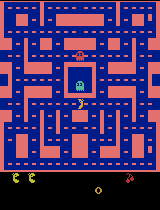

  Episode 1726/20000 | 1,152,500 decisions | 287,876 updates | 66.2 min
Episode 1726/20000 | score 1020 | recent mean 1247.2 | exploration 15%
  Episode 1727/20000 | 1,153,000 decisions | 288,001 updates | 66.3 min
Episode 1727/20000 | score 550 | recent mean 1216.4 | exploration 15%
  Episode 1728/20000 | 1,153,500 decisions | 288,126 updates | 66.3 min
Episode 1728/20000 | score 690 | recent mean 1179.2 | exploration 15%
  Episode 1729/20000 | 1,154,000 decisions | 288,251 updates | 66.3 min
  Episode 1729/20000 | 1,154,500 decisions | 288,376 updates | 66.3 min
Episode 1729/20000 | score 800 | recent mean 1154.0 | exploration 15%
  Episode 1730/20000 | 1,155,000 decisions | 288,501 updates | 66.4 min
Episode 1730/20000 | score 1280 | recent mean 1153.6 | exploration 15%
  Episode 1731/20000 | 1,155,500 decisions | 288,626 updates | 66.4 min
  Episode 1731/20000 | 1,156,000 decisions | 288,751 updates | 66.4 min
Episode 1731/20000 | score 1260 | recent mean 1184.4 | exploration 15%
 

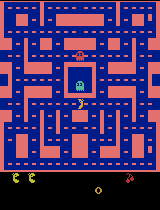

  Episode 1751/20000 | 1,169,500 decisions | 292,126 updates | 67.3 min
  Episode 1751/20000 | 1,170,000 decisions | 292,251 updates | 67.3 min
Episode 1751/20000 | score 1270 | recent mean 1069.2 | exploration 15%
  Episode 1752/20000 | 1,170,500 decisions | 292,376 updates | 67.3 min
Episode 1752/20000 | score 550 | recent mean 1069.2 | exploration 15%
  Episode 1753/20000 | 1,171,000 decisions | 292,501 updates | 67.3 min
  Episode 1753/20000 | 1,171,500 decisions | 292,626 updates | 67.4 min
Episode 1753/20000 | score 1290 | recent mean 1093.2 | exploration 15%
  Episode 1754/20000 | 1,172,000 decisions | 292,751 updates | 67.4 min
  Episode 1754/20000 | 1,172,500 decisions | 292,876 updates | 67.4 min
Episode 1754/20000 | score 1310 | recent mean 1113.6 | exploration 15%
  Episode 1755/20000 | 1,173,000 decisions | 293,001 updates | 67.5 min
Episode 1755/20000 | score 970 | recent mean 1101.2 | exploration 15%
  Episode 1756/20000 | 1,173,500 decisions | 293,126 updates | 67.5 min

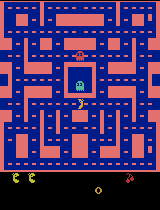

  Episode 1776/20000 | 1,188,500 decisions | 296,876 updates | 68.4 min
  Episode 1776/20000 | 1,189,000 decisions | 297,001 updates | 68.4 min
Episode 1776/20000 | score 2160 | recent mean 1078.4 | exploration 15%
  Episode 1777/20000 | 1,189,500 decisions | 297,126 updates | 68.5 min
Episode 1777/20000 | score 1160 | recent mean 1102.8 | exploration 15%
  Episode 1778/20000 | 1,190,000 decisions | 297,251 updates | 68.5 min
  Episode 1778/20000 | 1,190,500 decisions | 297,376 updates | 68.5 min
Episode 1778/20000 | score 930 | recent mean 1088.4 | exploration 15%
  Episode 1779/20000 | 1,191,000 decisions | 297,501 updates | 68.6 min
Episode 1779/20000 | score 660 | recent mean 1062.4 | exploration 15%
  Episode 1780/20000 | 1,191,500 decisions | 297,626 updates | 68.6 min
Episode 1780/20000 | score 860 | recent mean 1058.0 | exploration 15%
  Episode 1781/20000 | 1,192,000 decisions | 297,751 updates | 68.6 min
Episode 1781/20000 | score 750 | recent mean 1052.4 | exploration 15%
  

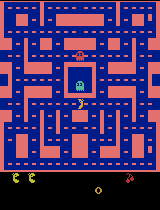

  Episode 1801/20000 | 1,205,500 decisions | 301,126 updates | 69.4 min
Episode 1801/20000 | score 1200 | recent mean 1081.2 | exploration 15%
  Episode 1802/20000 | 1,206,000 decisions | 301,251 updates | 69.5 min
  Episode 1802/20000 | 1,206,500 decisions | 301,376 updates | 69.5 min
Episode 1802/20000 | score 1900 | recent mean 1110.8 | exploration 15%
  Episode 1803/20000 | 1,207,000 decisions | 301,501 updates | 69.5 min
Episode 1803/20000 | score 1280 | recent mean 1124.8 | exploration 15%
  Episode 1804/20000 | 1,207,500 decisions | 301,626 updates | 69.6 min
  Episode 1804/20000 | 1,208,000 decisions | 301,751 updates | 69.6 min
Episode 1804/20000 | score 1650 | recent mean 1164.4 | exploration 15%
  Episode 1805/20000 | 1,208,500 decisions | 301,876 updates | 69.6 min
Episode 1805/20000 | score 580 | recent mean 1153.2 | exploration 15%
  Episode 1806/20000 | 1,209,000 decisions | 302,001 updates | 69.7 min
  Episode 1806/20000 | 1,209,500 decisions | 302,126 updates | 69.7 mi

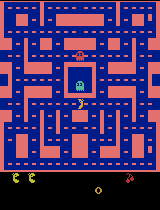

  Episode 1826/20000 | 1,224,000 decisions | 305,751 updates | 70.6 min
  Episode 1826/20000 | 1,224,500 decisions | 305,876 updates | 70.6 min
Episode 1826/20000 | score 3240 | recent mean 1238.0 | exploration 15%
  Episode 1827/20000 | 1,225,000 decisions | 306,001 updates | 70.6 min
Episode 1827/20000 | score 1120 | recent mean 1206.8 | exploration 15%
  Episode 1828/20000 | 1,225,500 decisions | 306,126 updates | 70.6 min
Episode 1828/20000 | score 890 | recent mean 1191.2 | exploration 15%
  Episode 1829/20000 | 1,226,000 decisions | 306,251 updates | 70.7 min
  Episode 1829/20000 | 1,226,500 decisions | 306,376 updates | 70.7 min
Episode 1829/20000 | score 2050 | recent mean 1207.2 | exploration 15%
  Episode 1830/20000 | 1,227,000 decisions | 306,501 updates | 70.7 min
Episode 1830/20000 | score 610 | recent mean 1208.4 | exploration 15%
  Episode 1831/20000 | 1,227,500 decisions | 306,626 updates | 70.8 min
Episode 1831/20000 | score 160 | recent mean 1168.4 | exploration 15%
 

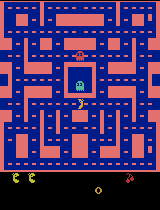

  Episode 1851/20000 | 1,240,500 decisions | 309,876 updates | 71.6 min
  Episode 1851/20000 | 1,241,000 decisions | 310,001 updates | 71.6 min
Episode 1851/20000 | score 1130 | recent mean 1038.4 | exploration 15%
  Episode 1852/20000 | 1,241,500 decisions | 310,126 updates | 71.6 min
Episode 1852/20000 | score 750 | recent mean 1023.6 | exploration 15%
  Episode 1853/20000 | 1,242,000 decisions | 310,251 updates | 71.6 min
  Episode 1853/20000 | 1,242,500 decisions | 310,376 updates | 71.7 min
Episode 1853/20000 | score 1780 | recent mean 1059.2 | exploration 15%
  Episode 1854/20000 | 1,243,000 decisions | 310,501 updates | 71.7 min
Episode 1854/20000 | score 810 | recent mean 1009.6 | exploration 15%
  Episode 1855/20000 | 1,243,500 decisions | 310,626 updates | 71.7 min
Episode 1855/20000 | score 740 | recent mean 1014.8 | exploration 15%
  Episode 1856/20000 | 1,244,000 decisions | 310,751 updates | 71.8 min
  Episode 1856/20000 | 1,244,500 decisions | 310,876 updates | 71.8 min


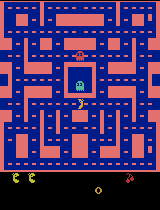

  Episode 1876/20000 | 1,260,000 decisions | 314,751 updates | 72.7 min
Episode 1876/20000 | score 800 | recent mean 1166.4 | exploration 15%
  Episode 1877/20000 | 1,260,500 decisions | 314,876 updates | 72.8 min
  Episode 1877/20000 | 1,261,000 decisions | 315,001 updates | 72.8 min
Episode 1877/20000 | score 1140 | recent mean 1182.0 | exploration 15%
  Episode 1878/20000 | 1,261,500 decisions | 315,126 updates | 72.8 min
  Episode 1878/20000 | 1,262,000 decisions | 315,251 updates | 72.9 min
  Episode 1878/20000 | 1,262,500 decisions | 315,376 updates | 72.9 min
Episode 1878/20000 | score 1380 | recent mean 1166.0 | exploration 15%
  Episode 1879/20000 | 1,263,000 decisions | 315,501 updates | 72.9 min
Episode 1879/20000 | score 1130 | recent mean 1178.8 | exploration 15%
  Episode 1880/20000 | 1,263,500 decisions | 315,626 updates | 72.9 min
  Episode 1880/20000 | 1,264,000 decisions | 315,751 updates | 73.0 min
Episode 1880/20000 | score 790 | recent mean 1180.8 | exploration 15%

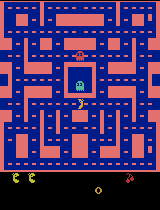

  Episode 1901/20000 | 1,278,500 decisions | 319,376 updates | 73.8 min
Episode 1901/20000 | score 600 | recent mean 1086.4 | exploration 15%
  Episode 1902/20000 | 1,279,000 decisions | 319,501 updates | 73.9 min
Episode 1902/20000 | score 730 | recent mean 1070.0 | exploration 15%
  Episode 1903/20000 | 1,279,500 decisions | 319,626 updates | 73.9 min
  Episode 1903/20000 | 1,280,000 decisions | 319,751 updates | 73.9 min
Episode 1903/20000 | score 1080 | recent mean 1058.0 | exploration 15%
  Episode 1904/20000 | 1,280,500 decisions | 319,876 updates | 74.0 min
Episode 1904/20000 | score 1040 | recent mean 1054.4 | exploration 15%
  Episode 1905/20000 | 1,281,000 decisions | 320,001 updates | 74.0 min
Episode 1905/20000 | score 740 | recent mean 1052.4 | exploration 15%
  Episode 1906/20000 | 1,281,500 decisions | 320,126 updates | 74.0 min
  Episode 1906/20000 | 1,282,000 decisions | 320,251 updates | 74.1 min
Episode 1906/20000 | score 2630 | recent mean 1133.2 | exploration 15%
 

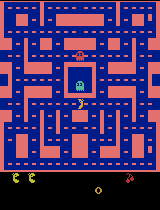

  Episode 1926/20000 | 1,296,500 decisions | 323,876 updates | 74.9 min
Episode 1926/20000 | score 1210 | recent mean 1203.6 | exploration 15%
  Episode 1927/20000 | 1,297,000 decisions | 324,001 updates | 75.0 min
  Episode 1927/20000 | 1,297,500 decisions | 324,126 updates | 75.0 min
Episode 1927/20000 | score 1240 | recent mean 1224.0 | exploration 15%
  Episode 1928/20000 | 1,298,000 decisions | 324,251 updates | 75.0 min
Episode 1928/20000 | score 1160 | recent mean 1227.2 | exploration 15%
  Episode 1929/20000 | 1,298,500 decisions | 324,376 updates | 75.0 min
Episode 1929/20000 | score 180 | recent mean 1192.8 | exploration 15%
  Episode 1930/20000 | 1,299,000 decisions | 324,501 updates | 75.1 min
  Episode 1930/20000 | 1,299,500 decisions | 324,626 updates | 75.1 min
Episode 1930/20000 | score 1340 | recent mean 1216.8 | exploration 15%
  Episode 1931/20000 | 1,300,000 decisions | 324,751 updates | 75.1 min
Episode 1931/20000 | score 780 | recent mean 1142.8 | exploration 15%


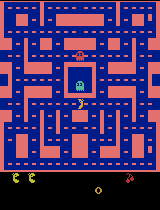

  Episode 1951/20000 | 1,314,000 decisions | 328,251 updates | 76.0 min
Episode 1951/20000 | score 580 | recent mean 1067.6 | exploration 15%
  Episode 1952/20000 | 1,314,500 decisions | 328,376 updates | 76.0 min
  Episode 1952/20000 | 1,315,000 decisions | 328,501 updates | 76.0 min
Episode 1952/20000 | score 2620 | recent mean 1122.8 | exploration 15%
  Episode 1953/20000 | 1,315,500 decisions | 328,626 updates | 76.1 min
  Episode 1953/20000 | 1,316,000 decisions | 328,751 updates | 76.1 min
Episode 1953/20000 | score 1440 | recent mean 1134.0 | exploration 15%
  Episode 1954/20000 | 1,316,500 decisions | 328,876 updates | 76.1 min
Episode 1954/20000 | score 1120 | recent mean 1171.6 | exploration 15%
  Episode 1955/20000 | 1,317,000 decisions | 329,001 updates | 76.2 min
  Episode 1955/20000 | 1,317,500 decisions | 329,126 updates | 76.2 min
Episode 1955/20000 | score 540 | recent mean 1139.6 | exploration 15%
  Episode 1956/20000 | 1,318,000 decisions | 329,251 updates | 76.2 min

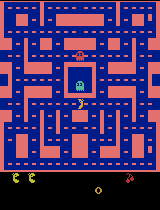

  Episode 1976/20000 | 1,333,500 decisions | 333,126 updates | 77.2 min
Episode 1976/20000 | score 760 | recent mean 1120.8 | exploration 15%
  Episode 1977/20000 | 1,334,000 decisions | 333,251 updates | 77.2 min
  Episode 1977/20000 | 1,334,500 decisions | 333,376 updates | 77.3 min
Episode 1977/20000 | score 720 | recent mean 1044.8 | exploration 15%
  Episode 1978/20000 | 1,335,000 decisions | 333,501 updates | 77.3 min
Episode 1978/20000 | score 1280 | recent mean 1038.4 | exploration 15%
  Episode 1979/20000 | 1,335,500 decisions | 333,626 updates | 77.3 min
Episode 1979/20000 | score 820 | recent mean 1026.4 | exploration 15%
  Episode 1980/20000 | 1,336,000 decisions | 333,751 updates | 77.4 min
  Episode 1980/20000 | 1,336,500 decisions | 333,876 updates | 77.4 min
Episode 1980/20000 | score 1680 | recent mean 1072.0 | exploration 15%
  Episode 1981/20000 | 1,337,000 decisions | 334,001 updates | 77.4 min
  Episode 1981/20000 | 1,337,500 decisions | 334,126 updates | 77.5 min


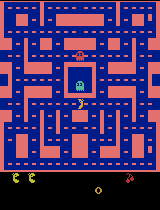

Episode 2001/20000 | score 450 | recent mean 1162.4 | exploration 15%
  Episode 2002/20000 | 1,352,500 decisions | 337,876 updates | 78.3 min
  Episode 2002/20000 | 1,353,000 decisions | 338,001 updates | 78.4 min
Episode 2002/20000 | score 910 | recent mean 1170.0 | exploration 15%
  Episode 2003/20000 | 1,353,500 decisions | 338,126 updates | 78.4 min
Episode 2003/20000 | score 1010 | recent mean 1159.2 | exploration 15%
  Episode 2004/20000 | 1,354,000 decisions | 338,251 updates | 78.4 min
  Episode 2004/20000 | 1,354,500 decisions | 338,376 updates | 78.5 min
Episode 2004/20000 | score 2290 | recent mean 1218.0 | exploration 15%
  Episode 2005/20000 | 1,355,000 decisions | 338,501 updates | 78.5 min
Episode 2005/20000 | score 1140 | recent mean 1196.4 | exploration 15%
  Episode 2006/20000 | 1,355,500 decisions | 338,626 updates | 78.5 min
  Episode 2006/20000 | 1,356,000 decisions | 338,751 updates | 78.6 min
Episode 2006/20000 | score 1070 | recent mean 1186.0 | exploration 15%


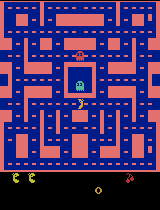

  Episode 2026/20000 | 1,371,000 decisions | 342,501 updates | 79.5 min
  Episode 2026/20000 | 1,371,500 decisions | 342,626 updates | 79.5 min
Episode 2026/20000 | score 1090 | recent mean 1278.8 | exploration 15%
  Episode 2027/20000 | 1,372,000 decisions | 342,751 updates | 79.5 min
Episode 2027/20000 | score 1360 | recent mean 1296.8 | exploration 15%
  Episode 2028/20000 | 1,372,500 decisions | 342,876 updates | 79.6 min
  Episode 2028/20000 | 1,373,000 decisions | 343,001 updates | 79.6 min
Episode 2028/20000 | score 2900 | recent mean 1372.4 | exploration 15%
  Episode 2029/20000 | 1,373,500 decisions | 343,126 updates | 79.6 min
  Episode 2029/20000 | 1,374,000 decisions | 343,251 updates | 79.6 min
  Episode 2029/20000 | 1,374,500 decisions | 343,376 updates | 79.7 min
Episode 2029/20000 | score 1340 | recent mean 1334.4 | exploration 15%
  Episode 2030/20000 | 1,375,000 decisions | 343,501 updates | 79.7 min
Episode 2030/20000 | score 710 | recent mean 1317.2 | exploration 15

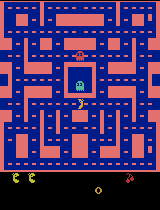

  Episode 2051/20000 | 1,389,500 decisions | 347,126 updates | 80.6 min
Episode 2051/20000 | score 760 | recent mean 1327.6 | exploration 15%
  Episode 2052/20000 | 1,390,000 decisions | 347,251 updates | 80.6 min
  Episode 2052/20000 | 1,390,500 decisions | 347,376 updates | 80.7 min
Episode 2052/20000 | score 1050 | recent mean 1315.2 | exploration 15%
  Episode 2053/20000 | 1,391,000 decisions | 347,501 updates | 80.7 min
  Episode 2053/20000 | 1,391,500 decisions | 347,626 updates | 80.7 min
Episode 2053/20000 | score 1200 | recent mean 1247.2 | exploration 15%
  Episode 2054/20000 | 1,392,000 decisions | 347,751 updates | 80.8 min
Episode 2054/20000 | score 1360 | recent mean 1248.0 | exploration 15%
  Episode 2055/20000 | 1,392,500 decisions | 347,876 updates | 80.8 min
Episode 2055/20000 | score 880 | recent mean 1254.8 | exploration 15%
  Episode 2056/20000 | 1,393,000 decisions | 348,001 updates | 80.8 min
Episode 2056/20000 | score 2350 | recent mean 1314.8 | exploration 15%


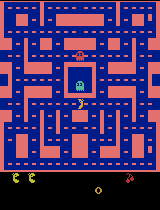

  Episode 2076/20000 | 1,410,000 decisions | 352,251 updates | 81.9 min
Episode 2076/20000 | score 2760 | recent mean 1412.8 | exploration 15%
  Episode 2077/20000 | 1,410,500 decisions | 352,376 updates | 81.9 min
Episode 2077/20000 | score 1120 | recent mean 1415.6 | exploration 15%
  Episode 2078/20000 | 1,411,000 decisions | 352,501 updates | 81.9 min
  Episode 2078/20000 | 1,411,500 decisions | 352,626 updates | 81.9 min
Episode 2078/20000 | score 940 | recent mean 1405.2 | exploration 15%
  Episode 2079/20000 | 1,412,000 decisions | 352,751 updates | 82.0 min
  Episode 2079/20000 | 1,412,500 decisions | 352,876 updates | 82.0 min
Episode 2079/20000 | score 1440 | recent mean 1408.4 | exploration 15%
Episode 2080/20000 | score 510 | recent mean 1393.6 | exploration 15%
  Episode 2081/20000 | 1,413,000 decisions | 353,001 updates | 82.0 min
  Episode 2081/20000 | 1,413,500 decisions | 353,126 updates | 82.1 min
Episode 2081/20000 | score 1040 | recent mean 1341.2 | exploration 15%


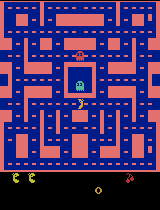

  Episode 2101/20000 | 1,427,500 decisions | 356,626 updates | 82.9 min
  Episode 2101/20000 | 1,428,000 decisions | 356,751 updates | 83.0 min
Episode 2101/20000 | score 1980 | recent mean 1130.4 | exploration 15%
  Episode 2102/20000 | 1,428,500 decisions | 356,876 updates | 83.0 min
  Episode 2102/20000 | 1,429,000 decisions | 357,001 updates | 83.0 min
Episode 2102/20000 | score 1050 | recent mean 1127.6 | exploration 15%
  Episode 2103/20000 | 1,429,500 decisions | 357,126 updates | 83.1 min
Episode 2103/20000 | score 1300 | recent mean 1142.0 | exploration 15%
  Episode 2104/20000 | 1,430,000 decisions | 357,251 updates | 83.1 min
  Episode 2104/20000 | 1,430,500 decisions | 357,376 updates | 83.1 min
Episode 2104/20000 | score 1600 | recent mean 1148.4 | exploration 15%
  Episode 2105/20000 | 1,431,000 decisions | 357,501 updates | 83.2 min
Episode 2105/20000 | score 2150 | recent mean 1214.0 | exploration 15%
  Episode 2106/20000 | 1,431,500 decisions | 357,626 updates | 83.2 m

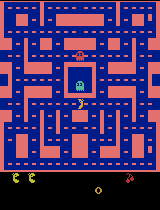

  Episode 2126/20000 | 1,447,000 decisions | 361,501 updates | 84.2 min
  Episode 2126/20000 | 1,447,500 decisions | 361,626 updates | 84.2 min
Episode 2126/20000 | score 990 | recent mean 1362.4 | exploration 15%
  Episode 2127/20000 | 1,448,000 decisions | 361,751 updates | 84.2 min
Episode 2127/20000 | score 1290 | recent mean 1372.0 | exploration 15%
  Episode 2128/20000 | 1,448,500 decisions | 361,876 updates | 84.3 min
Episode 2128/20000 | score 780 | recent mean 1351.2 | exploration 15%
  Episode 2129/20000 | 1,449,000 decisions | 362,001 updates | 84.3 min
  Episode 2129/20000 | 1,449,500 decisions | 362,126 updates | 84.3 min
Episode 2129/20000 | score 1130 | recent mean 1332.4 | exploration 15%
  Episode 2130/20000 | 1,450,000 decisions | 362,251 updates | 84.3 min
  Episode 2130/20000 | 1,450,500 decisions | 362,376 updates | 84.4 min
Episode 2130/20000 | score 1250 | recent mean 1296.4 | exploration 15%
  Episode 2131/20000 | 1,451,000 decisions | 362,501 updates | 84.4 min

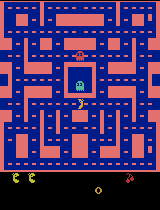

  Episode 2151/20000 | 1,466,500 decisions | 366,376 updates | 85.4 min
Episode 2151/20000 | score 970 | recent mean 1262.8 | exploration 15%
  Episode 2152/20000 | 1,467,000 decisions | 366,501 updates | 85.4 min
Episode 2152/20000 | score 1270 | recent mean 1262.0 | exploration 15%
  Episode 2153/20000 | 1,467,500 decisions | 366,626 updates | 85.4 min
  Episode 2153/20000 | 1,468,000 decisions | 366,751 updates | 85.4 min
Episode 2153/20000 | score 990 | recent mean 1270.4 | exploration 15%
  Episode 2154/20000 | 1,468,500 decisions | 366,876 updates | 85.5 min
Episode 2154/20000 | score 1270 | recent mean 1276.0 | exploration 15%
  Episode 2155/20000 | 1,469,000 decisions | 367,001 updates | 85.5 min
  Episode 2155/20000 | 1,469,500 decisions | 367,126 updates | 85.5 min
Episode 2155/20000 | score 1870 | recent mean 1300.8 | exploration 15%
  Episode 2156/20000 | 1,470,000 decisions | 367,251 updates | 85.6 min
Episode 2156/20000 | score 1530 | recent mean 1319.2 | exploration 15%


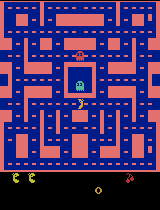

  Episode 2176/20000 | 1,485,500 decisions | 371,126 updates | 86.5 min
Episode 2176/20000 | score 1150 | recent mean 1336.4 | exploration 15%
  Episode 2177/20000 | 1,486,000 decisions | 371,251 updates | 86.6 min
  Episode 2177/20000 | 1,486,500 decisions | 371,376 updates | 86.6 min
Episode 2177/20000 | score 1120 | recent mean 1330.4 | exploration 15%
  Episode 2178/20000 | 1,487,000 decisions | 371,501 updates | 86.6 min
  Episode 2178/20000 | 1,487,500 decisions | 371,626 updates | 86.6 min
Episode 2178/20000 | score 1250 | recent mean 1340.8 | exploration 15%
  Episode 2179/20000 | 1,488,000 decisions | 371,751 updates | 86.7 min
  Episode 2179/20000 | 1,488,500 decisions | 371,876 updates | 86.7 min
Episode 2179/20000 | score 1380 | recent mean 1345.2 | exploration 15%
  Episode 2180/20000 | 1,489,000 decisions | 372,001 updates | 86.7 min
Episode 2180/20000 | score 940 | recent mean 1308.0 | exploration 15%
  Episode 2181/20000 | 1,489,500 decisions | 372,126 updates | 86.8 mi

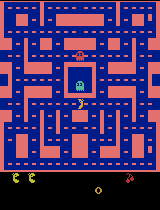

  Episode 2201/20000 | 1,504,000 decisions | 375,751 updates | 87.7 min
  Episode 2201/20000 | 1,504,500 decisions | 375,876 updates | 87.7 min
Episode 2201/20000 | score 1410 | recent mean 1268.8 | exploration 15%
  Episode 2202/20000 | 1,505,000 decisions | 376,001 updates | 87.7 min
  Episode 2202/20000 | 1,505,500 decisions | 376,126 updates | 87.7 min
Episode 2202/20000 | score 1620 | recent mean 1288.8 | exploration 15%
  Episode 2203/20000 | 1,506,000 decisions | 376,251 updates | 87.8 min
Episode 2203/20000 | score 1020 | recent mean 1279.6 | exploration 15%
  Episode 2204/20000 | 1,506,500 decisions | 376,376 updates | 87.8 min
Episode 2204/20000 | score 1350 | recent mean 1278.4 | exploration 15%
  Episode 2205/20000 | 1,507,000 decisions | 376,501 updates | 87.9 min
  Episode 2205/20000 | 1,507,500 decisions | 376,626 updates | 87.9 min
Episode 2205/20000 | score 940 | recent mean 1278.4 | exploration 15%
  Episode 2206/20000 | 1,508,000 decisions | 376,751 updates | 87.9 mi

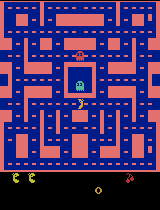

  Episode 2226/20000 | 1,523,500 decisions | 380,626 updates | 88.9 min
  Episode 2226/20000 | 1,524,000 decisions | 380,751 updates | 88.9 min
Episode 2226/20000 | score 1180 | recent mean 1450.8 | exploration 15%
  Episode 2227/20000 | 1,524,500 decisions | 380,876 updates | 88.9 min
  Episode 2227/20000 | 1,525,000 decisions | 381,001 updates | 88.9 min
Episode 2227/20000 | score 1840 | recent mean 1459.6 | exploration 15%
  Episode 2228/20000 | 1,525,500 decisions | 381,126 updates | 89.0 min
Episode 2228/20000 | score 590 | recent mean 1442.4 | exploration 15%
  Episode 2229/20000 | 1,526,000 decisions | 381,251 updates | 89.0 min
Episode 2229/20000 | score 1330 | recent mean 1441.6 | exploration 15%
  Episode 2230/20000 | 1,526,500 decisions | 381,376 updates | 89.0 min
  Episode 2230/20000 | 1,527,000 decisions | 381,501 updates | 89.1 min
Episode 2230/20000 | score 890 | recent mean 1439.6 | exploration 15%
  Episode 2231/20000 | 1,527,500 decisions | 381,626 updates | 89.1 min

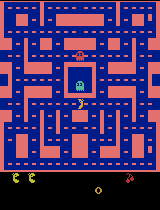

  Episode 2251/20000 | 1,543,500 decisions | 385,626 updates | 90.1 min
  Episode 2251/20000 | 1,544,000 decisions | 385,751 updates | 90.1 min
Episode 2251/20000 | score 1300 | recent mean 1404.0 | exploration 15%
  Episode 2252/20000 | 1,544,500 decisions | 385,876 updates | 90.2 min
  Episode 2252/20000 | 1,545,000 decisions | 386,001 updates | 90.2 min
Episode 2252/20000 | score 1870 | recent mean 1405.2 | exploration 15%
  Episode 2253/20000 | 1,545,500 decisions | 386,126 updates | 90.2 min
  Episode 2253/20000 | 1,546,000 decisions | 386,251 updates | 90.3 min
Episode 2253/20000 | score 2120 | recent mean 1466.4 | exploration 15%
  Episode 2254/20000 | 1,546,500 decisions | 386,376 updates | 90.3 min
  Episode 2254/20000 | 1,547,000 decisions | 386,501 updates | 90.3 min
Episode 2254/20000 | score 2620 | recent mean 1518.0 | exploration 15%
  Episode 2255/20000 | 1,547,500 decisions | 386,626 updates | 90.3 min
Episode 2255/20000 | score 1060 | recent mean 1524.8 | exploration 1

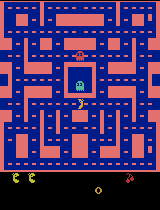

  Episode 2276/20000 | 1,564,000 decisions | 390,751 updates | 91.3 min
  Episode 2276/20000 | 1,564,500 decisions | 390,876 updates | 91.4 min
Episode 2276/20000 | score 870 | recent mean 1458.0 | exploration 15%
  Episode 2277/20000 | 1,565,000 decisions | 391,001 updates | 91.4 min
Episode 2277/20000 | score 1440 | recent mean 1440.8 | exploration 15%
  Episode 2278/20000 | 1,565,500 decisions | 391,126 updates | 91.4 min
  Episode 2278/20000 | 1,566,000 decisions | 391,251 updates | 91.4 min
Episode 2278/20000 | score 1040 | recent mean 1397.6 | exploration 15%
  Episode 2279/20000 | 1,566,500 decisions | 391,376 updates | 91.5 min
Episode 2279/20000 | score 1130 | recent mean 1338.0 | exploration 15%
  Episode 2280/20000 | 1,567,000 decisions | 391,501 updates | 91.5 min
  Episode 2280/20000 | 1,567,500 decisions | 391,626 updates | 91.5 min
Episode 2280/20000 | score 940 | recent mean 1333.2 | exploration 15%
  Episode 2281/20000 | 1,568,000 decisions | 391,751 updates | 91.6 min

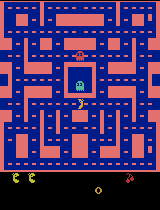

  Episode 2301/20000 | 1,582,500 decisions | 395,376 updates | 92.4 min
Episode 2301/20000 | score 1270 | recent mean 1160.8 | exploration 15%
  Episode 2302/20000 | 1,583,000 decisions | 395,501 updates | 92.4 min
Episode 2302/20000 | score 670 | recent mean 1130.0 | exploration 15%
  Episode 2303/20000 | 1,583,500 decisions | 395,626 updates | 92.5 min
  Episode 2303/20000 | 1,584,000 decisions | 395,751 updates | 92.5 min
Episode 2303/20000 | score 900 | recent mean 1124.4 | exploration 15%
  Episode 2304/20000 | 1,584,500 decisions | 395,876 updates | 92.5 min
Episode 2304/20000 | score 910 | recent mean 1115.6 | exploration 15%
  Episode 2305/20000 | 1,585,000 decisions | 396,001 updates | 92.5 min
Episode 2305/20000 | score 920 | recent mean 1114.8 | exploration 15%
  Episode 2306/20000 | 1,585,500 decisions | 396,126 updates | 92.6 min
Episode 2306/20000 | score 740 | recent mean 1122.0 | exploration 15%
  Episode 2307/20000 | 1,586,000 decisions | 396,251 updates | 92.6 min
  E

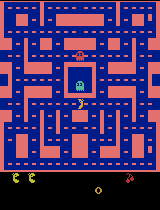

Episode 2326/20000 | score 380 | recent mean 1046.4 | exploration 15%
  Episode 2327/20000 | 1,601,000 decisions | 400,001 updates | 93.5 min
  Episode 2327/20000 | 1,601,500 decisions | 400,126 updates | 93.5 min
Episode 2327/20000 | score 990 | recent mean 1059.2 | exploration 15%
  Episode 2328/20000 | 1,602,000 decisions | 400,251 updates | 93.5 min
Episode 2328/20000 | score 970 | recent mean 1062.0 | exploration 15%
  Episode 2329/20000 | 1,602,500 decisions | 400,376 updates | 93.6 min
Episode 2329/20000 | score 680 | recent mean 1052.8 | exploration 15%
  Episode 2330/20000 | 1,603,000 decisions | 400,501 updates | 93.6 min
Episode 2330/20000 | score 710 | recent mean 1044.4 | exploration 15%
  Episode 2331/20000 | 1,603,500 decisions | 400,626 updates | 93.6 min
  Episode 2331/20000 | 1,604,000 decisions | 400,751 updates | 93.7 min
Episode 2331/20000 | score 1020 | recent mean 1055.6 | exploration 15%
  Episode 2332/20000 | 1,604,500 decisions | 400,876 updates | 93.7 min
Epi

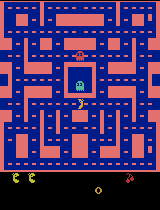

  Episode 2351/20000 | 1,619,000 decisions | 404,501 updates | 94.6 min
  Episode 2351/20000 | 1,619,500 decisions | 404,626 updates | 94.6 min
  Episode 2351/20000 | 1,620,000 decisions | 404,751 updates | 94.6 min
Episode 2351/20000 | score 1560 | recent mean 1167.6 | exploration 15%
  Episode 2352/20000 | 1,620,500 decisions | 404,876 updates | 94.7 min
Episode 2352/20000 | score 1350 | recent mean 1182.0 | exploration 15%
  Episode 2353/20000 | 1,621,000 decisions | 405,001 updates | 94.7 min
  Episode 2353/20000 | 1,621,500 decisions | 405,126 updates | 94.7 min
Episode 2353/20000 | score 2040 | recent mean 1224.8 | exploration 15%
  Episode 2354/20000 | 1,622,000 decisions | 405,251 updates | 94.8 min
  Episode 2354/20000 | 1,622,500 decisions | 405,376 updates | 94.8 min
Episode 2354/20000 | score 1750 | recent mean 1267.6 | exploration 15%
  Episode 2355/20000 | 1,623,000 decisions | 405,501 updates | 94.8 min
  Episode 2355/20000 | 1,623,500 decisions | 405,626 updates | 94.9 

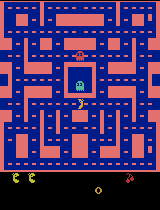

  Episode 2376/20000 | 1,638,500 decisions | 409,376 updates | 95.8 min
Episode 2376/20000 | score 1160 | recent mean 1413.6 | exploration 15%
  Episode 2377/20000 | 1,639,000 decisions | 409,501 updates | 95.8 min
  Episode 2377/20000 | 1,639,500 decisions | 409,626 updates | 95.9 min
Episode 2377/20000 | score 1290 | recent mean 1411.2 | exploration 15%
  Episode 2378/20000 | 1,640,000 decisions | 409,751 updates | 95.9 min
Episode 2378/20000 | score 870 | recent mean 1364.4 | exploration 15%
  Episode 2379/20000 | 1,640,500 decisions | 409,876 updates | 95.9 min
  Episode 2379/20000 | 1,641,000 decisions | 410,001 updates | 95.9 min
Episode 2379/20000 | score 970 | recent mean 1333.2 | exploration 15%
  Episode 2380/20000 | 1,641,500 decisions | 410,126 updates | 96.0 min
Episode 2380/20000 | score 1040 | recent mean 1329.6 | exploration 15%
  Episode 2381/20000 | 1,642,000 decisions | 410,251 updates | 96.0 min
  Episode 2381/20000 | 1,642,500 decisions | 410,376 updates | 96.0 min

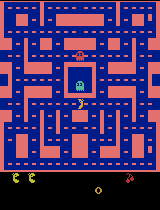

  Episode 2401/20000 | 1,656,500 decisions | 413,876 updates | 96.9 min
Episode 2401/20000 | score 1000 | recent mean 1222.8 | exploration 15%
  Episode 2402/20000 | 1,657,000 decisions | 414,001 updates | 96.9 min
Episode 2402/20000 | score 790 | recent mean 1202.8 | exploration 15%
  Episode 2403/20000 | 1,657,500 decisions | 414,126 updates | 96.9 min
  Episode 2403/20000 | 1,658,000 decisions | 414,251 updates | 97.0 min
Episode 2403/20000 | score 1110 | recent mean 1212.4 | exploration 15%
  Episode 2404/20000 | 1,658,500 decisions | 414,376 updates | 97.0 min
Episode 2404/20000 | score 890 | recent mean 1209.2 | exploration 15%
  Episode 2405/20000 | 1,659,000 decisions | 414,501 updates | 97.0 min
  Episode 2405/20000 | 1,659,500 decisions | 414,626 updates | 97.1 min
Episode 2405/20000 | score 1420 | recent mean 1224.4 | exploration 15%
  Episode 2406/20000 | 1,660,000 decisions | 414,751 updates | 97.1 min
Episode 2406/20000 | score 1210 | recent mean 1221.2 | exploration 15%


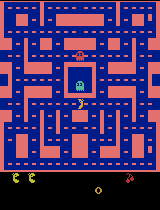

  Episode 2426/20000 | 1,674,500 decisions | 418,376 updates | 98.0 min
  Episode 2426/20000 | 1,675,000 decisions | 418,501 updates | 98.0 min
Episode 2426/20000 | score 2110 | recent mean 1196.0 | exploration 15%
  Episode 2427/20000 | 1,675,500 decisions | 418,626 updates | 98.0 min
  Episode 2427/20000 | 1,676,000 decisions | 418,751 updates | 98.0 min
Episode 2427/20000 | score 1100 | recent mean 1208.4 | exploration 15%
  Episode 2428/20000 | 1,676,500 decisions | 418,876 updates | 98.1 min
  Episode 2428/20000 | 1,677,000 decisions | 419,001 updates | 98.1 min
Episode 2428/20000 | score 1660 | recent mean 1230.4 | exploration 15%
  Episode 2429/20000 | 1,677,500 decisions | 419,126 updates | 98.1 min
Episode 2429/20000 | score 1410 | recent mean 1251.2 | exploration 15%
  Episode 2430/20000 | 1,678,000 decisions | 419,251 updates | 98.2 min
Episode 2430/20000 | score 900 | recent mean 1230.4 | exploration 15%
  Episode 2431/20000 | 1,678,500 decisions | 419,376 updates | 98.2 mi

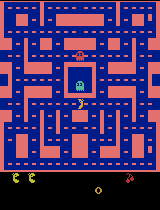

  Episode 2451/20000 | 1,694,000 decisions | 423,251 updates | 99.1 min
  Episode 2451/20000 | 1,694,500 decisions | 423,376 updates | 99.2 min
Episode 2451/20000 | score 2150 | recent mean 1256.8 | exploration 15%
  Episode 2452/20000 | 1,695,000 decisions | 423,501 updates | 99.2 min
Episode 2452/20000 | score 910 | recent mean 1249.2 | exploration 15%
  Episode 2453/20000 | 1,695,500 decisions | 423,626 updates | 99.2 min
Episode 2453/20000 | score 950 | recent mean 1220.8 | exploration 15%
  Episode 2454/20000 | 1,696,000 decisions | 423,751 updates | 99.3 min
  Episode 2454/20000 | 1,696,500 decisions | 423,876 updates | 99.3 min
Episode 2454/20000 | score 1330 | recent mean 1217.6 | exploration 15%
  Episode 2455/20000 | 1,697,000 decisions | 424,001 updates | 99.3 min
Episode 2455/20000 | score 1370 | recent mean 1236.4 | exploration 15%
  Episode 2456/20000 | 1,697,500 decisions | 424,126 updates | 99.3 min
Episode 2456/20000 | score 800 | recent mean 1203.6 | exploration 15%
 

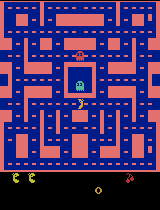

  Episode 2476/20000 | 1,713,000 decisions | 428,001 updates | 100.3 min
  Episode 2476/20000 | 1,713,500 decisions | 428,126 updates | 100.3 min
Episode 2476/20000 | score 870 | recent mean 1310.8 | exploration 15%
  Episode 2477/20000 | 1,714,000 decisions | 428,251 updates | 100.4 min
Episode 2477/20000 | score 450 | recent mean 1292.4 | exploration 15%
  Episode 2478/20000 | 1,714,500 decisions | 428,376 updates | 100.4 min
  Episode 2478/20000 | 1,715,000 decisions | 428,501 updates | 100.4 min
Episode 2478/20000 | score 2530 | recent mean 1355.6 | exploration 15%
  Episode 2479/20000 | 1,715,500 decisions | 428,626 updates | 100.4 min
Episode 2479/20000 | score 1040 | recent mean 1344.0 | exploration 15%
  Episode 2480/20000 | 1,716,000 decisions | 428,751 updates | 100.5 min
Episode 2480/20000 | score 1010 | recent mean 1329.6 | exploration 15%
  Episode 2481/20000 | 1,716,500 decisions | 428,876 updates | 100.5 min
  Episode 2481/20000 | 1,717,000 decisions | 429,001 updates | 

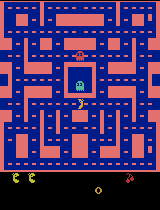

  Episode 2501/20000 | 1,732,500 decisions | 432,876 updates | 101.5 min
Episode 2501/20000 | score 730 | recent mean 1444.4 | exploration 15%
  Episode 2502/20000 | 1,733,000 decisions | 433,001 updates | 101.5 min
  Episode 2502/20000 | 1,733,500 decisions | 433,126 updates | 101.5 min
Episode 2502/20000 | score 770 | recent mean 1457.2 | exploration 15%
  Episode 2503/20000 | 1,734,000 decisions | 433,251 updates | 101.6 min
Episode 2503/20000 | score 1090 | recent mean 1399.6 | exploration 15%
  Episode 2504/20000 | 1,734,500 decisions | 433,376 updates | 101.6 min
  Episode 2504/20000 | 1,735,000 decisions | 433,501 updates | 101.6 min
Episode 2504/20000 | score 910 | recent mean 1394.4 | exploration 15%
  Episode 2505/20000 | 1,735,500 decisions | 433,626 updates | 101.7 min
Episode 2505/20000 | score 1920 | recent mean 1430.8 | exploration 15%
  Episode 2506/20000 | 1,736,000 decisions | 433,751 updates | 101.7 min
  Episode 2506/20000 | 1,736,500 decisions | 433,876 updates | 1

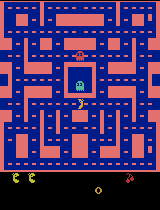

  Episode 2526/20000 | 1,752,000 decisions | 437,751 updates | 102.7 min
Episode 2526/20000 | score 1280 | recent mean 1458.8 | exploration 15%
  Episode 2527/20000 | 1,752,500 decisions | 437,876 updates | 102.7 min
  Episode 2527/20000 | 1,753,000 decisions | 438,001 updates | 102.7 min
Episode 2527/20000 | score 1360 | recent mean 1482.4 | exploration 15%
  Episode 2528/20000 | 1,753,500 decisions | 438,126 updates | 102.8 min
Episode 2528/20000 | score 1640 | recent mean 1504.4 | exploration 15%
  Episode 2529/20000 | 1,754,000 decisions | 438,251 updates | 102.8 min
  Episode 2529/20000 | 1,754,500 decisions | 438,376 updates | 102.8 min
Episode 2529/20000 | score 1240 | recent mean 1517.6 | exploration 15%
  Episode 2530/20000 | 1,755,000 decisions | 438,501 updates | 102.8 min
Episode 2530/20000 | score 1770 | recent mean 1511.6 | exploration 15%
  Episode 2531/20000 | 1,755,500 decisions | 438,626 updates | 102.9 min
Episode 2531/20000 | score 870 | recent mean 1478.0 | explora

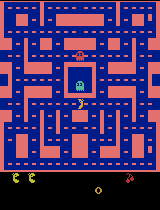

  Episode 2551/20000 | 1,770,500 decisions | 442,376 updates | 103.8 min
Episode 2551/20000 | score 1320 | recent mean 1361.6 | exploration 15%
  Episode 2552/20000 | 1,771,000 decisions | 442,501 updates | 103.9 min
  Episode 2552/20000 | 1,771,500 decisions | 442,626 updates | 103.9 min
Episode 2552/20000 | score 1130 | recent mean 1352.4 | exploration 15%
  Episode 2553/20000 | 1,772,000 decisions | 442,751 updates | 103.9 min
Episode 2553/20000 | score 1700 | recent mean 1354.8 | exploration 15%
  Episode 2554/20000 | 1,772,500 decisions | 442,876 updates | 104.0 min
  Episode 2554/20000 | 1,773,000 decisions | 443,001 updates | 104.0 min
Episode 2554/20000 | score 1490 | recent mean 1364.8 | exploration 15%
  Episode 2555/20000 | 1,773,500 decisions | 443,126 updates | 104.0 min
  Episode 2555/20000 | 1,774,000 decisions | 443,251 updates | 104.1 min
Episode 2555/20000 | score 1280 | recent mean 1345.2 | exploration 15%
  Episode 2556/20000 | 1,774,500 decisions | 443,376 updates 

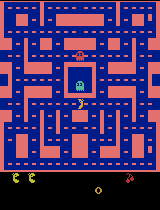

  Episode 2576/20000 | 1,789,500 decisions | 447,126 updates | 105.0 min
  Episode 2576/20000 | 1,790,000 decisions | 447,251 updates | 105.1 min
Episode 2576/20000 | score 1460 | recent mean 1372.8 | exploration 15%
  Episode 2577/20000 | 1,790,500 decisions | 447,376 updates | 105.1 min
  Episode 2577/20000 | 1,791,000 decisions | 447,501 updates | 105.1 min
Episode 2577/20000 | score 960 | recent mean 1366.0 | exploration 15%
  Episode 2578/20000 | 1,791,500 decisions | 447,626 updates | 105.2 min
Episode 2578/20000 | score 890 | recent mean 1333.6 | exploration 15%
  Episode 2579/20000 | 1,792,000 decisions | 447,751 updates | 105.2 min
Episode 2579/20000 | score 1190 | recent mean 1321.6 | exploration 15%
  Episode 2580/20000 | 1,792,500 decisions | 447,876 updates | 105.2 min
  Episode 2580/20000 | 1,793,000 decisions | 448,001 updates | 105.3 min
  Episode 2580/20000 | 1,793,500 decisions | 448,126 updates | 105.3 min
Episode 2580/20000 | score 1490 | recent mean 1330.0 | explor

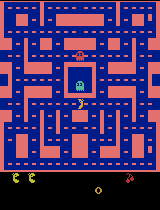

  Episode 2601/20000 | 1,811,500 decisions | 452,626 updates | 106.4 min
Episode 2601/20000 | score 1520 | recent mean 1518.0 | exploration 15%
  Episode 2602/20000 | 1,812,000 decisions | 452,751 updates | 106.4 min
  Episode 2602/20000 | 1,812,500 decisions | 452,876 updates | 106.4 min
Episode 2602/20000 | score 1180 | recent mean 1526.8 | exploration 15%
  Episode 2603/20000 | 1,813,000 decisions | 453,001 updates | 106.5 min
Episode 2603/20000 | score 780 | recent mean 1522.4 | exploration 15%
  Episode 2604/20000 | 1,813,500 decisions | 453,126 updates | 106.5 min
  Episode 2604/20000 | 1,814,000 decisions | 453,251 updates | 106.5 min
Episode 2604/20000 | score 1320 | recent mean 1527.6 | exploration 15%
  Episode 2605/20000 | 1,814,500 decisions | 453,376 updates | 106.5 min
Episode 2605/20000 | score 1410 | recent mean 1524.4 | exploration 15%
  Episode 2606/20000 | 1,815,000 decisions | 453,501 updates | 106.6 min
Episode 2606/20000 | score 1060 | recent mean 1510.0 | explora

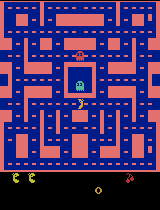

  Episode 2626/20000 | 1,831,000 decisions | 457,501 updates | 107.5 min
  Episode 2626/20000 | 1,831,500 decisions | 457,626 updates | 107.6 min
Episode 2626/20000 | score 1750 | recent mean 1342.4 | exploration 15%
  Episode 2627/20000 | 1,832,000 decisions | 457,751 updates | 107.6 min
Episode 2627/20000 | score 850 | recent mean 1329.2 | exploration 15%
  Episode 2628/20000 | 1,832,500 decisions | 457,876 updates | 107.6 min
  Episode 2628/20000 | 1,833,000 decisions | 458,001 updates | 107.6 min
Episode 2628/20000 | score 1280 | recent mean 1349.2 | exploration 15%
  Episode 2629/20000 | 1,833,500 decisions | 458,126 updates | 107.7 min
Episode 2629/20000 | score 820 | recent mean 1329.2 | exploration 15%
  Episode 2630/20000 | 1,834,000 decisions | 458,251 updates | 107.7 min
  Episode 2630/20000 | 1,834,500 decisions | 458,376 updates | 107.7 min
Episode 2630/20000 | score 1320 | recent mean 1325.6 | exploration 15%
  Episode 2631/20000 | 1,835,000 decisions | 458,501 updates | 

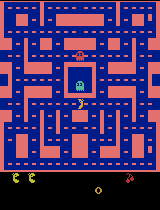

  Episode 2651/20000 | 1,850,500 decisions | 462,376 updates | 108.7 min
  Episode 2651/20000 | 1,851,000 decisions | 462,501 updates | 108.7 min
Episode 2651/20000 | score 1960 | recent mean 1453.2 | exploration 15%
  Episode 2652/20000 | 1,851,500 decisions | 462,626 updates | 108.7 min
  Episode 2652/20000 | 1,852,000 decisions | 462,751 updates | 108.8 min
Episode 2652/20000 | score 2190 | recent mean 1506.8 | exploration 15%
  Episode 2653/20000 | 1,852,500 decisions | 462,876 updates | 108.8 min
Episode 2653/20000 | score 1260 | recent mean 1506.0 | exploration 15%
  Episode 2654/20000 | 1,853,000 decisions | 463,001 updates | 108.8 min
  Episode 2654/20000 | 1,853,500 decisions | 463,126 updates | 108.8 min
Episode 2654/20000 | score 1500 | recent mean 1533.2 | exploration 15%
  Episode 2655/20000 | 1,854,000 decisions | 463,251 updates | 108.9 min
Episode 2655/20000 | score 1700 | recent mean 1548.4 | exploration 15%
  Episode 2656/20000 | 1,854,500 decisions | 463,376 updates 

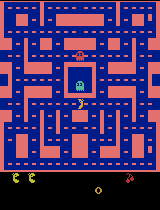

  Episode 2676/20000 | 1,871,000 decisions | 467,501 updates | 109.9 min
Episode 2676/20000 | score 900 | recent mean 1370.4 | exploration 15%
  Episode 2677/20000 | 1,871,500 decisions | 467,626 updates | 109.9 min
  Episode 2677/20000 | 1,872,000 decisions | 467,751 updates | 110.0 min
Episode 2677/20000 | score 1110 | recent mean 1327.2 | exploration 15%
  Episode 2678/20000 | 1,872,500 decisions | 467,876 updates | 110.0 min
Episode 2678/20000 | score 930 | recent mean 1314.0 | exploration 15%
  Episode 2679/20000 | 1,873,000 decisions | 468,001 updates | 110.0 min
  Episode 2679/20000 | 1,873,500 decisions | 468,126 updates | 110.0 min
Episode 2679/20000 | score 1490 | recent mean 1313.6 | exploration 15%
  Episode 2680/20000 | 1,874,000 decisions | 468,251 updates | 110.1 min
Episode 2680/20000 | score 1630 | recent mean 1310.8 | exploration 15%
  Episode 2681/20000 | 1,874,500 decisions | 468,376 updates | 110.1 min
  Episode 2681/20000 | 1,875,000 decisions | 468,501 updates | 

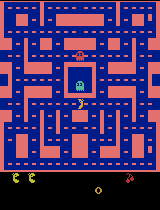

  Episode 2701/20000 | 1,889,000 decisions | 472,001 updates | 111.1 min
  Episode 2701/20000 | 1,889,500 decisions | 472,126 updates | 111.1 min
Episode 2701/20000 | score 780 | recent mean 1198.8 | exploration 15%
  Episode 2702/20000 | 1,890,000 decisions | 472,251 updates | 111.2 min
Episode 2702/20000 | score 1280 | recent mean 1205.6 | exploration 15%
  Episode 2703/20000 | 1,890,500 decisions | 472,376 updates | 111.2 min
  Episode 2703/20000 | 1,891,000 decisions | 472,501 updates | 111.2 min
Episode 2703/20000 | score 1040 | recent mean 1210.0 | exploration 15%
  Episode 2704/20000 | 1,891,500 decisions | 472,626 updates | 111.3 min
Episode 2704/20000 | score 1080 | recent mean 1193.6 | exploration 15%
  Episode 2705/20000 | 1,892,000 decisions | 472,751 updates | 111.3 min
  Episode 2705/20000 | 1,892,500 decisions | 472,876 updates | 111.3 min
Episode 2705/20000 | score 1780 | recent mean 1199.6 | exploration 15%
  Episode 2706/20000 | 1,893,000 decisions | 473,001 updates |

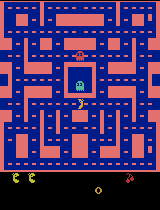

  Episode 2726/20000 | 1,908,500 decisions | 476,876 updates | 112.3 min
Episode 2726/20000 | score 800 | recent mean 1291.6 | exploration 15%
  Episode 2727/20000 | 1,909,000 decisions | 477,001 updates | 112.3 min
  Episode 2727/20000 | 1,909,500 decisions | 477,126 updates | 112.4 min
Episode 2727/20000 | score 1040 | recent mean 1282.0 | exploration 15%
  Episode 2728/20000 | 1,910,000 decisions | 477,251 updates | 112.4 min
Episode 2728/20000 | score 620 | recent mean 1265.2 | exploration 15%
  Episode 2729/20000 | 1,910,500 decisions | 477,376 updates | 112.4 min
  Episode 2729/20000 | 1,911,000 decisions | 477,501 updates | 112.5 min
Episode 2729/20000 | score 1250 | recent mean 1272.0 | exploration 15%
  Episode 2730/20000 | 1,911,500 decisions | 477,626 updates | 112.5 min
Episode 2730/20000 | score 1060 | recent mean 1243.2 | exploration 15%
  Episode 2731/20000 | 1,912,000 decisions | 477,751 updates | 112.5 min
  Episode 2731/20000 | 1,912,500 decisions | 477,876 updates | 

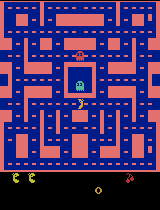

  Episode 2751/20000 | 1,927,500 decisions | 481,626 updates | 113.5 min
  Episode 2751/20000 | 1,928,000 decisions | 481,751 updates | 113.5 min
Episode 2751/20000 | score 1290 | recent mean 1374.0 | exploration 15%
  Episode 2752/20000 | 1,928,500 decisions | 481,876 updates | 113.5 min
Episode 2752/20000 | score 650 | recent mean 1358.4 | exploration 15%
  Episode 2753/20000 | 1,929,000 decisions | 482,001 updates | 113.6 min
  Episode 2753/20000 | 1,929,500 decisions | 482,126 updates | 113.6 min
Episode 2753/20000 | score 860 | recent mean 1368.0 | exploration 15%
Episode 2754/20000 | score 640 | recent mean 1343.6 | exploration 15%
  Episode 2755/20000 | 1,930,000 decisions | 482,251 updates | 113.6 min
  Episode 2755/20000 | 1,930,500 decisions | 482,376 updates | 113.7 min
Episode 2755/20000 | score 1850 | recent mean 1375.2 | exploration 15%
  Episode 2756/20000 | 1,931,000 decisions | 482,501 updates | 113.7 min
  Episode 2756/20000 | 1,931,500 decisions | 482,626 updates | 1

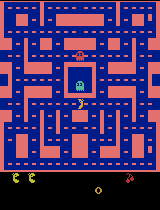

  Episode 2776/20000 | 1,946,500 decisions | 486,376 updates | 114.6 min
  Episode 2776/20000 | 1,947,000 decisions | 486,501 updates | 114.6 min
  Episode 2776/20000 | 1,947,500 decisions | 486,626 updates | 114.7 min
Episode 2776/20000 | score 1570 | recent mean 1289.2 | exploration 15%
  Episode 2777/20000 | 1,948,000 decisions | 486,751 updates | 114.7 min
Episode 2777/20000 | score 1410 | recent mean 1319.6 | exploration 15%
  Episode 2778/20000 | 1,948,500 decisions | 486,876 updates | 114.7 min
  Episode 2778/20000 | 1,949,000 decisions | 487,001 updates | 114.8 min
Episode 2778/20000 | score 1010 | recent mean 1325.6 | exploration 15%
  Episode 2779/20000 | 1,949,500 decisions | 487,126 updates | 114.8 min
Episode 2779/20000 | score 650 | recent mean 1326.0 | exploration 15%
  Episode 2780/20000 | 1,950,000 decisions | 487,251 updates | 114.8 min
Episode 2780/20000 | score 1350 | recent mean 1306.0 | exploration 15%
  Episode 2781/20000 | 1,950,500 decisions | 487,376 updates |

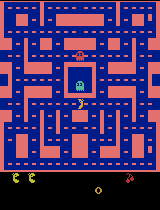

  Episode 2801/20000 | 1,966,000 decisions | 491,251 updates | 115.9 min
  Episode 2801/20000 | 1,966,500 decisions | 491,376 updates | 115.9 min
Episode 2801/20000 | score 3080 | recent mean 1323.6 | exploration 15%
  Episode 2802/20000 | 1,967,000 decisions | 491,501 updates | 115.9 min
  Episode 2802/20000 | 1,967,500 decisions | 491,626 updates | 116.0 min
Episode 2802/20000 | score 1970 | recent mean 1346.0 | exploration 15%
  Episode 2803/20000 | 1,968,000 decisions | 491,751 updates | 116.0 min
  Episode 2803/20000 | 1,968,500 decisions | 491,876 updates | 116.0 min
Episode 2803/20000 | score 1310 | recent mean 1358.0 | exploration 15%
  Episode 2804/20000 | 1,969,000 decisions | 492,001 updates | 116.0 min
  Episode 2804/20000 | 1,969,500 decisions | 492,126 updates | 116.1 min
Episode 2804/20000 | score 1900 | recent mean 1408.0 | exploration 15%
  Episode 2805/20000 | 1,970,000 decisions | 492,251 updates | 116.1 min
Episode 2805/20000 | score 1340 | recent mean 1407.6 | expl

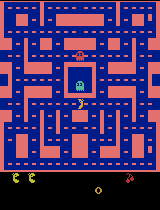

  Episode 2826/20000 | 1,985,500 decisions | 496,126 updates | 117.0 min
  Episode 2826/20000 | 1,986,000 decisions | 496,251 updates | 117.0 min
Episode 2826/20000 | score 2680 | recent mean 1374.4 | exploration 15%
  Episode 2827/20000 | 1,986,500 decisions | 496,376 updates | 117.1 min
Episode 2827/20000 | score 490 | recent mean 1315.2 | exploration 15%
  Episode 2828/20000 | 1,987,000 decisions | 496,501 updates | 117.1 min
Episode 2828/20000 | score 1520 | recent mean 1323.6 | exploration 15%
  Episode 2829/20000 | 1,987,500 decisions | 496,626 updates | 117.1 min
  Episode 2829/20000 | 1,988,000 decisions | 496,751 updates | 117.2 min
Episode 2829/20000 | score 1120 | recent mean 1292.4 | exploration 15%
  Episode 2830/20000 | 1,988,500 decisions | 496,876 updates | 117.2 min
Episode 2830/20000 | score 1210 | recent mean 1287.2 | exploration 15%
  Episode 2831/20000 | 1,989,000 decisions | 497,001 updates | 117.2 min
  Episode 2831/20000 | 1,989,500 decisions | 497,126 updates |

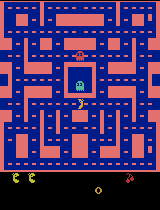

  Episode 2851/20000 | 2,004,000 decisions | 500,751 updates | 118.1 min
  Episode 2851/20000 | 2,004,500 decisions | 500,876 updates | 118.1 min
Episode 2851/20000 | score 1460 | recent mean 1208.0 | exploration 15%
  Episode 2852/20000 | 2,005,000 decisions | 501,001 updates | 118.2 min
  Episode 2852/20000 | 2,005,500 decisions | 501,126 updates | 118.2 min
Episode 2852/20000 | score 1360 | recent mean 1242.8 | exploration 15%
  Episode 2853/20000 | 2,006,000 decisions | 501,251 updates | 118.2 min
  Episode 2853/20000 | 2,006,500 decisions | 501,376 updates | 118.3 min
Episode 2853/20000 | score 1040 | recent mean 1223.6 | exploration 15%
  Episode 2854/20000 | 2,007,000 decisions | 501,501 updates | 118.3 min
Episode 2854/20000 | score 870 | recent mean 1213.6 | exploration 15%
  Episode 2855/20000 | 2,007,500 decisions | 501,626 updates | 118.3 min
Episode 2855/20000 | score 850 | recent mean 1199.2 | exploration 15%
  Episode 2856/20000 | 2,008,000 decisions | 501,751 updates | 

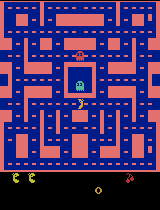

  Episode 2876/20000 | 2,023,500 decisions | 505,626 updates | 119.3 min
  Episode 2876/20000 | 2,024,000 decisions | 505,751 updates | 119.3 min
Episode 2876/20000 | score 2480 | recent mean 1374.0 | exploration 15%
  Episode 2877/20000 | 2,024,500 decisions | 505,876 updates | 119.3 min
  Episode 2877/20000 | 2,025,000 decisions | 506,001 updates | 119.4 min
Episode 2877/20000 | score 1490 | recent mean 1379.2 | exploration 15%
  Episode 2878/20000 | 2,025,500 decisions | 506,126 updates | 119.4 min
Episode 2878/20000 | score 800 | recent mean 1369.6 | exploration 15%
  Episode 2879/20000 | 2,026,000 decisions | 506,251 updates | 119.4 min
Episode 2879/20000 | score 1530 | recent mean 1396.0 | exploration 15%
  Episode 2880/20000 | 2,026,500 decisions | 506,376 updates | 119.4 min
  Episode 2880/20000 | 2,027,000 decisions | 506,501 updates | 119.5 min
Episode 2880/20000 | score 2710 | recent mean 1470.4 | exploration 15%
  Episode 2881/20000 | 2,027,500 decisions | 506,626 updates |

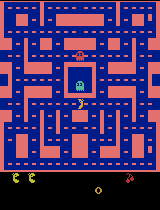

  Episode 2901/20000 | 2,043,000 decisions | 510,501 updates | 120.4 min
  Episode 2901/20000 | 2,043,500 decisions | 510,626 updates | 120.4 min
Episode 2901/20000 | score 1290 | recent mean 1467.6 | exploration 15%
  Episode 2902/20000 | 2,044,000 decisions | 510,751 updates | 120.5 min
  Episode 2902/20000 | 2,044,500 decisions | 510,876 updates | 120.5 min
Episode 2902/20000 | score 1650 | recent mean 1474.0 | exploration 15%
  Episode 2903/20000 | 2,045,000 decisions | 511,001 updates | 120.5 min
  Episode 2903/20000 | 2,045,500 decisions | 511,126 updates | 120.6 min
Episode 2903/20000 | score 1390 | recent mean 1497.6 | exploration 15%
  Episode 2904/20000 | 2,046,000 decisions | 511,251 updates | 120.6 min
Episode 2904/20000 | score 1090 | recent mean 1480.0 | exploration 15%
  Episode 2905/20000 | 2,046,500 decisions | 511,376 updates | 120.6 min
Episode 2905/20000 | score 650 | recent mean 1397.6 | exploration 15%
  Episode 2906/20000 | 2,047,000 decisions | 511,501 updates |

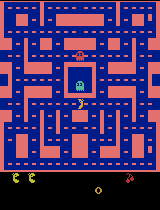

  Episode 2926/20000 | 2,062,500 decisions | 515,376 updates | 121.6 min
Episode 2926/20000 | score 1120 | recent mean 1394.8 | exploration 15%
  Episode 2927/20000 | 2,063,000 decisions | 515,501 updates | 121.6 min
  Episode 2927/20000 | 2,063,500 decisions | 515,626 updates | 121.6 min
Episode 2927/20000 | score 1210 | recent mean 1377.2 | exploration 15%
  Episode 2928/20000 | 2,064,000 decisions | 515,751 updates | 121.7 min
Episode 2928/20000 | score 950 | recent mean 1359.6 | exploration 15%
  Episode 2929/20000 | 2,064,500 decisions | 515,876 updates | 121.7 min
  Episode 2929/20000 | 2,065,000 decisions | 516,001 updates | 121.7 min
Episode 2929/20000 | score 1730 | recent mean 1385.2 | exploration 15%
  Episode 2930/20000 | 2,065,500 decisions | 516,126 updates | 121.8 min
Episode 2930/20000 | score 1360 | recent mean 1413.6 | exploration 15%
  Episode 2931/20000 | 2,066,000 decisions | 516,251 updates | 121.8 min
  Episode 2931/20000 | 2,066,500 decisions | 516,376 updates |

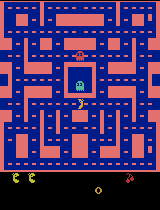

  Episode 2951/20000 | 2,082,000 decisions | 520,251 updates | 122.7 min
  Episode 2951/20000 | 2,082,500 decisions | 520,376 updates | 122.7 min
Episode 2951/20000 | score 1710 | recent mean 1531.6 | exploration 15%
  Episode 2952/20000 | 2,083,000 decisions | 520,501 updates | 122.8 min
  Episode 2952/20000 | 2,083,500 decisions | 520,626 updates | 122.8 min
Episode 2952/20000 | score 1160 | recent mean 1529.6 | exploration 15%
  Episode 2953/20000 | 2,084,000 decisions | 520,751 updates | 122.8 min
Episode 2953/20000 | score 1350 | recent mean 1545.6 | exploration 15%
  Episode 2954/20000 | 2,084,500 decisions | 520,876 updates | 122.9 min
  Episode 2954/20000 | 2,085,000 decisions | 521,001 updates | 122.9 min
Episode 2954/20000 | score 1610 | recent mean 1540.8 | exploration 15%
  Episode 2955/20000 | 2,085,500 decisions | 521,126 updates | 122.9 min
Episode 2955/20000 | score 1000 | recent mean 1526.4 | exploration 15%
  Episode 2956/20000 | 2,086,000 decisions | 521,251 updates 

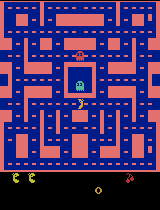

  Episode 2976/20000 | 2,102,000 decisions | 525,251 updates | 123.8 min
Episode 2976/20000 | score 1450 | recent mean 1403.2 | exploration 15%
  Episode 2977/20000 | 2,102,500 decisions | 525,376 updates | 123.9 min
  Episode 2977/20000 | 2,103,000 decisions | 525,501 updates | 123.9 min
Episode 2977/20000 | score 1520 | recent mean 1417.6 | exploration 15%
  Episode 2978/20000 | 2,103,500 decisions | 525,626 updates | 123.9 min
Episode 2978/20000 | score 1170 | recent mean 1410.4 | exploration 15%
  Episode 2979/20000 | 2,104,000 decisions | 525,751 updates | 124.0 min
  Episode 2979/20000 | 2,104,500 decisions | 525,876 updates | 124.0 min
Episode 2979/20000 | score 1280 | recent mean 1397.2 | exploration 15%
  Episode 2980/20000 | 2,105,000 decisions | 526,001 updates | 124.0 min
  Episode 2980/20000 | 2,105,500 decisions | 526,126 updates | 124.0 min
Episode 2980/20000 | score 1900 | recent mean 1433.2 | exploration 15%
  Episode 2981/20000 | 2,106,000 decisions | 526,251 updates 

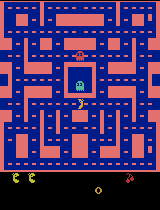

  Episode 3001/20000 | 2,121,500 decisions | 530,126 updates | 125.0 min
  Episode 3001/20000 | 2,122,000 decisions | 530,251 updates | 125.0 min
Episode 3001/20000 | score 1350 | recent mean 1413.2 | exploration 15%
  Episode 3002/20000 | 2,122,500 decisions | 530,376 updates | 125.0 min
Episode 3002/20000 | score 860 | recent mean 1386.8 | exploration 15%
  Episode 3003/20000 | 2,123,000 decisions | 530,501 updates | 125.0 min
  Episode 3003/20000 | 2,123,500 decisions | 530,626 updates | 125.1 min
Episode 3003/20000 | score 1750 | recent mean 1410.0 | exploration 15%
  Episode 3004/20000 | 2,124,000 decisions | 530,751 updates | 125.1 min
Episode 3004/20000 | score 1060 | recent mean 1401.2 | exploration 15%
  Episode 3005/20000 | 2,124,500 decisions | 530,876 updates | 125.1 min
Episode 3005/20000 | score 1200 | recent mean 1373.2 | exploration 15%
  Episode 3006/20000 | 2,125,000 decisions | 531,001 updates | 125.1 min
  Episode 3006/20000 | 2,125,500 decisions | 531,126 updates |

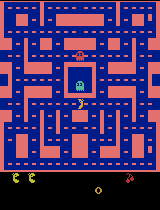

  Episode 3026/20000 | 2,141,000 decisions | 535,001 updates | 126.1 min
  Episode 3026/20000 | 2,141,500 decisions | 535,126 updates | 126.1 min
Episode 3026/20000 | score 1410 | recent mean 1463.6 | exploration 15%
  Episode 3027/20000 | 2,142,000 decisions | 535,251 updates | 126.1 min
  Episode 3027/20000 | 2,142,500 decisions | 535,376 updates | 126.2 min
Episode 3027/20000 | score 1320 | recent mean 1482.0 | exploration 15%
  Episode 3028/20000 | 2,143,000 decisions | 535,501 updates | 126.2 min
  Episode 3028/20000 | 2,143,500 decisions | 535,626 updates | 126.2 min
Episode 3028/20000 | score 1600 | recent mean 1476.0 | exploration 15%
  Episode 3029/20000 | 2,144,000 decisions | 535,751 updates | 126.2 min
Episode 3029/20000 | score 930 | recent mean 1470.8 | exploration 15%
  Episode 3030/20000 | 2,144,500 decisions | 535,876 updates | 126.3 min
  Episode 3030/20000 | 2,145,000 decisions | 536,001 updates | 126.3 min
Episode 3030/20000 | score 1390 | recent mean 1478.4 | explo

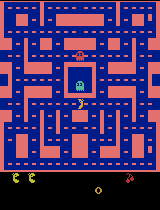

  Episode 3051/20000 | 2,160,500 decisions | 539,876 updates | 127.2 min
Episode 3051/20000 | score 1020 | recent mean 1322.8 | exploration 15%
  Episode 3052/20000 | 2,161,000 decisions | 540,001 updates | 127.2 min
Episode 3052/20000 | score 1100 | recent mean 1314.0 | exploration 15%
  Episode 3053/20000 | 2,161,500 decisions | 540,126 updates | 127.2 min
  Episode 3053/20000 | 2,162,000 decisions | 540,251 updates | 127.3 min
Episode 3053/20000 | score 1660 | recent mean 1316.4 | exploration 15%
  Episode 3054/20000 | 2,162,500 decisions | 540,376 updates | 127.3 min
  Episode 3054/20000 | 2,163,000 decisions | 540,501 updates | 127.3 min
Episode 3054/20000 | score 2670 | recent mean 1386.0 | exploration 15%
  Episode 3055/20000 | 2,163,500 decisions | 540,626 updates | 127.4 min
  Episode 3055/20000 | 2,164,000 decisions | 540,751 updates | 127.4 min
Episode 3055/20000 | score 2430 | recent mean 1427.6 | exploration 15%
  Episode 3056/20000 | 2,164,500 decisions | 540,876 updates 

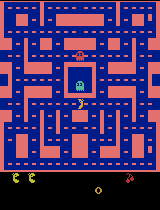

  Episode 3076/20000 | 2,179,500 decisions | 544,626 updates | 128.3 min
Episode 3076/20000 | score 1020 | recent mean 1418.8 | exploration 15%
  Episode 3077/20000 | 2,180,000 decisions | 544,751 updates | 128.3 min
  Episode 3077/20000 | 2,180,500 decisions | 544,876 updates | 128.3 min
Episode 3077/20000 | score 1230 | recent mean 1424.0 | exploration 15%
  Episode 3078/20000 | 2,181,000 decisions | 545,001 updates | 128.3 min
Episode 3078/20000 | score 3040 | recent mean 1479.2 | exploration 15%
  Episode 3079/20000 | 2,181,500 decisions | 545,126 updates | 128.4 min
  Episode 3079/20000 | 2,182,000 decisions | 545,251 updates | 128.4 min
Episode 3079/20000 | score 2460 | recent mean 1470.8 | exploration 15%
  Episode 3080/20000 | 2,182,500 decisions | 545,376 updates | 128.4 min
Episode 3080/20000 | score 1730 | recent mean 1442.8 | exploration 15%
  Episode 3081/20000 | 2,183,000 decisions | 545,501 updates | 128.5 min
Episode 3081/20000 | score 980 | recent mean 1427.6 | explora

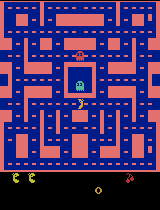

  Episode 3101/20000 | 2,198,000 decisions | 549,251 updates | 129.3 min
  Episode 3101/20000 | 2,198,500 decisions | 549,376 updates | 129.3 min
Episode 3101/20000 | score 1210 | recent mean 1459.2 | exploration 15%
  Episode 3102/20000 | 2,199,000 decisions | 549,501 updates | 129.4 min
  Episode 3102/20000 | 2,199,500 decisions | 549,626 updates | 129.4 min
Episode 3102/20000 | score 2060 | recent mean 1492.4 | exploration 15%
  Episode 3103/20000 | 2,200,000 decisions | 549,751 updates | 129.4 min
  Episode 3103/20000 | 2,200,500 decisions | 549,876 updates | 129.4 min
Episode 3103/20000 | score 1520 | recent mean 1431.6 | exploration 15%
  Episode 3104/20000 | 2,201,000 decisions | 550,001 updates | 129.5 min
Episode 3104/20000 | score 1260 | recent mean 1383.6 | exploration 15%
  Episode 3105/20000 | 2,201,500 decisions | 550,126 updates | 129.5 min
  Episode 3105/20000 | 2,202,000 decisions | 550,251 updates | 129.5 min
Episode 3105/20000 | score 1430 | recent mean 1371.6 | expl

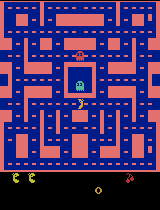

  Episode 3126/20000 | 2,219,500 decisions | 554,626 updates | 130.5 min
Episode 3126/20000 | score 1630 | recent mean 1516.0 | exploration 15%
  Episode 3127/20000 | 2,220,000 decisions | 554,751 updates | 130.5 min
  Episode 3127/20000 | 2,220,500 decisions | 554,876 updates | 130.6 min
Episode 3127/20000 | score 1110 | recent mean 1478.0 | exploration 15%
  Episode 3128/20000 | 2,221,000 decisions | 555,001 updates | 130.6 min
  Episode 3128/20000 | 2,221,500 decisions | 555,126 updates | 130.6 min
Episode 3128/20000 | score 1020 | recent mean 1458.0 | exploration 15%
  Episode 3129/20000 | 2,222,000 decisions | 555,251 updates | 130.6 min
Episode 3129/20000 | score 1150 | recent mean 1453.6 | exploration 15%
  Episode 3130/20000 | 2,222,500 decisions | 555,376 updates | 130.7 min
  Episode 3130/20000 | 2,223,000 decisions | 555,501 updates | 130.7 min
Episode 3130/20000 | score 1400 | recent mean 1452.4 | exploration 15%
  Episode 3131/20000 | 2,223,500 decisions | 555,626 updates 

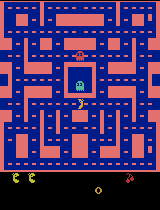

  Episode 3151/20000 | 2,238,000 decisions | 559,251 updates | 131.6 min
  Episode 3151/20000 | 2,238,500 decisions | 559,376 updates | 131.6 min
Episode 3151/20000 | score 1220 | recent mean 1213.6 | exploration 15%
  Episode 3152/20000 | 2,239,000 decisions | 559,501 updates | 131.6 min
Episode 3152/20000 | score 750 | recent mean 1199.2 | exploration 15%
  Episode 3153/20000 | 2,239,500 decisions | 559,626 updates | 131.7 min
  Episode 3153/20000 | 2,240,000 decisions | 559,751 updates | 131.7 min
Episode 3153/20000 | score 990 | recent mean 1198.0 | exploration 15%
  Episode 3154/20000 | 2,240,500 decisions | 559,876 updates | 131.7 min
  Episode 3154/20000 | 2,241,000 decisions | 560,001 updates | 131.7 min
Episode 3154/20000 | score 1780 | recent mean 1223.2 | exploration 15%
  Episode 3155/20000 | 2,241,500 decisions | 560,126 updates | 131.8 min
Episode 3155/20000 | score 2400 | recent mean 1263.2 | exploration 15%
  Episode 3156/20000 | 2,242,000 decisions | 560,251 updates | 

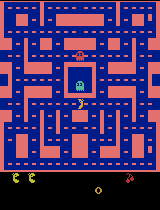

  Episode 3176/20000 | 2,259,500 decisions | 564,626 updates | 132.8 min
Episode 3176/20000 | score 860 | recent mean 1535.6 | exploration 15%
  Episode 3177/20000 | 2,260,000 decisions | 564,751 updates | 132.8 min
  Episode 3177/20000 | 2,260,500 decisions | 564,876 updates | 132.9 min
Episode 3177/20000 | score 1340 | recent mean 1559.2 | exploration 15%
  Episode 3178/20000 | 2,261,000 decisions | 565,001 updates | 132.9 min
Episode 3178/20000 | score 1600 | recent mean 1583.6 | exploration 15%
  Episode 3179/20000 | 2,261,500 decisions | 565,126 updates | 132.9 min
  Episode 3179/20000 | 2,262,000 decisions | 565,251 updates | 132.9 min
Episode 3179/20000 | score 1850 | recent mean 1586.4 | exploration 15%
  Episode 3180/20000 | 2,262,500 decisions | 565,376 updates | 133.0 min
  Episode 3180/20000 | 2,263,000 decisions | 565,501 updates | 133.0 min
Episode 3180/20000 | score 1270 | recent mean 1541.2 | exploration 15%
  Episode 3181/20000 | 2,263,500 decisions | 565,626 updates |

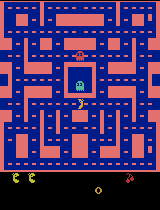

  Episode 3201/20000 | 2,280,500 decisions | 569,876 updates | 134.0 min
  Episode 3201/20000 | 2,281,000 decisions | 570,001 updates | 134.0 min
Episode 3201/20000 | score 1300 | recent mean 1358.4 | exploration 15%
  Episode 3202/20000 | 2,281,500 decisions | 570,126 updates | 134.1 min
Episode 3202/20000 | score 1060 | recent mean 1347.2 | exploration 15%
  Episode 3203/20000 | 2,282,000 decisions | 570,251 updates | 134.1 min
  Episode 3203/20000 | 2,282,500 decisions | 570,376 updates | 134.1 min
Episode 3203/20000 | score 1640 | recent mean 1348.8 | exploration 15%
  Episode 3204/20000 | 2,283,000 decisions | 570,501 updates | 134.2 min
Episode 3204/20000 | score 1460 | recent mean 1333.2 | exploration 15%
  Episode 3205/20000 | 2,283,500 decisions | 570,626 updates | 134.2 min
Episode 3205/20000 | score 1730 | recent mean 1351.6 | exploration 15%
  Episode 3206/20000 | 2,284,000 decisions | 570,751 updates | 134.2 min
  Episode 3206/20000 | 2,284,500 decisions | 570,876 updates 

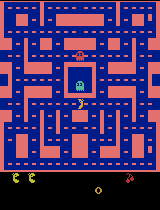

  Episode 3226/20000 | 2,300,000 decisions | 574,751 updates | 135.1 min
  Episode 3226/20000 | 2,300,500 decisions | 574,876 updates | 135.2 min
Episode 3226/20000 | score 1780 | recent mean 1439.2 | exploration 15%
  Episode 3227/20000 | 2,301,000 decisions | 575,001 updates | 135.2 min
Episode 3227/20000 | score 2530 | recent mean 1498.0 | exploration 15%
  Episode 3228/20000 | 2,301,500 decisions | 575,126 updates | 135.2 min
  Episode 3228/20000 | 2,302,000 decisions | 575,251 updates | 135.2 min
Episode 3228/20000 | score 1310 | recent mean 1484.8 | exploration 15%
  Episode 3229/20000 | 2,302,500 decisions | 575,376 updates | 135.3 min
  Episode 3229/20000 | 2,303,000 decisions | 575,501 updates | 135.3 min
Episode 3229/20000 | score 2650 | recent mean 1532.4 | exploration 15%
  Episode 3230/20000 | 2,303,500 decisions | 575,626 updates | 135.3 min
Episode 3230/20000 | score 1160 | recent mean 1509.6 | exploration 15%
  Episode 3231/20000 | 2,304,000 decisions | 575,751 updates 

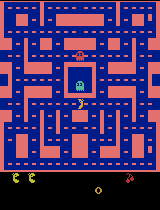

  Episode 3251/20000 | 2,321,500 decisions | 580,126 updates | 136.3 min
Episode 3251/20000 | score 640 | recent mean 1644.4 | exploration 15%
  Episode 3252/20000 | 2,322,000 decisions | 580,251 updates | 136.4 min
  Episode 3252/20000 | 2,322,500 decisions | 580,376 updates | 136.4 min
Episode 3252/20000 | score 2170 | recent mean 1630.0 | exploration 15%
  Episode 3253/20000 | 2,323,000 decisions | 580,501 updates | 136.4 min
  Episode 3253/20000 | 2,323,500 decisions | 580,626 updates | 136.5 min
Episode 3253/20000 | score 1480 | recent mean 1636.8 | exploration 15%
  Episode 3254/20000 | 2,324,000 decisions | 580,751 updates | 136.5 min
Episode 3254/20000 | score 790 | recent mean 1562.4 | exploration 15%
  Episode 3255/20000 | 2,324,500 decisions | 580,876 updates | 136.5 min
Episode 3255/20000 | score 840 | recent mean 1549.6 | exploration 15%
  Episode 3256/20000 | 2,325,000 decisions | 581,001 updates | 136.5 min
  Episode 3256/20000 | 2,325,500 decisions | 581,126 updates | 1

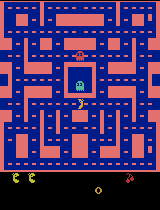

  Episode 3276/20000 | 2,340,000 decisions | 584,751 updates | 137.4 min
  Episode 3276/20000 | 2,340,500 decisions | 584,876 updates | 137.4 min
Episode 3276/20000 | score 2690 | recent mean 1327.2 | exploration 15%
  Episode 3277/20000 | 2,341,000 decisions | 585,001 updates | 137.4 min
  Episode 3277/20000 | 2,341,500 decisions | 585,126 updates | 137.5 min
Episode 3277/20000 | score 1440 | recent mean 1298.0 | exploration 15%
  Episode 3278/20000 | 2,342,000 decisions | 585,251 updates | 137.5 min
Episode 3278/20000 | score 750 | recent mean 1268.8 | exploration 15%
  Episode 3279/20000 | 2,342,500 decisions | 585,376 updates | 137.5 min
  Episode 3279/20000 | 2,343,000 decisions | 585,501 updates | 137.5 min
Episode 3279/20000 | score 1410 | recent mean 1293.6 | exploration 15%
  Episode 3280/20000 | 2,343,500 decisions | 585,626 updates | 137.6 min
  Episode 3280/20000 | 2,344,000 decisions | 585,751 updates | 137.6 min
Episode 3280/20000 | score 2570 | recent mean 1362.8 | explo

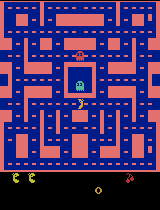

  Episode 3301/20000 | 2,359,500 decisions | 589,626 updates | 138.5 min
  Episode 3301/20000 | 2,360,000 decisions | 589,751 updates | 138.5 min
Episode 3301/20000 | score 1370 | recent mean 1444.8 | exploration 15%
  Episode 3302/20000 | 2,360,500 decisions | 589,876 updates | 138.5 min
Episode 3302/20000 | score 1170 | recent mean 1434.0 | exploration 15%
  Episode 3303/20000 | 2,361,000 decisions | 590,001 updates | 138.6 min
  Episode 3303/20000 | 2,361,500 decisions | 590,126 updates | 138.6 min
  Episode 3303/20000 | 2,362,000 decisions | 590,251 updates | 138.6 min
Episode 3303/20000 | score 2000 | recent mean 1484.0 | exploration 15%
  Episode 3304/20000 | 2,362,500 decisions | 590,376 updates | 138.6 min
Episode 3304/20000 | score 920 | recent mean 1464.4 | exploration 15%
  Episode 3305/20000 | 2,363,000 decisions | 590,501 updates | 138.7 min
  Episode 3305/20000 | 2,363,500 decisions | 590,626 updates | 138.7 min
Episode 3305/20000 | score 880 | recent mean 1396.8 | explor

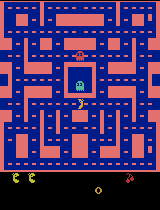

  Episode 3326/20000 | 2,380,000 decisions | 594,751 updates | 139.6 min
Episode 3326/20000 | score 1360 | recent mean 1332.4 | exploration 15%
  Episode 3327/20000 | 2,380,500 decisions | 594,876 updates | 139.7 min
  Episode 3327/20000 | 2,381,000 decisions | 595,001 updates | 139.7 min
Episode 3327/20000 | score 1050 | recent mean 1327.6 | exploration 15%
  Episode 3328/20000 | 2,381,500 decisions | 595,126 updates | 139.7 min
  Episode 3328/20000 | 2,382,000 decisions | 595,251 updates | 139.7 min
Episode 3328/20000 | score 2490 | recent mean 1347.2 | exploration 15%
  Episode 3329/20000 | 2,382,500 decisions | 595,376 updates | 139.8 min
  Episode 3329/20000 | 2,383,000 decisions | 595,501 updates | 139.8 min
Episode 3329/20000 | score 1230 | recent mean 1359.6 | exploration 15%
  Episode 3330/20000 | 2,383,500 decisions | 595,626 updates | 139.8 min
Episode 3330/20000 | score 770 | recent mean 1355.2 | exploration 15%
  Episode 3331/20000 | 2,384,000 decisions | 595,751 updates |

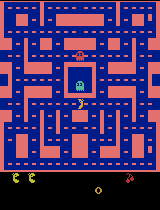

  Episode 3351/20000 | 2,401,500 decisions | 600,126 updates | 140.8 min
Episode 3351/20000 | score 2290 | recent mean 1613.2 | exploration 15%
  Episode 3352/20000 | 2,402,000 decisions | 600,251 updates | 140.9 min
  Episode 3352/20000 | 2,402,500 decisions | 600,376 updates | 140.9 min
Episode 3352/20000 | score 1420 | recent mean 1628.0 | exploration 15%
  Episode 3353/20000 | 2,403,000 decisions | 600,501 updates | 140.9 min
  Episode 3353/20000 | 2,403,500 decisions | 600,626 updates | 141.0 min
Episode 3353/20000 | score 1430 | recent mean 1585.6 | exploration 15%
  Episode 3354/20000 | 2,404,000 decisions | 600,751 updates | 141.0 min
  Episode 3354/20000 | 2,404,500 decisions | 600,876 updates | 141.0 min
Episode 3354/20000 | score 1550 | recent mean 1598.4 | exploration 15%
  Episode 3355/20000 | 2,405,000 decisions | 601,001 updates | 141.0 min
Episode 3355/20000 | score 1620 | recent mean 1632.4 | exploration 15%
  Episode 3356/20000 | 2,405,500 decisions | 601,126 updates 

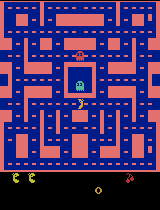

  Episode 3376/20000 | 2,422,000 decisions | 605,251 updates | 142.0 min
Episode 3376/20000 | score 780 | recent mean 1397.6 | exploration 15%
  Episode 3377/20000 | 2,422,500 decisions | 605,376 updates | 142.1 min
  Episode 3377/20000 | 2,423,000 decisions | 605,501 updates | 142.1 min
Episode 3377/20000 | score 1250 | recent mean 1390.8 | exploration 15%
  Episode 3378/20000 | 2,423,500 decisions | 605,626 updates | 142.1 min
Episode 3378/20000 | score 1100 | recent mean 1377.6 | exploration 15%
  Episode 3379/20000 | 2,424,000 decisions | 605,751 updates | 142.1 min
Episode 3379/20000 | score 380 | recent mean 1330.8 | exploration 15%
  Episode 3380/20000 | 2,424,500 decisions | 605,876 updates | 142.2 min
  Episode 3380/20000 | 2,425,000 decisions | 606,001 updates | 142.2 min
Episode 3380/20000 | score 770 | recent mean 1296.8 | exploration 15%
  Episode 3381/20000 | 2,425,500 decisions | 606,126 updates | 142.2 min
  Episode 3381/20000 | 2,426,000 decisions | 606,251 updates | 1

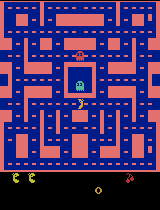

  Episode 3401/20000 | 2,441,500 decisions | 610,126 updates | 143.2 min
  Episode 3401/20000 | 2,442,000 decisions | 610,251 updates | 143.2 min
Episode 3401/20000 | score 1500 | recent mean 1328.0 | exploration 15%
  Episode 3402/20000 | 2,442,500 decisions | 610,376 updates | 143.2 min
  Episode 3402/20000 | 2,443,000 decisions | 610,501 updates | 143.3 min
Episode 3402/20000 | score 1320 | recent mean 1330.8 | exploration 15%
  Episode 3403/20000 | 2,443,500 decisions | 610,626 updates | 143.3 min
Episode 3403/20000 | score 1430 | recent mean 1344.0 | exploration 15%
  Episode 3404/20000 | 2,444,000 decisions | 610,751 updates | 143.3 min
  Episode 3404/20000 | 2,444,500 decisions | 610,876 updates | 143.3 min
Episode 3404/20000 | score 2790 | recent mean 1440.4 | exploration 15%
  Episode 3405/20000 | 2,445,000 decisions | 611,001 updates | 143.4 min
  Episode 3405/20000 | 2,445,500 decisions | 611,126 updates | 143.4 min
Episode 3405/20000 | score 1510 | recent mean 1470.0 | expl

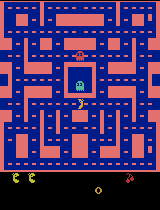

  Episode 3426/20000 | 2,462,500 decisions | 615,376 updates | 144.4 min
  Episode 3426/20000 | 2,463,000 decisions | 615,501 updates | 144.4 min
Episode 3426/20000 | score 2280 | recent mean 1678.0 | exploration 15%
  Episode 3427/20000 | 2,463,500 decisions | 615,626 updates | 144.4 min
Episode 3427/20000 | score 1260 | recent mean 1675.6 | exploration 15%
  Episode 3428/20000 | 2,464,000 decisions | 615,751 updates | 144.5 min
Episode 3428/20000 | score 1330 | recent mean 1671.6 | exploration 15%
  Episode 3429/20000 | 2,464,500 decisions | 615,876 updates | 144.5 min
  Episode 3429/20000 | 2,465,000 decisions | 616,001 updates | 144.5 min
Episode 3429/20000 | score 1170 | recent mean 1606.8 | exploration 15%
  Episode 3430/20000 | 2,465,500 decisions | 616,126 updates | 144.5 min
  Episode 3430/20000 | 2,466,000 decisions | 616,251 updates | 144.6 min
Episode 3430/20000 | score 1440 | recent mean 1604.0 | exploration 15%
  Episode 3431/20000 | 2,466,500 decisions | 616,376 updates 

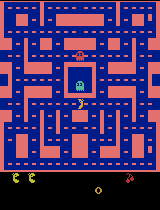

  Episode 3451/20000 | 2,481,000 decisions | 620,001 updates | 145.4 min
  Episode 3451/20000 | 2,481,500 decisions | 620,126 updates | 145.5 min
Episode 3451/20000 | score 1010 | recent mean 1188.8 | exploration 15%
  Episode 3452/20000 | 2,482,000 decisions | 620,251 updates | 145.5 min
  Episode 3452/20000 | 2,482,500 decisions | 620,376 updates | 145.5 min
Episode 3452/20000 | score 1670 | recent mean 1205.2 | exploration 15%
  Episode 3453/20000 | 2,483,000 decisions | 620,501 updates | 145.5 min
Episode 3453/20000 | score 740 | recent mean 1181.6 | exploration 15%
  Episode 3454/20000 | 2,483,500 decisions | 620,626 updates | 145.6 min
Episode 3454/20000 | score 980 | recent mean 1174.0 | exploration 15%
  Episode 3455/20000 | 2,484,000 decisions | 620,751 updates | 145.6 min
Episode 3455/20000 | score 850 | recent mean 1150.4 | exploration 15%
  Episode 3456/20000 | 2,484,500 decisions | 620,876 updates | 145.6 min
  Episode 3456/20000 | 2,485,000 decisions | 621,001 updates | 1

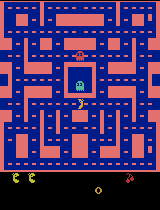

  Episode 3476/20000 | 2,500,000 decisions | 624,751 updates | 146.5 min
  Episode 3476/20000 | 2,500,500 decisions | 624,876 updates | 146.5 min
Episode 3476/20000 | score 1920 | recent mean 1309.2 | exploration 15%
  Episode 3477/20000 | 2,501,000 decisions | 625,001 updates | 146.6 min
  Episode 3477/20000 | 2,501,500 decisions | 625,126 updates | 146.6 min
Episode 3477/20000 | score 1340 | recent mean 1296.0 | exploration 15%
  Episode 3478/20000 | 2,502,000 decisions | 625,251 updates | 146.6 min
  Episode 3478/20000 | 2,502,500 decisions | 625,376 updates | 146.7 min
Episode 3478/20000 | score 2420 | recent mean 1363.2 | exploration 15%
  Episode 3479/20000 | 2,503,000 decisions | 625,501 updates | 146.7 min
  Episode 3479/20000 | 2,503,500 decisions | 625,626 updates | 146.7 min
Episode 3479/20000 | score 2200 | recent mean 1412.0 | exploration 15%
  Episode 3480/20000 | 2,504,000 decisions | 625,751 updates | 146.7 min
Episode 3480/20000 | score 1130 | recent mean 1423.2 | expl

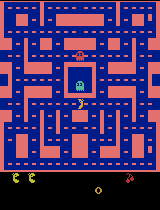

  Episode 3501/20000 | 2,521,000 decisions | 630,001 updates | 147.7 min
Episode 3501/20000 | score 600 | recent mean 1504.4 | exploration 15%
  Episode 3502/20000 | 2,521,500 decisions | 630,126 updates | 147.7 min
  Episode 3502/20000 | 2,522,000 decisions | 630,251 updates | 147.7 min
Episode 3502/20000 | score 910 | recent mean 1487.2 | exploration 15%
Episode 3503/20000 | score 310 | recent mean 1402.8 | exploration 15%
  Episode 3504/20000 | 2,522,500 decisions | 630,376 updates | 147.8 min
  Episode 3504/20000 | 2,523,000 decisions | 630,501 updates | 147.8 min
Episode 3504/20000 | score 1200 | recent mean 1362.8 | exploration 15%
  Episode 3505/20000 | 2,523,500 decisions | 630,626 updates | 147.8 min
  Episode 3505/20000 | 2,524,000 decisions | 630,751 updates | 147.9 min
Episode 3505/20000 | score 1100 | recent mean 1361.6 | exploration 15%
  Episode 3506/20000 | 2,524,500 decisions | 630,876 updates | 147.9 min
Episode 3506/20000 | score 1240 | recent mean 1383.2 | explorati

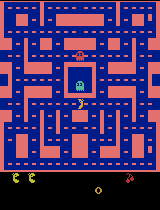

  Episode 3526/20000 | 2,539,500 decisions | 634,626 updates | 148.8 min
  Episode 3526/20000 | 2,540,000 decisions | 634,751 updates | 148.8 min
Episode 3526/20000 | score 1390 | recent mean 1386.8 | exploration 15%
  Episode 3527/20000 | 2,540,500 decisions | 634,876 updates | 148.8 min
Episode 3527/20000 | score 1590 | recent mean 1414.0 | exploration 15%
  Episode 3528/20000 | 2,541,000 decisions | 635,001 updates | 148.8 min
  Episode 3528/20000 | 2,541,500 decisions | 635,126 updates | 148.9 min
Episode 3528/20000 | score 960 | recent mean 1440.0 | exploration 15%
  Episode 3529/20000 | 2,542,000 decisions | 635,251 updates | 148.9 min
Episode 3529/20000 | score 1200 | recent mean 1440.0 | exploration 15%
  Episode 3530/20000 | 2,542,500 decisions | 635,376 updates | 148.9 min
  Episode 3530/20000 | 2,543,000 decisions | 635,501 updates | 148.9 min
Episode 3530/20000 | score 1590 | recent mean 1459.6 | exploration 15%
  Episode 3531/20000 | 2,543,500 decisions | 635,626 updates |

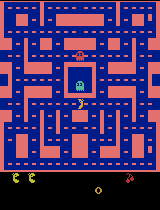

  Episode 3551/20000 | 2,560,500 decisions | 639,876 updates | 149.9 min
Episode 3551/20000 | score 850 | recent mean 1457.2 | exploration 15%
  Episode 3552/20000 | 2,561,000 decisions | 640,001 updates | 149.9 min
  Episode 3552/20000 | 2,561,500 decisions | 640,126 updates | 150.0 min
Episode 3552/20000 | score 1750 | recent mean 1463.6 | exploration 15%
  Episode 3553/20000 | 2,562,000 decisions | 640,251 updates | 150.0 min
  Episode 3553/20000 | 2,562,500 decisions | 640,376 updates | 150.0 min
Episode 3553/20000 | score 2090 | recent mean 1508.8 | exploration 15%
  Episode 3554/20000 | 2,563,000 decisions | 640,501 updates | 150.1 min
Episode 3554/20000 | score 720 | recent mean 1489.6 | exploration 15%
  Episode 3555/20000 | 2,563,500 decisions | 640,626 updates | 150.1 min
Episode 3555/20000 | score 1070 | recent mean 1468.8 | exploration 15%
  Episode 3556/20000 | 2,564,000 decisions | 640,751 updates | 150.1 min
  Episode 3556/20000 | 2,564,500 decisions | 640,876 updates | 

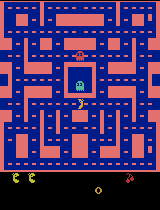

  Episode 3576/20000 | 2,580,000 decisions | 644,751 updates | 151.0 min
Episode 3576/20000 | score 830 | recent mean 1398.0 | exploration 15%
  Episode 3577/20000 | 2,580,500 decisions | 644,876 updates | 151.0 min
  Episode 3577/20000 | 2,581,000 decisions | 645,001 updates | 151.1 min
Episode 3577/20000 | score 1300 | recent mean 1380.0 | exploration 15%
  Episode 3578/20000 | 2,581,500 decisions | 645,126 updates | 151.1 min
  Episode 3578/20000 | 2,582,000 decisions | 645,251 updates | 151.1 min
  Episode 3578/20000 | 2,582,500 decisions | 645,376 updates | 151.2 min
Episode 3578/20000 | score 2010 | recent mean 1376.8 | exploration 15%
  Episode 3579/20000 | 2,583,000 decisions | 645,501 updates | 151.2 min
Episode 3579/20000 | score 1720 | recent mean 1416.8 | exploration 15%
  Episode 3580/20000 | 2,583,500 decisions | 645,626 updates | 151.2 min
  Episode 3580/20000 | 2,584,000 decisions | 645,751 updates | 151.3 min
Episode 3580/20000 | score 2570 | recent mean 1476.8 | explo

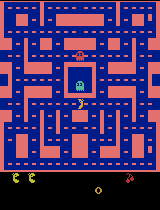

  Episode 3601/20000 | 2,599,000 decisions | 649,501 updates | 152.1 min
Episode 3601/20000 | score 1250 | recent mean 1451.2 | exploration 15%
  Episode 3602/20000 | 2,599,500 decisions | 649,626 updates | 152.2 min
  Episode 3602/20000 | 2,600,000 decisions | 649,751 updates | 152.2 min
Episode 3602/20000 | score 1070 | recent mean 1442.0 | exploration 15%
  Episode 3603/20000 | 2,600,500 decisions | 649,876 updates | 152.2 min
Episode 3603/20000 | score 1840 | recent mean 1435.2 | exploration 15%
  Episode 3604/20000 | 2,601,000 decisions | 650,001 updates | 152.3 min
  Episode 3604/20000 | 2,601,500 decisions | 650,126 updates | 152.3 min
Episode 3604/20000 | score 1210 | recent mean 1414.8 | exploration 15%
  Episode 3605/20000 | 2,602,000 decisions | 650,251 updates | 152.3 min
Episode 3605/20000 | score 760 | recent mean 1342.4 | exploration 15%
  Episode 3606/20000 | 2,602,500 decisions | 650,376 updates | 152.3 min
  Episode 3606/20000 | 2,603,000 decisions | 650,501 updates |

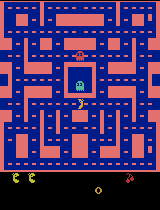

  Episode 3626/20000 | 2,620,000 decisions | 654,751 updates | 153.3 min
  Episode 3626/20000 | 2,620,500 decisions | 654,876 updates | 153.4 min
Episode 3626/20000 | score 1180 | recent mean 1482.4 | exploration 15%
  Episode 3627/20000 | 2,621,000 decisions | 655,001 updates | 153.4 min
Episode 3627/20000 | score 1280 | recent mean 1490.8 | exploration 15%
  Episode 3628/20000 | 2,621,500 decisions | 655,126 updates | 153.4 min
  Episode 3628/20000 | 2,622,000 decisions | 655,251 updates | 153.4 min
Episode 3628/20000 | score 1080 | recent mean 1460.4 | exploration 15%
  Episode 3629/20000 | 2,622,500 decisions | 655,376 updates | 153.5 min
Episode 3629/20000 | score 960 | recent mean 1450.4 | exploration 15%
  Episode 3630/20000 | 2,623,000 decisions | 655,501 updates | 153.5 min
  Episode 3630/20000 | 2,623,500 decisions | 655,626 updates | 153.5 min
Episode 3630/20000 | score 1720 | recent mean 1488.8 | exploration 15%
  Episode 3631/20000 | 2,624,000 decisions | 655,751 updates |

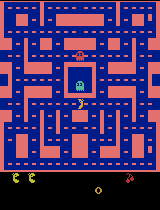

  Episode 3651/20000 | 2,639,500 decisions | 659,626 updates | 154.4 min
Episode 3651/20000 | score 1150 | recent mean 1474.4 | exploration 15%
  Episode 3652/20000 | 2,640,000 decisions | 659,751 updates | 154.5 min
  Episode 3652/20000 | 2,640,500 decisions | 659,876 updates | 154.5 min
Episode 3652/20000 | score 1500 | recent mean 1483.2 | exploration 15%
  Episode 3653/20000 | 2,641,000 decisions | 660,001 updates | 154.5 min
  Episode 3653/20000 | 2,641,500 decisions | 660,126 updates | 154.5 min
Episode 3653/20000 | score 1130 | recent mean 1485.2 | exploration 15%
  Episode 3654/20000 | 2,642,000 decisions | 660,251 updates | 154.6 min
Episode 3654/20000 | score 1260 | recent mean 1497.2 | exploration 15%
  Episode 3655/20000 | 2,642,500 decisions | 660,376 updates | 154.6 min
  Episode 3655/20000 | 2,643,000 decisions | 660,501 updates | 154.6 min
Episode 3655/20000 | score 1040 | recent mean 1470.0 | exploration 15%
  Episode 3656/20000 | 2,643,500 decisions | 660,626 updates 

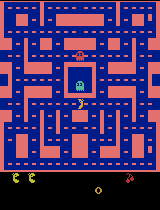

  Episode 3676/20000 | 2,659,500 decisions | 664,626 updates | 155.5 min
  Episode 3676/20000 | 2,660,000 decisions | 664,751 updates | 155.6 min
Episode 3676/20000 | score 1180 | recent mean 1544.0 | exploration 15%
  Episode 3677/20000 | 2,660,500 decisions | 664,876 updates | 155.6 min
Episode 3677/20000 | score 750 | recent mean 1514.0 | exploration 15%
  Episode 3678/20000 | 2,661,000 decisions | 665,001 updates | 155.6 min
  Episode 3678/20000 | 2,661,500 decisions | 665,126 updates | 155.7 min
Episode 3678/20000 | score 1690 | recent mean 1536.4 | exploration 15%
  Episode 3679/20000 | 2,662,000 decisions | 665,251 updates | 155.7 min
  Episode 3679/20000 | 2,662,500 decisions | 665,376 updates | 155.7 min
Episode 3679/20000 | score 1170 | recent mean 1532.8 | exploration 15%
  Episode 3680/20000 | 2,663,000 decisions | 665,501 updates | 155.7 min
  Episode 3680/20000 | 2,663,500 decisions | 665,626 updates | 155.8 min
Episode 3680/20000 | score 1990 | recent mean 1570.8 | explo

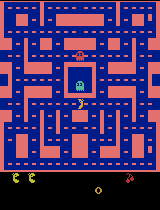

Episode 3701/20000 | score 530 | recent mean 1484.4 | exploration 15%
  Episode 3702/20000 | 2,681,000 decisions | 670,001 updates | 156.8 min
  Episode 3702/20000 | 2,681,500 decisions | 670,126 updates | 156.8 min
Episode 3702/20000 | score 1330 | recent mean 1507.6 | exploration 15%
  Episode 3703/20000 | 2,682,000 decisions | 670,251 updates | 156.9 min
  Episode 3703/20000 | 2,682,500 decisions | 670,376 updates | 156.9 min
Episode 3703/20000 | score 2090 | recent mean 1523.6 | exploration 15%
  Episode 3704/20000 | 2,683,000 decisions | 670,501 updates | 156.9 min
  Episode 3704/20000 | 2,683,500 decisions | 670,626 updates | 156.9 min
Episode 3704/20000 | score 1670 | recent mean 1543.6 | exploration 15%
  Episode 3705/20000 | 2,684,000 decisions | 670,751 updates | 157.0 min
Episode 3705/20000 | score 690 | recent mean 1491.6 | exploration 15%
  Episode 3706/20000 | 2,684,500 decisions | 670,876 updates | 157.0 min
  Episode 3706/20000 | 2,685,000 decisions | 671,001 updates | 

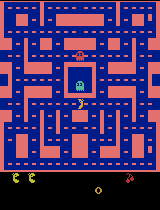

  Episode 3726/20000 | 2,700,500 decisions | 674,876 updates | 157.9 min
  Episode 3726/20000 | 2,701,000 decisions | 675,001 updates | 158.0 min
Episode 3726/20000 | score 2100 | recent mean 1602.0 | exploration 15%
  Episode 3727/20000 | 2,701,500 decisions | 675,126 updates | 158.0 min
  Episode 3727/20000 | 2,702,000 decisions | 675,251 updates | 158.0 min
Episode 3727/20000 | score 2620 | recent mean 1653.6 | exploration 15%
  Episode 3728/20000 | 2,702,500 decisions | 675,376 updates | 158.0 min
  Episode 3728/20000 | 2,703,000 decisions | 675,501 updates | 158.1 min
Episode 3728/20000 | score 1510 | recent mean 1630.4 | exploration 15%
  Episode 3729/20000 | 2,703,500 decisions | 675,626 updates | 158.1 min
  Episode 3729/20000 | 2,704,000 decisions | 675,751 updates | 158.1 min
Episode 3729/20000 | score 1090 | recent mean 1607.2 | exploration 15%
  Episode 3730/20000 | 2,704,500 decisions | 675,876 updates | 158.1 min
  Episode 3730/20000 | 2,705,000 decisions | 676,001 update

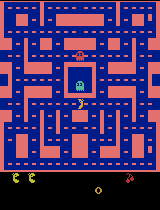

  Episode 3751/20000 | 2,722,000 decisions | 680,251 updates | 159.1 min
  Episode 3751/20000 | 2,722,500 decisions | 680,376 updates | 159.1 min
Episode 3751/20000 | score 1600 | recent mean 1534.8 | exploration 15%
  Episode 3752/20000 | 2,723,000 decisions | 680,501 updates | 159.2 min
  Episode 3752/20000 | 2,723,500 decisions | 680,626 updates | 159.2 min
Episode 3752/20000 | score 1160 | recent mean 1476.4 | exploration 15%
  Episode 3753/20000 | 2,724,000 decisions | 680,751 updates | 159.2 min
  Episode 3753/20000 | 2,724,500 decisions | 680,876 updates | 159.3 min
Episode 3753/20000 | score 2080 | recent mean 1499.2 | exploration 15%
  Episode 3754/20000 | 2,725,000 decisions | 681,001 updates | 159.3 min
  Episode 3754/20000 | 2,725,500 decisions | 681,126 updates | 159.3 min
Episode 3754/20000 | score 1240 | recent mean 1505.2 | exploration 15%
  Episode 3755/20000 | 2,726,000 decisions | 681,251 updates | 159.3 min
Episode 3755/20000 | score 450 | recent mean 1474.4 | explo

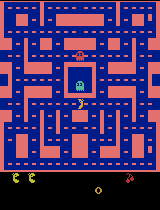

  Episode 3776/20000 | 2,743,500 decisions | 685,626 updates | 160.3 min
Episode 3776/20000 | score 900 | recent mean 1574.4 | exploration 15%
  Episode 3777/20000 | 2,744,000 decisions | 685,751 updates | 160.3 min
  Episode 3777/20000 | 2,744,500 decisions | 685,876 updates | 160.4 min
Episode 3777/20000 | score 1480 | recent mean 1587.2 | exploration 15%
  Episode 3778/20000 | 2,745,000 decisions | 686,001 updates | 160.4 min
Episode 3778/20000 | score 500 | recent mean 1524.0 | exploration 15%
  Episode 3779/20000 | 2,745,500 decisions | 686,126 updates | 160.4 min
Episode 3779/20000 | score 1190 | recent mean 1522.0 | exploration 15%
  Episode 3780/20000 | 2,746,000 decisions | 686,251 updates | 160.5 min
  Episode 3780/20000 | 2,746,500 decisions | 686,376 updates | 160.5 min
Episode 3780/20000 | score 1430 | recent mean 1561.2 | exploration 15%
  Episode 3781/20000 | 2,747,000 decisions | 686,501 updates | 160.5 min
  Episode 3781/20000 | 2,747,500 decisions | 686,626 updates | 

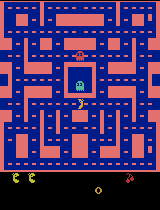

  Episode 3801/20000 | 2,764,500 decisions | 690,876 updates | 161.5 min
  Episode 3801/20000 | 2,765,000 decisions | 691,001 updates | 161.5 min
Episode 3801/20000 | score 1840 | recent mean 1522.0 | exploration 15%
  Episode 3802/20000 | 2,765,500 decisions | 691,126 updates | 161.6 min
Episode 3802/20000 | score 630 | recent mean 1488.0 | exploration 15%
  Episode 3803/20000 | 2,766,000 decisions | 691,251 updates | 161.6 min
  Episode 3803/20000 | 2,766,500 decisions | 691,376 updates | 161.6 min
Episode 3803/20000 | score 1340 | recent mean 1521.6 | exploration 15%
  Episode 3804/20000 | 2,767,000 decisions | 691,501 updates | 161.6 min
Episode 3804/20000 | score 1810 | recent mean 1546.4 | exploration 15%
  Episode 3805/20000 | 2,767,500 decisions | 691,626 updates | 161.7 min
  Episode 3805/20000 | 2,768,000 decisions | 691,751 updates | 161.7 min
Episode 3805/20000 | score 1730 | recent mean 1558.4 | exploration 15%
  Episode 3806/20000 | 2,768,500 decisions | 691,876 updates |

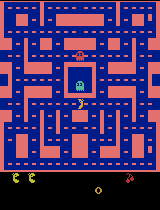

  Episode 3826/20000 | 2,786,000 decisions | 696,251 updates | 162.7 min
  Episode 3826/20000 | 2,786,500 decisions | 696,376 updates | 162.7 min
Episode 3826/20000 | score 2630 | recent mean 1660.8 | exploration 15%
  Episode 3827/20000 | 2,787,000 decisions | 696,501 updates | 162.8 min
  Episode 3827/20000 | 2,787,500 decisions | 696,626 updates | 162.8 min
Episode 3827/20000 | score 1980 | recent mean 1714.8 | exploration 15%
  Episode 3828/20000 | 2,788,000 decisions | 696,751 updates | 162.8 min
Episode 3828/20000 | score 1620 | recent mean 1726.0 | exploration 15%
  Episode 3829/20000 | 2,788,500 decisions | 696,876 updates | 162.8 min
  Episode 3829/20000 | 2,789,000 decisions | 697,001 updates | 162.9 min
Episode 3829/20000 | score 1010 | recent mean 1694.0 | exploration 15%
  Episode 3830/20000 | 2,789,500 decisions | 697,126 updates | 162.9 min
  Episode 3830/20000 | 2,790,000 decisions | 697,251 updates | 162.9 min
Episode 3830/20000 | score 1070 | recent mean 1667.6 | expl

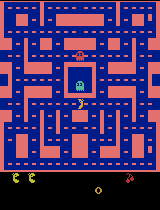

  Episode 3851/20000 | 2,806,500 decisions | 701,376 updates | 163.9 min
Episode 3851/20000 | score 1590 | recent mean 1386.8 | exploration 15%
  Episode 3852/20000 | 2,807,000 decisions | 701,501 updates | 163.9 min
Episode 3852/20000 | score 2340 | recent mean 1401.2 | exploration 15%
  Episode 3853/20000 | 2,807,500 decisions | 701,626 updates | 163.9 min
  Episode 3853/20000 | 2,808,000 decisions | 701,751 updates | 164.0 min
Episode 3853/20000 | score 1220 | recent mean 1385.2 | exploration 15%
  Episode 3854/20000 | 2,808,500 decisions | 701,876 updates | 164.0 min
  Episode 3854/20000 | 2,809,000 decisions | 702,001 updates | 164.0 min
Episode 3854/20000 | score 1390 | recent mean 1400.4 | exploration 15%
  Episode 3855/20000 | 2,809,500 decisions | 702,126 updates | 164.0 min
  Episode 3855/20000 | 2,810,000 decisions | 702,251 updates | 164.1 min
Episode 3855/20000 | score 2300 | recent mean 1449.6 | exploration 15%
  Episode 3856/20000 | 2,810,500 decisions | 702,376 updates 

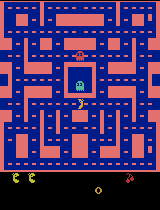

  Episode 3876/20000 | 2,826,500 decisions | 706,376 updates | 165.0 min
  Episode 3876/20000 | 2,827,000 decisions | 706,501 updates | 165.0 min
Episode 3876/20000 | score 1130 | recent mean 1584.4 | exploration 15%
  Episode 3877/20000 | 2,827,500 decisions | 706,626 updates | 165.1 min
Episode 3877/20000 | score 450 | recent mean 1508.8 | exploration 15%
  Episode 3878/20000 | 2,828,000 decisions | 706,751 updates | 165.1 min
  Episode 3878/20000 | 2,828,500 decisions | 706,876 updates | 165.1 min
Episode 3878/20000 | score 1610 | recent mean 1524.4 | exploration 15%
  Episode 3879/20000 | 2,829,000 decisions | 707,001 updates | 165.1 min
Episode 3879/20000 | score 1360 | recent mean 1523.2 | exploration 15%
  Episode 3880/20000 | 2,829,500 decisions | 707,126 updates | 165.2 min
  Episode 3880/20000 | 2,830,000 decisions | 707,251 updates | 165.2 min
Episode 3880/20000 | score 1530 | recent mean 1492.4 | exploration 15%
  Episode 3881/20000 | 2,830,500 decisions | 707,376 updates |

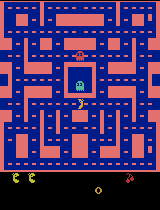

  Episode 3901/20000 | 2,849,000 decisions | 712,001 updates | 166.3 min
Episode 3901/20000 | score 1200 | recent mean 1605.6 | exploration 15%
  Episode 3902/20000 | 2,849,500 decisions | 712,126 updates | 166.3 min
Episode 3902/20000 | score 1090 | recent mean 1631.2 | exploration 15%
  Episode 3903/20000 | 2,850,000 decisions | 712,251 updates | 166.3 min
  Episode 3903/20000 | 2,850,500 decisions | 712,376 updates | 166.4 min
Episode 3903/20000 | score 1180 | recent mean 1614.0 | exploration 15%
  Episode 3904/20000 | 2,851,000 decisions | 712,501 updates | 166.4 min
  Episode 3904/20000 | 2,851,500 decisions | 712,626 updates | 166.4 min
  Episode 3904/20000 | 2,852,000 decisions | 712,751 updates | 166.5 min
Episode 3904/20000 | score 2480 | recent mean 1658.8 | exploration 15%
  Episode 3905/20000 | 2,852,500 decisions | 712,876 updates | 166.5 min
  Episode 3905/20000 | 2,853,000 decisions | 713,001 updates | 166.5 min
Episode 3905/20000 | score 1640 | recent mean 1663.2 | expl

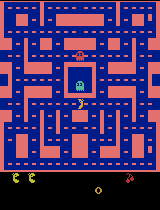

  Episode 3926/20000 | 2,869,500 decisions | 717,126 updates | 167.4 min
  Episode 3926/20000 | 2,870,000 decisions | 717,251 updates | 167.5 min
Episode 3926/20000 | score 1950 | recent mean 1562.8 | exploration 15%
  Episode 3927/20000 | 2,870,500 decisions | 717,376 updates | 167.5 min
  Episode 3927/20000 | 2,871,000 decisions | 717,501 updates | 167.5 min
Episode 3927/20000 | score 1760 | recent mean 1589.6 | exploration 15%
  Episode 3928/20000 | 2,871,500 decisions | 717,626 updates | 167.6 min
Episode 3928/20000 | score 2450 | recent mean 1640.4 | exploration 15%
  Episode 3929/20000 | 2,872,000 decisions | 717,751 updates | 167.6 min
  Episode 3929/20000 | 2,872,500 decisions | 717,876 updates | 167.6 min
Episode 3929/20000 | score 1220 | recent mean 1590.0 | exploration 15%
Episode 3930/20000 | score 230 | recent mean 1533.6 | exploration 15%
  Episode 3931/20000 | 2,873,000 decisions | 718,001 updates | 167.6 min
  Episode 3931/20000 | 2,873,500 decisions | 718,126 updates |

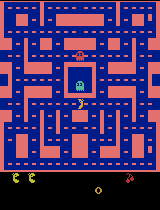

  Episode 3951/20000 | 2,888,500 decisions | 721,876 updates | 168.5 min
  Episode 3951/20000 | 2,889,000 decisions | 722,001 updates | 168.5 min
Episode 3951/20000 | score 980 | recent mean 1369.6 | exploration 15%
  Episode 3952/20000 | 2,889,500 decisions | 722,126 updates | 168.6 min
  Episode 3952/20000 | 2,890,000 decisions | 722,251 updates | 168.6 min
Episode 3952/20000 | score 2090 | recent mean 1382.8 | exploration 15%
  Episode 3953/20000 | 2,890,500 decisions | 722,376 updates | 168.6 min
Episode 3953/20000 | score 1220 | recent mean 1333.6 | exploration 15%
  Episode 3954/20000 | 2,891,000 decisions | 722,501 updates | 168.7 min
  Episode 3954/20000 | 2,891,500 decisions | 722,626 updates | 168.7 min
Episode 3954/20000 | score 2340 | recent mean 1378.4 | exploration 15%
  Episode 3955/20000 | 2,892,000 decisions | 722,751 updates | 168.7 min
  Episode 3955/20000 | 2,892,500 decisions | 722,876 updates | 168.8 min
Episode 3955/20000 | score 2500 | recent mean 1469.2 | explo

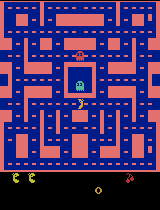

  Episode 3976/20000 | 2,909,500 decisions | 727,126 updates | 169.7 min
  Episode 3976/20000 | 2,910,000 decisions | 727,251 updates | 169.8 min
Episode 3976/20000 | score 1830 | recent mean 1671.2 | exploration 15%
  Episode 3977/20000 | 2,910,500 decisions | 727,376 updates | 169.8 min
  Episode 3977/20000 | 2,911,000 decisions | 727,501 updates | 169.8 min
Episode 3977/20000 | score 850 | recent mean 1621.6 | exploration 15%
  Episode 3978/20000 | 2,911,500 decisions | 727,626 updates | 169.9 min
Episode 3978/20000 | score 1780 | recent mean 1644.0 | exploration 15%
  Episode 3979/20000 | 2,912,000 decisions | 727,751 updates | 169.9 min
  Episode 3979/20000 | 2,912,500 decisions | 727,876 updates | 169.9 min
Episode 3979/20000 | score 1170 | recent mean 1597.2 | exploration 15%
  Episode 3980/20000 | 2,913,000 decisions | 728,001 updates | 170.0 min
  Episode 3980/20000 | 2,913,500 decisions | 728,126 updates | 170.0 min
Episode 3980/20000 | score 2180 | recent mean 1584.4 | explo

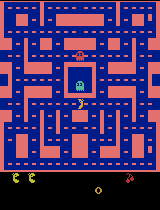

  Episode 4001/20000 | 2,929,500 decisions | 732,126 updates | 170.9 min
Episode 4001/20000 | score 1360 | recent mean 1386.4 | exploration 15%
  Episode 4002/20000 | 2,930,000 decisions | 732,251 updates | 171.0 min
  Episode 4002/20000 | 2,930,500 decisions | 732,376 updates | 171.0 min
  Episode 4002/20000 | 2,931,000 decisions | 732,501 updates | 171.0 min
Episode 4002/20000 | score 2150 | recent mean 1438.4 | exploration 15%
  Episode 4003/20000 | 2,931,500 decisions | 732,626 updates | 171.1 min
Episode 4003/20000 | score 1830 | recent mean 1440.4 | exploration 15%
  Episode 4004/20000 | 2,932,000 decisions | 732,751 updates | 171.1 min
  Episode 4004/20000 | 2,932,500 decisions | 732,876 updates | 171.1 min
Episode 4004/20000 | score 1790 | recent mean 1465.2 | exploration 15%
  Episode 4005/20000 | 2,933,000 decisions | 733,001 updates | 171.1 min
  Episode 4005/20000 | 2,933,500 decisions | 733,126 updates | 171.2 min
Episode 4005/20000 | score 1720 | recent mean 1446.8 | expl

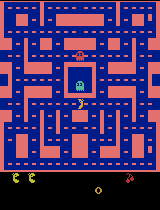

  Episode 4026/20000 | 2,951,000 decisions | 737,501 updates | 172.2 min
  Episode 4026/20000 | 2,951,500 decisions | 737,626 updates | 172.2 min
Episode 4026/20000 | score 1230 | recent mean 1647.6 | exploration 15%
  Episode 4027/20000 | 2,952,000 decisions | 737,751 updates | 172.3 min
Episode 4027/20000 | score 920 | recent mean 1598.4 | exploration 15%
  Episode 4028/20000 | 2,952,500 decisions | 737,876 updates | 172.3 min
  Episode 4028/20000 | 2,953,000 decisions | 738,001 updates | 172.3 min
Episode 4028/20000 | score 1300 | recent mean 1577.2 | exploration 15%
  Episode 4029/20000 | 2,953,500 decisions | 738,126 updates | 172.4 min
Episode 4029/20000 | score 1200 | recent mean 1553.6 | exploration 15%
  Episode 4030/20000 | 2,954,000 decisions | 738,251 updates | 172.4 min
  Episode 4030/20000 | 2,954,500 decisions | 738,376 updates | 172.4 min
Episode 4030/20000 | score 1890 | recent mean 1560.4 | exploration 15%
  Episode 4031/20000 | 2,955,000 decisions | 738,501 updates |

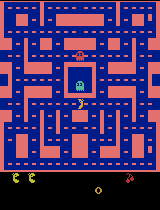

  Episode 4051/20000 | 2,971,000 decisions | 742,501 updates | 173.4 min
  Episode 4051/20000 | 2,971,500 decisions | 742,626 updates | 173.4 min
Episode 4051/20000 | score 1500 | recent mean 1461.6 | exploration 15%
  Episode 4052/20000 | 2,972,000 decisions | 742,751 updates | 173.4 min
  Episode 4052/20000 | 2,972,500 decisions | 742,876 updates | 173.4 min
Episode 4052/20000 | score 1780 | recent mean 1496.0 | exploration 15%
  Episode 4053/20000 | 2,973,000 decisions | 743,001 updates | 173.5 min
  Episode 4053/20000 | 2,973,500 decisions | 743,126 updates | 173.5 min
Episode 4053/20000 | score 2130 | recent mean 1529.2 | exploration 15%
  Episode 4054/20000 | 2,974,000 decisions | 743,251 updates | 173.5 min
Episode 4054/20000 | score 1120 | recent mean 1526.0 | exploration 15%
  Episode 4055/20000 | 2,974,500 decisions | 743,376 updates | 173.5 min
  Episode 4055/20000 | 2,975,000 decisions | 743,501 updates | 173.6 min
Episode 4055/20000 | score 1710 | recent mean 1518.8 | expl

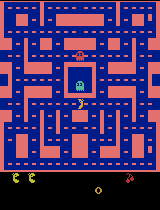

  Episode 4076/20000 | 2,991,500 decisions | 747,626 updates | 174.5 min
  Episode 4076/20000 | 2,992,000 decisions | 747,751 updates | 174.5 min
Episode 4076/20000 | score 1610 | recent mean 1520.0 | exploration 15%
  Episode 4077/20000 | 2,992,500 decisions | 747,876 updates | 174.6 min
  Episode 4077/20000 | 2,993,000 decisions | 748,001 updates | 174.6 min
Episode 4077/20000 | score 2030 | recent mean 1530.0 | exploration 15%
  Episode 4078/20000 | 2,993,500 decisions | 748,126 updates | 174.6 min
  Episode 4078/20000 | 2,994,000 decisions | 748,251 updates | 174.7 min
Episode 4078/20000 | score 1320 | recent mean 1497.6 | exploration 15%
  Episode 4079/20000 | 2,994,500 decisions | 748,376 updates | 174.7 min
  Episode 4079/20000 | 2,995,000 decisions | 748,501 updates | 174.7 min
Episode 4079/20000 | score 1240 | recent mean 1502.4 | exploration 15%
  Episode 4080/20000 | 2,995,500 decisions | 748,626 updates | 174.7 min
Episode 4080/20000 | score 1060 | recent mean 1476.4 | expl

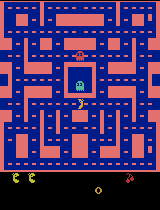

  Episode 4101/20000 | 3,013,000 decisions | 753,001 updates | 175.8 min
  Episode 4101/20000 | 3,013,500 decisions | 753,126 updates | 175.8 min
Episode 4101/20000 | score 1330 | recent mean 1650.8 | exploration 15%
  Episode 4102/20000 | 3,014,000 decisions | 753,251 updates | 175.8 min
Episode 4102/20000 | score 1300 | recent mean 1621.6 | exploration 15%
  Episode 4103/20000 | 3,014,500 decisions | 753,376 updates | 175.9 min
  Episode 4103/20000 | 3,015,000 decisions | 753,501 updates | 175.9 min
Episode 4103/20000 | score 1910 | recent mean 1645.2 | exploration 15%
  Episode 4104/20000 | 3,015,500 decisions | 753,626 updates | 175.9 min
  Episode 4104/20000 | 3,016,000 decisions | 753,751 updates | 175.9 min
Episode 4104/20000 | score 1340 | recent mean 1649.2 | exploration 15%
  Episode 4105/20000 | 3,016,500 decisions | 753,876 updates | 176.0 min
  Episode 4105/20000 | 3,017,000 decisions | 754,001 updates | 176.0 min
Episode 4105/20000 | score 2040 | recent mean 1688.4 | expl

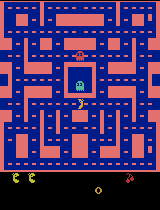

  Episode 4126/20000 | 3,035,000 decisions | 758,501 updates | 177.1 min
  Episode 4126/20000 | 3,035,500 decisions | 758,626 updates | 177.1 min
Episode 4126/20000 | score 1990 | recent mean 1631.2 | exploration 15%
  Episode 4127/20000 | 3,036,000 decisions | 758,751 updates | 177.1 min
Episode 4127/20000 | score 2330 | recent mean 1672.4 | exploration 15%
  Episode 4128/20000 | 3,036,500 decisions | 758,876 updates | 177.1 min
  Episode 4128/20000 | 3,037,000 decisions | 759,001 updates | 177.2 min
Episode 4128/20000 | score 2570 | recent mean 1698.8 | exploration 15%
  Episode 4129/20000 | 3,037,500 decisions | 759,126 updates | 177.2 min
  Episode 4129/20000 | 3,038,000 decisions | 759,251 updates | 177.2 min
Episode 4129/20000 | score 1370 | recent mean 1700.0 | exploration 15%
  Episode 4130/20000 | 3,038,500 decisions | 759,376 updates | 177.3 min
  Episode 4130/20000 | 3,039,000 decisions | 759,501 updates | 177.3 min
Episode 4130/20000 | score 2570 | recent mean 1721.2 | expl

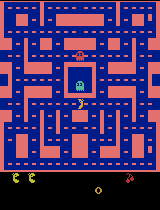

  Episode 4151/20000 | 3,056,000 decisions | 763,751 updates | 178.3 min
  Episode 4151/20000 | 3,056,500 decisions | 763,876 updates | 178.3 min
Episode 4151/20000 | score 1660 | recent mean 1884.0 | exploration 15%
  Episode 4152/20000 | 3,057,000 decisions | 764,001 updates | 178.3 min
  Episode 4152/20000 | 3,057,500 decisions | 764,126 updates | 178.4 min
Episode 4152/20000 | score 1470 | recent mean 1849.6 | exploration 15%
  Episode 4153/20000 | 3,058,000 decisions | 764,251 updates | 178.4 min
  Episode 4153/20000 | 3,058,500 decisions | 764,376 updates | 178.4 min
Episode 4153/20000 | score 1760 | recent mean 1817.2 | exploration 15%
  Episode 4154/20000 | 3,059,000 decisions | 764,501 updates | 178.5 min
  Episode 4154/20000 | 3,059,500 decisions | 764,626 updates | 178.5 min
Episode 4154/20000 | score 2010 | recent mean 1842.8 | exploration 15%
  Episode 4155/20000 | 3,060,000 decisions | 764,751 updates | 178.5 min
  Episode 4155/20000 | 3,060,500 decisions | 764,876 update

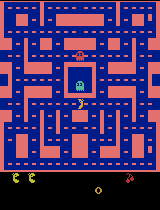

  Episode 4176/20000 | 3,076,500 decisions | 768,876 updates | 179.5 min
  Episode 4176/20000 | 3,077,000 decisions | 769,001 updates | 179.5 min
Episode 4176/20000 | score 1490 | recent mean 1583.6 | exploration 15%
  Episode 4177/20000 | 3,077,500 decisions | 769,126 updates | 179.6 min
Episode 4177/20000 | score 1000 | recent mean 1564.8 | exploration 15%
  Episode 4178/20000 | 3,078,000 decisions | 769,251 updates | 179.6 min
  Episode 4178/20000 | 3,078,500 decisions | 769,376 updates | 179.6 min
Episode 4178/20000 | score 2860 | recent mean 1608.8 | exploration 15%
  Episode 4179/20000 | 3,079,000 decisions | 769,501 updates | 179.6 min
  Episode 4179/20000 | 3,079,500 decisions | 769,626 updates | 179.7 min
Episode 4179/20000 | score 1690 | recent mean 1596.0 | exploration 15%
  Episode 4180/20000 | 3,080,000 decisions | 769,751 updates | 179.7 min
  Episode 4180/20000 | 3,080,500 decisions | 769,876 updates | 179.7 min
Episode 4180/20000 | score 2500 | recent mean 1572.4 | expl

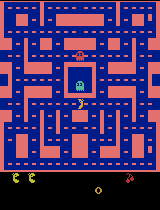

  Episode 4201/20000 | 3,099,500 decisions | 774,626 updates | 180.8 min
Episode 4201/20000 | score 2190 | recent mean 1966.4 | exploration 15%
  Episode 4202/20000 | 3,100,000 decisions | 774,751 updates | 180.9 min
  Episode 4202/20000 | 3,100,500 decisions | 774,876 updates | 180.9 min
Episode 4202/20000 | score 1260 | recent mean 1976.8 | exploration 15%
  Episode 4203/20000 | 3,101,000 decisions | 775,001 updates | 180.9 min
  Episode 4203/20000 | 3,101,500 decisions | 775,126 updates | 180.9 min
Episode 4203/20000 | score 1660 | recent mean 1928.8 | exploration 15%
  Episode 4204/20000 | 3,102,000 decisions | 775,251 updates | 181.0 min
  Episode 4204/20000 | 3,102,500 decisions | 775,376 updates | 181.0 min
Episode 4204/20000 | score 880 | recent mean 1896.4 | exploration 15%
  Episode 4205/20000 | 3,103,000 decisions | 775,501 updates | 181.0 min
Episode 4205/20000 | score 2480 | recent mean 1895.6 | exploration 15%
  Episode 4206/20000 | 3,103,500 decisions | 775,626 updates |

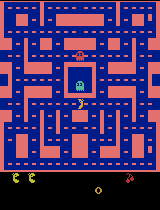

  Episode 4226/20000 | 3,121,000 decisions | 780,001 updates | 182.1 min
  Episode 4226/20000 | 3,121,500 decisions | 780,126 updates | 182.2 min
Episode 4226/20000 | score 1130 | recent mean 1590.8 | exploration 15%
  Episode 4227/20000 | 3,122,000 decisions | 780,251 updates | 182.2 min
Episode 4227/20000 | score 510 | recent mean 1560.8 | exploration 15%
  Episode 4228/20000 | 3,122,500 decisions | 780,376 updates | 182.2 min
Episode 4228/20000 | score 940 | recent mean 1532.0 | exploration 15%
  Episode 4229/20000 | 3,123,000 decisions | 780,501 updates | 182.3 min
  Episode 4229/20000 | 3,123,500 decisions | 780,626 updates | 182.3 min
Episode 4229/20000 | score 900 | recent mean 1532.8 | exploration 15%
  Episode 4230/20000 | 3,124,000 decisions | 780,751 updates | 182.3 min
Episode 4230/20000 | score 830 | recent mean 1466.8 | exploration 15%
  Episode 4231/20000 | 3,124,500 decisions | 780,876 updates | 182.4 min
  Episode 4231/20000 | 3,125,000 decisions | 781,001 updates | 18

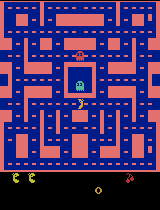

  Episode 4251/20000 | 3,141,500 decisions | 785,126 updates | 183.4 min
  Episode 4251/20000 | 3,142,000 decisions | 785,251 updates | 183.4 min
Episode 4251/20000 | score 1270 | recent mean 1501.2 | exploration 15%
  Episode 4252/20000 | 3,142,500 decisions | 785,376 updates | 183.4 min
  Episode 4252/20000 | 3,143,000 decisions | 785,501 updates | 183.4 min
Episode 4252/20000 | score 1470 | recent mean 1539.6 | exploration 15%
Episode 4253/20000 | score 440 | recent mean 1519.6 | exploration 15%
  Episode 4254/20000 | 3,143,500 decisions | 785,626 updates | 183.5 min
  Episode 4254/20000 | 3,144,000 decisions | 785,751 updates | 183.5 min
Episode 4254/20000 | score 1640 | recent mean 1549.2 | exploration 15%
  Episode 4255/20000 | 3,144,500 decisions | 785,876 updates | 183.5 min
  Episode 4255/20000 | 3,145,000 decisions | 786,001 updates | 183.6 min
Episode 4255/20000 | score 3120 | recent mean 1640.8 | exploration 15%
  Episode 4256/20000 | 3,145,500 decisions | 786,126 updates |

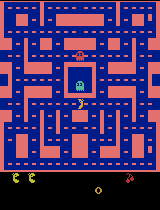

  Episode 4276/20000 | 3,163,500 decisions | 790,626 updates | 184.7 min
  Episode 4276/20000 | 3,164,000 decisions | 790,751 updates | 184.7 min
Episode 4276/20000 | score 980 | recent mean 1805.6 | exploration 15%
  Episode 4277/20000 | 3,164,500 decisions | 790,876 updates | 184.7 min
Episode 4277/20000 | score 1490 | recent mean 1806.4 | exploration 15%
  Episode 4278/20000 | 3,165,000 decisions | 791,001 updates | 184.7 min
  Episode 4278/20000 | 3,165,500 decisions | 791,126 updates | 184.8 min
Episode 4278/20000 | score 1890 | recent mean 1864.4 | exploration 15%
  Episode 4279/20000 | 3,166,000 decisions | 791,251 updates | 184.8 min
  Episode 4279/20000 | 3,166,500 decisions | 791,376 updates | 184.8 min
Episode 4279/20000 | score 2890 | recent mean 1914.4 | exploration 15%
  Episode 4280/20000 | 3,167,000 decisions | 791,501 updates | 184.9 min
  Episode 4280/20000 | 3,167,500 decisions | 791,626 updates | 184.9 min
Episode 4280/20000 | score 2010 | recent mean 1870.0 | explo

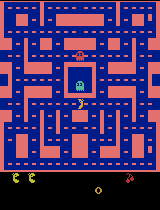

  Episode 4301/20000 | 3,186,000 decisions | 796,251 updates | 186.0 min
  Episode 4301/20000 | 3,186,500 decisions | 796,376 updates | 186.0 min
Episode 4301/20000 | score 1730 | recent mean 1974.8 | exploration 15%
  Episode 4302/20000 | 3,187,000 decisions | 796,501 updates | 186.0 min
  Episode 4302/20000 | 3,187,500 decisions | 796,626 updates | 186.1 min
Episode 4302/20000 | score 1340 | recent mean 1968.8 | exploration 15%
  Episode 4303/20000 | 3,188,000 decisions | 796,751 updates | 186.1 min
  Episode 4303/20000 | 3,188,500 decisions | 796,876 updates | 186.1 min
Episode 4303/20000 | score 1510 | recent mean 1953.6 | exploration 15%
  Episode 4304/20000 | 3,189,000 decisions | 797,001 updates | 186.2 min
Episode 4304/20000 | score 2120 | recent mean 1922.8 | exploration 15%
  Episode 4305/20000 | 3,189,500 decisions | 797,126 updates | 186.2 min
  Episode 4305/20000 | 3,190,000 decisions | 797,251 updates | 186.2 min
Episode 4305/20000 | score 1690 | recent mean 1910.0 | expl

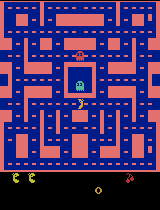

  Episode 4326/20000 | 3,207,500 decisions | 801,626 updates | 187.3 min
  Episode 4326/20000 | 3,208,000 decisions | 801,751 updates | 187.3 min
Episode 4326/20000 | score 1680 | recent mean 1597.6 | exploration 15%
  Episode 4327/20000 | 3,208,500 decisions | 801,876 updates | 187.3 min
  Episode 4327/20000 | 3,209,000 decisions | 802,001 updates | 187.4 min
Episode 4327/20000 | score 920 | recent mean 1580.8 | exploration 15%
  Episode 4328/20000 | 3,209,500 decisions | 802,126 updates | 187.4 min
Episode 4328/20000 | score 810 | recent mean 1552.8 | exploration 15%
  Episode 4329/20000 | 3,210,000 decisions | 802,251 updates | 187.4 min
  Episode 4329/20000 | 3,210,500 decisions | 802,376 updates | 187.5 min
Episode 4329/20000 | score 1950 | recent mean 1546.0 | exploration 15%
  Episode 4330/20000 | 3,211,000 decisions | 802,501 updates | 187.5 min
  Episode 4330/20000 | 3,211,500 decisions | 802,626 updates | 187.5 min
Episode 4330/20000 | score 1400 | recent mean 1534.4 | explor

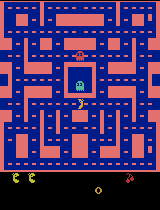

  Episode 4351/20000 | 3,230,000 decisions | 807,251 updates | 188.6 min
  Episode 4351/20000 | 3,230,500 decisions | 807,376 updates | 188.7 min
Episode 4351/20000 | score 1900 | recent mean 1725.2 | exploration 15%
  Episode 4352/20000 | 3,231,000 decisions | 807,501 updates | 188.7 min
Episode 4352/20000 | score 1650 | recent mean 1754.4 | exploration 15%
  Episode 4353/20000 | 3,231,500 decisions | 807,626 updates | 188.7 min
  Episode 4353/20000 | 3,232,000 decisions | 807,751 updates | 188.7 min
Episode 4353/20000 | score 1390 | recent mean 1777.6 | exploration 15%
  Episode 4354/20000 | 3,232,500 decisions | 807,876 updates | 188.8 min
  Episode 4354/20000 | 3,233,000 decisions | 808,001 updates | 188.8 min
Episode 4354/20000 | score 1860 | recent mean 1774.0 | exploration 15%
  Episode 4355/20000 | 3,233,500 decisions | 808,126 updates | 188.8 min
  Episode 4355/20000 | 3,234,000 decisions | 808,251 updates | 188.9 min
Episode 4355/20000 | score 2120 | recent mean 1802.8 | expl

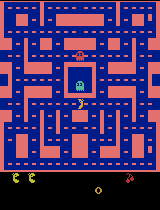

  Episode 4376/20000 | 3,252,000 decisions | 812,751 updates | 189.9 min
  Episode 4376/20000 | 3,252,500 decisions | 812,876 updates | 189.9 min
Episode 4376/20000 | score 1540 | recent mean 1688.0 | exploration 15%
  Episode 4377/20000 | 3,253,000 decisions | 813,001 updates | 190.0 min
Episode 4377/20000 | score 720 | recent mean 1650.8 | exploration 15%
  Episode 4378/20000 | 3,253,500 decisions | 813,126 updates | 190.0 min
Episode 4378/20000 | score 980 | recent mean 1634.4 | exploration 15%
  Episode 4379/20000 | 3,254,000 decisions | 813,251 updates | 190.0 min
  Episode 4379/20000 | 3,254,500 decisions | 813,376 updates | 190.1 min
Episode 4379/20000 | score 2090 | recent mean 1643.6 | exploration 15%
  Episode 4380/20000 | 3,255,000 decisions | 813,501 updates | 190.1 min
Episode 4380/20000 | score 2540 | recent mean 1660.4 | exploration 15%
  Episode 4381/20000 | 3,255,500 decisions | 813,626 updates | 190.1 min
Episode 4381/20000 | score 510 | recent mean 1622.0 | explorati

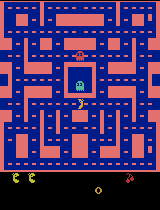

  Episode 4401/20000 | 3,272,000 decisions | 817,751 updates | 191.1 min
Episode 4401/20000 | score 1890 | recent mean 1815.2 | exploration 15%
  Episode 4402/20000 | 3,272,500 decisions | 817,876 updates | 191.1 min
  Episode 4402/20000 | 3,273,000 decisions | 818,001 updates | 191.2 min
Episode 4402/20000 | score 1330 | recent mean 1839.6 | exploration 15%
  Episode 4403/20000 | 3,273,500 decisions | 818,126 updates | 191.2 min
Episode 4403/20000 | score 700 | recent mean 1828.4 | exploration 15%
  Episode 4404/20000 | 3,274,000 decisions | 818,251 updates | 191.2 min
  Episode 4404/20000 | 3,274,500 decisions | 818,376 updates | 191.3 min
Episode 4404/20000 | score 3910 | recent mean 1901.2 | exploration 15%
  Episode 4405/20000 | 3,275,000 decisions | 818,501 updates | 191.3 min
  Episode 4405/20000 | 3,275,500 decisions | 818,626 updates | 191.3 min
Episode 4405/20000 | score 1130 | recent mean 1844.8 | exploration 15%
  Episode 4406/20000 | 3,276,000 decisions | 818,751 updates |

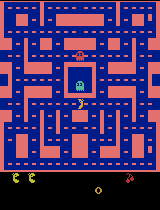

  Episode 4426/20000 | 3,293,000 decisions | 823,001 updates | 192.4 min
  Episode 4426/20000 | 3,293,500 decisions | 823,126 updates | 192.4 min
Episode 4426/20000 | score 1410 | recent mean 1777.2 | exploration 15%
  Episode 4427/20000 | 3,294,000 decisions | 823,251 updates | 192.4 min
Episode 4427/20000 | score 1310 | recent mean 1776.4 | exploration 15%
  Episode 4428/20000 | 3,294,500 decisions | 823,376 updates | 192.4 min
  Episode 4428/20000 | 3,295,000 decisions | 823,501 updates | 192.5 min
Episode 4428/20000 | score 1890 | recent mean 1824.0 | exploration 15%
  Episode 4429/20000 | 3,295,500 decisions | 823,626 updates | 192.5 min
  Episode 4429/20000 | 3,296,000 decisions | 823,751 updates | 192.5 min
Episode 4429/20000 | score 2040 | recent mean 1749.2 | exploration 15%
  Episode 4430/20000 | 3,296,500 decisions | 823,876 updates | 192.6 min
  Episode 4430/20000 | 3,297,000 decisions | 824,001 updates | 192.6 min
Episode 4430/20000 | score 1770 | recent mean 1774.8 | expl

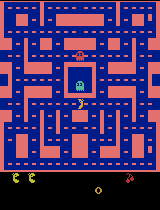

  Episode 4451/20000 | 3,315,500 decisions | 828,626 updates | 193.7 min
  Episode 4451/20000 | 3,316,000 decisions | 828,751 updates | 193.7 min
Episode 4451/20000 | score 1530 | recent mean 1773.2 | exploration 15%
  Episode 4452/20000 | 3,316,500 decisions | 828,876 updates | 193.7 min
Episode 4452/20000 | score 1180 | recent mean 1768.0 | exploration 15%
  Episode 4453/20000 | 3,317,000 decisions | 829,001 updates | 193.8 min
  Episode 4453/20000 | 3,317,500 decisions | 829,126 updates | 193.8 min
Episode 4453/20000 | score 960 | recent mean 1730.8 | exploration 15%
  Episode 4454/20000 | 3,318,000 decisions | 829,251 updates | 193.8 min
  Episode 4454/20000 | 3,318,500 decisions | 829,376 updates | 193.9 min
Episode 4454/20000 | score 1730 | recent mean 1718.4 | exploration 15%
  Episode 4455/20000 | 3,319,000 decisions | 829,501 updates | 193.9 min
  Episode 4455/20000 | 3,319,500 decisions | 829,626 updates | 193.9 min
Episode 4455/20000 | score 2810 | recent mean 1760.0 | explo

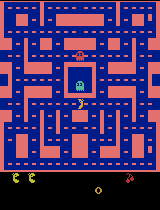

  Episode 4476/20000 | 3,338,000 decisions | 834,251 updates | 195.0 min
Episode 4476/20000 | score 1540 | recent mean 1866.0 | exploration 15%
  Episode 4477/20000 | 3,338,500 decisions | 834,376 updates | 195.0 min
  Episode 4477/20000 | 3,339,000 decisions | 834,501 updates | 195.1 min
Episode 4477/20000 | score 1110 | recent mean 1863.2 | exploration 15%
  Episode 4478/20000 | 3,339,500 decisions | 834,626 updates | 195.1 min
Episode 4478/20000 | score 1120 | recent mean 1869.6 | exploration 15%
  Episode 4479/20000 | 3,340,000 decisions | 834,751 updates | 195.1 min
  Episode 4479/20000 | 3,340,500 decisions | 834,876 updates | 195.2 min
Episode 4479/20000 | score 1790 | recent mean 1872.0 | exploration 15%
  Episode 4480/20000 | 3,341,000 decisions | 835,001 updates | 195.2 min
Episode 4480/20000 | score 1380 | recent mean 1814.8 | exploration 15%
  Episode 4481/20000 | 3,341,500 decisions | 835,126 updates | 195.2 min
  Episode 4481/20000 | 3,342,000 decisions | 835,251 updates 

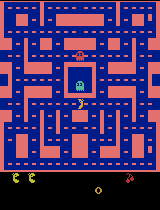

  Episode 4501/20000 | 3,358,500 decisions | 839,376 updates | 196.3 min
  Episode 4501/20000 | 3,359,000 decisions | 839,501 updates | 196.3 min
  Episode 4501/20000 | 3,359,500 decisions | 839,626 updates | 196.3 min
Episode 4501/20000 | score 2220 | recent mean 1645.2 | exploration 15%
  Episode 4502/20000 | 3,360,000 decisions | 839,751 updates | 196.4 min
  Episode 4502/20000 | 3,360,500 decisions | 839,876 updates | 196.4 min
Episode 4502/20000 | score 1660 | recent mean 1667.2 | exploration 15%
  Episode 4503/20000 | 3,361,000 decisions | 840,001 updates | 196.4 min
  Episode 4503/20000 | 3,361,500 decisions | 840,126 updates | 196.5 min
Episode 4503/20000 | score 1270 | recent mean 1673.2 | exploration 15%
  Episode 4504/20000 | 3,362,000 decisions | 840,251 updates | 196.5 min
  Episode 4504/20000 | 3,362,500 decisions | 840,376 updates | 196.5 min
Episode 4504/20000 | score 2000 | recent mean 1681.6 | exploration 15%
  Episode 4505/20000 | 3,363,000 decisions | 840,501 update

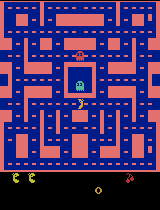

  Episode 4526/20000 | 3,382,000 decisions | 845,251 updates | 197.7 min
Episode 4526/20000 | score 2680 | recent mean 1945.6 | exploration 15%
  Episode 4527/20000 | 3,382,500 decisions | 845,376 updates | 197.7 min
  Episode 4527/20000 | 3,383,000 decisions | 845,501 updates | 197.8 min
Episode 4527/20000 | score 2300 | recent mean 1971.2 | exploration 15%
  Episode 4528/20000 | 3,383,500 decisions | 845,626 updates | 197.8 min
  Episode 4528/20000 | 3,384,000 decisions | 845,751 updates | 197.8 min
Episode 4528/20000 | score 2110 | recent mean 2004.8 | exploration 15%
  Episode 4529/20000 | 3,384,500 decisions | 845,876 updates | 197.9 min
  Episode 4529/20000 | 3,385,000 decisions | 846,001 updates | 197.9 min
Episode 4529/20000 | score 2110 | recent mean 2009.2 | exploration 15%
  Episode 4530/20000 | 3,385,500 decisions | 846,126 updates | 197.9 min
  Episode 4530/20000 | 3,386,000 decisions | 846,251 updates | 197.9 min
Episode 4530/20000 | score 3170 | recent mean 2042.0 | expl

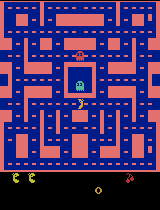

  Episode 4551/20000 | 3,403,000 decisions | 850,501 updates | 199.0 min
  Episode 4551/20000 | 3,403,500 decisions | 850,626 updates | 199.0 min
Episode 4551/20000 | score 1330 | recent mean 1689.2 | exploration 15%
  Episode 4552/20000 | 3,404,000 decisions | 850,751 updates | 199.0 min
Episode 4552/20000 | score 1680 | recent mean 1664.4 | exploration 15%
  Episode 4553/20000 | 3,404,500 decisions | 850,876 updates | 199.0 min
  Episode 4553/20000 | 3,405,000 decisions | 851,001 updates | 199.1 min
Episode 4553/20000 | score 1240 | recent mean 1629.6 | exploration 15%
  Episode 4554/20000 | 3,405,500 decisions | 851,126 updates | 199.1 min
  Episode 4554/20000 | 3,406,000 decisions | 851,251 updates | 199.1 min
Episode 4554/20000 | score 2030 | recent mean 1626.4 | exploration 15%
  Episode 4555/20000 | 3,406,500 decisions | 851,376 updates | 199.2 min
  Episode 4555/20000 | 3,407,000 decisions | 851,501 updates | 199.2 min
Episode 4555/20000 | score 2250 | recent mean 1589.6 | expl

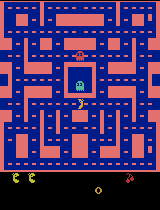

  Episode 4576/20000 | 3,425,000 decisions | 856,001 updates | 200.3 min
  Episode 4576/20000 | 3,425,500 decisions | 856,126 updates | 200.3 min
Episode 4576/20000 | score 1290 | recent mean 1826.0 | exploration 15%
  Episode 4577/20000 | 3,426,000 decisions | 856,251 updates | 200.3 min
  Episode 4577/20000 | 3,426,500 decisions | 856,376 updates | 200.3 min
Episode 4577/20000 | score 1700 | recent mean 1826.8 | exploration 15%
  Episode 4578/20000 | 3,427,000 decisions | 856,501 updates | 200.4 min
  Episode 4578/20000 | 3,427,500 decisions | 856,626 updates | 200.4 min
Episode 4578/20000 | score 2670 | recent mean 1884.0 | exploration 15%
  Episode 4579/20000 | 3,428,000 decisions | 856,751 updates | 200.4 min
  Episode 4579/20000 | 3,428,500 decisions | 856,876 updates | 200.5 min
Episode 4579/20000 | score 2010 | recent mean 1883.2 | exploration 15%
  Episode 4580/20000 | 3,429,000 decisions | 857,001 updates | 200.5 min
  Episode 4580/20000 | 3,429,500 decisions | 857,126 update

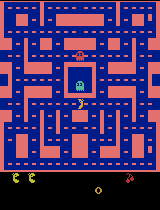

  Episode 4601/20000 | 3,447,000 decisions | 861,501 updates | 201.6 min
  Episode 4601/20000 | 3,447,500 decisions | 861,626 updates | 201.6 min
  Episode 4601/20000 | 3,448,000 decisions | 861,751 updates | 201.7 min
Episode 4601/20000 | score 1530 | recent mean 1732.4 | exploration 15%
  Episode 4602/20000 | 3,448,500 decisions | 861,876 updates | 201.7 min
Episode 4602/20000 | score 3310 | recent mean 1796.8 | exploration 15%
  Episode 4603/20000 | 3,449,000 decisions | 862,001 updates | 201.8 min
Episode 4603/20000 | score 460 | recent mean 1708.4 | exploration 15%
  Episode 4604/20000 | 3,449,500 decisions | 862,126 updates | 201.8 min
  Episode 4604/20000 | 3,450,000 decisions | 862,251 updates | 201.8 min
Episode 4604/20000 | score 1180 | recent mean 1675.2 | exploration 15%
  Episode 4605/20000 | 3,450,500 decisions | 862,376 updates | 201.9 min
  Episode 4605/20000 | 3,451,000 decisions | 862,501 updates | 201.9 min
Episode 4605/20000 | score 1430 | recent mean 1660.8 | explo

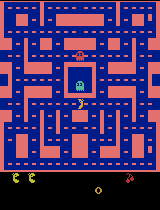

  Episode 4626/20000 | 3,468,500 decisions | 866,876 updates | 203.0 min
  Episode 4626/20000 | 3,469,000 decisions | 867,001 updates | 203.0 min
Episode 4626/20000 | score 1420 | recent mean 1704.0 | exploration 15%
  Episode 4627/20000 | 3,469,500 decisions | 867,126 updates | 203.1 min
  Episode 4627/20000 | 3,470,000 decisions | 867,251 updates | 203.1 min
Episode 4627/20000 | score 2390 | recent mean 1667.2 | exploration 15%
  Episode 4628/20000 | 3,470,500 decisions | 867,376 updates | 203.1 min
  Episode 4628/20000 | 3,471,000 decisions | 867,501 updates | 203.2 min
Episode 4628/20000 | score 1320 | recent mean 1701.6 | exploration 15%
  Episode 4629/20000 | 3,471,500 decisions | 867,626 updates | 203.2 min
Episode 4629/20000 | score 1870 | recent mean 1729.2 | exploration 15%
  Episode 4630/20000 | 3,472,000 decisions | 867,751 updates | 203.2 min
  Episode 4630/20000 | 3,472,500 decisions | 867,876 updates | 203.2 min
Episode 4630/20000 | score 1630 | recent mean 1737.2 | expl

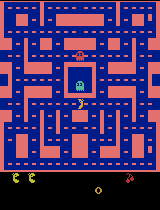

  Episode 4651/20000 | 3,490,000 decisions | 872,251 updates | 204.3 min
Episode 4651/20000 | score 500 | recent mean 1607.6 | exploration 15%
  Episode 4652/20000 | 3,490,500 decisions | 872,376 updates | 204.3 min
  Episode 4652/20000 | 3,491,000 decisions | 872,501 updates | 204.3 min
Episode 4652/20000 | score 3110 | recent mean 1636.4 | exploration 15%
  Episode 4653/20000 | 3,491,500 decisions | 872,626 updates | 204.4 min
Episode 4653/20000 | score 620 | recent mean 1608.4 | exploration 15%
  Episode 4654/20000 | 3,492,000 decisions | 872,751 updates | 204.4 min
  Episode 4654/20000 | 3,492,500 decisions | 872,876 updates | 204.4 min
Episode 4654/20000 | score 1260 | recent mean 1584.0 | exploration 15%
  Episode 4655/20000 | 3,493,000 decisions | 873,001 updates | 204.5 min
Episode 4655/20000 | score 2540 | recent mean 1620.4 | exploration 15%
  Episode 4656/20000 | 3,493,500 decisions | 873,126 updates | 204.5 min
  Episode 4656/20000 | 3,494,000 decisions | 873,251 updates | 

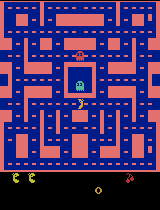

  Episode 4676/20000 | 3,512,000 decisions | 877,751 updates | 205.6 min
Episode 4676/20000 | score 1660 | recent mean 1839.6 | exploration 15%
  Episode 4677/20000 | 3,512,500 decisions | 877,876 updates | 205.6 min
  Episode 4677/20000 | 3,513,000 decisions | 878,001 updates | 205.6 min
Episode 4677/20000 | score 1890 | recent mean 1790.8 | exploration 15%
  Episode 4678/20000 | 3,513,500 decisions | 878,126 updates | 205.7 min
  Episode 4678/20000 | 3,514,000 decisions | 878,251 updates | 205.7 min
Episode 4678/20000 | score 2180 | recent mean 1853.2 | exploration 15%
  Episode 4679/20000 | 3,514,500 decisions | 878,376 updates | 205.7 min
  Episode 4679/20000 | 3,515,000 decisions | 878,501 updates | 205.8 min
Episode 4679/20000 | score 2090 | recent mean 1886.4 | exploration 15%
  Episode 4680/20000 | 3,515,500 decisions | 878,626 updates | 205.8 min
  Episode 4680/20000 | 3,516,000 decisions | 878,751 updates | 205.8 min
Episode 4680/20000 | score 2320 | recent mean 1877.6 | expl

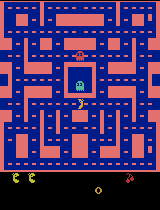

Episode 4701/20000 | score 190 | recent mean 1626.8 | exploration 15%
  Episode 4702/20000 | 3,533,500 decisions | 883,126 updates | 206.9 min
  Episode 4702/20000 | 3,534,000 decisions | 883,251 updates | 206.9 min
Episode 4702/20000 | score 1370 | recent mean 1606.0 | exploration 15%
  Episode 4703/20000 | 3,534,500 decisions | 883,376 updates | 206.9 min
  Episode 4703/20000 | 3,535,000 decisions | 883,501 updates | 207.0 min
Episode 4703/20000 | score 1910 | recent mean 1595.2 | exploration 15%
  Episode 4704/20000 | 3,535,500 decisions | 883,626 updates | 207.0 min
Episode 4704/20000 | score 960 | recent mean 1550.0 | exploration 15%
  Episode 4705/20000 | 3,536,000 decisions | 883,751 updates | 207.0 min
  Episode 4705/20000 | 3,536,500 decisions | 883,876 updates | 207.1 min
Episode 4705/20000 | score 2760 | recent mean 1567.6 | exploration 15%
  Episode 4706/20000 | 3,537,000 decisions | 884,001 updates | 207.1 min
  Episode 4706/20000 | 3,537,500 decisions | 884,126 updates | 

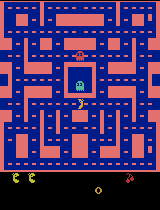

  Episode 4726/20000 | 3,556,000 decisions | 888,751 updates | 208.2 min
  Episode 4726/20000 | 3,556,500 decisions | 888,876 updates | 208.3 min
Episode 4726/20000 | score 1600 | recent mean 1869.6 | exploration 15%
  Episode 4727/20000 | 3,557,000 decisions | 889,001 updates | 208.3 min
  Episode 4727/20000 | 3,557,500 decisions | 889,126 updates | 208.3 min
Episode 4727/20000 | score 1680 | recent mean 1882.0 | exploration 15%
  Episode 4728/20000 | 3,558,000 decisions | 889,251 updates | 208.3 min
  Episode 4728/20000 | 3,558,500 decisions | 889,376 updates | 208.4 min
Episode 4728/20000 | score 2070 | recent mean 1888.4 | exploration 15%
  Episode 4729/20000 | 3,559,000 decisions | 889,501 updates | 208.4 min
  Episode 4729/20000 | 3,559,500 decisions | 889,626 updates | 208.4 min
Episode 4729/20000 | score 2430 | recent mean 1947.2 | exploration 15%
  Episode 4730/20000 | 3,560,000 decisions | 889,751 updates | 208.5 min
  Episode 4730/20000 | 3,560,500 decisions | 889,876 update

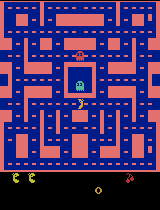

  Episode 4751/20000 | 3,579,500 decisions | 894,626 updates | 209.6 min
  Episode 4751/20000 | 3,580,000 decisions | 894,751 updates | 209.6 min
Episode 4751/20000 | score 1940 | recent mean 1840.8 | exploration 15%
  Episode 4752/20000 | 3,580,500 decisions | 894,876 updates | 209.7 min
  Episode 4752/20000 | 3,581,000 decisions | 895,001 updates | 209.7 min
Episode 4752/20000 | score 1990 | recent mean 1853.2 | exploration 15%
  Episode 4753/20000 | 3,581,500 decisions | 895,126 updates | 209.7 min
Episode 4753/20000 | score 700 | recent mean 1798.4 | exploration 15%
  Episode 4754/20000 | 3,582,000 decisions | 895,251 updates | 209.7 min
Episode 4754/20000 | score 1390 | recent mean 1756.8 | exploration 15%
  Episode 4755/20000 | 3,582,500 decisions | 895,376 updates | 209.8 min
  Episode 4755/20000 | 3,583,000 decisions | 895,501 updates | 209.8 min
Episode 4755/20000 | score 2840 | recent mean 1762.8 | exploration 15%
  Episode 4756/20000 | 3,583,500 decisions | 895,626 updates |

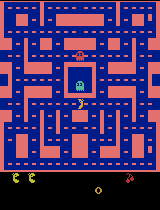

  Episode 4776/20000 | 3,601,000 decisions | 900,001 updates | 210.9 min
  Episode 4776/20000 | 3,601,500 decisions | 900,126 updates | 210.9 min
Episode 4776/20000 | score 1860 | recent mean 1649.2 | exploration 15%
  Episode 4777/20000 | 3,602,000 decisions | 900,251 updates | 210.9 min
  Episode 4777/20000 | 3,602,500 decisions | 900,376 updates | 211.0 min
Episode 4777/20000 | score 1950 | recent mean 1647.6 | exploration 15%
  Episode 4778/20000 | 3,603,000 decisions | 900,501 updates | 211.0 min
  Episode 4778/20000 | 3,603,500 decisions | 900,626 updates | 211.0 min
Episode 4778/20000 | score 1700 | recent mean 1687.6 | exploration 15%
  Episode 4779/20000 | 3,604,000 decisions | 900,751 updates | 211.0 min
Episode 4779/20000 | score 1660 | recent mean 1698.4 | exploration 15%
  Episode 4780/20000 | 3,604,500 decisions | 900,876 updates | 211.1 min
Episode 4780/20000 | score 1160 | recent mean 1631.2 | exploration 15%
  Episode 4781/20000 | 3,605,000 decisions | 901,001 updates 

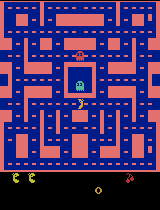

  Episode 4801/20000 | 3,622,500 decisions | 905,376 updates | 212.1 min
  Episode 4801/20000 | 3,623,000 decisions | 905,501 updates | 212.2 min
Episode 4801/20000 | score 2260 | recent mean 1753.6 | exploration 15%
  Episode 4802/20000 | 3,623,500 decisions | 905,626 updates | 212.2 min
  Episode 4802/20000 | 3,624,000 decisions | 905,751 updates | 212.2 min
Episode 4802/20000 | score 2040 | recent mean 1757.2 | exploration 15%
  Episode 4803/20000 | 3,624,500 decisions | 905,876 updates | 212.3 min
  Episode 4803/20000 | 3,625,000 decisions | 906,001 updates | 212.3 min
Episode 4803/20000 | score 1300 | recent mean 1741.2 | exploration 15%
  Episode 4804/20000 | 3,625,500 decisions | 906,126 updates | 212.3 min
Episode 4804/20000 | score 1350 | recent mean 1728.8 | exploration 15%
  Episode 4805/20000 | 3,626,000 decisions | 906,251 updates | 212.3 min
  Episode 4805/20000 | 3,626,500 decisions | 906,376 updates | 212.4 min
Episode 4805/20000 | score 1930 | recent mean 1759.6 | expl

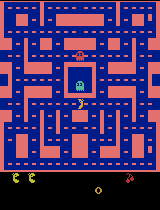

  Episode 4826/20000 | 3,644,500 decisions | 910,876 updates | 213.4 min
  Episode 4826/20000 | 3,645,000 decisions | 911,001 updates | 213.4 min
Episode 4826/20000 | score 1820 | recent mean 1678.8 | exploration 15%
  Episode 4827/20000 | 3,645,500 decisions | 911,126 updates | 213.5 min
  Episode 4827/20000 | 3,646,000 decisions | 911,251 updates | 213.5 min
Episode 4827/20000 | score 2580 | recent mean 1700.4 | exploration 15%
  Episode 4828/20000 | 3,646,500 decisions | 911,376 updates | 213.5 min
Episode 4828/20000 | score 840 | recent mean 1682.0 | exploration 15%
  Episode 4829/20000 | 3,647,000 decisions | 911,501 updates | 213.6 min
  Episode 4829/20000 | 3,647,500 decisions | 911,626 updates | 213.6 min
Episode 4829/20000 | score 1180 | recent mean 1675.2 | exploration 15%
  Episode 4830/20000 | 3,648,000 decisions | 911,751 updates | 213.6 min
Episode 4830/20000 | score 1150 | recent mean 1644.0 | exploration 15%
  Episode 4831/20000 | 3,648,500 decisions | 911,876 updates |

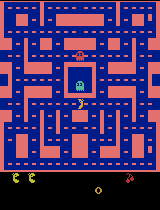

  Episode 4851/20000 | 3,665,000 decisions | 916,001 updates | 214.6 min
  Episode 4851/20000 | 3,665,500 decisions | 916,126 updates | 214.6 min
Episode 4851/20000 | score 1950 | recent mean 1671.6 | exploration 15%
  Episode 4852/20000 | 3,666,000 decisions | 916,251 updates | 214.7 min
  Episode 4852/20000 | 3,666,500 decisions | 916,376 updates | 214.7 min
Episode 4852/20000 | score 1490 | recent mean 1628.0 | exploration 15%
  Episode 4853/20000 | 3,667,000 decisions | 916,501 updates | 214.7 min
  Episode 4853/20000 | 3,667,500 decisions | 916,626 updates | 214.7 min
Episode 4853/20000 | score 1510 | recent mean 1654.8 | exploration 15%
  Episode 4854/20000 | 3,668,000 decisions | 916,751 updates | 214.8 min
  Episode 4854/20000 | 3,668,500 decisions | 916,876 updates | 214.8 min
Episode 4854/20000 | score 2770 | recent mean 1718.4 | exploration 15%
  Episode 4855/20000 | 3,669,000 decisions | 917,001 updates | 214.8 min
  Episode 4855/20000 | 3,669,500 decisions | 917,126 update

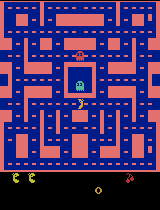

  Episode 4876/20000 | 3,687,500 decisions | 921,626 updates | 215.9 min
Episode 4876/20000 | score 1870 | recent mean 1709.2 | exploration 15%
  Episode 4877/20000 | 3,688,000 decisions | 921,751 updates | 216.0 min
  Episode 4877/20000 | 3,688,500 decisions | 921,876 updates | 216.0 min
Episode 4877/20000 | score 2120 | recent mean 1734.4 | exploration 15%
  Episode 4878/20000 | 3,689,000 decisions | 922,001 updates | 216.0 min
  Episode 4878/20000 | 3,689,500 decisions | 922,126 updates | 216.1 min
Episode 4878/20000 | score 2230 | recent mean 1763.2 | exploration 15%
  Episode 4879/20000 | 3,690,000 decisions | 922,251 updates | 216.1 min
  Episode 4879/20000 | 3,690,500 decisions | 922,376 updates | 216.1 min
Episode 4879/20000 | score 2560 | recent mean 1754.8 | exploration 15%
  Episode 4880/20000 | 3,691,000 decisions | 922,501 updates | 216.1 min
  Episode 4880/20000 | 3,691,500 decisions | 922,626 updates | 216.2 min
Episode 4880/20000 | score 1960 | recent mean 1752.8 | expl

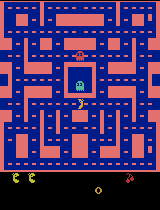

  Episode 4901/20000 | 3,711,000 decisions | 927,501 updates | 217.3 min
Episode 4901/20000 | score 710 | recent mean 1764.0 | exploration 15%
  Episode 4902/20000 | 3,711,500 decisions | 927,626 updates | 217.3 min
  Episode 4902/20000 | 3,712,000 decisions | 927,751 updates | 217.4 min
Episode 4902/20000 | score 4200 | recent mean 1847.2 | exploration 15%
  Episode 4903/20000 | 3,712,500 decisions | 927,876 updates | 217.4 min
  Episode 4903/20000 | 3,713,000 decisions | 928,001 updates | 217.4 min
Episode 4903/20000 | score 1290 | recent mean 1809.6 | exploration 15%
  Episode 4904/20000 | 3,713,500 decisions | 928,126 updates | 217.5 min
  Episode 4904/20000 | 3,714,000 decisions | 928,251 updates | 217.5 min
Episode 4904/20000 | score 2770 | recent mean 1818.0 | exploration 15%
  Episode 4905/20000 | 3,714,500 decisions | 928,376 updates | 217.5 min
Episode 4905/20000 | score 1000 | recent mean 1779.6 | exploration 15%
  Episode 4906/20000 | 3,715,000 decisions | 928,501 updates |

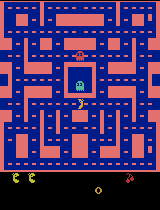

  Episode 4926/20000 | 3,731,500 decisions | 932,626 updates | 218.5 min
  Episode 4926/20000 | 3,732,000 decisions | 932,751 updates | 218.5 min
Episode 4926/20000 | score 2350 | recent mean 1718.0 | exploration 15%
  Episode 4927/20000 | 3,732,500 decisions | 932,876 updates | 218.6 min
  Episode 4927/20000 | 3,733,000 decisions | 933,001 updates | 218.6 min
Episode 4927/20000 | score 1280 | recent mean 1601.2 | exploration 15%
  Episode 4928/20000 | 3,733,500 decisions | 933,126 updates | 218.6 min
  Episode 4928/20000 | 3,734,000 decisions | 933,251 updates | 218.6 min
Episode 4928/20000 | score 2680 | recent mean 1656.8 | exploration 15%
  Episode 4929/20000 | 3,734,500 decisions | 933,376 updates | 218.7 min
  Episode 4929/20000 | 3,735,000 decisions | 933,501 updates | 218.7 min
Episode 4929/20000 | score 2350 | recent mean 1640.0 | exploration 15%
  Episode 4930/20000 | 3,735,500 decisions | 933,626 updates | 218.7 min
  Episode 4930/20000 | 3,736,000 decisions | 933,751 update

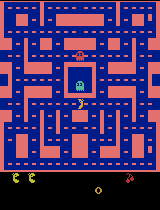

  Episode 4951/20000 | 3,752,500 decisions | 937,876 updates | 219.7 min
  Episode 4951/20000 | 3,753,000 decisions | 938,001 updates | 219.7 min
Episode 4951/20000 | score 1550 | recent mean 1829.2 | exploration 15%
  Episode 4952/20000 | 3,753,500 decisions | 938,126 updates | 219.8 min
  Episode 4952/20000 | 3,754,000 decisions | 938,251 updates | 219.8 min
Episode 4952/20000 | score 1680 | recent mean 1845.2 | exploration 15%
  Episode 4953/20000 | 3,754,500 decisions | 938,376 updates | 219.8 min
Episode 4953/20000 | score 280 | recent mean 1749.2 | exploration 15%
  Episode 4954/20000 | 3,755,000 decisions | 938,501 updates | 219.9 min
Episode 4954/20000 | score 1590 | recent mean 1718.8 | exploration 15%
  Episode 4955/20000 | 3,755,500 decisions | 938,626 updates | 219.9 min
  Episode 4955/20000 | 3,756,000 decisions | 938,751 updates | 219.9 min
Episode 4955/20000 | score 2280 | recent mean 1699.6 | exploration 15%
  Episode 4956/20000 | 3,756,500 decisions | 938,876 updates |

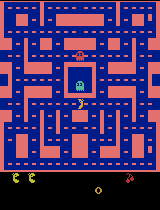

  Episode 4976/20000 | 3,775,000 decisions | 943,501 updates | 221.0 min
Episode 4976/20000 | score 1730 | recent mean 1821.6 | exploration 15%
  Episode 4977/20000 | 3,775,500 decisions | 943,626 updates | 221.1 min
  Episode 4977/20000 | 3,776,000 decisions | 943,751 updates | 221.1 min
Episode 4977/20000 | score 1610 | recent mean 1818.8 | exploration 15%
  Episode 4978/20000 | 3,776,500 decisions | 943,876 updates | 221.1 min
  Episode 4978/20000 | 3,777,000 decisions | 944,001 updates | 221.1 min
Episode 4978/20000 | score 1770 | recent mean 1878.4 | exploration 15%
  Episode 4979/20000 | 3,777,500 decisions | 944,126 updates | 221.2 min
  Episode 4979/20000 | 3,778,000 decisions | 944,251 updates | 221.2 min
Episode 4979/20000 | score 2950 | recent mean 1932.8 | exploration 15%
  Episode 4980/20000 | 3,778,500 decisions | 944,376 updates | 221.2 min
  Episode 4980/20000 | 3,779,000 decisions | 944,501 updates | 221.3 min
  Episode 4980/20000 | 3,779,500 decisions | 944,626 update

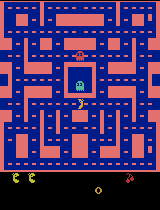

  Episode 5001/20000 | 3,798,000 decisions | 949,251 updates | 222.4 min
Episode 5001/20000 | score 1580 | recent mean 1937.2 | exploration 15%
  Episode 5002/20000 | 3,798,500 decisions | 949,376 updates | 222.4 min
  Episode 5002/20000 | 3,799,000 decisions | 949,501 updates | 222.4 min
Episode 5002/20000 | score 1960 | recent mean 1951.2 | exploration 15%
  Episode 5003/20000 | 3,799,500 decisions | 949,626 updates | 222.5 min
  Episode 5003/20000 | 3,800,000 decisions | 949,751 updates | 222.5 min
Episode 5003/20000 | score 1310 | recent mean 1932.8 | exploration 15%
  Episode 5004/20000 | 3,800,500 decisions | 949,876 updates | 222.5 min
  Episode 5004/20000 | 3,801,000 decisions | 950,001 updates | 222.6 min
Episode 5004/20000 | score 1810 | recent mean 1887.2 | exploration 15%
  Episode 5005/20000 | 3,801,500 decisions | 950,126 updates | 222.6 min
Episode 5005/20000 | score 1440 | recent mean 1813.6 | exploration 15%
  Episode 5006/20000 | 3,802,000 decisions | 950,251 updates 

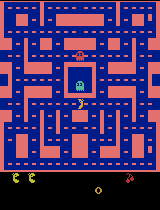

  Episode 5026/20000 | 3,820,500 decisions | 954,876 updates | 223.7 min
  Episode 5026/20000 | 3,821,000 decisions | 955,001 updates | 223.7 min
Episode 5026/20000 | score 1460 | recent mean 1758.8 | exploration 15%
  Episode 5027/20000 | 3,821,500 decisions | 955,126 updates | 223.7 min
  Episode 5027/20000 | 3,822,000 decisions | 955,251 updates | 223.8 min
Episode 5027/20000 | score 1950 | recent mean 1758.4 | exploration 15%
  Episode 5028/20000 | 3,822,500 decisions | 955,376 updates | 223.8 min
  Episode 5028/20000 | 3,823,000 decisions | 955,501 updates | 223.8 min
Episode 5028/20000 | score 1650 | recent mean 1772.0 | exploration 15%
  Episode 5029/20000 | 3,823,500 decisions | 955,626 updates | 223.9 min
Episode 5029/20000 | score 2200 | recent mean 1787.6 | exploration 15%
  Episode 5030/20000 | 3,824,000 decisions | 955,751 updates | 223.9 min
  Episode 5030/20000 | 3,824,500 decisions | 955,876 updates | 223.9 min
  Episode 5030/20000 | 3,825,000 decisions | 956,001 update

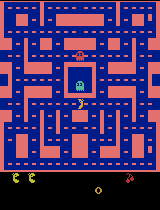

  Episode 5051/20000 | 3,843,500 decisions | 960,626 updates | 225.0 min
Episode 5051/20000 | score 1260 | recent mean 1810.4 | exploration 15%
  Episode 5052/20000 | 3,844,000 decisions | 960,751 updates | 225.1 min
  Episode 5052/20000 | 3,844,500 decisions | 960,876 updates | 225.1 min
Episode 5052/20000 | score 4620 | recent mean 1917.2 | exploration 15%
  Episode 5053/20000 | 3,845,000 decisions | 961,001 updates | 225.1 min
  Episode 5053/20000 | 3,845,500 decisions | 961,126 updates | 225.2 min
Episode 5053/20000 | score 1180 | recent mean 1898.4 | exploration 15%
  Episode 5054/20000 | 3,846,000 decisions | 961,251 updates | 225.2 min
Episode 5054/20000 | score 1470 | recent mean 1869.2 | exploration 15%
  Episode 5055/20000 | 3,846,500 decisions | 961,376 updates | 225.2 min
  Episode 5055/20000 | 3,847,000 decisions | 961,501 updates | 225.3 min
Episode 5055/20000 | score 1920 | recent mean 1840.0 | exploration 15%
  Episode 5056/20000 | 3,847,500 decisions | 961,626 updates 

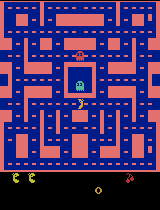

  Episode 5076/20000 | 3,865,000 decisions | 966,001 updates | 226.3 min
  Episode 5076/20000 | 3,865,500 decisions | 966,126 updates | 226.4 min
Episode 5076/20000 | score 1190 | recent mean 1897.2 | exploration 15%
  Episode 5077/20000 | 3,866,000 decisions | 966,251 updates | 226.4 min
Episode 5077/20000 | score 810 | recent mean 1744.8 | exploration 15%
  Episode 5078/20000 | 3,866,500 decisions | 966,376 updates | 226.4 min
  Episode 5078/20000 | 3,867,000 decisions | 966,501 updates | 226.5 min
Episode 5078/20000 | score 1300 | recent mean 1749.6 | exploration 15%
  Episode 5079/20000 | 3,867,500 decisions | 966,626 updates | 226.5 min
  Episode 5079/20000 | 3,868,000 decisions | 966,751 updates | 226.5 min
Episode 5079/20000 | score 2540 | recent mean 1792.4 | exploration 15%
  Episode 5080/20000 | 3,868,500 decisions | 966,876 updates | 226.5 min
  Episode 5080/20000 | 3,869,000 decisions | 967,001 updates | 226.6 min
Episode 5080/20000 | score 2910 | recent mean 1832.0 | explo

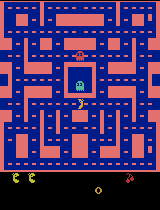

  Episode 5101/20000 | 3,887,500 decisions | 971,626 updates | 227.6 min
Episode 5101/20000 | score 2970 | recent mean 1815.2 | exploration 15%
  Episode 5102/20000 | 3,888,000 decisions | 971,751 updates | 227.7 min
  Episode 5102/20000 | 3,888,500 decisions | 971,876 updates | 227.7 min
Episode 5102/20000 | score 2610 | recent mean 1887.2 | exploration 15%
  Episode 5103/20000 | 3,889,000 decisions | 972,001 updates | 227.7 min
Episode 5103/20000 | score 900 | recent mean 1871.2 | exploration 15%
  Episode 5104/20000 | 3,889,500 decisions | 972,126 updates | 227.8 min
  Episode 5104/20000 | 3,890,000 decisions | 972,251 updates | 227.8 min
Episode 5104/20000 | score 2830 | recent mean 1882.8 | exploration 15%
  Episode 5105/20000 | 3,890,500 decisions | 972,376 updates | 227.8 min
  Episode 5105/20000 | 3,891,000 decisions | 972,501 updates | 227.8 min
Episode 5105/20000 | score 2240 | recent mean 1856.0 | exploration 15%
  Episode 5106/20000 | 3,891,500 decisions | 972,626 updates |

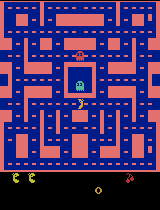

  Episode 5126/20000 | 3,909,000 decisions | 977,001 updates | 228.9 min
  Episode 5126/20000 | 3,909,500 decisions | 977,126 updates | 228.9 min
Episode 5126/20000 | score 1560 | recent mean 1810.0 | exploration 15%
  Episode 5127/20000 | 3,910,000 decisions | 977,251 updates | 229.0 min
  Episode 5127/20000 | 3,910,500 decisions | 977,376 updates | 229.0 min
Episode 5127/20000 | score 1730 | recent mean 1774.8 | exploration 15%
  Episode 5128/20000 | 3,911,000 decisions | 977,501 updates | 229.0 min
  Episode 5128/20000 | 3,911,500 decisions | 977,626 updates | 229.0 min
Episode 5128/20000 | score 2420 | recent mean 1835.6 | exploration 15%
  Episode 5129/20000 | 3,912,000 decisions | 977,751 updates | 229.1 min
  Episode 5129/20000 | 3,912,500 decisions | 977,876 updates | 229.1 min
Episode 5129/20000 | score 2470 | recent mean 1821.2 | exploration 15%
  Episode 5130/20000 | 3,913,000 decisions | 978,001 updates | 229.1 min
  Episode 5130/20000 | 3,913,500 decisions | 978,126 update

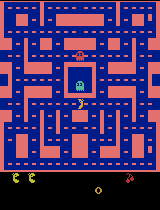

  Episode 5151/20000 | 3,931,500 decisions | 982,626 updates | 230.4 min
  Episode 5151/20000 | 3,932,000 decisions | 982,751 updates | 230.4 min
Episode 5151/20000 | score 2130 | recent mean 1874.4 | exploration 15%
  Episode 5152/20000 | 3,932,500 decisions | 982,876 updates | 230.4 min
  Episode 5152/20000 | 3,933,000 decisions | 983,001 updates | 230.5 min
Episode 5152/20000 | score 2630 | recent mean 1910.4 | exploration 15%
  Episode 5153/20000 | 3,933,500 decisions | 983,126 updates | 230.5 min
  Episode 5153/20000 | 3,934,000 decisions | 983,251 updates | 230.5 min
Episode 5153/20000 | score 2210 | recent mean 1902.0 | exploration 15%
  Episode 5154/20000 | 3,934,500 decisions | 983,376 updates | 230.6 min
  Episode 5154/20000 | 3,935,000 decisions | 983,501 updates | 230.6 min
Episode 5154/20000 | score 1670 | recent mean 1870.0 | exploration 15%
  Episode 5155/20000 | 3,935,500 decisions | 983,626 updates | 230.6 min
Episode 5155/20000 | score 1220 | recent mean 1727.6 | expl

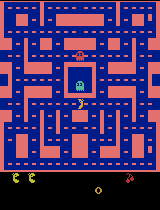

  Episode 5176/20000 | 3,954,000 decisions | 988,251 updates | 231.7 min
  Episode 5176/20000 | 3,954,500 decisions | 988,376 updates | 231.7 min
Episode 5176/20000 | score 2100 | recent mean 2033.2 | exploration 15%
  Episode 5177/20000 | 3,955,000 decisions | 988,501 updates | 231.8 min
  Episode 5177/20000 | 3,955,500 decisions | 988,626 updates | 231.8 min
Episode 5177/20000 | score 2510 | recent mean 2028.4 | exploration 15%
  Episode 5178/20000 | 3,956,000 decisions | 988,751 updates | 231.8 min
  Episode 5178/20000 | 3,956,500 decisions | 988,876 updates | 231.9 min
  Episode 5178/20000 | 3,957,000 decisions | 989,001 updates | 231.9 min
Episode 5178/20000 | score 3080 | recent mean 2063.2 | exploration 15%
  Episode 5179/20000 | 3,957,500 decisions | 989,126 updates | 231.9 min
  Episode 5179/20000 | 3,958,000 decisions | 989,251 updates | 231.9 min
Episode 5179/20000 | score 3050 | recent mean 2118.4 | exploration 15%
  Episode 5180/20000 | 3,958,500 decisions | 989,376 update

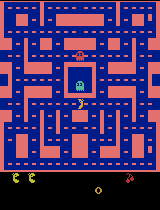

  Episode 5201/20000 | 3,977,500 decisions | 994,126 updates | 233.1 min
  Episode 5201/20000 | 3,978,000 decisions | 994,251 updates | 233.1 min
Episode 5201/20000 | score 1370 | recent mean 1944.4 | exploration 15%
  Episode 5202/20000 | 3,978,500 decisions | 994,376 updates | 233.1 min
Episode 5202/20000 | score 630 | recent mean 1869.2 | exploration 15%
  Episode 5203/20000 | 3,979,000 decisions | 994,501 updates | 233.2 min
Episode 5203/20000 | score 1250 | recent mean 1796.0 | exploration 15%
  Episode 5204/20000 | 3,979,500 decisions | 994,626 updates | 233.2 min
  Episode 5204/20000 | 3,980,000 decisions | 994,751 updates | 233.2 min
Episode 5204/20000 | score 1380 | recent mean 1729.2 | exploration 15%
  Episode 5205/20000 | 3,980,500 decisions | 994,876 updates | 233.3 min
  Episode 5205/20000 | 3,981,000 decisions | 995,001 updates | 233.3 min
Episode 5205/20000 | score 1910 | recent mean 1718.0 | exploration 15%
  Episode 5206/20000 | 3,981,500 decisions | 995,126 updates |

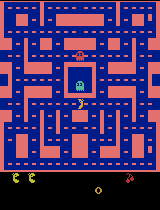

  Episode 5226/20000 | 4,002,000 decisions | 1,000,251 updates | 234.7 min
  Episode 5226/20000 | 4,002,500 decisions | 1,000,376 updates | 234.7 min
Episode 5226/20000 | score 3010 | recent mean 1981.2 | exploration 15%
  Episode 5227/20000 | 4,003,000 decisions | 1,000,501 updates | 234.7 min
  Episode 5227/20000 | 4,003,500 decisions | 1,000,626 updates | 234.8 min
Episode 5227/20000 | score 2020 | recent mean 2036.8 | exploration 15%
  Episode 5228/20000 | 4,004,000 decisions | 1,000,751 updates | 234.8 min
  Episode 5228/20000 | 4,004,500 decisions | 1,000,876 updates | 234.8 min
Episode 5228/20000 | score 2670 | recent mean 2093.6 | exploration 15%
  Episode 5229/20000 | 4,005,000 decisions | 1,001,001 updates | 234.9 min
  Episode 5229/20000 | 4,005,500 decisions | 1,001,126 updates | 234.9 min
Episode 5229/20000 | score 1440 | recent mean 2096.0 | exploration 15%
  Episode 5230/20000 | 4,006,000 decisions | 1,001,251 updates | 234.9 min
Episode 5230/20000 | score 440 | recent m

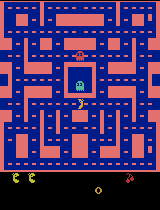

  Episode 5251/20000 | 4,024,000 decisions | 1,005,751 updates | 236.1 min
Episode 5251/20000 | score 2710 | recent mean 1673.6 | exploration 15%
  Episode 5252/20000 | 4,024,500 decisions | 1,005,876 updates | 236.1 min
  Episode 5252/20000 | 4,025,000 decisions | 1,006,001 updates | 236.2 min
Episode 5252/20000 | score 1810 | recent mean 1665.2 | exploration 15%
  Episode 5253/20000 | 4,025,500 decisions | 1,006,126 updates | 236.2 min
  Episode 5253/20000 | 4,026,000 decisions | 1,006,251 updates | 236.2 min
Episode 5253/20000 | score 1410 | recent mean 1614.8 | exploration 15%
  Episode 5254/20000 | 4,026,500 decisions | 1,006,376 updates | 236.2 min
Episode 5254/20000 | score 1360 | recent mean 1611.6 | exploration 15%
  Episode 5255/20000 | 4,027,000 decisions | 1,006,501 updates | 236.3 min
  Episode 5255/20000 | 4,027,500 decisions | 1,006,626 updates | 236.3 min
Episode 5255/20000 | score 2980 | recent mean 1713.2 | exploration 15%
  Episode 5256/20000 | 4,028,000 decisions | 

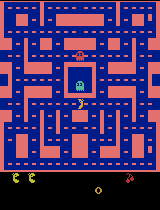

  Episode 5276/20000 | 4,045,000 decisions | 1,011,001 updates | 237.3 min
  Episode 5276/20000 | 4,045,500 decisions | 1,011,126 updates | 237.3 min
Episode 5276/20000 | score 1090 | recent mean 1710.8 | exploration 15%
  Episode 5277/20000 | 4,046,000 decisions | 1,011,251 updates | 237.4 min
Episode 5277/20000 | score 2120 | recent mean 1723.2 | exploration 15%
  Episode 5278/20000 | 4,046,500 decisions | 1,011,376 updates | 237.4 min
  Episode 5278/20000 | 4,047,000 decisions | 1,011,501 updates | 237.4 min
Episode 5278/20000 | score 1330 | recent mean 1720.0 | exploration 15%
  Episode 5279/20000 | 4,047,500 decisions | 1,011,626 updates | 237.5 min
Episode 5279/20000 | score 1580 | recent mean 1728.8 | exploration 15%
  Episode 5280/20000 | 4,048,000 decisions | 1,011,751 updates | 237.5 min
  Episode 5280/20000 | 4,048,500 decisions | 1,011,876 updates | 237.5 min
Episode 5280/20000 | score 1010 | recent mean 1650.0 | exploration 15%
  Episode 5281/20000 | 4,049,000 decisions | 

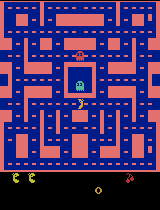

  Episode 5301/20000 | 4,067,500 decisions | 1,016,626 updates | 238.6 min
  Episode 5301/20000 | 4,068,000 decisions | 1,016,751 updates | 238.6 min
Episode 5301/20000 | score 2330 | recent mean 1976.8 | exploration 15%
  Episode 5302/20000 | 4,068,500 decisions | 1,016,876 updates | 238.6 min
Episode 5302/20000 | score 2820 | recent mean 2004.8 | exploration 15%
  Episode 5303/20000 | 4,069,000 decisions | 1,017,001 updates | 238.6 min
  Episode 5303/20000 | 4,069,500 decisions | 1,017,126 updates | 238.7 min
Episode 5303/20000 | score 1050 | recent mean 1993.6 | exploration 15%
  Episode 5304/20000 | 4,070,000 decisions | 1,017,251 updates | 238.7 min
Episode 5304/20000 | score 930 | recent mean 1967.6 | exploration 15%
  Episode 5305/20000 | 4,070,500 decisions | 1,017,376 updates | 238.7 min
  Episode 5305/20000 | 4,071,000 decisions | 1,017,501 updates | 238.8 min
Episode 5305/20000 | score 3810 | recent mean 2079.6 | exploration 15%
  Episode 5306/20000 | 4,071,500 decisions | 1

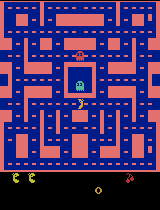

  Episode 5326/20000 | 4,090,000 decisions | 1,022,251 updates | 239.8 min
  Episode 5326/20000 | 4,090,500 decisions | 1,022,376 updates | 239.8 min
Episode 5326/20000 | score 2100 | recent mean 1876.8 | exploration 15%
  Episode 5327/20000 | 4,091,000 decisions | 1,022,501 updates | 239.9 min
  Episode 5327/20000 | 4,091,500 decisions | 1,022,626 updates | 239.9 min
Episode 5327/20000 | score 2210 | recent mean 1852.4 | exploration 15%
  Episode 5328/20000 | 4,092,000 decisions | 1,022,751 updates | 239.9 min
  Episode 5328/20000 | 4,092,500 decisions | 1,022,876 updates | 239.9 min
Episode 5328/20000 | score 1860 | recent mean 1884.8 | exploration 15%
  Episode 5329/20000 | 4,093,000 decisions | 1,023,001 updates | 240.0 min
  Episode 5329/20000 | 4,093,500 decisions | 1,023,126 updates | 240.0 min
Episode 5329/20000 | score 1880 | recent mean 1922.8 | exploration 15%
  Episode 5330/20000 | 4,094,000 decisions | 1,023,251 updates | 240.0 min
Episode 5330/20000 | score 1520 | recent 

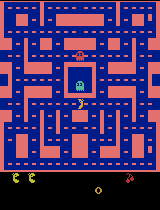

  Episode 5351/20000 | 4,114,500 decisions | 1,028,376 updates | 241.2 min
  Episode 5351/20000 | 4,115,000 decisions | 1,028,501 updates | 241.2 min
Episode 5351/20000 | score 1780 | recent mean 2158.0 | exploration 15%
  Episode 5352/20000 | 4,115,500 decisions | 1,028,626 updates | 241.2 min
  Episode 5352/20000 | 4,116,000 decisions | 1,028,751 updates | 241.3 min
Episode 5352/20000 | score 2160 | recent mean 2156.0 | exploration 15%
  Episode 5353/20000 | 4,116,500 decisions | 1,028,876 updates | 241.3 min
  Episode 5353/20000 | 4,117,000 decisions | 1,029,001 updates | 241.3 min
Episode 5353/20000 | score 740 | recent mean 2111.2 | exploration 15%
  Episode 5354/20000 | 4,117,500 decisions | 1,029,126 updates | 241.4 min
  Episode 5354/20000 | 4,118,000 decisions | 1,029,251 updates | 241.4 min
Episode 5354/20000 | score 2370 | recent mean 2130.8 | exploration 15%
  Episode 5355/20000 | 4,118,500 decisions | 1,029,376 updates | 241.4 min
Episode 5355/20000 | score 1100 | recent m

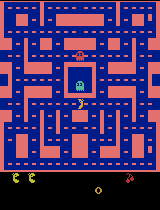

  Episode 5376/20000 | 4,136,500 decisions | 1,033,876 updates | 242.4 min
  Episode 5376/20000 | 4,137,000 decisions | 1,034,001 updates | 242.5 min
Episode 5376/20000 | score 1920 | recent mean 1743.6 | exploration 15%
  Episode 5377/20000 | 4,137,500 decisions | 1,034,126 updates | 242.5 min
  Episode 5377/20000 | 4,138,000 decisions | 1,034,251 updates | 242.5 min
Episode 5377/20000 | score 1650 | recent mean 1723.2 | exploration 15%
  Episode 5378/20000 | 4,138,500 decisions | 1,034,376 updates | 242.6 min
  Episode 5378/20000 | 4,139,000 decisions | 1,034,501 updates | 242.6 min
Episode 5378/20000 | score 1380 | recent mean 1748.8 | exploration 15%
  Episode 5379/20000 | 4,139,500 decisions | 1,034,626 updates | 242.6 min
  Episode 5379/20000 | 4,140,000 decisions | 1,034,751 updates | 242.6 min
Episode 5379/20000 | score 2820 | recent mean 1766.8 | exploration 15%
  Episode 5380/20000 | 4,140,500 decisions | 1,034,876 updates | 242.7 min
  Episode 5380/20000 | 4,141,000 decision

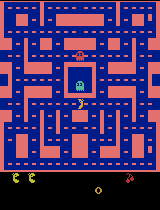

  Episode 5401/20000 | 4,158,500 decisions | 1,039,376 updates | 243.7 min
  Episode 5401/20000 | 4,159,000 decisions | 1,039,501 updates | 243.7 min
Episode 5401/20000 | score 2490 | recent mean 1809.6 | exploration 15%
  Episode 5402/20000 | 4,159,500 decisions | 1,039,626 updates | 243.7 min
  Episode 5402/20000 | 4,160,000 decisions | 1,039,751 updates | 243.7 min
Episode 5402/20000 | score 1580 | recent mean 1806.8 | exploration 15%
  Episode 5403/20000 | 4,160,500 decisions | 1,039,876 updates | 243.8 min
Episode 5403/20000 | score 830 | recent mean 1784.8 | exploration 15%
  Episode 5404/20000 | 4,161,000 decisions | 1,040,001 updates | 243.8 min
  Episode 5404/20000 | 4,161,500 decisions | 1,040,126 updates | 243.8 min
Episode 5404/20000 | score 1050 | recent mean 1714.0 | exploration 15%
  Episode 5405/20000 | 4,162,000 decisions | 1,040,251 updates | 243.9 min
  Episode 5405/20000 | 4,162,500 decisions | 1,040,376 updates | 243.9 min
Episode 5405/20000 | score 1310 | recent m

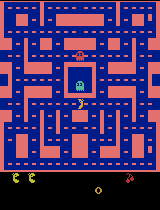

  Episode 5426/20000 | 4,182,500 decisions | 1,045,376 updates | 245.0 min
  Episode 5426/20000 | 4,183,000 decisions | 1,045,501 updates | 245.0 min
Episode 5426/20000 | score 1700 | recent mean 1962.4 | exploration 15%
  Episode 5427/20000 | 4,183,500 decisions | 1,045,626 updates | 245.0 min
Episode 5427/20000 | score 590 | recent mean 1922.8 | exploration 15%
  Episode 5428/20000 | 4,184,000 decisions | 1,045,751 updates | 245.1 min
  Episode 5428/20000 | 4,184,500 decisions | 1,045,876 updates | 245.1 min
Episode 5428/20000 | score 2140 | recent mean 1975.2 | exploration 15%
  Episode 5429/20000 | 4,185,000 decisions | 1,046,001 updates | 245.1 min
Episode 5429/20000 | score 520 | recent mean 1954.0 | exploration 15%
  Episode 5430/20000 | 4,185,500 decisions | 1,046,126 updates | 245.2 min
  Episode 5430/20000 | 4,186,000 decisions | 1,046,251 updates | 245.2 min
  Episode 5430/20000 | 4,186,500 decisions | 1,046,376 updates | 245.2 min
Episode 5430/20000 | score 2950 | recent me

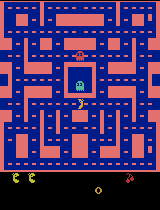

  Episode 5451/20000 | 4,205,000 decisions | 1,051,001 updates | 246.2 min
  Episode 5451/20000 | 4,205,500 decisions | 1,051,126 updates | 246.3 min
Episode 5451/20000 | score 1730 | recent mean 1744.0 | exploration 15%
  Episode 5452/20000 | 4,206,000 decisions | 1,051,251 updates | 246.3 min
  Episode 5452/20000 | 4,206,500 decisions | 1,051,376 updates | 246.3 min
Episode 5452/20000 | score 1630 | recent mean 1785.6 | exploration 15%
  Episode 5453/20000 | 4,207,000 decisions | 1,051,501 updates | 246.3 min
  Episode 5453/20000 | 4,207,500 decisions | 1,051,626 updates | 246.4 min
Episode 5453/20000 | score 1720 | recent mean 1768.8 | exploration 15%
  Episode 5454/20000 | 4,208,000 decisions | 1,051,751 updates | 246.4 min
Episode 5454/20000 | score 1200 | recent mean 1796.0 | exploration 15%
  Episode 5455/20000 | 4,208,500 decisions | 1,051,876 updates | 246.4 min
  Episode 5455/20000 | 4,209,000 decisions | 1,052,001 updates | 246.5 min
Episode 5455/20000 | score 1870 | recent 

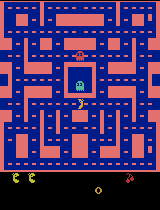

  Episode 5476/20000 | 4,227,500 decisions | 1,056,626 updates | 247.5 min
  Episode 5476/20000 | 4,228,000 decisions | 1,056,751 updates | 247.5 min
  Episode 5476/20000 | 4,228,500 decisions | 1,056,876 updates | 247.6 min
Episode 5476/20000 | score 1940 | recent mean 1842.0 | exploration 15%
  Episode 5477/20000 | 4,229,000 decisions | 1,057,001 updates | 247.6 min
  Episode 5477/20000 | 4,229,500 decisions | 1,057,126 updates | 247.6 min
Episode 5477/20000 | score 2050 | recent mean 1858.8 | exploration 15%
  Episode 5478/20000 | 4,230,000 decisions | 1,057,251 updates | 247.6 min
Episode 5478/20000 | score 1050 | recent mean 1832.0 | exploration 15%
  Episode 5479/20000 | 4,230,500 decisions | 1,057,376 updates | 247.7 min
  Episode 5479/20000 | 4,231,000 decisions | 1,057,501 updates | 247.7 min
Episode 5479/20000 | score 2030 | recent mean 1865.2 | exploration 15%
  Episode 5480/20000 | 4,231,500 decisions | 1,057,626 updates | 247.7 min
Episode 5480/20000 | score 1410 | recent 

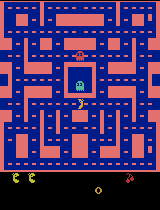

  Episode 5501/20000 | 4,250,500 decisions | 1,062,376 updates | 248.8 min
  Episode 5501/20000 | 4,251,000 decisions | 1,062,501 updates | 248.8 min
Episode 5501/20000 | score 3500 | recent mean 2066.4 | exploration 15%
  Episode 5502/20000 | 4,251,500 decisions | 1,062,626 updates | 248.8 min
  Episode 5502/20000 | 4,252,000 decisions | 1,062,751 updates | 248.9 min
Episode 5502/20000 | score 2000 | recent mean 2064.4 | exploration 15%
  Episode 5503/20000 | 4,252,500 decisions | 1,062,876 updates | 248.9 min
  Episode 5503/20000 | 4,253,000 decisions | 1,063,001 updates | 248.9 min
Episode 5503/20000 | score 1950 | recent mean 2100.4 | exploration 15%
  Episode 5504/20000 | 4,253,500 decisions | 1,063,126 updates | 248.9 min
  Episode 5504/20000 | 4,254,000 decisions | 1,063,251 updates | 249.0 min
Episode 5504/20000 | score 1830 | recent mean 2092.4 | exploration 15%
  Episode 5505/20000 | 4,254,500 decisions | 1,063,376 updates | 249.0 min
  Episode 5505/20000 | 4,255,000 decision

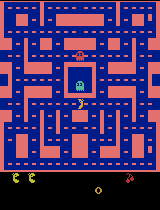

  Episode 5526/20000 | 4,274,500 decisions | 1,068,376 updates | 250.1 min
  Episode 5526/20000 | 4,275,000 decisions | 1,068,501 updates | 250.1 min
Episode 5526/20000 | score 1370 | recent mean 2024.0 | exploration 15%
  Episode 5527/20000 | 4,275,500 decisions | 1,068,626 updates | 250.2 min
Episode 5527/20000 | score 2610 | recent mean 2048.4 | exploration 15%
  Episode 5528/20000 | 4,276,000 decisions | 1,068,751 updates | 250.2 min
  Episode 5528/20000 | 4,276,500 decisions | 1,068,876 updates | 250.2 min
  Episode 5528/20000 | 4,277,000 decisions | 1,069,001 updates | 250.2 min
Episode 5528/20000 | score 2160 | recent mean 2056.8 | exploration 15%
  Episode 5529/20000 | 4,277,500 decisions | 1,069,126 updates | 250.3 min
Episode 5529/20000 | score 1450 | recent mean 2041.6 | exploration 15%
  Episode 5530/20000 | 4,278,000 decisions | 1,069,251 updates | 250.3 min
  Episode 5530/20000 | 4,278,500 decisions | 1,069,376 updates | 250.3 min
Episode 5530/20000 | score 1950 | recent 

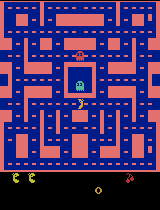

  Episode 5551/20000 | 4,297,000 decisions | 1,074,001 updates | 251.3 min
  Episode 5551/20000 | 4,297,500 decisions | 1,074,126 updates | 251.4 min
Episode 5551/20000 | score 1780 | recent mean 1792.0 | exploration 15%
  Episode 5552/20000 | 4,298,000 decisions | 1,074,251 updates | 251.4 min
Episode 5552/20000 | score 1310 | recent mean 1740.0 | exploration 15%
  Episode 5553/20000 | 4,298,500 decisions | 1,074,376 updates | 251.4 min
  Episode 5553/20000 | 4,299,000 decisions | 1,074,501 updates | 251.5 min
  Episode 5553/20000 | 4,299,500 decisions | 1,074,626 updates | 251.5 min
Episode 5553/20000 | score 2130 | recent mean 1738.8 | exploration 15%
  Episode 5554/20000 | 4,300,000 decisions | 1,074,751 updates | 251.5 min
Episode 5554/20000 | score 3170 | recent mean 1807.6 | exploration 15%
  Episode 5555/20000 | 4,300,500 decisions | 1,074,876 updates | 251.5 min
  Episode 5555/20000 | 4,301,000 decisions | 1,075,001 updates | 251.6 min
Episode 5555/20000 | score 870 | recent m

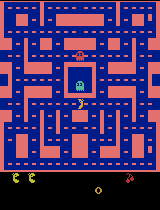

  Episode 5576/20000 | 4,319,000 decisions | 1,079,501 updates | 252.6 min
  Episode 5576/20000 | 4,319,500 decisions | 1,079,626 updates | 252.6 min
Episode 5576/20000 | score 2070 | recent mean 1868.4 | exploration 15%
  Episode 5577/20000 | 4,320,000 decisions | 1,079,751 updates | 252.6 min
  Episode 5577/20000 | 4,320,500 decisions | 1,079,876 updates | 252.7 min
Episode 5577/20000 | score 1510 | recent mean 1876.4 | exploration 15%
  Episode 5578/20000 | 4,321,000 decisions | 1,080,001 updates | 252.7 min
Episode 5578/20000 | score 1680 | recent mean 1858.4 | exploration 15%
  Episode 5579/20000 | 4,321,500 decisions | 1,080,126 updates | 252.7 min
  Episode 5579/20000 | 4,322,000 decisions | 1,080,251 updates | 252.7 min
Episode 5579/20000 | score 1970 | recent mean 1810.4 | exploration 15%
  Episode 5580/20000 | 4,322,500 decisions | 1,080,376 updates | 252.8 min
  Episode 5580/20000 | 4,323,000 decisions | 1,080,501 updates | 252.8 min
Episode 5580/20000 | score 2520 | recent 

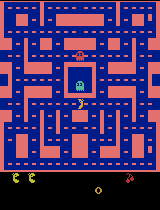

  Episode 5601/20000 | 4,342,500 decisions | 1,085,376 updates | 253.9 min
Episode 5601/20000 | score 930 | recent mean 1911.6 | exploration 15%
  Episode 5602/20000 | 4,343,000 decisions | 1,085,501 updates | 253.9 min
  Episode 5602/20000 | 4,343,500 decisions | 1,085,626 updates | 253.9 min
Episode 5602/20000 | score 1370 | recent mean 1906.0 | exploration 15%
  Episode 5603/20000 | 4,344,000 decisions | 1,085,751 updates | 254.0 min
Episode 5603/20000 | score 1550 | recent mean 1900.8 | exploration 15%
  Episode 5604/20000 | 4,344,500 decisions | 1,085,876 updates | 254.0 min
Episode 5604/20000 | score 990 | recent mean 1861.6 | exploration 15%
  Episode 5605/20000 | 4,345,000 decisions | 1,086,001 updates | 254.0 min
  Episode 5605/20000 | 4,345,500 decisions | 1,086,126 updates | 254.0 min
Episode 5605/20000 | score 1430 | recent mean 1818.0 | exploration 15%
  Episode 5606/20000 | 4,346,000 decisions | 1,086,251 updates | 254.1 min
  Episode 5606/20000 | 4,346,500 decisions | 1,

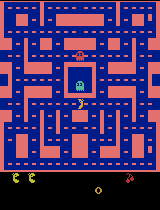

  Episode 5626/20000 | 4,364,500 decisions | 1,090,876 updates | 255.1 min
  Episode 5626/20000 | 4,365,000 decisions | 1,091,001 updates | 255.1 min
Episode 5626/20000 | score 2620 | recent mean 1943.6 | exploration 15%
  Episode 5627/20000 | 4,365,500 decisions | 1,091,126 updates | 255.1 min
Episode 5627/20000 | score 1670 | recent mean 1955.6 | exploration 15%
  Episode 5628/20000 | 4,366,000 decisions | 1,091,251 updates | 255.2 min
Episode 5628/20000 | score 600 | recent mean 1917.6 | exploration 15%
  Episode 5629/20000 | 4,366,500 decisions | 1,091,376 updates | 255.2 min
  Episode 5629/20000 | 4,367,000 decisions | 1,091,501 updates | 255.2 min
Episode 5629/20000 | score 2030 | recent mean 1959.2 | exploration 15%
  Episode 5630/20000 | 4,367,500 decisions | 1,091,626 updates | 255.2 min
  Episode 5630/20000 | 4,368,000 decisions | 1,091,751 updates | 255.3 min
Episode 5630/20000 | score 1760 | recent mean 1972.4 | exploration 15%
  Episode 5631/20000 | 4,368,500 decisions | 1

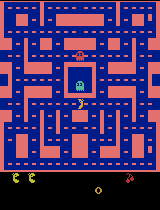

  Episode 5651/20000 | 4,387,000 decisions | 1,096,501 updates | 256.3 min
  Episode 5651/20000 | 4,387,500 decisions | 1,096,626 updates | 256.4 min
  Episode 5651/20000 | 4,388,000 decisions | 1,096,751 updates | 256.4 min
Episode 5651/20000 | score 5010 | recent mean 1944.0 | exploration 15%
  Episode 5652/20000 | 4,388,500 decisions | 1,096,876 updates | 256.4 min
  Episode 5652/20000 | 4,389,000 decisions | 1,097,001 updates | 256.4 min
Episode 5652/20000 | score 2100 | recent mean 1961.2 | exploration 15%
  Episode 5653/20000 | 4,389,500 decisions | 1,097,126 updates | 256.5 min
  Episode 5653/20000 | 4,390,000 decisions | 1,097,251 updates | 256.5 min
Episode 5653/20000 | score 2300 | recent mean 2029.2 | exploration 15%
  Episode 5654/20000 | 4,390,500 decisions | 1,097,376 updates | 256.5 min
  Episode 5654/20000 | 4,391,000 decisions | 1,097,501 updates | 256.6 min
Episode 5654/20000 | score 2290 | recent mean 2039.6 | exploration 15%
  Episode 5655/20000 | 4,391,500 decision

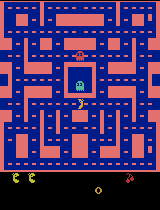

  Episode 5676/20000 | 4,413,000 decisions | 1,103,001 updates | 257.8 min
  Episode 5676/20000 | 4,413,500 decisions | 1,103,126 updates | 257.8 min
Episode 5676/20000 | score 3180 | recent mean 2292.8 | exploration 15%
  Episode 5677/20000 | 4,414,000 decisions | 1,103,251 updates | 257.8 min
Episode 5677/20000 | score 960 | recent mean 2247.2 | exploration 15%
  Episode 5678/20000 | 4,414,500 decisions | 1,103,376 updates | 257.9 min
  Episode 5678/20000 | 4,415,000 decisions | 1,103,501 updates | 257.9 min
Episode 5678/20000 | score 1890 | recent mean 2230.8 | exploration 15%
  Episode 5679/20000 | 4,415,500 decisions | 1,103,626 updates | 257.9 min
Episode 5679/20000 | score 1000 | recent mean 2179.2 | exploration 15%
  Episode 5680/20000 | 4,416,000 decisions | 1,103,751 updates | 257.9 min
  Episode 5680/20000 | 4,416,500 decisions | 1,103,876 updates | 258.0 min
  Episode 5680/20000 | 4,417,000 decisions | 1,104,001 updates | 258.0 min
Episode 5680/20000 | score 2370 | recent m

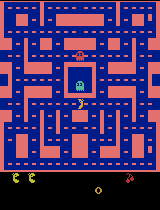

  Episode 5701/20000 | 4,435,500 decisions | 1,108,626 updates | 259.0 min
  Episode 5701/20000 | 4,436,000 decisions | 1,108,751 updates | 259.0 min
  Episode 5701/20000 | 4,436,500 decisions | 1,108,876 updates | 259.1 min
Episode 5701/20000 | score 2620 | recent mean 1800.8 | exploration 15%
  Episode 5702/20000 | 4,437,000 decisions | 1,109,001 updates | 259.1 min
  Episode 5702/20000 | 4,437,500 decisions | 1,109,126 updates | 259.1 min
Episode 5702/20000 | score 2050 | recent mean 1844.4 | exploration 15%
  Episode 5703/20000 | 4,438,000 decisions | 1,109,251 updates | 259.2 min
  Episode 5703/20000 | 4,438,500 decisions | 1,109,376 updates | 259.2 min
Episode 5703/20000 | score 2050 | recent mean 1850.8 | exploration 15%
  Episode 5704/20000 | 4,439,000 decisions | 1,109,501 updates | 259.2 min
Episode 5704/20000 | score 860 | recent mean 1845.2 | exploration 15%
  Episode 5705/20000 | 4,439,500 decisions | 1,109,626 updates | 259.2 min
  Episode 5705/20000 | 4,440,000 decisions

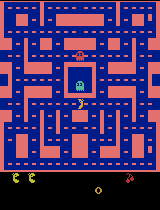

  Episode 5726/20000 | 4,459,000 decisions | 1,114,501 updates | 260.3 min
  Episode 5726/20000 | 4,459,500 decisions | 1,114,626 updates | 260.4 min
Episode 5726/20000 | score 1780 | recent mean 1959.2 | exploration 15%
  Episode 5727/20000 | 4,460,000 decisions | 1,114,751 updates | 260.4 min
  Episode 5727/20000 | 4,460,500 decisions | 1,114,876 updates | 260.4 min
Episode 5727/20000 | score 1780 | recent mean 1948.4 | exploration 15%
  Episode 5728/20000 | 4,461,000 decisions | 1,115,001 updates | 260.4 min
Episode 5728/20000 | score 2240 | recent mean 1956.0 | exploration 15%
  Episode 5729/20000 | 4,461,500 decisions | 1,115,126 updates | 260.5 min
  Episode 5729/20000 | 4,462,000 decisions | 1,115,251 updates | 260.5 min
Episode 5729/20000 | score 1830 | recent mean 1994.8 | exploration 15%
  Episode 5730/20000 | 4,462,500 decisions | 1,115,376 updates | 260.5 min
  Episode 5730/20000 | 4,463,000 decisions | 1,115,501 updates | 260.6 min
  Episode 5730/20000 | 4,463,500 decision

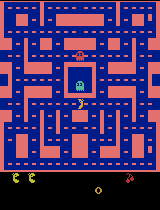

  Episode 5751/20000 | 4,482,500 decisions | 1,120,376 updates | 261.7 min
  Episode 5751/20000 | 4,483,000 decisions | 1,120,501 updates | 261.7 min
Episode 5751/20000 | score 2060 | recent mean 1891.6 | exploration 15%
  Episode 5752/20000 | 4,483,500 decisions | 1,120,626 updates | 261.7 min
Episode 5752/20000 | score 540 | recent mean 1842.0 | exploration 15%
  Episode 5753/20000 | 4,484,000 decisions | 1,120,751 updates | 261.8 min
  Episode 5753/20000 | 4,484,500 decisions | 1,120,876 updates | 261.8 min
Episode 5753/20000 | score 2320 | recent mean 1845.2 | exploration 15%
  Episode 5754/20000 | 4,485,000 decisions | 1,121,001 updates | 261.8 min
Episode 5754/20000 | score 930 | recent mean 1809.2 | exploration 15%
  Episode 5755/20000 | 4,485,500 decisions | 1,121,126 updates | 261.8 min
  Episode 5755/20000 | 4,486,000 decisions | 1,121,251 updates | 261.9 min
Episode 5755/20000 | score 1680 | recent mean 1797.6 | exploration 15%
  Episode 5756/20000 | 4,486,500 decisions | 1,

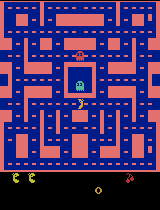

  Episode 5776/20000 | 4,505,000 decisions | 1,126,001 updates | 262.9 min
  Episode 5776/20000 | 4,505,500 decisions | 1,126,126 updates | 263.0 min
  Episode 5776/20000 | 4,506,000 decisions | 1,126,251 updates | 263.0 min
Episode 5776/20000 | score 3450 | recent mean 1916.0 | exploration 15%
  Episode 5777/20000 | 4,506,500 decisions | 1,126,376 updates | 263.0 min
Episode 5777/20000 | score 1460 | recent mean 1952.8 | exploration 15%
  Episode 5778/20000 | 4,507,000 decisions | 1,126,501 updates | 263.0 min
  Episode 5778/20000 | 4,507,500 decisions | 1,126,626 updates | 263.1 min
Episode 5778/20000 | score 1460 | recent mean 1918.4 | exploration 15%
  Episode 5779/20000 | 4,508,000 decisions | 1,126,751 updates | 263.1 min
  Episode 5779/20000 | 4,508,500 decisions | 1,126,876 updates | 263.1 min
Episode 5779/20000 | score 890 | recent mean 1916.8 | exploration 15%
  Episode 5780/20000 | 4,509,000 decisions | 1,127,001 updates | 263.1 min
  Episode 5780/20000 | 4,509,500 decisions

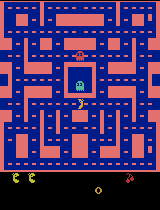

  Episode 5801/20000 | 4,527,000 decisions | 1,131,501 updates | 264.2 min
  Episode 5801/20000 | 4,527,500 decisions | 1,131,626 updates | 264.2 min
Episode 5801/20000 | score 1700 | recent mean 1688.4 | exploration 15%
  Episode 5802/20000 | 4,528,000 decisions | 1,131,751 updates | 264.2 min
  Episode 5802/20000 | 4,528,500 decisions | 1,131,876 updates | 264.3 min
Episode 5802/20000 | score 1160 | recent mean 1676.4 | exploration 15%
  Episode 5803/20000 | 4,529,000 decisions | 1,132,001 updates | 264.3 min
  Episode 5803/20000 | 4,529,500 decisions | 1,132,126 updates | 264.3 min
Episode 5803/20000 | score 1780 | recent mean 1689.2 | exploration 15%
  Episode 5804/20000 | 4,530,000 decisions | 1,132,251 updates | 264.3 min
Episode 5804/20000 | score 1600 | recent mean 1717.6 | exploration 15%
  Episode 5805/20000 | 4,530,500 decisions | 1,132,376 updates | 264.4 min
  Episode 5805/20000 | 4,531,000 decisions | 1,132,501 updates | 264.4 min
Episode 5805/20000 | score 1080 | recent 

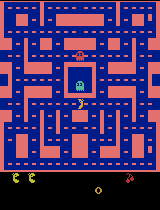

  Episode 5826/20000 | 4,548,500 decisions | 1,136,876 updates | 265.4 min
  Episode 5826/20000 | 4,549,000 decisions | 1,137,001 updates | 265.4 min
Episode 5826/20000 | score 2040 | recent mean 1976.0 | exploration 15%
  Episode 5827/20000 | 4,549,500 decisions | 1,137,126 updates | 265.4 min
Episode 5827/20000 | score 1590 | recent mean 1993.2 | exploration 15%
  Episode 5828/20000 | 4,550,000 decisions | 1,137,251 updates | 265.5 min
  Episode 5828/20000 | 4,550,500 decisions | 1,137,376 updates | 265.5 min
Episode 5828/20000 | score 1580 | recent mean 1985.2 | exploration 15%
  Episode 5829/20000 | 4,551,000 decisions | 1,137,501 updates | 265.5 min
  Episode 5829/20000 | 4,551,500 decisions | 1,137,626 updates | 265.6 min
Episode 5829/20000 | score 1540 | recent mean 1982.8 | exploration 15%
  Episode 5830/20000 | 4,552,000 decisions | 1,137,751 updates | 265.6 min
Episode 5830/20000 | score 1600 | recent mean 2003.6 | exploration 15%
  Episode 5831/20000 | 4,552,500 decisions | 

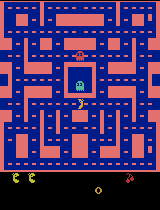

  Episode 5851/20000 | 4,570,500 decisions | 1,142,376 updates | 266.6 min
  Episode 5851/20000 | 4,571,000 decisions | 1,142,501 updates | 266.7 min
Episode 5851/20000 | score 2780 | recent mean 2004.0 | exploration 15%
  Episode 5852/20000 | 4,571,500 decisions | 1,142,626 updates | 266.7 min
  Episode 5852/20000 | 4,572,000 decisions | 1,142,751 updates | 266.7 min
Episode 5852/20000 | score 1720 | recent mean 2009.2 | exploration 15%
  Episode 5853/20000 | 4,572,500 decisions | 1,142,876 updates | 266.7 min
  Episode 5853/20000 | 4,573,000 decisions | 1,143,001 updates | 266.8 min
Episode 5853/20000 | score 1970 | recent mean 2024.8 | exploration 15%
  Episode 5854/20000 | 4,573,500 decisions | 1,143,126 updates | 266.8 min
  Episode 5854/20000 | 4,574,000 decisions | 1,143,251 updates | 266.8 min
Episode 5854/20000 | score 2980 | recent mean 2082.4 | exploration 15%
  Episode 5855/20000 | 4,574,500 decisions | 1,143,376 updates | 266.8 min
  Episode 5855/20000 | 4,575,000 decision

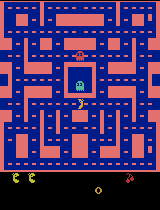

  Episode 5876/20000 | 4,594,000 decisions | 1,148,251 updates | 267.9 min
  Episode 5876/20000 | 4,594,500 decisions | 1,148,376 updates | 268.0 min
Episode 5876/20000 | score 2900 | recent mean 1916.0 | exploration 15%
  Episode 5877/20000 | 4,595,000 decisions | 1,148,501 updates | 268.0 min
  Episode 5877/20000 | 4,595,500 decisions | 1,148,626 updates | 268.0 min
Episode 5877/20000 | score 1800 | recent mean 1919.2 | exploration 15%
  Episode 5878/20000 | 4,596,000 decisions | 1,148,751 updates | 268.0 min
  Episode 5878/20000 | 4,596,500 decisions | 1,148,876 updates | 268.1 min
Episode 5878/20000 | score 2040 | recent mean 1922.0 | exploration 15%
  Episode 5879/20000 | 4,597,000 decisions | 1,149,001 updates | 268.1 min
Episode 5879/20000 | score 900 | recent mean 1838.8 | exploration 15%
  Episode 5880/20000 | 4,597,500 decisions | 1,149,126 updates | 268.1 min
  Episode 5880/20000 | 4,598,000 decisions | 1,149,251 updates | 268.2 min
Episode 5880/20000 | score 1200 | recent m

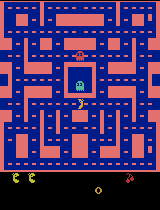

  Episode 5901/20000 | 4,618,000 decisions | 1,154,251 updates | 269.3 min
Episode 5901/20000 | score 1900 | recent mean 1868.8 | exploration 15%
  Episode 5902/20000 | 4,618,500 decisions | 1,154,376 updates | 269.3 min
  Episode 5902/20000 | 4,619,000 decisions | 1,154,501 updates | 269.3 min
Episode 5902/20000 | score 3170 | recent mean 1923.6 | exploration 15%
  Episode 5903/20000 | 4,619,500 decisions | 1,154,626 updates | 269.3 min
  Episode 5903/20000 | 4,620,000 decisions | 1,154,751 updates | 269.4 min
  Episode 5903/20000 | 4,620,500 decisions | 1,154,876 updates | 269.4 min
Episode 5903/20000 | score 1750 | recent mean 1912.0 | exploration 15%
  Episode 5904/20000 | 4,621,000 decisions | 1,155,001 updates | 269.4 min
Episode 5904/20000 | score 1460 | recent mean 1934.4 | exploration 15%
  Episode 5905/20000 | 4,621,500 decisions | 1,155,126 updates | 269.5 min
  Episode 5905/20000 | 4,622,000 decisions | 1,155,251 updates | 269.5 min
  Episode 5905/20000 | 4,622,500 decision

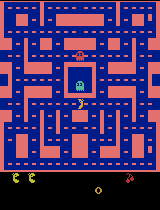

  Episode 5926/20000 | 4,641,500 decisions | 1,160,126 updates | 270.6 min
  Episode 5926/20000 | 4,642,000 decisions | 1,160,251 updates | 270.6 min
Episode 5926/20000 | score 1650 | recent mean 1881.2 | exploration 15%
  Episode 5927/20000 | 4,642,500 decisions | 1,160,376 updates | 270.6 min
Episode 5927/20000 | score 3400 | recent mean 1890.4 | exploration 15%
  Episode 5928/20000 | 4,643,000 decisions | 1,160,501 updates | 270.7 min
  Episode 5928/20000 | 4,643,500 decisions | 1,160,626 updates | 270.7 min
  Episode 5928/20000 | 4,644,000 decisions | 1,160,751 updates | 270.7 min
Episode 5928/20000 | score 1540 | recent mean 1882.0 | exploration 15%
  Episode 5929/20000 | 4,644,500 decisions | 1,160,876 updates | 270.7 min
  Episode 5929/20000 | 4,645,000 decisions | 1,161,001 updates | 270.8 min
Episode 5929/20000 | score 2370 | recent mean 1918.4 | exploration 15%
  Episode 5930/20000 | 4,645,500 decisions | 1,161,126 updates | 270.8 min
  Episode 5930/20000 | 4,646,000 decision

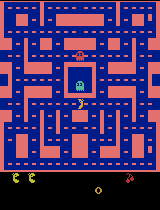

  Episode 5951/20000 | 4,666,500 decisions | 1,166,376 updates | 272.0 min
  Episode 5951/20000 | 4,667,000 decisions | 1,166,501 updates | 272.0 min
Episode 5951/20000 | score 2020 | recent mean 2076.0 | exploration 15%
  Episode 5952/20000 | 4,667,500 decisions | 1,166,626 updates | 272.1 min
  Episode 5952/20000 | 4,668,000 decisions | 1,166,751 updates | 272.1 min
Episode 5952/20000 | score 2560 | recent mean 2042.4 | exploration 15%
  Episode 5953/20000 | 4,668,500 decisions | 1,166,876 updates | 272.1 min
Episode 5953/20000 | score 2400 | recent mean 2076.8 | exploration 15%
  Episode 5954/20000 | 4,669,000 decisions | 1,167,001 updates | 272.1 min
  Episode 5954/20000 | 4,669,500 decisions | 1,167,126 updates | 272.2 min
Episode 5954/20000 | score 2650 | recent mean 2088.0 | exploration 15%
  Episode 5955/20000 | 4,670,000 decisions | 1,167,251 updates | 272.2 min
  Episode 5955/20000 | 4,670,500 decisions | 1,167,376 updates | 272.2 min
  Episode 5955/20000 | 4,671,000 decision

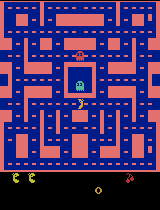

  Episode 5976/20000 | 4,690,500 decisions | 1,172,376 updates | 273.4 min
  Episode 5976/20000 | 4,691,000 decisions | 1,172,501 updates | 273.4 min
Episode 5976/20000 | score 2460 | recent mean 2029.6 | exploration 15%
  Episode 5977/20000 | 4,691,500 decisions | 1,172,626 updates | 273.4 min
  Episode 5977/20000 | 4,692,000 decisions | 1,172,751 updates | 273.4 min
Episode 5977/20000 | score 2840 | recent mean 2040.8 | exploration 15%
  Episode 5978/20000 | 4,692,500 decisions | 1,172,876 updates | 273.5 min
  Episode 5978/20000 | 4,693,000 decisions | 1,173,001 updates | 273.5 min
Episode 5978/20000 | score 4000 | recent mean 2104.8 | exploration 15%
  Episode 5979/20000 | 4,693,500 decisions | 1,173,126 updates | 273.5 min
  Episode 5979/20000 | 4,694,000 decisions | 1,173,251 updates | 273.6 min
Episode 5979/20000 | score 1950 | recent mean 2076.8 | exploration 15%
  Episode 5980/20000 | 4,694,500 decisions | 1,173,376 updates | 273.6 min
  Episode 5980/20000 | 4,695,000 decision

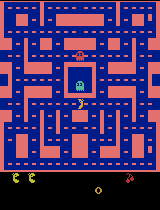

  Episode 6001/20000 | 4,714,000 decisions | 1,178,251 updates | 274.7 min
  Episode 6001/20000 | 4,714,500 decisions | 1,178,376 updates | 274.7 min
Episode 6001/20000 | score 3210 | recent mean 2228.0 | exploration 15%
  Episode 6002/20000 | 4,715,000 decisions | 1,178,501 updates | 274.7 min
  Episode 6002/20000 | 4,715,500 decisions | 1,178,626 updates | 274.8 min
Episode 6002/20000 | score 2130 | recent mean 2199.6 | exploration 15%
  Episode 6003/20000 | 4,716,000 decisions | 1,178,751 updates | 274.8 min
  Episode 6003/20000 | 4,716,500 decisions | 1,178,876 updates | 274.8 min
Episode 6003/20000 | score 1850 | recent mean 2113.6 | exploration 15%
  Episode 6004/20000 | 4,717,000 decisions | 1,179,001 updates | 274.9 min
  Episode 6004/20000 | 4,717,500 decisions | 1,179,126 updates | 274.9 min
Episode 6004/20000 | score 1740 | recent mean 2105.2 | exploration 15%
  Episode 6005/20000 | 4,718,000 decisions | 1,179,251 updates | 274.9 min
  Episode 6005/20000 | 4,718,500 decision

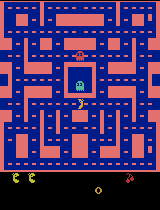

  Episode 6026/20000 | 4,737,500 decisions | 1,184,126 updates | 276.0 min
  Episode 6026/20000 | 4,738,000 decisions | 1,184,251 updates | 276.0 min
Episode 6026/20000 | score 1920 | recent mean 1903.2 | exploration 15%
  Episode 6027/20000 | 4,738,500 decisions | 1,184,376 updates | 276.1 min
  Episode 6027/20000 | 4,739,000 decisions | 1,184,501 updates | 276.1 min
Episode 6027/20000 | score 1460 | recent mean 1876.4 | exploration 15%
  Episode 6028/20000 | 4,739,500 decisions | 1,184,626 updates | 276.1 min
  Episode 6028/20000 | 4,740,000 decisions | 1,184,751 updates | 276.1 min
Episode 6028/20000 | score 1540 | recent mean 1864.0 | exploration 15%
  Episode 6029/20000 | 4,740,500 decisions | 1,184,876 updates | 276.2 min
  Episode 6029/20000 | 4,741,000 decisions | 1,185,001 updates | 276.2 min
Episode 6029/20000 | score 1620 | recent mean 1859.2 | exploration 15%
  Episode 6030/20000 | 4,741,500 decisions | 1,185,126 updates | 276.2 min
Episode 6030/20000 | score 1430 | recent 

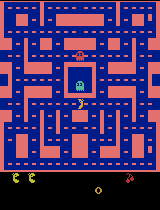

  Episode 6051/20000 | 4,762,000 decisions | 1,190,251 updates | 277.4 min
  Episode 6051/20000 | 4,762,500 decisions | 1,190,376 updates | 277.4 min
Episode 6051/20000 | score 1710 | recent mean 1839.6 | exploration 15%
  Episode 6052/20000 | 4,763,000 decisions | 1,190,501 updates | 277.4 min
  Episode 6052/20000 | 4,763,500 decisions | 1,190,626 updates | 277.5 min
Episode 6052/20000 | score 2010 | recent mean 1861.6 | exploration 15%
  Episode 6053/20000 | 4,764,000 decisions | 1,190,751 updates | 277.5 min
  Episode 6053/20000 | 4,764,500 decisions | 1,190,876 updates | 277.5 min
Episode 6053/20000 | score 1770 | recent mean 1870.8 | exploration 15%
  Episode 6054/20000 | 4,765,000 decisions | 1,191,001 updates | 277.6 min
  Episode 6054/20000 | 4,765,500 decisions | 1,191,126 updates | 277.6 min
Episode 6054/20000 | score 1140 | recent mean 1851.6 | exploration 15%
  Episode 6055/20000 | 4,766,000 decisions | 1,191,251 updates | 277.6 min
Episode 6055/20000 | score 1690 | recent 

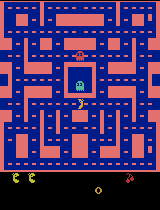

  Episode 6076/20000 | 4,784,000 decisions | 1,195,751 updates | 278.6 min
  Episode 6076/20000 | 4,784,500 decisions | 1,195,876 updates | 278.6 min
Episode 6076/20000 | score 2220 | recent mean 1790.4 | exploration 15%
  Episode 6077/20000 | 4,785,000 decisions | 1,196,001 updates | 278.7 min
  Episode 6077/20000 | 4,785,500 decisions | 1,196,126 updates | 278.7 min
Episode 6077/20000 | score 1740 | recent mean 1779.6 | exploration 15%
  Episode 6078/20000 | 4,786,000 decisions | 1,196,251 updates | 278.7 min
Episode 6078/20000 | score 970 | recent mean 1747.6 | exploration 15%
  Episode 6079/20000 | 4,786,500 decisions | 1,196,376 updates | 278.7 min
  Episode 6079/20000 | 4,787,000 decisions | 1,196,501 updates | 278.8 min
Episode 6079/20000 | score 1380 | recent mean 1757.2 | exploration 15%
  Episode 6080/20000 | 4,787,500 decisions | 1,196,626 updates | 278.8 min
  Episode 6080/20000 | 4,788,000 decisions | 1,196,751 updates | 278.8 min
Episode 6080/20000 | score 1580 | recent m

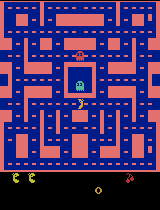

  Episode 6101/20000 | 4,807,000 decisions | 1,201,501 updates | 279.9 min
  Episode 6101/20000 | 4,807,500 decisions | 1,201,626 updates | 279.9 min
Episode 6101/20000 | score 1550 | recent mean 1716.4 | exploration 15%
  Episode 6102/20000 | 4,808,000 decisions | 1,201,751 updates | 279.9 min
Episode 6102/20000 | score 1780 | recent mean 1718.0 | exploration 15%
  Episode 6103/20000 | 4,808,500 decisions | 1,201,876 updates | 280.0 min
  Episode 6103/20000 | 4,809,000 decisions | 1,202,001 updates | 280.0 min
Episode 6103/20000 | score 2330 | recent mean 1772.4 | exploration 15%
  Episode 6104/20000 | 4,809,500 decisions | 1,202,126 updates | 280.0 min
  Episode 6104/20000 | 4,810,000 decisions | 1,202,251 updates | 280.0 min
Episode 6104/20000 | score 2230 | recent mean 1806.4 | exploration 15%
  Episode 6105/20000 | 4,810,500 decisions | 1,202,376 updates | 280.1 min
  Episode 6105/20000 | 4,811,000 decisions | 1,202,501 updates | 280.1 min
Episode 6105/20000 | score 2060 | recent 

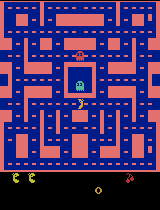

  Episode 6126/20000 | 4,829,500 decisions | 1,207,126 updates | 281.2 min
  Episode 6126/20000 | 4,830,000 decisions | 1,207,251 updates | 281.2 min
Episode 6126/20000 | score 700 | recent mean 1759.6 | exploration 15%
  Episode 6127/20000 | 4,830,500 decisions | 1,207,376 updates | 281.2 min
Episode 6127/20000 | score 880 | recent mean 1723.6 | exploration 15%
  Episode 6128/20000 | 4,831,000 decisions | 1,207,501 updates | 281.3 min
  Episode 6128/20000 | 4,831,500 decisions | 1,207,626 updates | 281.3 min
  Episode 6128/20000 | 4,832,000 decisions | 1,207,751 updates | 281.3 min
Episode 6128/20000 | score 3680 | recent mean 1777.6 | exploration 15%
  Episode 6129/20000 | 4,832,500 decisions | 1,207,876 updates | 281.3 min
  Episode 6129/20000 | 4,833,000 decisions | 1,208,001 updates | 281.4 min
Episode 6129/20000 | score 2020 | recent mean 1769.2 | exploration 15%
  Episode 6130/20000 | 4,833,500 decisions | 1,208,126 updates | 281.4 min
  Episode 6130/20000 | 4,834,000 decisions 

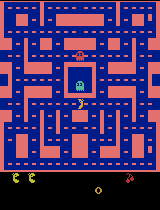

  Episode 6151/20000 | 4,853,000 decisions | 1,213,001 updates | 282.5 min
  Episode 6151/20000 | 4,853,500 decisions | 1,213,126 updates | 282.6 min
Episode 6151/20000 | score 1250 | recent mean 1833.2 | exploration 15%
  Episode 6152/20000 | 4,854,000 decisions | 1,213,251 updates | 282.6 min
  Episode 6152/20000 | 4,854,500 decisions | 1,213,376 updates | 282.6 min
  Episode 6152/20000 | 4,855,000 decisions | 1,213,501 updates | 282.6 min
Episode 6152/20000 | score 1760 | recent mean 1868.4 | exploration 15%
  Episode 6153/20000 | 4,855,500 decisions | 1,213,626 updates | 282.7 min
  Episode 6153/20000 | 4,856,000 decisions | 1,213,751 updates | 282.7 min
Episode 6153/20000 | score 2500 | recent mean 1821.2 | exploration 15%
  Episode 6154/20000 | 4,856,500 decisions | 1,213,876 updates | 282.7 min
Episode 6154/20000 | score 1460 | recent mean 1798.8 | exploration 15%
  Episode 6155/20000 | 4,857,000 decisions | 1,214,001 updates | 282.8 min
  Episode 6155/20000 | 4,857,500 decision

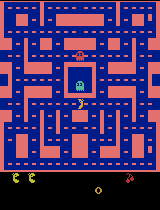

  Episode 6176/20000 | 4,876,500 decisions | 1,218,876 updates | 283.9 min
Episode 6176/20000 | score 810 | recent mean 1767.6 | exploration 15%
  Episode 6177/20000 | 4,877,000 decisions | 1,219,001 updates | 283.9 min
  Episode 6177/20000 | 4,877,500 decisions | 1,219,126 updates | 283.9 min
Episode 6177/20000 | score 1810 | recent mean 1769.6 | exploration 15%
  Episode 6178/20000 | 4,878,000 decisions | 1,219,251 updates | 284.0 min
  Episode 6178/20000 | 4,878,500 decisions | 1,219,376 updates | 284.0 min
Episode 6178/20000 | score 2740 | recent mean 1779.2 | exploration 15%
  Episode 6179/20000 | 4,879,000 decisions | 1,219,501 updates | 284.0 min
  Episode 6179/20000 | 4,879,500 decisions | 1,219,626 updates | 284.0 min
Episode 6179/20000 | score 2810 | recent mean 1833.2 | exploration 15%
  Episode 6180/20000 | 4,880,000 decisions | 1,219,751 updates | 284.1 min
Episode 6180/20000 | score 520 | recent mean 1768.4 | exploration 15%
  Episode 6181/20000 | 4,880,500 decisions | 1,

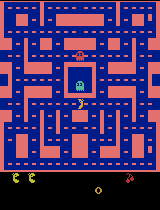

  Episode 6201/20000 | 4,899,500 decisions | 1,224,626 updates | 285.2 min
  Episode 6201/20000 | 4,900,000 decisions | 1,224,751 updates | 285.2 min
Episode 6201/20000 | score 1560 | recent mean 1994.8 | exploration 15%
  Episode 6202/20000 | 4,900,500 decisions | 1,224,876 updates | 285.2 min
Episode 6202/20000 | score 1300 | recent mean 1974.4 | exploration 15%
  Episode 6203/20000 | 4,901,000 decisions | 1,225,001 updates | 285.3 min
  Episode 6203/20000 | 4,901,500 decisions | 1,225,126 updates | 285.3 min
Episode 6203/20000 | score 2320 | recent mean 1957.6 | exploration 15%
  Episode 6204/20000 | 4,902,000 decisions | 1,225,251 updates | 285.3 min
  Episode 6204/20000 | 4,902,500 decisions | 1,225,376 updates | 285.3 min
Episode 6204/20000 | score 1780 | recent mean 1916.4 | exploration 15%
  Episode 6205/20000 | 4,903,000 decisions | 1,225,501 updates | 285.4 min
Episode 6205/20000 | score 1780 | recent mean 1966.8 | exploration 15%
  Episode 6206/20000 | 4,903,500 decisions | 

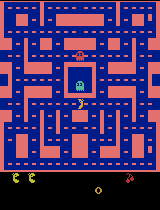

  Episode 6226/20000 | 4,921,500 decisions | 1,230,126 updates | 286.4 min
Episode 6226/20000 | score 1710 | recent mean 1802.8 | exploration 15%
  Episode 6227/20000 | 4,922,000 decisions | 1,230,251 updates | 286.4 min
  Episode 6227/20000 | 4,922,500 decisions | 1,230,376 updates | 286.4 min
Episode 6227/20000 | score 1470 | recent mean 1809.6 | exploration 15%
  Episode 6228/20000 | 4,923,000 decisions | 1,230,501 updates | 286.5 min
  Episode 6228/20000 | 4,923,500 decisions | 1,230,626 updates | 286.5 min
Episode 6228/20000 | score 2350 | recent mean 1810.8 | exploration 15%
  Episode 6229/20000 | 4,924,000 decisions | 1,230,751 updates | 286.5 min
Episode 6229/20000 | score 1770 | recent mean 1810.4 | exploration 15%
  Episode 6230/20000 | 4,924,500 decisions | 1,230,876 updates | 286.6 min
  Episode 6230/20000 | 4,925,000 decisions | 1,231,001 updates | 286.6 min
  Episode 6230/20000 | 4,925,500 decisions | 1,231,126 updates | 286.6 min
Episode 6230/20000 | score 3410 | recent 

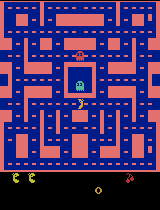

  Episode 6251/20000 | 4,944,500 decisions | 1,235,876 updates | 287.7 min
  Episode 6251/20000 | 4,945,000 decisions | 1,236,001 updates | 287.7 min
Episode 6251/20000 | score 3030 | recent mean 2007.6 | exploration 15%
  Episode 6252/20000 | 4,945,500 decisions | 1,236,126 updates | 287.7 min
Episode 6252/20000 | score 1490 | recent mean 2008.4 | exploration 15%
  Episode 6253/20000 | 4,946,000 decisions | 1,236,251 updates | 287.8 min
  Episode 6253/20000 | 4,946,500 decisions | 1,236,376 updates | 287.8 min
Episode 6253/20000 | score 2830 | recent mean 2027.6 | exploration 15%
  Episode 6254/20000 | 4,947,000 decisions | 1,236,501 updates | 287.8 min
  Episode 6254/20000 | 4,947,500 decisions | 1,236,626 updates | 287.9 min
Episode 6254/20000 | score 2640 | recent mean 2062.4 | exploration 15%
  Episode 6255/20000 | 4,948,000 decisions | 1,236,751 updates | 287.9 min
  Episode 6255/20000 | 4,948,500 decisions | 1,236,876 updates | 287.9 min
Episode 6255/20000 | score 1830 | recent 

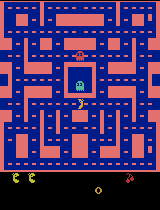

  Episode 6276/20000 | 4,968,000 decisions | 1,241,751 updates | 289.0 min
  Episode 6276/20000 | 4,968,500 decisions | 1,241,876 updates | 289.0 min
  Episode 6276/20000 | 4,969,000 decisions | 1,242,001 updates | 289.1 min
Episode 6276/20000 | score 2340 | recent mean 2171.2 | exploration 15%
  Episode 6277/20000 | 4,969,500 decisions | 1,242,126 updates | 289.1 min
Episode 6277/20000 | score 1810 | recent mean 2184.0 | exploration 15%
  Episode 6278/20000 | 4,970,000 decisions | 1,242,251 updates | 289.1 min
  Episode 6278/20000 | 4,970,500 decisions | 1,242,376 updates | 289.2 min
Episode 6278/20000 | score 2930 | recent mean 2188.0 | exploration 15%
  Episode 6279/20000 | 4,971,000 decisions | 1,242,501 updates | 289.2 min
  Episode 6279/20000 | 4,971,500 decisions | 1,242,626 updates | 289.2 min
Episode 6279/20000 | score 850 | recent mean 2116.4 | exploration 15%
  Episode 6280/20000 | 4,972,000 decisions | 1,242,751 updates | 289.2 min
Episode 6280/20000 | score 1430 | recent m

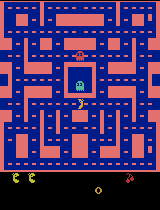

  Episode 6301/20000 | 4,993,000 decisions | 1,248,001 updates | 290.5 min
  Episode 6301/20000 | 4,993,500 decisions | 1,248,126 updates | 290.5 min
Episode 6301/20000 | score 1730 | recent mean 1997.2 | exploration 15%
  Episode 6302/20000 | 4,994,000 decisions | 1,248,251 updates | 290.5 min
  Episode 6302/20000 | 4,994,500 decisions | 1,248,376 updates | 290.5 min
  Episode 6302/20000 | 4,995,000 decisions | 1,248,501 updates | 290.6 min
Episode 6302/20000 | score 3340 | recent mean 2058.4 | exploration 15%
  Episode 6303/20000 | 4,995,500 decisions | 1,248,626 updates | 290.6 min
  Episode 6303/20000 | 4,996,000 decisions | 1,248,751 updates | 290.6 min
Episode 6303/20000 | score 1360 | recent mean 1995.6 | exploration 15%
  Episode 6304/20000 | 4,996,500 decisions | 1,248,876 updates | 290.7 min
Episode 6304/20000 | score 1720 | recent mean 2030.4 | exploration 15%
  Episode 6305/20000 | 4,997,000 decisions | 1,249,001 updates | 290.7 min
  Episode 6305/20000 | 4,997,500 decision

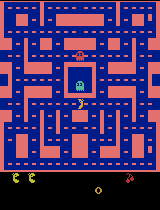

  Episode 6326/20000 | 5,015,500 decisions | 1,253,626 updates | 291.7 min
Episode 6326/20000 | score 1250 | recent mean 1869.6 | exploration 15%
  Episode 6327/20000 | 5,016,000 decisions | 1,253,751 updates | 291.8 min
  Episode 6327/20000 | 5,016,500 decisions | 1,253,876 updates | 291.8 min
  Episode 6327/20000 | 5,017,000 decisions | 1,254,001 updates | 291.8 min
Episode 6327/20000 | score 1650 | recent mean 1802.0 | exploration 15%
  Episode 6328/20000 | 5,017,500 decisions | 1,254,126 updates | 291.8 min
Episode 6328/20000 | score 1720 | recent mean 1816.4 | exploration 15%
  Episode 6329/20000 | 5,018,000 decisions | 1,254,251 updates | 291.9 min
  Episode 6329/20000 | 5,018,500 decisions | 1,254,376 updates | 291.9 min
  Episode 6329/20000 | 5,019,000 decisions | 1,254,501 updates | 291.9 min
Episode 6329/20000 | score 2400 | recent mean 1843.6 | exploration 15%
  Episode 6330/20000 | 5,019,500 decisions | 1,254,626 updates | 291.9 min
Episode 6330/20000 | score 1370 | recent 

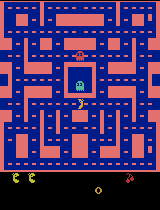

  Episode 6351/20000 | 5,038,500 decisions | 1,259,376 updates | 293.0 min
  Episode 6351/20000 | 5,039,000 decisions | 1,259,501 updates | 293.0 min
  Episode 6351/20000 | 5,039,500 decisions | 1,259,626 updates | 293.0 min
Episode 6351/20000 | score 2060 | recent mean 2195.6 | exploration 15%
  Episode 6352/20000 | 5,040,000 decisions | 1,259,751 updates | 293.1 min
  Episode 6352/20000 | 5,040,500 decisions | 1,259,876 updates | 293.1 min
Episode 6352/20000 | score 3020 | recent mean 2250.4 | exploration 15%
  Episode 6353/20000 | 5,041,000 decisions | 1,260,001 updates | 293.1 min
  Episode 6353/20000 | 5,041,500 decisions | 1,260,126 updates | 293.1 min
Episode 6353/20000 | score 2480 | recent mean 2280.8 | exploration 15%
  Episode 6354/20000 | 5,042,000 decisions | 1,260,251 updates | 293.2 min
  Episode 6354/20000 | 5,042,500 decisions | 1,260,376 updates | 293.2 min
Episode 6354/20000 | score 2390 | recent mean 2280.4 | exploration 15%
  Episode 6355/20000 | 5,043,000 decision

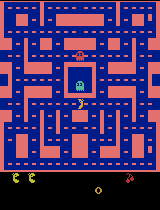

  Episode 6376/20000 | 5,062,500 decisions | 1,265,376 updates | 294.3 min
  Episode 6376/20000 | 5,063,000 decisions | 1,265,501 updates | 294.3 min
Episode 6376/20000 | score 1390 | recent mean 2148.8 | exploration 15%
  Episode 6377/20000 | 5,063,500 decisions | 1,265,626 updates | 294.3 min
  Episode 6377/20000 | 5,064,000 decisions | 1,265,751 updates | 294.4 min
Episode 6377/20000 | score 3440 | recent mean 2165.6 | exploration 15%
  Episode 6378/20000 | 5,064,500 decisions | 1,265,876 updates | 294.4 min
  Episode 6378/20000 | 5,065,000 decisions | 1,266,001 updates | 294.4 min
Episode 6378/20000 | score 1830 | recent mean 2139.6 | exploration 15%
  Episode 6379/20000 | 5,065,500 decisions | 1,266,126 updates | 294.4 min
  Episode 6379/20000 | 5,066,000 decisions | 1,266,251 updates | 294.5 min
Episode 6379/20000 | score 2920 | recent mean 2160.8 | exploration 15%
  Episode 6380/20000 | 5,066,500 decisions | 1,266,376 updates | 294.5 min
  Episode 6380/20000 | 5,067,000 decision

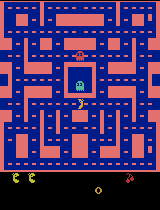

  Episode 6401/20000 | 5,086,500 decisions | 1,271,376 updates | 295.6 min
  Episode 6401/20000 | 5,087,000 decisions | 1,271,501 updates | 295.6 min
Episode 6401/20000 | score 2880 | recent mean 2082.4 | exploration 15%
  Episode 6402/20000 | 5,087,500 decisions | 1,271,626 updates | 295.6 min
  Episode 6402/20000 | 5,088,000 decisions | 1,271,751 updates | 295.7 min
Episode 6402/20000 | score 1610 | recent mean 2009.2 | exploration 15%
  Episode 6403/20000 | 5,088,500 decisions | 1,271,876 updates | 295.7 min
Episode 6403/20000 | score 2130 | recent mean 2021.2 | exploration 15%
  Episode 6404/20000 | 5,089,000 decisions | 1,272,001 updates | 295.7 min
  Episode 6404/20000 | 5,089,500 decisions | 1,272,126 updates | 295.7 min
Episode 6404/20000 | score 2570 | recent mean 2007.2 | exploration 15%
  Episode 6405/20000 | 5,090,000 decisions | 1,272,251 updates | 295.8 min
  Episode 6405/20000 | 5,090,500 decisions | 1,272,376 updates | 295.8 min
Episode 6405/20000 | score 1600 | recent 

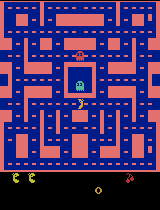

  Episode 6426/20000 | 5,110,000 decisions | 1,277,251 updates | 296.9 min
  Episode 6426/20000 | 5,110,500 decisions | 1,277,376 updates | 296.9 min
Episode 6426/20000 | score 3020 | recent mean 2142.4 | exploration 15%
  Episode 6427/20000 | 5,111,000 decisions | 1,277,501 updates | 296.9 min
  Episode 6427/20000 | 5,111,500 decisions | 1,277,626 updates | 297.0 min
  Episode 6427/20000 | 5,112,000 decisions | 1,277,751 updates | 297.0 min
Episode 6427/20000 | score 2520 | recent mean 2178.8 | exploration 15%
  Episode 6428/20000 | 5,112,500 decisions | 1,277,876 updates | 297.0 min
Episode 6428/20000 | score 1230 | recent mean 2142.8 | exploration 15%
  Episode 6429/20000 | 5,113,000 decisions | 1,278,001 updates | 297.0 min
Episode 6429/20000 | score 1060 | recent mean 2082.4 | exploration 15%
  Episode 6430/20000 | 5,113,500 decisions | 1,278,126 updates | 297.1 min
  Episode 6430/20000 | 5,114,000 decisions | 1,278,251 updates | 297.1 min
Episode 6430/20000 | score 1580 | recent 

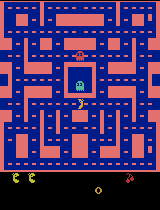

  Episode 6451/20000 | 5,134,000 decisions | 1,283,251 updates | 298.2 min
Episode 6451/20000 | score 2420 | recent mean 1996.0 | exploration 15%
  Episode 6452/20000 | 5,134,500 decisions | 1,283,376 updates | 298.2 min
  Episode 6452/20000 | 5,135,000 decisions | 1,283,501 updates | 298.2 min
  Episode 6452/20000 | 5,135,500 decisions | 1,283,626 updates | 298.3 min
Episode 6452/20000 | score 3360 | recent mean 2029.6 | exploration 15%
  Episode 6453/20000 | 5,136,000 decisions | 1,283,751 updates | 298.3 min
  Episode 6453/20000 | 5,136,500 decisions | 1,283,876 updates | 298.3 min
Episode 6453/20000 | score 5040 | recent mean 2182.0 | exploration 15%
  Episode 6454/20000 | 5,137,000 decisions | 1,284,001 updates | 298.3 min
  Episode 6454/20000 | 5,137,500 decisions | 1,284,126 updates | 298.4 min
Episode 6454/20000 | score 1410 | recent mean 2196.0 | exploration 15%
  Episode 6455/20000 | 5,138,000 decisions | 1,284,251 updates | 298.4 min
  Episode 6455/20000 | 5,138,500 decision

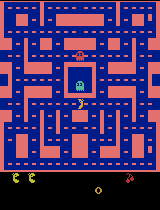

  Episode 6476/20000 | 5,158,000 decisions | 1,289,251 updates | 299.5 min
  Episode 6476/20000 | 5,158,500 decisions | 1,289,376 updates | 299.5 min
Episode 6476/20000 | score 2050 | recent mean 2247.6 | exploration 15%
  Episode 6477/20000 | 5,159,000 decisions | 1,289,501 updates | 299.5 min
  Episode 6477/20000 | 5,159,500 decisions | 1,289,626 updates | 299.6 min
Episode 6477/20000 | score 1600 | recent mean 2177.2 | exploration 15%
  Episode 6478/20000 | 5,160,000 decisions | 1,289,751 updates | 299.6 min
  Episode 6478/20000 | 5,160,500 decisions | 1,289,876 updates | 299.6 min
Episode 6478/20000 | score 2540 | recent mean 2077.2 | exploration 15%
  Episode 6479/20000 | 5,161,000 decisions | 1,290,001 updates | 299.6 min
  Episode 6479/20000 | 5,161,500 decisions | 1,290,126 updates | 299.7 min
Episode 6479/20000 | score 1860 | recent mean 2095.2 | exploration 15%
  Episode 6480/20000 | 5,162,000 decisions | 1,290,251 updates | 299.7 min
Episode 6480/20000 | score 1710 | recent 

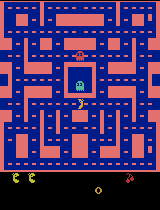

  Episode 6501/20000 | 5,179,500 decisions | 1,294,626 updates | 300.7 min
  Episode 6501/20000 | 5,180,000 decisions | 1,294,751 updates | 300.7 min
Episode 6501/20000 | score 830 | recent mean 1658.8 | exploration 15%
  Episode 6502/20000 | 5,180,500 decisions | 1,294,876 updates | 300.7 min
  Episode 6502/20000 | 5,181,000 decisions | 1,295,001 updates | 300.8 min
Episode 6502/20000 | score 1610 | recent mean 1659.2 | exploration 15%
  Episode 6503/20000 | 5,181,500 decisions | 1,295,126 updates | 300.8 min
Episode 6503/20000 | score 1040 | recent mean 1599.2 | exploration 15%
  Episode 6504/20000 | 5,182,000 decisions | 1,295,251 updates | 300.8 min
  Episode 6504/20000 | 5,182,500 decisions | 1,295,376 updates | 300.8 min
Episode 6504/20000 | score 1820 | recent mean 1597.6 | exploration 15%
  Episode 6505/20000 | 5,183,000 decisions | 1,295,501 updates | 300.9 min
  Episode 6505/20000 | 5,183,500 decisions | 1,295,626 updates | 300.9 min
Episode 6505/20000 | score 1660 | recent m

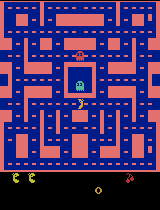

  Episode 6526/20000 | 5,203,000 decisions | 1,300,501 updates | 302.0 min
  Episode 6526/20000 | 5,203,500 decisions | 1,300,626 updates | 302.0 min
Episode 6526/20000 | score 1490 | recent mean 1832.8 | exploration 15%
  Episode 6527/20000 | 5,204,000 decisions | 1,300,751 updates | 302.0 min
  Episode 6527/20000 | 5,204,500 decisions | 1,300,876 updates | 302.1 min
Episode 6527/20000 | score 2340 | recent mean 1862.0 | exploration 15%
  Episode 6528/20000 | 5,205,000 decisions | 1,301,001 updates | 302.1 min
  Episode 6528/20000 | 5,205,500 decisions | 1,301,126 updates | 302.1 min
Episode 6528/20000 | score 2270 | recent mean 1911.2 | exploration 15%
  Episode 6529/20000 | 5,206,000 decisions | 1,301,251 updates | 302.1 min
  Episode 6529/20000 | 5,206,500 decisions | 1,301,376 updates | 302.2 min
Episode 6529/20000 | score 3290 | recent mean 1970.0 | exploration 15%
  Episode 6530/20000 | 5,207,000 decisions | 1,301,501 updates | 302.2 min
  Episode 6530/20000 | 5,207,500 decision

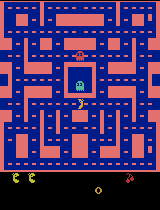

  Episode 6551/20000 | 5,226,500 decisions | 1,306,376 updates | 303.3 min
Episode 6551/20000 | score 1970 | recent mean 2022.4 | exploration 15%
  Episode 6552/20000 | 5,227,000 decisions | 1,306,501 updates | 303.3 min
  Episode 6552/20000 | 5,227,500 decisions | 1,306,626 updates | 303.3 min
Episode 6552/20000 | score 1380 | recent mean 1984.0 | exploration 15%
  Episode 6553/20000 | 5,228,000 decisions | 1,306,751 updates | 303.4 min
  Episode 6553/20000 | 5,228,500 decisions | 1,306,876 updates | 303.4 min
Episode 6553/20000 | score 1820 | recent mean 1966.0 | exploration 15%
  Episode 6554/20000 | 5,229,000 decisions | 1,307,001 updates | 303.4 min
  Episode 6554/20000 | 5,229,500 decisions | 1,307,126 updates | 303.4 min
  Episode 6554/20000 | 5,230,000 decisions | 1,307,251 updates | 303.5 min
Episode 6554/20000 | score 2630 | recent mean 1939.6 | exploration 15%
  Episode 6555/20000 | 5,230,500 decisions | 1,307,376 updates | 303.5 min
  Episode 6555/20000 | 5,231,000 decision

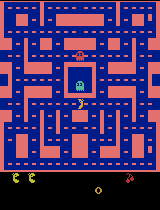

  Episode 6576/20000 | 5,251,500 decisions | 1,312,626 updates | 304.6 min
  Episode 6576/20000 | 5,252,000 decisions | 1,312,751 updates | 304.7 min
Episode 6576/20000 | score 2390 | recent mean 2156.4 | exploration 15%
  Episode 6577/20000 | 5,252,500 decisions | 1,312,876 updates | 304.7 min
  Episode 6577/20000 | 5,253,000 decisions | 1,313,001 updates | 304.7 min
Episode 6577/20000 | score 2820 | recent mean 2214.0 | exploration 15%
  Episode 6578/20000 | 5,253,500 decisions | 1,313,126 updates | 304.7 min
  Episode 6578/20000 | 5,254,000 decisions | 1,313,251 updates | 304.8 min
Episode 6578/20000 | score 2160 | recent mean 2227.6 | exploration 15%
  Episode 6579/20000 | 5,254,500 decisions | 1,313,376 updates | 304.8 min
  Episode 6579/20000 | 5,255,000 decisions | 1,313,501 updates | 304.8 min
Episode 6579/20000 | score 2580 | recent mean 2225.6 | exploration 15%
  Episode 6580/20000 | 5,255,500 decisions | 1,313,626 updates | 304.8 min
  Episode 6580/20000 | 5,256,000 decision

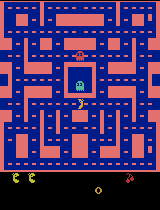

  Episode 6601/20000 | 5,274,500 decisions | 1,318,376 updates | 305.9 min
  Episode 6601/20000 | 5,275,000 decisions | 1,318,501 updates | 305.9 min
Episode 6601/20000 | score 2860 | recent mean 2052.8 | exploration 15%
  Episode 6602/20000 | 5,275,500 decisions | 1,318,626 updates | 305.9 min
  Episode 6602/20000 | 5,276,000 decisions | 1,318,751 updates | 306.0 min
Episode 6602/20000 | score 4920 | recent mean 2136.8 | exploration 15%
  Episode 6603/20000 | 5,276,500 decisions | 1,318,876 updates | 306.0 min
Episode 6603/20000 | score 510 | recent mean 2070.8 | exploration 15%
  Episode 6604/20000 | 5,277,000 decisions | 1,319,001 updates | 306.0 min
  Episode 6604/20000 | 5,277,500 decisions | 1,319,126 updates | 306.0 min
Episode 6604/20000 | score 2410 | recent mean 2064.0 | exploration 15%
  Episode 6605/20000 | 5,278,000 decisions | 1,319,251 updates | 306.1 min
  Episode 6605/20000 | 5,278,500 decisions | 1,319,376 updates | 306.1 min
Episode 6605/20000 | score 3050 | recent m

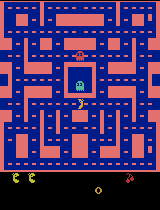

  Episode 6626/20000 | 5,296,500 decisions | 1,323,876 updates | 307.1 min
  Episode 6626/20000 | 5,297,000 decisions | 1,324,001 updates | 307.1 min
  Episode 6626/20000 | 5,297,500 decisions | 1,324,126 updates | 307.2 min
Episode 6626/20000 | score 2430 | recent mean 1894.0 | exploration 15%
  Episode 6627/20000 | 5,298,000 decisions | 1,324,251 updates | 307.2 min
  Episode 6627/20000 | 5,298,500 decisions | 1,324,376 updates | 307.2 min
Episode 6627/20000 | score 1860 | recent mean 1771.6 | exploration 15%
  Episode 6628/20000 | 5,299,000 decisions | 1,324,501 updates | 307.2 min
  Episode 6628/20000 | 5,299,500 decisions | 1,324,626 updates | 307.3 min
Episode 6628/20000 | score 1760 | recent mean 1821.6 | exploration 15%
  Episode 6629/20000 | 5,300,000 decisions | 1,324,751 updates | 307.3 min
  Episode 6629/20000 | 5,300,500 decisions | 1,324,876 updates | 307.3 min
Episode 6629/20000 | score 1610 | recent mean 1789.6 | exploration 15%
  Episode 6630/20000 | 5,301,000 decision

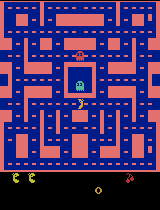

  Episode 6651/20000 | 5,320,500 decisions | 1,329,876 updates | 308.4 min
Episode 6651/20000 | score 2980 | recent mean 1906.4 | exploration 15%
  Episode 6652/20000 | 5,321,000 decisions | 1,330,001 updates | 308.4 min
  Episode 6652/20000 | 5,321,500 decisions | 1,330,126 updates | 308.5 min
  Episode 6652/20000 | 5,322,000 decisions | 1,330,251 updates | 308.5 min
Episode 6652/20000 | score 2040 | recent mean 1913.6 | exploration 15%
  Episode 6653/20000 | 5,322,500 decisions | 1,330,376 updates | 308.5 min
Episode 6653/20000 | score 1430 | recent mean 1900.4 | exploration 15%
  Episode 6654/20000 | 5,323,000 decisions | 1,330,501 updates | 308.5 min
  Episode 6654/20000 | 5,323,500 decisions | 1,330,626 updates | 308.6 min
Episode 6654/20000 | score 1730 | recent mean 1905.2 | exploration 15%
  Episode 6655/20000 | 5,324,000 decisions | 1,330,751 updates | 308.6 min
Episode 6655/20000 | score 1280 | recent mean 1868.8 | exploration 15%
  Episode 6656/20000 | 5,324,500 decisions | 

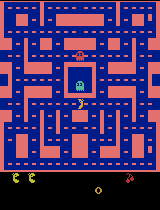

  Episode 6676/20000 | 5,341,500 decisions | 1,335,126 updates | 309.6 min
  Episode 6676/20000 | 5,342,000 decisions | 1,335,251 updates | 309.6 min
Episode 6676/20000 | score 1470 | recent mean 1855.6 | exploration 15%
  Episode 6677/20000 | 5,342,500 decisions | 1,335,376 updates | 309.6 min
  Episode 6677/20000 | 5,343,000 decisions | 1,335,501 updates | 309.7 min
Episode 6677/20000 | score 2090 | recent mean 1857.6 | exploration 15%
  Episode 6678/20000 | 5,343,500 decisions | 1,335,626 updates | 309.7 min
  Episode 6678/20000 | 5,344,000 decisions | 1,335,751 updates | 309.7 min
Episode 6678/20000 | score 2310 | recent mean 1892.8 | exploration 15%
  Episode 6679/20000 | 5,344,500 decisions | 1,335,876 updates | 309.7 min
  Episode 6679/20000 | 5,345,000 decisions | 1,336,001 updates | 309.8 min
  Episode 6679/20000 | 5,345,500 decisions | 1,336,126 updates | 309.8 min
Episode 6679/20000 | score 1780 | recent mean 1894.8 | exploration 15%
  Episode 6680/20000 | 5,346,000 decision

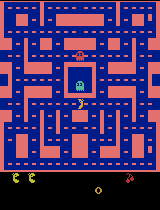

  Episode 6701/20000 | 5,363,500 decisions | 1,340,626 updates | 310.8 min
  Episode 6701/20000 | 5,364,000 decisions | 1,340,751 updates | 310.8 min
Episode 6701/20000 | score 1490 | recent mean 1822.4 | exploration 15%
  Episode 6702/20000 | 5,364,500 decisions | 1,340,876 updates | 310.8 min
  Episode 6702/20000 | 5,365,000 decisions | 1,341,001 updates | 310.9 min
Episode 6702/20000 | score 2080 | recent mean 1822.0 | exploration 15%
  Episode 6703/20000 | 5,365,500 decisions | 1,341,126 updates | 310.9 min
  Episode 6703/20000 | 5,366,000 decisions | 1,341,251 updates | 310.9 min
Episode 6703/20000 | score 1680 | recent mean 1796.8 | exploration 15%
  Episode 6704/20000 | 5,366,500 decisions | 1,341,376 updates | 311.0 min
  Episode 6704/20000 | 5,367,000 decisions | 1,341,501 updates | 311.0 min
Episode 6704/20000 | score 1870 | recent mean 1800.4 | exploration 15%
  Episode 6705/20000 | 5,367,500 decisions | 1,341,626 updates | 311.0 min
Episode 6705/20000 | score 1540 | recent 

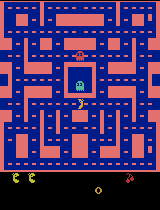

  Episode 6726/20000 | 5,385,500 decisions | 1,346,126 updates | 312.0 min
Episode 6726/20000 | score 950 | recent mean 1848.4 | exploration 15%
  Episode 6727/20000 | 5,386,000 decisions | 1,346,251 updates | 312.1 min
  Episode 6727/20000 | 5,386,500 decisions | 1,346,376 updates | 312.1 min
Episode 6727/20000 | score 2420 | recent mean 1862.0 | exploration 15%
  Episode 6728/20000 | 5,387,000 decisions | 1,346,501 updates | 312.1 min
  Episode 6728/20000 | 5,387,500 decisions | 1,346,626 updates | 312.1 min
Episode 6728/20000 | score 1820 | recent mean 1867.6 | exploration 15%
  Episode 6729/20000 | 5,388,000 decisions | 1,346,751 updates | 312.2 min
Episode 6729/20000 | score 1080 | recent mean 1836.0 | exploration 15%
  Episode 6730/20000 | 5,388,500 decisions | 1,346,876 updates | 312.2 min
  Episode 6730/20000 | 5,389,000 decisions | 1,347,001 updates | 312.2 min
Episode 6730/20000 | score 1500 | recent mean 1834.4 | exploration 15%
  Episode 6731/20000 | 5,389,500 decisions | 1

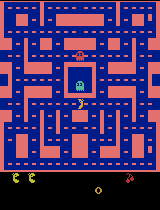

  Episode 6751/20000 | 5,407,500 decisions | 1,351,626 updates | 313.4 min
  Episode 6751/20000 | 5,408,000 decisions | 1,351,751 updates | 313.4 min
Episode 6751/20000 | score 1620 | recent mean 1972.8 | exploration 15%
  Episode 6752/20000 | 5,408,500 decisions | 1,351,876 updates | 313.4 min
  Episode 6752/20000 | 5,409,000 decisions | 1,352,001 updates | 313.4 min
Episode 6752/20000 | score 1930 | recent mean 1953.2 | exploration 15%
  Episode 6753/20000 | 5,409,500 decisions | 1,352,126 updates | 313.5 min
  Episode 6753/20000 | 5,410,000 decisions | 1,352,251 updates | 313.5 min
Episode 6753/20000 | score 2600 | recent mean 1984.4 | exploration 15%
  Episode 6754/20000 | 5,410,500 decisions | 1,352,376 updates | 313.5 min
  Episode 6754/20000 | 5,411,000 decisions | 1,352,501 updates | 313.6 min
Episode 6754/20000 | score 1670 | recent mean 2008.0 | exploration 15%
  Episode 6755/20000 | 5,411,500 decisions | 1,352,626 updates | 313.6 min
  Episode 6755/20000 | 5,412,000 decision

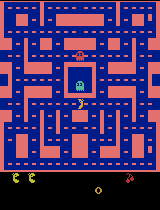

  Episode 6776/20000 | 5,431,500 decisions | 1,357,626 updates | 314.8 min
  Episode 6776/20000 | 5,432,000 decisions | 1,357,751 updates | 314.8 min
Episode 6776/20000 | score 2550 | recent mean 1966.0 | exploration 15%
  Episode 6777/20000 | 5,432,500 decisions | 1,357,876 updates | 314.8 min
  Episode 6777/20000 | 5,433,000 decisions | 1,358,001 updates | 314.8 min
Episode 6777/20000 | score 2240 | recent mean 1978.4 | exploration 15%
  Episode 6778/20000 | 5,433,500 decisions | 1,358,126 updates | 314.9 min
  Episode 6778/20000 | 5,434,000 decisions | 1,358,251 updates | 314.9 min
  Episode 6778/20000 | 5,434,500 decisions | 1,358,376 updates | 314.9 min
Episode 6778/20000 | score 1970 | recent mean 1953.2 | exploration 15%
  Episode 6779/20000 | 5,435,000 decisions | 1,358,501 updates | 315.0 min
  Episode 6779/20000 | 5,435,500 decisions | 1,358,626 updates | 315.0 min
Episode 6779/20000 | score 2060 | recent mean 1968.8 | exploration 15%
  Episode 6780/20000 | 5,436,000 decision

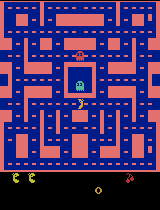

  Episode 6801/20000 | 5,454,000 decisions | 1,363,251 updates | 316.1 min
Episode 6801/20000 | score 1640 | recent mean 1848.8 | exploration 15%
  Episode 6802/20000 | 5,454,500 decisions | 1,363,376 updates | 316.1 min
  Episode 6802/20000 | 5,455,000 decisions | 1,363,501 updates | 316.1 min
Episode 6802/20000 | score 2090 | recent mean 1842.8 | exploration 15%
  Episode 6803/20000 | 5,455,500 decisions | 1,363,626 updates | 316.1 min
  Episode 6803/20000 | 5,456,000 decisions | 1,363,751 updates | 316.2 min
Episode 6803/20000 | score 2000 | recent mean 1844.0 | exploration 15%
  Episode 6804/20000 | 5,456,500 decisions | 1,363,876 updates | 316.2 min
  Episode 6804/20000 | 5,457,000 decisions | 1,364,001 updates | 316.2 min
Episode 6804/20000 | score 1650 | recent mean 1827.6 | exploration 15%
  Episode 6805/20000 | 5,457,500 decisions | 1,364,126 updates | 316.3 min
Episode 6805/20000 | score 1420 | recent mean 1826.4 | exploration 15%
  Episode 6806/20000 | 5,458,000 decisions | 

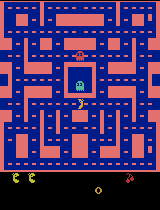

  Episode 6826/20000 | 5,477,500 decisions | 1,369,126 updates | 317.4 min
  Episode 6826/20000 | 5,478,000 decisions | 1,369,251 updates | 317.4 min
Episode 6826/20000 | score 2550 | recent mean 1960.8 | exploration 15%
  Episode 6827/20000 | 5,478,500 decisions | 1,369,376 updates | 317.5 min
  Episode 6827/20000 | 5,479,000 decisions | 1,369,501 updates | 317.5 min
Episode 6827/20000 | score 2820 | recent mean 1990.0 | exploration 15%
  Episode 6828/20000 | 5,479,500 decisions | 1,369,626 updates | 317.5 min
  Episode 6828/20000 | 5,480,000 decisions | 1,369,751 updates | 317.5 min
Episode 6828/20000 | score 2090 | recent mean 1993.6 | exploration 15%
  Episode 6829/20000 | 5,480,500 decisions | 1,369,876 updates | 317.6 min
  Episode 6829/20000 | 5,481,000 decisions | 1,370,001 updates | 317.6 min
Episode 6829/20000 | score 3040 | recent mean 2049.2 | exploration 15%
  Episode 6830/20000 | 5,481,500 decisions | 1,370,126 updates | 317.6 min
  Episode 6830/20000 | 5,482,000 decision

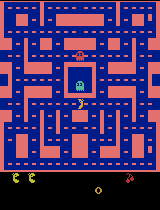

  Episode 6851/20000 | 5,500,500 decisions | 1,374,876 updates | 318.7 min
Episode 6851/20000 | score 850 | recent mean 2012.0 | exploration 15%
  Episode 6852/20000 | 5,501,000 decisions | 1,375,001 updates | 318.8 min
  Episode 6852/20000 | 5,501,500 decisions | 1,375,126 updates | 318.8 min
Episode 6852/20000 | score 2790 | recent mean 2010.8 | exploration 15%
  Episode 6853/20000 | 5,502,000 decisions | 1,375,251 updates | 318.8 min
  Episode 6853/20000 | 5,502,500 decisions | 1,375,376 updates | 318.8 min
Episode 6853/20000 | score 2420 | recent mean 2024.0 | exploration 15%
  Episode 6854/20000 | 5,503,000 decisions | 1,375,501 updates | 318.9 min
  Episode 6854/20000 | 5,503,500 decisions | 1,375,626 updates | 318.9 min
Episode 6854/20000 | score 2160 | recent mean 1988.8 | exploration 15%
  Episode 6855/20000 | 5,504,000 decisions | 1,375,751 updates | 318.9 min
  Episode 6855/20000 | 5,504,500 decisions | 1,375,876 updates | 318.9 min
Episode 6855/20000 | score 2050 | recent m

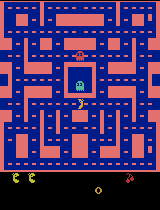

  Episode 6876/20000 | 5,523,500 decisions | 1,380,626 updates | 320.0 min
  Episode 6876/20000 | 5,524,000 decisions | 1,380,751 updates | 320.1 min
Episode 6876/20000 | score 2080 | recent mean 2249.2 | exploration 15%
  Episode 6877/20000 | 5,524,500 decisions | 1,380,876 updates | 320.1 min
  Episode 6877/20000 | 5,525,000 decisions | 1,381,001 updates | 320.1 min
Episode 6877/20000 | score 1890 | recent mean 2213.2 | exploration 15%
  Episode 6878/20000 | 5,525,500 decisions | 1,381,126 updates | 320.2 min
  Episode 6878/20000 | 5,526,000 decisions | 1,381,251 updates | 320.2 min
Episode 6878/20000 | score 2150 | recent mean 2202.4 | exploration 15%
Episode 6879/20000 | score 390 | recent mean 2131.6 | exploration 15%
  Episode 6880/20000 | 5,526,500 decisions | 1,381,376 updates | 320.2 min
  Episode 6880/20000 | 5,527,000 decisions | 1,381,501 updates | 320.2 min
  Episode 6880/20000 | 5,527,500 decisions | 1,381,626 updates | 320.3 min
Episode 6880/20000 | score 2560 | recent m

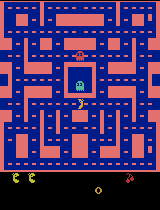

  Episode 6901/20000 | 5,545,500 decisions | 1,386,126 updates | 321.3 min
  Episode 6901/20000 | 5,546,000 decisions | 1,386,251 updates | 321.4 min
Episode 6901/20000 | score 2880 | recent mean 1928.0 | exploration 15%
  Episode 6902/20000 | 5,546,500 decisions | 1,386,376 updates | 321.4 min
  Episode 6902/20000 | 5,547,000 decisions | 1,386,501 updates | 321.4 min
Episode 6902/20000 | score 2000 | recent mean 1932.4 | exploration 15%
  Episode 6903/20000 | 5,547,500 decisions | 1,386,626 updates | 321.5 min
Episode 6903/20000 | score 1080 | recent mean 1889.6 | exploration 15%
  Episode 6904/20000 | 5,548,000 decisions | 1,386,751 updates | 321.5 min
  Episode 6904/20000 | 5,548,500 decisions | 1,386,876 updates | 321.5 min
Episode 6904/20000 | score 1100 | recent mean 1918.0 | exploration 15%
  Episode 6905/20000 | 5,549,000 decisions | 1,387,001 updates | 321.5 min
  Episode 6905/20000 | 5,549,500 decisions | 1,387,126 updates | 321.6 min
Episode 6905/20000 | score 2330 | recent 

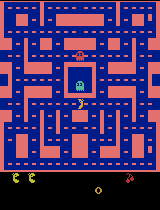

  Episode 6926/20000 | 5,568,000 decisions | 1,391,751 updates | 322.7 min
  Episode 6926/20000 | 5,568,500 decisions | 1,391,876 updates | 322.7 min
Episode 6926/20000 | score 1310 | recent mean 1966.0 | exploration 15%
  Episode 6927/20000 | 5,569,000 decisions | 1,392,001 updates | 322.7 min
  Episode 6927/20000 | 5,569,500 decisions | 1,392,126 updates | 322.7 min
Episode 6927/20000 | score 1900 | recent mean 1962.0 | exploration 15%
  Episode 6928/20000 | 5,570,000 decisions | 1,392,251 updates | 322.8 min
  Episode 6928/20000 | 5,570,500 decisions | 1,392,376 updates | 322.8 min
Episode 6928/20000 | score 2850 | recent mean 2032.8 | exploration 15%
  Episode 6929/20000 | 5,571,000 decisions | 1,392,501 updates | 322.8 min
Episode 6929/20000 | score 1780 | recent mean 2060.0 | exploration 15%
  Episode 6930/20000 | 5,571,500 decisions | 1,392,626 updates | 322.9 min
  Episode 6930/20000 | 5,572,000 decisions | 1,392,751 updates | 322.9 min
  Episode 6930/20000 | 5,572,500 decision

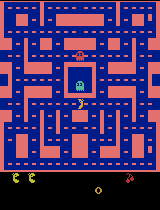

  Episode 6951/20000 | 5,591,000 decisions | 1,397,501 updates | 324.0 min
  Episode 6951/20000 | 5,591,500 decisions | 1,397,626 updates | 324.0 min
Episode 6951/20000 | score 1600 | recent mean 2054.8 | exploration 15%
  Episode 6952/20000 | 5,592,000 decisions | 1,397,751 updates | 324.0 min
  Episode 6952/20000 | 5,592,500 decisions | 1,397,876 updates | 324.0 min
Episode 6952/20000 | score 2070 | recent mean 2061.6 | exploration 15%
  Episode 6953/20000 | 5,593,000 decisions | 1,398,001 updates | 324.1 min
  Episode 6953/20000 | 5,593,500 decisions | 1,398,126 updates | 324.1 min
  Episode 6953/20000 | 5,594,000 decisions | 1,398,251 updates | 324.1 min
Episode 6953/20000 | score 3950 | recent mean 2105.6 | exploration 15%
  Episode 6954/20000 | 5,594,500 decisions | 1,398,376 updates | 324.2 min
Episode 6954/20000 | score 2980 | recent mean 2153.6 | exploration 15%
  Episode 6955/20000 | 5,595,000 decisions | 1,398,501 updates | 324.2 min
  Episode 6955/20000 | 5,595,500 decision

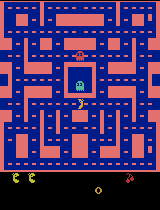

  Episode 6976/20000 | 5,614,500 decisions | 1,403,376 updates | 325.3 min
  Episode 6976/20000 | 5,615,000 decisions | 1,403,501 updates | 325.3 min
Episode 6976/20000 | score 2030 | recent mean 2150.8 | exploration 15%
  Episode 6977/20000 | 5,615,500 decisions | 1,403,626 updates | 325.3 min
  Episode 6977/20000 | 5,616,000 decisions | 1,403,751 updates | 325.4 min
Episode 6977/20000 | score 1950 | recent mean 2146.0 | exploration 15%
  Episode 6978/20000 | 5,616,500 decisions | 1,403,876 updates | 325.4 min
  Episode 6978/20000 | 5,617,000 decisions | 1,404,001 updates | 325.4 min
Episode 6978/20000 | score 3160 | recent mean 2114.4 | exploration 15%
  Episode 6979/20000 | 5,617,500 decisions | 1,404,126 updates | 325.5 min
  Episode 6979/20000 | 5,618,000 decisions | 1,404,251 updates | 325.5 min
Episode 6979/20000 | score 2010 | recent mean 2075.6 | exploration 15%
  Episode 6980/20000 | 5,618,500 decisions | 1,404,376 updates | 325.5 min
Episode 6980/20000 | score 710 | recent m

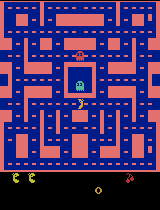

  Episode 7001/20000 | 5,637,500 decisions | 1,409,126 updates | 326.6 min
  Episode 7001/20000 | 5,638,000 decisions | 1,409,251 updates | 326.6 min
  Episode 7001/20000 | 5,638,500 decisions | 1,409,376 updates | 326.7 min
Episode 7001/20000 | score 3000 | recent mean 2031.2 | exploration 15%
  Episode 7002/20000 | 5,639,000 decisions | 1,409,501 updates | 326.7 min
  Episode 7002/20000 | 5,639,500 decisions | 1,409,626 updates | 326.7 min
Episode 7002/20000 | score 2510 | recent mean 2053.6 | exploration 15%
  Episode 7003/20000 | 5,640,000 decisions | 1,409,751 updates | 326.8 min
  Episode 7003/20000 | 5,640,500 decisions | 1,409,876 updates | 326.8 min
Episode 7003/20000 | score 3570 | recent mean 2070.0 | exploration 15%
  Episode 7004/20000 | 5,641,000 decisions | 1,410,001 updates | 326.8 min
  Episode 7004/20000 | 5,641,500 decisions | 1,410,126 updates | 326.8 min
Episode 7004/20000 | score 1810 | recent mean 2062.0 | exploration 15%
  Episode 7005/20000 | 5,642,000 decision

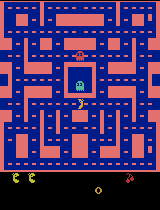

  Episode 7026/20000 | 5,662,000 decisions | 1,415,251 updates | 328.1 min
  Episode 7026/20000 | 5,662,500 decisions | 1,415,376 updates | 328.1 min
Episode 7026/20000 | score 3470 | recent mean 2160.0 | exploration 15%
  Episode 7027/20000 | 5,663,000 decisions | 1,415,501 updates | 328.1 min
  Episode 7027/20000 | 5,663,500 decisions | 1,415,626 updates | 328.2 min
Episode 7027/20000 | score 2070 | recent mean 2142.4 | exploration 15%
  Episode 7028/20000 | 5,664,000 decisions | 1,415,751 updates | 328.2 min
Episode 7028/20000 | score 860 | recent mean 2034.0 | exploration 15%
  Episode 7029/20000 | 5,664,500 decisions | 1,415,876 updates | 328.2 min
  Episode 7029/20000 | 5,665,000 decisions | 1,416,001 updates | 328.3 min
Episode 7029/20000 | score 1650 | recent mean 2027.6 | exploration 15%
  Episode 7030/20000 | 5,665,500 decisions | 1,416,126 updates | 328.3 min
  Episode 7030/20000 | 5,666,000 decisions | 1,416,251 updates | 328.3 min
Episode 7030/20000 | score 1430 | recent m

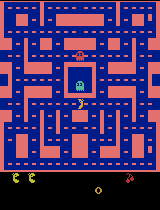

  Episode 7051/20000 | 5,684,500 decisions | 1,420,876 updates | 329.4 min
  Episode 7051/20000 | 5,685,000 decisions | 1,421,001 updates | 329.5 min
Episode 7051/20000 | score 1760 | recent mean 1819.6 | exploration 15%
  Episode 7052/20000 | 5,685,500 decisions | 1,421,126 updates | 329.5 min
  Episode 7052/20000 | 5,686,000 decisions | 1,421,251 updates | 329.5 min
Episode 7052/20000 | score 2230 | recent mean 1826.0 | exploration 15%
  Episode 7053/20000 | 5,686,500 decisions | 1,421,376 updates | 329.5 min
  Episode 7053/20000 | 5,687,000 decisions | 1,421,501 updates | 329.6 min
Episode 7053/20000 | score 1240 | recent mean 1841.2 | exploration 15%
  Episode 7054/20000 | 5,687,500 decisions | 1,421,626 updates | 329.6 min
  Episode 7054/20000 | 5,688,000 decisions | 1,421,751 updates | 329.6 min
Episode 7054/20000 | score 1850 | recent mean 1849.2 | exploration 15%
  Episode 7055/20000 | 5,688,500 decisions | 1,421,876 updates | 329.7 min
  Episode 7055/20000 | 5,689,000 decision

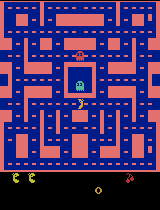

  Episode 7076/20000 | 5,706,000 decisions | 1,426,251 updates | 330.7 min
Episode 7076/20000 | score 700 | recent mean 1725.2 | exploration 15%
  Episode 7077/20000 | 5,706,500 decisions | 1,426,376 updates | 330.7 min
  Episode 7077/20000 | 5,707,000 decisions | 1,426,501 updates | 330.8 min
Episode 7077/20000 | score 3110 | recent mean 1760.4 | exploration 15%
  Episode 7078/20000 | 5,707,500 decisions | 1,426,626 updates | 330.8 min
  Episode 7078/20000 | 5,708,000 decisions | 1,426,751 updates | 330.8 min
Episode 7078/20000 | score 1980 | recent mean 1790.0 | exploration 15%
  Episode 7079/20000 | 5,708,500 decisions | 1,426,876 updates | 330.9 min
  Episode 7079/20000 | 5,709,000 decisions | 1,427,001 updates | 330.9 min
Episode 7079/20000 | score 1770 | recent mean 1786.8 | exploration 15%
  Episode 7080/20000 | 5,709,500 decisions | 1,427,126 updates | 330.9 min
  Episode 7080/20000 | 5,710,000 decisions | 1,427,251 updates | 330.9 min
Episode 7080/20000 | score 4460 | recent m

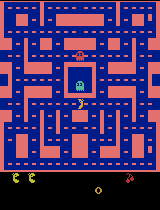

  Episode 7101/20000 | 5,729,500 decisions | 1,432,126 updates | 332.1 min
Episode 7101/20000 | score 1140 | recent mean 2272.8 | exploration 15%
  Episode 7102/20000 | 5,730,000 decisions | 1,432,251 updates | 332.1 min
  Episode 7102/20000 | 5,730,500 decisions | 1,432,376 updates | 332.1 min
Episode 7102/20000 | score 2370 | recent mean 2243.2 | exploration 15%
  Episode 7103/20000 | 5,731,000 decisions | 1,432,501 updates | 332.2 min
  Episode 7103/20000 | 5,731,500 decisions | 1,432,626 updates | 332.2 min
Episode 7103/20000 | score 1660 | recent mean 2230.4 | exploration 15%
  Episode 7104/20000 | 5,732,000 decisions | 1,432,751 updates | 332.2 min
  Episode 7104/20000 | 5,732,500 decisions | 1,432,876 updates | 332.2 min
Episode 7104/20000 | score 3190 | recent mean 2287.2 | exploration 15%
  Episode 7105/20000 | 5,733,000 decisions | 1,433,001 updates | 332.3 min
  Episode 7105/20000 | 5,733,500 decisions | 1,433,126 updates | 332.3 min
Episode 7105/20000 | score 1640 | recent 

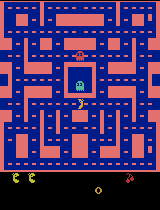

  Episode 7126/20000 | 5,753,000 decisions | 1,438,001 updates | 333.4 min
  Episode 7126/20000 | 5,753,500 decisions | 1,438,126 updates | 333.5 min
Episode 7126/20000 | score 2030 | recent mean 1902.8 | exploration 15%
  Episode 7127/20000 | 5,754,000 decisions | 1,438,251 updates | 333.5 min
Episode 7127/20000 | score 1310 | recent mean 1860.4 | exploration 15%
  Episode 7128/20000 | 5,754,500 decisions | 1,438,376 updates | 333.5 min
  Episode 7128/20000 | 5,755,000 decisions | 1,438,501 updates | 333.5 min
Episode 7128/20000 | score 2510 | recent mean 1894.4 | exploration 15%
  Episode 7129/20000 | 5,755,500 decisions | 1,438,626 updates | 333.6 min
  Episode 7129/20000 | 5,756,000 decisions | 1,438,751 updates | 333.6 min
  Episode 7129/20000 | 5,756,500 decisions | 1,438,876 updates | 333.6 min
Episode 7129/20000 | score 1560 | recent mean 1829.2 | exploration 15%
  Episode 7130/20000 | 5,757,000 decisions | 1,439,001 updates | 333.6 min
Episode 7130/20000 | score 670 | recent m

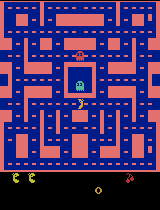

  Episode 7151/20000 | 5,776,000 decisions | 1,443,751 updates | 334.7 min
  Episode 7151/20000 | 5,776,500 decisions | 1,443,876 updates | 334.7 min
Episode 7151/20000 | score 2960 | recent mean 1782.0 | exploration 15%
  Episode 7152/20000 | 5,777,000 decisions | 1,444,001 updates | 334.8 min
  Episode 7152/20000 | 5,777,500 decisions | 1,444,126 updates | 334.8 min
Episode 7152/20000 | score 2300 | recent mean 1821.6 | exploration 15%
  Episode 7153/20000 | 5,778,000 decisions | 1,444,251 updates | 334.8 min
Episode 7153/20000 | score 900 | recent mean 1757.2 | exploration 15%
  Episode 7154/20000 | 5,778,500 decisions | 1,444,376 updates | 334.8 min
  Episode 7154/20000 | 5,779,000 decisions | 1,444,501 updates | 334.9 min
Episode 7154/20000 | score 2770 | recent mean 1805.6 | exploration 15%
  Episode 7155/20000 | 5,779,500 decisions | 1,444,626 updates | 334.9 min
  Episode 7155/20000 | 5,780,000 decisions | 1,444,751 updates | 334.9 min
  Episode 7155/20000 | 5,780,500 decisions

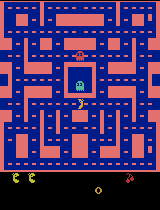

  Episode 7176/20000 | 5,800,000 decisions | 1,449,751 updates | 336.0 min
  Episode 7176/20000 | 5,800,500 decisions | 1,449,876 updates | 336.1 min
Episode 7176/20000 | score 2120 | recent mean 2148.8 | exploration 15%
  Episode 7177/20000 | 5,801,000 decisions | 1,450,001 updates | 336.1 min
  Episode 7177/20000 | 5,801,500 decisions | 1,450,126 updates | 336.1 min
Episode 7177/20000 | score 1680 | recent mean 2124.0 | exploration 15%
  Episode 7178/20000 | 5,802,000 decisions | 1,450,251 updates | 336.1 min
  Episode 7178/20000 | 5,802,500 decisions | 1,450,376 updates | 336.2 min
Episode 7178/20000 | score 1660 | recent mean 2154.4 | exploration 15%
  Episode 7179/20000 | 5,803,000 decisions | 1,450,501 updates | 336.2 min
Episode 7179/20000 | score 940 | recent mean 2081.2 | exploration 15%
  Episode 7180/20000 | 5,803,500 decisions | 1,450,626 updates | 336.2 min
  Episode 7180/20000 | 5,804,000 decisions | 1,450,751 updates | 336.3 min
Episode 7180/20000 | score 2560 | recent m

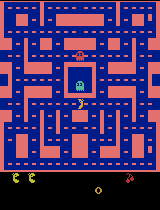

  Episode 7201/20000 | 5,823,000 decisions | 1,455,501 updates | 337.3 min
  Episode 7201/20000 | 5,823,500 decisions | 1,455,626 updates | 337.3 min
Episode 7201/20000 | score 2370 | recent mean 1998.8 | exploration 15%
  Episode 7202/20000 | 5,824,000 decisions | 1,455,751 updates | 337.4 min
  Episode 7202/20000 | 5,824,500 decisions | 1,455,876 updates | 337.4 min
Episode 7202/20000 | score 3130 | recent mean 2056.8 | exploration 15%
  Episode 7203/20000 | 5,825,000 decisions | 1,456,001 updates | 337.4 min
  Episode 7203/20000 | 5,825,500 decisions | 1,456,126 updates | 337.4 min
Episode 7203/20000 | score 2020 | recent mean 2071.2 | exploration 15%
  Episode 7204/20000 | 5,826,000 decisions | 1,456,251 updates | 337.5 min
  Episode 7204/20000 | 5,826,500 decisions | 1,456,376 updates | 337.5 min
Episode 7204/20000 | score 2000 | recent mean 2113.6 | exploration 15%
  Episode 7205/20000 | 5,827,000 decisions | 1,456,501 updates | 337.5 min
  Episode 7205/20000 | 5,827,500 decision

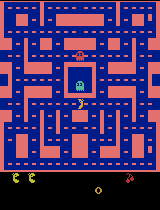

  Episode 7226/20000 | 5,846,500 decisions | 1,461,376 updates | 338.6 min
Episode 7226/20000 | score 620 | recent mean 1704.0 | exploration 15%
  Episode 7227/20000 | 5,847,000 decisions | 1,461,501 updates | 338.6 min
  Episode 7227/20000 | 5,847,500 decisions | 1,461,626 updates | 338.7 min
Episode 7227/20000 | score 3340 | recent mean 1712.4 | exploration 15%
  Episode 7228/20000 | 5,848,000 decisions | 1,461,751 updates | 338.7 min
Episode 7228/20000 | score 970 | recent mean 1670.4 | exploration 15%
  Episode 7229/20000 | 5,848,500 decisions | 1,461,876 updates | 338.7 min
  Episode 7229/20000 | 5,849,000 decisions | 1,462,001 updates | 338.7 min
Episode 7229/20000 | score 1210 | recent mean 1638.8 | exploration 15%
  Episode 7230/20000 | 5,849,500 decisions | 1,462,126 updates | 338.8 min
Episode 7230/20000 | score 1040 | recent mean 1576.0 | exploration 15%
  Episode 7231/20000 | 5,850,000 decisions | 1,462,251 updates | 338.8 min
  Episode 7231/20000 | 5,850,500 decisions | 1,

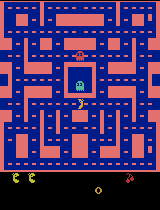

  Episode 7251/20000 | 5,870,500 decisions | 1,467,376 updates | 340.0 min
  Episode 7251/20000 | 5,871,000 decisions | 1,467,501 updates | 340.1 min
Episode 7251/20000 | score 2170 | recent mean 2086.4 | exploration 15%
  Episode 7252/20000 | 5,871,500 decisions | 1,467,626 updates | 340.1 min
  Episode 7252/20000 | 5,872,000 decisions | 1,467,751 updates | 340.1 min
Episode 7252/20000 | score 1850 | recent mean 2026.8 | exploration 15%
  Episode 7253/20000 | 5,872,500 decisions | 1,467,876 updates | 340.1 min
Episode 7253/20000 | score 1000 | recent mean 2028.0 | exploration 15%
  Episode 7254/20000 | 5,873,000 decisions | 1,468,001 updates | 340.2 min
  Episode 7254/20000 | 5,873,500 decisions | 1,468,126 updates | 340.2 min
Episode 7254/20000 | score 3320 | recent mean 2112.4 | exploration 15%
  Episode 7255/20000 | 5,874,000 decisions | 1,468,251 updates | 340.2 min
  Episode 7255/20000 | 5,874,500 decisions | 1,468,376 updates | 340.3 min
Episode 7255/20000 | score 1890 | recent 

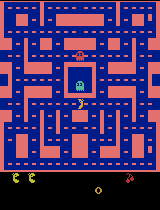

  Episode 7276/20000 | 5,892,500 decisions | 1,472,876 updates | 341.3 min
  Episode 7276/20000 | 5,893,000 decisions | 1,473,001 updates | 341.3 min
Episode 7276/20000 | score 1310 | recent mean 1956.4 | exploration 15%
  Episode 7277/20000 | 5,893,500 decisions | 1,473,126 updates | 341.3 min
  Episode 7277/20000 | 5,894,000 decisions | 1,473,251 updates | 341.3 min
Episode 7277/20000 | score 2250 | recent mean 1972.4 | exploration 15%
  Episode 7278/20000 | 5,894,500 decisions | 1,473,376 updates | 341.4 min
  Episode 7278/20000 | 5,895,000 decisions | 1,473,501 updates | 341.4 min
Episode 7278/20000 | score 2170 | recent mean 2019.2 | exploration 15%
  Episode 7279/20000 | 5,895,500 decisions | 1,473,626 updates | 341.4 min
Episode 7279/20000 | score 940 | recent mean 1924.0 | exploration 15%
  Episode 7280/20000 | 5,896,000 decisions | 1,473,751 updates | 341.5 min
  Episode 7280/20000 | 5,896,500 decisions | 1,473,876 updates | 341.5 min
Episode 7280/20000 | score 2370 | recent m

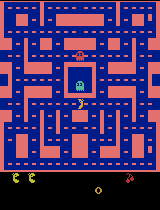

  Episode 7301/20000 | 5,916,500 decisions | 1,478,876 updates | 342.6 min
  Episode 7301/20000 | 5,917,000 decisions | 1,479,001 updates | 342.6 min
  Episode 7301/20000 | 5,917,500 decisions | 1,479,126 updates | 342.6 min
Episode 7301/20000 | score 1930 | recent mean 2168.0 | exploration 15%
  Episode 7302/20000 | 5,918,000 decisions | 1,479,251 updates | 342.7 min
Episode 7302/20000 | score 1590 | recent mean 2141.6 | exploration 15%
  Episode 7303/20000 | 5,918,500 decisions | 1,479,376 updates | 342.7 min
  Episode 7303/20000 | 5,919,000 decisions | 1,479,501 updates | 342.7 min
  Episode 7303/20000 | 5,919,500 decisions | 1,479,626 updates | 342.7 min
Episode 7303/20000 | score 1980 | recent mean 2134.0 | exploration 15%
  Episode 7304/20000 | 5,920,000 decisions | 1,479,751 updates | 342.8 min
  Episode 7304/20000 | 5,920,500 decisions | 1,479,876 updates | 342.8 min
  Episode 7304/20000 | 5,921,000 decisions | 1,480,001 updates | 342.8 min
Episode 7304/20000 | score 3400 | rec

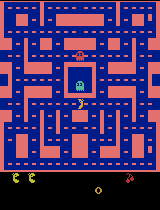

  Episode 7326/20000 | 5,939,000 decisions | 1,484,501 updates | 343.8 min
  Episode 7326/20000 | 5,939,500 decisions | 1,484,626 updates | 343.9 min
Episode 7326/20000 | score 1470 | recent mean 1768.0 | exploration 15%
  Episode 7327/20000 | 5,940,000 decisions | 1,484,751 updates | 343.9 min
  Episode 7327/20000 | 5,940,500 decisions | 1,484,876 updates | 343.9 min
Episode 7327/20000 | score 1130 | recent mean 1749.6 | exploration 15%
  Episode 7328/20000 | 5,941,000 decisions | 1,485,001 updates | 344.0 min
  Episode 7328/20000 | 5,941,500 decisions | 1,485,126 updates | 344.0 min
Episode 7328/20000 | score 2760 | recent mean 1780.8 | exploration 15%
  Episode 7329/20000 | 5,942,000 decisions | 1,485,251 updates | 344.0 min
  Episode 7329/20000 | 5,942,500 decisions | 1,485,376 updates | 344.1 min
Episode 7329/20000 | score 2010 | recent mean 1725.2 | exploration 15%
  Episode 7330/20000 | 5,943,000 decisions | 1,485,501 updates | 344.1 min
  Episode 7330/20000 | 5,943,500 decision

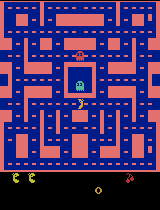

  Episode 7351/20000 | 5,961,500 decisions | 1,490,126 updates | 345.1 min
Episode 7351/20000 | score 1610 | recent mean 2013.6 | exploration 15%
  Episode 7352/20000 | 5,962,000 decisions | 1,490,251 updates | 345.2 min
  Episode 7352/20000 | 5,962,500 decisions | 1,490,376 updates | 345.2 min
Episode 7352/20000 | score 700 | recent mean 1996.4 | exploration 15%
  Episode 7353/20000 | 5,963,000 decisions | 1,490,501 updates | 345.2 min
  Episode 7353/20000 | 5,963,500 decisions | 1,490,626 updates | 345.2 min
Episode 7353/20000 | score 1890 | recent mean 1961.6 | exploration 15%
  Episode 7354/20000 | 5,964,000 decisions | 1,490,751 updates | 345.3 min
  Episode 7354/20000 | 5,964,500 decisions | 1,490,876 updates | 345.3 min
Episode 7354/20000 | score 1890 | recent mean 1956.8 | exploration 15%
  Episode 7355/20000 | 5,965,000 decisions | 1,491,001 updates | 345.3 min
Episode 7355/20000 | score 2090 | recent mean 1947.6 | exploration 15%
  Episode 7356/20000 | 5,965,500 decisions | 1

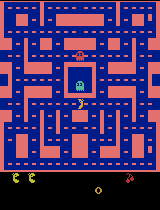

  Episode 7376/20000 | 5,984,500 decisions | 1,495,876 updates | 346.4 min
  Episode 7376/20000 | 5,985,000 decisions | 1,496,001 updates | 346.5 min
Episode 7376/20000 | score 2470 | recent mean 1936.0 | exploration 15%
  Episode 7377/20000 | 5,985,500 decisions | 1,496,126 updates | 346.5 min
Episode 7377/20000 | score 1420 | recent mean 1964.8 | exploration 15%
  Episode 7378/20000 | 5,986,000 decisions | 1,496,251 updates | 346.5 min
  Episode 7378/20000 | 5,986,500 decisions | 1,496,376 updates | 346.5 min
  Episode 7378/20000 | 5,987,000 decisions | 1,496,501 updates | 346.6 min
Episode 7378/20000 | score 2190 | recent mean 1976.8 | exploration 15%
  Episode 7379/20000 | 5,987,500 decisions | 1,496,626 updates | 346.6 min
  Episode 7379/20000 | 5,988,000 decisions | 1,496,751 updates | 346.6 min
Episode 7379/20000 | score 1960 | recent mean 1979.6 | exploration 15%
  Episode 7380/20000 | 5,988,500 decisions | 1,496,876 updates | 346.7 min
  Episode 7380/20000 | 5,989,000 decision

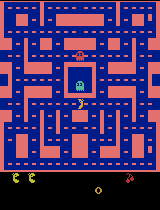

  Episode 7401/20000 | 6,007,000 decisions | 1,501,501 updates | 347.7 min
Episode 7401/20000 | score 1230 | recent mean 1760.8 | exploration 15%
  Episode 7402/20000 | 6,007,500 decisions | 1,501,626 updates | 347.7 min
  Episode 7402/20000 | 6,008,000 decisions | 1,501,751 updates | 347.8 min
Episode 7402/20000 | score 1780 | recent mean 1775.2 | exploration 15%
  Episode 7403/20000 | 6,008,500 decisions | 1,501,876 updates | 347.8 min
  Episode 7403/20000 | 6,009,000 decisions | 1,502,001 updates | 347.8 min
  Episode 7403/20000 | 6,009,500 decisions | 1,502,126 updates | 347.8 min
Episode 7403/20000 | score 2380 | recent mean 1782.8 | exploration 15%
  Episode 7404/20000 | 6,010,000 decisions | 1,502,251 updates | 347.9 min
  Episode 7404/20000 | 6,010,500 decisions | 1,502,376 updates | 347.9 min
Episode 7404/20000 | score 1880 | recent mean 1779.6 | exploration 15%
  Episode 7405/20000 | 6,011,000 decisions | 1,502,501 updates | 347.9 min
  Episode 7405/20000 | 6,011,500 decision

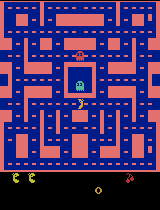

  Episode 7426/20000 | 6,031,500 decisions | 1,507,626 updates | 349.1 min
Episode 7426/20000 | score 560 | recent mean 1999.6 | exploration 15%
  Episode 7427/20000 | 6,032,000 decisions | 1,507,751 updates | 349.1 min
  Episode 7427/20000 | 6,032,500 decisions | 1,507,876 updates | 349.1 min
  Episode 7427/20000 | 6,033,000 decisions | 1,508,001 updates | 349.1 min
Episode 7427/20000 | score 2250 | recent mean 2018.4 | exploration 15%
  Episode 7428/20000 | 6,033,500 decisions | 1,508,126 updates | 349.2 min
Episode 7428/20000 | score 750 | recent mean 1953.2 | exploration 15%
  Episode 7429/20000 | 6,034,000 decisions | 1,508,251 updates | 349.2 min
  Episode 7429/20000 | 6,034,500 decisions | 1,508,376 updates | 349.2 min
Episode 7429/20000 | score 1750 | recent mean 1948.0 | exploration 15%
  Episode 7430/20000 | 6,035,000 decisions | 1,508,501 updates | 349.3 min
  Episode 7430/20000 | 6,035,500 decisions | 1,508,626 updates | 349.3 min
Episode 7430/20000 | score 1880 | recent me

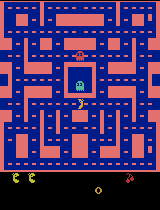

  Episode 7451/20000 | 6,055,000 decisions | 1,513,501 updates | 350.4 min
Episode 7451/20000 | score 2830 | recent mean 1890.8 | exploration 15%
  Episode 7452/20000 | 6,055,500 decisions | 1,513,626 updates | 350.4 min
  Episode 7452/20000 | 6,056,000 decisions | 1,513,751 updates | 350.4 min
Episode 7452/20000 | score 1490 | recent mean 1860.4 | exploration 15%
  Episode 7453/20000 | 6,056,500 decisions | 1,513,876 updates | 350.5 min
  Episode 7453/20000 | 6,057,000 decisions | 1,514,001 updates | 350.5 min
Episode 7453/20000 | score 3100 | recent mean 1954.4 | exploration 15%
  Episode 7454/20000 | 6,057,500 decisions | 1,514,126 updates | 350.5 min
  Episode 7454/20000 | 6,058,000 decisions | 1,514,251 updates | 350.6 min
Episode 7454/20000 | score 920 | recent mean 1921.2 | exploration 15%
  Episode 7455/20000 | 6,058,500 decisions | 1,514,376 updates | 350.6 min
  Episode 7455/20000 | 6,059,000 decisions | 1,514,501 updates | 350.6 min
Episode 7455/20000 | score 1820 | recent m

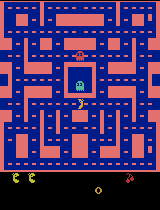

  Episode 7476/20000 | 6,078,000 decisions | 1,519,251 updates | 351.7 min
  Episode 7476/20000 | 6,078,500 decisions | 1,519,376 updates | 351.7 min
Episode 7476/20000 | score 1890 | recent mean 2027.2 | exploration 15%
  Episode 7477/20000 | 6,079,000 decisions | 1,519,501 updates | 351.8 min
  Episode 7477/20000 | 6,079,500 decisions | 1,519,626 updates | 351.8 min
Episode 7477/20000 | score 1890 | recent mean 2043.2 | exploration 15%
  Episode 7478/20000 | 6,080,000 decisions | 1,519,751 updates | 351.8 min
  Episode 7478/20000 | 6,080,500 decisions | 1,519,876 updates | 351.8 min
Episode 7478/20000 | score 1830 | recent mean 1992.4 | exploration 15%
  Episode 7479/20000 | 6,081,000 decisions | 1,520,001 updates | 351.9 min
  Episode 7479/20000 | 6,081,500 decisions | 1,520,126 updates | 351.9 min
Episode 7479/20000 | score 1790 | recent mean 2027.2 | exploration 15%
  Episode 7480/20000 | 6,082,000 decisions | 1,520,251 updates | 351.9 min
  Episode 7480/20000 | 6,082,500 decision

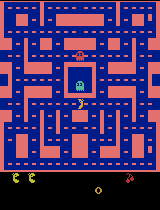

  Episode 7501/20000 | 6,102,500 decisions | 1,525,376 updates | 353.1 min
  Episode 7501/20000 | 6,103,000 decisions | 1,525,501 updates | 353.1 min
Episode 7501/20000 | score 1550 | recent mean 2000.4 | exploration 15%
  Episode 7502/20000 | 6,103,500 decisions | 1,525,626 updates | 353.1 min
Episode 7502/20000 | score 1340 | recent mean 1978.4 | exploration 15%
  Episode 7503/20000 | 6,104,000 decisions | 1,525,751 updates | 353.1 min
  Episode 7503/20000 | 6,104,500 decisions | 1,525,876 updates | 353.2 min
Episode 7503/20000 | score 3310 | recent mean 2037.6 | exploration 15%
  Episode 7504/20000 | 6,105,000 decisions | 1,526,001 updates | 353.2 min
  Episode 7504/20000 | 6,105,500 decisions | 1,526,126 updates | 353.2 min
Episode 7504/20000 | score 2600 | recent mean 2070.0 | exploration 15%
  Episode 7505/20000 | 6,106,000 decisions | 1,526,251 updates | 353.3 min
  Episode 7505/20000 | 6,106,500 decisions | 1,526,376 updates | 353.3 min
Episode 7505/20000 | score 2200 | recent 

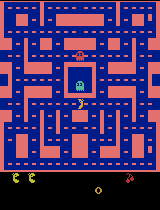

  Episode 7526/20000 | 6,127,000 decisions | 1,531,501 updates | 354.5 min
Episode 7526/20000 | score 2840 | recent mean 2212.8 | exploration 15%
  Episode 7527/20000 | 6,127,500 decisions | 1,531,626 updates | 354.5 min
  Episode 7527/20000 | 6,128,000 decisions | 1,531,751 updates | 354.5 min
  Episode 7527/20000 | 6,128,500 decisions | 1,531,876 updates | 354.5 min
Episode 7527/20000 | score 1570 | recent mean 2222.0 | exploration 15%
  Episode 7528/20000 | 6,129,000 decisions | 1,532,001 updates | 354.6 min
  Episode 7528/20000 | 6,129,500 decisions | 1,532,126 updates | 354.6 min
Episode 7528/20000 | score 2020 | recent mean 2170.4 | exploration 15%
  Episode 7529/20000 | 6,130,000 decisions | 1,532,251 updates | 354.6 min
  Episode 7529/20000 | 6,130,500 decisions | 1,532,376 updates | 354.7 min
Episode 7529/20000 | score 1780 | recent mean 2137.6 | exploration 15%
  Episode 7530/20000 | 6,131,000 decisions | 1,532,501 updates | 354.7 min
  Episode 7530/20000 | 6,131,500 decision

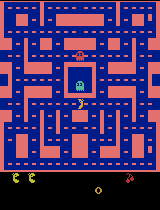

  Episode 7551/20000 | 6,150,000 decisions | 1,537,251 updates | 355.7 min
  Episode 7551/20000 | 6,150,500 decisions | 1,537,376 updates | 355.8 min
Episode 7551/20000 | score 1330 | recent mean 1874.8 | exploration 15%
  Episode 7552/20000 | 6,151,000 decisions | 1,537,501 updates | 355.8 min
Episode 7552/20000 | score 1880 | recent mean 1887.2 | exploration 15%
  Episode 7553/20000 | 6,151,500 decisions | 1,537,626 updates | 355.8 min
  Episode 7553/20000 | 6,152,000 decisions | 1,537,751 updates | 355.9 min
Episode 7553/20000 | score 2840 | recent mean 1920.0 | exploration 15%
  Episode 7554/20000 | 6,152,500 decisions | 1,537,876 updates | 355.9 min
Episode 7554/20000 | score 690 | recent mean 1876.4 | exploration 15%
  Episode 7555/20000 | 6,153,000 decisions | 1,538,001 updates | 355.9 min
  Episode 7555/20000 | 6,153,500 decisions | 1,538,126 updates | 355.9 min
  Episode 7555/20000 | 6,154,000 decisions | 1,538,251 updates | 356.0 min
Episode 7555/20000 | score 2830 | recent m

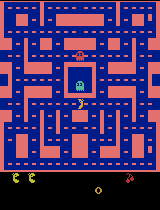

  Episode 7576/20000 | 6,174,500 decisions | 1,543,376 updates | 357.1 min
  Episode 7576/20000 | 6,175,000 decisions | 1,543,501 updates | 357.1 min
Episode 7576/20000 | score 1470 | recent mean 2028.4 | exploration 15%
  Episode 7577/20000 | 6,175,500 decisions | 1,543,626 updates | 357.2 min
  Episode 7577/20000 | 6,176,000 decisions | 1,543,751 updates | 357.2 min
Episode 7577/20000 | score 2380 | recent mean 2048.4 | exploration 15%
  Episode 7578/20000 | 6,176,500 decisions | 1,543,876 updates | 357.2 min
  Episode 7578/20000 | 6,177,000 decisions | 1,544,001 updates | 357.3 min
  Episode 7578/20000 | 6,177,500 decisions | 1,544,126 updates | 357.3 min
Episode 7578/20000 | score 2240 | recent mean 2024.4 | exploration 15%
  Episode 7579/20000 | 6,178,000 decisions | 1,544,251 updates | 357.3 min
  Episode 7579/20000 | 6,178,500 decisions | 1,544,376 updates | 357.3 min
Episode 7579/20000 | score 2190 | recent mean 2084.4 | exploration 15%
  Episode 7580/20000 | 6,179,000 decision

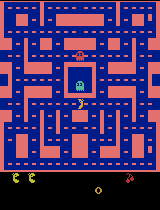

  Episode 7601/20000 | 6,198,500 decisions | 1,549,376 updates | 358.5 min
  Episode 7601/20000 | 6,199,000 decisions | 1,549,501 updates | 358.5 min
Episode 7601/20000 | score 1880 | recent mean 2036.4 | exploration 15%
  Episode 7602/20000 | 6,199,500 decisions | 1,549,626 updates | 358.5 min
  Episode 7602/20000 | 6,200,000 decisions | 1,549,751 updates | 358.6 min
Episode 7602/20000 | score 1020 | recent mean 1982.0 | exploration 15%
  Episode 7603/20000 | 6,200,500 decisions | 1,549,876 updates | 358.6 min
  Episode 7603/20000 | 6,201,000 decisions | 1,550,001 updates | 358.6 min
Episode 7603/20000 | score 3550 | recent mean 2034.4 | exploration 15%
  Episode 7604/20000 | 6,201,500 decisions | 1,550,126 updates | 358.6 min
  Episode 7604/20000 | 6,202,000 decisions | 1,550,251 updates | 358.7 min
Episode 7604/20000 | score 1870 | recent mean 2021.6 | exploration 15%
  Episode 7605/20000 | 6,202,500 decisions | 1,550,376 updates | 358.7 min
Episode 7605/20000 | score 2630 | recent 

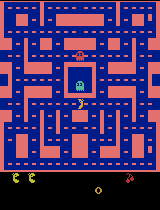

  Episode 7626/20000 | 6,222,000 decisions | 1,555,251 updates | 359.8 min
  Episode 7626/20000 | 6,222,500 decisions | 1,555,376 updates | 359.8 min
Episode 7626/20000 | score 2440 | recent mean 2161.6 | exploration 15%
  Episode 7627/20000 | 6,223,000 decisions | 1,555,501 updates | 359.9 min
  Episode 7627/20000 | 6,223,500 decisions | 1,555,626 updates | 359.9 min
Episode 7627/20000 | score 1560 | recent mean 2183.2 | exploration 15%
  Episode 7628/20000 | 6,224,000 decisions | 1,555,751 updates | 359.9 min
  Episode 7628/20000 | 6,224,500 decisions | 1,555,876 updates | 359.9 min
  Episode 7628/20000 | 6,225,000 decisions | 1,556,001 updates | 360.0 min
Episode 7628/20000 | score 2350 | recent mean 2135.2 | exploration 15%
Stopped early. Saving your agent; continue to section 6 for results.
Saved: pacman_runs/20260912_004744_000546


In [25]:
if _training_started:
    raise RuntimeError("Start a new experiment by rerunning from section 5a, or use Run All.")
_training_started = True
train_env = make_env()
started = time.monotonic()
status = "completed"
try:
    for episode in range(1, EPISODES + 1):
        row = train_one_episode(train_env, episode)
        history.append(row)
        completed_episodes = episode
        recent_mean = np.mean([game["score"] for game in history[-25:]])
        print(f"Episode {episode}/{EPISODES} | score {row['score']:.0f} | "
              f"recent mean {recent_mean:.1f} | exploration {row['exploration']:.0%}", flush=True)
        save_metrics(history, RUN_DIR / "training.csv")
        if episode % DEMO_EVERY == 0:
            save_progress_sample(episode)
except KeyboardInterrupt:
    status = "interrupted"
    print("Stopped early. Saving your agent; continue to section 6 for results.")
except Exception:
    status = "failed"
    raise
finally:
    train_env.close()
    save_training_result(status)
print("Saved:", RUN_DIR)
if updates == 0:
    print("No learning updates yet: this run ended before a training batch was ready.")

## 6. did it learn?

Compare all five games under the same settings. The highlighted GIF is the best of these five trained games;
it is an illustration, not the evidence by itself. Five games give a small comparison, not a reliable research estimate.

### 6a. play the saved agent

Reload the checkpoint and play the same five evaluation seeds. This tests both the saved file and the agent’s behavior.

In [26]:
# Load the saved model so the evaluation also verifies checkpoint playback.
checkpoint = torch.load(RUN_DIR / "trained.pt", map_location="cpu", weights_only=True)
trained_model = DQN(checkpoint["n_actions"]).to(DEVICE)
trained_model.load_state_dict(checkpoint["model"])
print("Evaluating the saved trained network on the same five games...", flush=True)
after = evaluate(trained_model, EVAL_SEEDS, RUN_DIR / "demos" / "final_best.gif", record_best=True)

Evaluating the saved trained network on the same five games...


### 6b. compare all five scores

Positive change means a higher average in this small test. A short run can get worse, and one good-looking sample is not enough to claim improvement.

  Game     Before      After
     1        350       2790
     2        500       2330
     3        320       2610
     4        800       3110
     5        490       2050
  Mean      492.0     2578.0
Change in mean score: +2086.0
Time-limited games before / after: 0 / 0


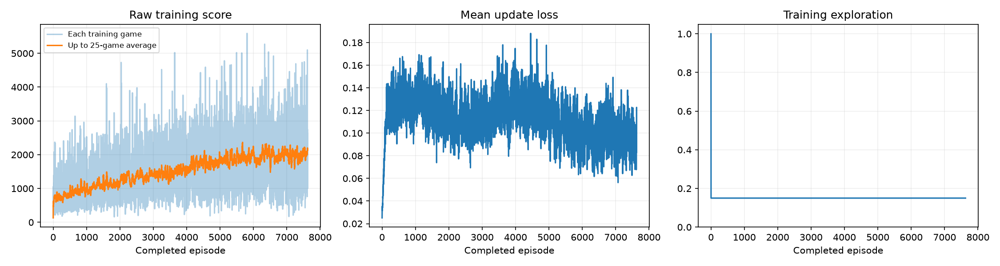

Final saved agent | 4× playback | 2 plays | first 20s of game time


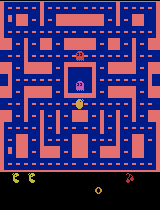

In [27]:
comparison = {"baseline_kind": "untrained network", "before": baseline, "after": after,
              "evaluation_exploration": EVAL_EXPLORATION, "max_decisions_per_game": MAX_STEPS}
(RUN_DIR / "comparison.json").write_text(json.dumps(comparison, indent=2))
print(f"{'Game':>6} {'Before':>10} {'After':>10}")
for game, (before_score, after_score) in enumerate(zip(baseline["scores"], after["scores"]), 1):
    print(f"{game:>6} {before_score:>10.0f} {after_score:>10.0f}")
print(f"{'Mean':>6} {baseline['mean']:>10.1f} {after['mean']:>10.1f}")
print(f"Change in mean score: {after['mean'] - baseline['mean']:+.1f}")
print("Time-limited games before / after:", sum(baseline["time_limited"]), "/", sum(after["time_limited"]))
display(Image(filename=str(RUN_DIR / "training_dashboard.png")))
show_sample(RUN_DIR / "demos" / "final_best.gif", "Final saved agent")

## 7. save and explain your experiment

The next cell creates a ZIP containing your settings, package versions, all evaluation scores, training log,
plot, GIFs, and playback checkpoints. In Colab, download it before ending the session.
To try another setting, change the three choices and run all cells again; that starts from scratch.

Keep the notebook, plot, selected GIFs, comparison, and your explanation in your GitHub submission.
Model checkpoints can make repositories large; keep them locally or attach them to a GitHub release.

In [28]:
archive = shutil.make_archive(str(RUN_DIR), "zip", root_dir=RUN_DIR)
try:
    from google.colab import files
except ImportError:
    display(FileLink(archive, result_html_prefix="Download your experiment: "))
else:
    files.download(archive)
print("Results folder:", RUN_DIR.resolve())

/Users/haniframadhan/Fundamentals of Agentic AI/pacman-dqn/pacman_runs/20260912_004744_000546.zip

Results folder: /Users/haniframadhan/Fundamentals of Agentic AI/pacman-dqn/pacman_runs/20260912_004744_000546


### your explanation

- **My choices:** exploration = __, episodes = __, learning rate = __.
- **My prediction:** I expected these settings to __ because __.
- **What happened:** mean score before = __; after = __. In the gameplay, I noticed __.
- **One limitation:** __.
- **My next experiment:** change only __ to __ and keep the other two settings fixed.

The agent observes four screens, chooses a joystick action, and receives game rewards.
Lower training loss does not necessarily mean a higher game score. Report lack of progress if that is what happened.

### implementation notes and sources

This is a small, readable DQN experiment, not a reproduction of a large Atari benchmark.
Replay is deliberately small for laptops. Epsilon stays constant after warm-up. Checkpoints support playback;
rerunning starts a new experiment, rather than resuming the optimizer, replay memory, or an interrupted game.
GPU results can vary even with fixed seeds.

- [ALE installation and Gymnasium registration](https://ale.farama.org/getting-started/)
- [Gymnasium Atari preprocessing](https://gymnasium.farama.org/api/wrappers/misc_wrappers/#gymnasium.wrappers.AtariPreprocessing)
- [Gymnasium frame stacking](https://gymnasium.farama.org/api/wrappers/observation_wrappers/#gymnasium.wrappers.FrameStackObservation)
- [DQN paper: Human-level control through deep reinforcement learning](https://storage.googleapis.com/deepmind-media/dqn/DQNNaturePaper.pdf)